
#    Working with Screen Capture 
###### and
#    Beautifying Text Results


# One Time Manual Posts

In [20]:
#ONE TIME MANUAL POSTS
#!/home/jack/anaconda2/python
import random
from random import randint
import time
import markovify
import os
import Key
import sys
sys.path.insert(1, "/home/jack/anaconda2/envs/py27/lib/python2.7/site-packages")
import twython
from twython import Twython
from PIL import Image, ImageChops, ImageDraw, ImageFont, ImageFilter
custom = "screencap/640_manual_20170914082852.png"
filename0=(custom)
def generate_the_word(infile):
        with open(infile) as f:
            contents_of_file = f.read()
        lines = contents_of_file.splitlines()
        line_number = random.randrange(0, len(lines))
        return lines[line_number]

def draw_text_with_halo(img, position, text, font, col, halo_col):
    halo = Image.new('RGBA', img.size, (0, 0, 0, 0))
    ImageDraw.Draw(halo).text(position, text, font = font, fill = halo_col)
    blurred_halo = halo.filter(ImageFilter.BLUR)
    ImageDraw.Draw(blurred_halo).text(position, text, font = font, fill = col)
    return Image.composite(img, blurred_halo, ImageChops.invert(blurred_halo))

if __name__ == '__main__':
    inp = Image.open(filename0)
    font = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 40)
    text_col = (255, 25,23,180) # bright green
    halo_col = (0, 0, 0)   # black
    textin = (generate_the_word("wordcloud.txt"))
    i2 = draw_text_with_halo(inp, (15, 8), textin, font, text_col, halo_col)
    
    #txt = Image.new('RGBA', i.size, (255,255,255,0))
    
    # get a font
    fnt = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 20)
    # get a drawing context
    width, height = inp.size
    marginx = 225
    marginy = 35
    x = width - marginx
    y = height - marginy
    signature_ = "" 
    #text_col2 = (150, 255, 150) # bright green
    #halo_col2 = (0, 0, 0)   # black
    text_col2 = (255, 255,230) # bright green
    halo_col2 = (0, 0, 0)   # black
    txt=draw_text_with_halo(i2,(x,y), signature_, fnt, text_col2, halo_col2)
    out = Image.alpha_composite(i2, txt)
    out.save("tmp/TM_POST.jpg")

#removed keys for privacy reasons
CONSUMER_KEY = Key.twiter()[0]
CONSUMER_SECRET = Key.twiter()[1]
ACCESS_KEY = Key.twiter()[2]
ACCESS_SECRET = Key.twiter()[3]

twitter = Twython(CONSUMER_KEY, CONSUMER_SECRET, ACCESS_KEY, ACCESS_SECRET)
#path = 'images/NewFolder'
f = open("art.txt")
text = f.read()
# Build the model.
text_model = markovify.Text(text)
# Print randomly-generated sentences of no more than 140 characters
#http://paulbourke.net/fractals/
#STR = (text_model.make_short_sentence(140))
STR = ("#Jupyter #Notebook Work Random pages posted #python #jupyternotebook #programming")
#PATH = "/home/jack/Desktop/deep-dream-generator/notebooks/STUFF/experiment/experiment8.jpg"
PATH = "tmp/TM_POST.jpg"
# 1 , 2, 3, 12, 5, 15, 8, 6
#photo = open('/home/jack/Desktop/deep-dream-generator/notebooks/images/'+file_list[rnd]+'.jpg','rb')

photo = open(PATH,'rb')
response = twitter.upload_media(media=photo)
twitter.update_status(status=STR, media_ids=[response['media_id']])


{u'contributors': None,
 u'coordinates': None,
 u'created_at': u'Thu Sep 14 01:39:06 +0000 2017',
 u'entities': {u'hashtags': [{u'indices': [0, 8], u'text': u'Jupyter'},
   {u'indices': [9, 18], u'text': u'Notebook'},
   {u'indices': [44, 51], u'text': u'python'},
   {u'indices': [52, 68], u'text': u'jupyternotebook'},
   {u'indices': [69, 81], u'text': u'programming'}],
  u'media': [{u'display_url': u'pic.twitter.com/0mHx8OoPEN',
    u'expanded_url': u'https://twitter.com/JackLNorthrup/status/908143034432233472/photo/1',
    u'id': 908143026760904704,
    u'id_str': u'908143026760904704',
    u'indices': [82, 105],
    u'media_url': u'http://pbs.twimg.com/media/DJpfRXNU8AA4fGC.jpg',
    u'media_url_https': u'https://pbs.twimg.com/media/DJpfRXNU8AA4fGC.jpg',
    u'sizes': {u'large': {u'h': 640, u'resize': u'fit', u'w': 640},
     u'medium': {u'h': 640, u'resize': u'fit', u'w': 640},
     u'small': {u'h': 640, u'resize': u'fit', u'w': 640},
     u'thumb': {u'h': 150, u'resize': u'crop',

In [21]:
!showme tmp/TM_POST.jpg

In [13]:
print STR

Sometimes we have visitors at night. If lucky we don't wake up.


# Means of Screen Capture

### Using GTK with a sys.argv[1] to name the output file

In [27]:
%%writefile cap.py
import gtk.gdk
import sys
# arg is passed on to filename
output = sys.argv[1]
def Cap(output):
    w = gtk.gdk.get_default_root_window()
    sz = w.get_size()
    pb = gtk.gdk.Pixbuf(gtk.gdk.COLORSPACE_RGB,False,8,sz[0],sz[1])
    pb = pb.get_from_drawable(w,w.get_colormap(),0,0,0,0,sz[0],sz[1])
    pb.save(output,"png")
if __name__ == "__main__":
    Cap(output)    


Overwriting cap.py


In [28]:
# USAGE: python cap.py path/filename.png
!python cap.py screencap/test.png


In [48]:
from PIL import Image
import GenIm
import time
imfile = Image.open("screencap/640_20170911121823.png")
#imout = time.strftime("screencap/640_%Y%m%d%H%M%S.png")
imout = "screencap/640.png"
GenIm.Signat(imfile, imout)

filename = time.strftime("screencap/%Y%m%d%H%M%S.png")
# Renames the temp.png to a time based filename Example:  20170911113012.png
os.rename("screencap/640.png", filename)

In [3]:
#%%writefile RandCap640.py
import os
import time
from random import randint
from PIL import Image
import GenIm
count = 0
#Saves 100 images 
total = 300
while count<total:
    # captures the window
    os.system("import -window root screencap/temp.png")
    #generates a filename based on time
    img = Image.open("screencap/temp.png")
    img2 = img.crop((200, 0, 968, 768))
    img2 = img2.resize((640,640), Image.NEAREST)
    img2.save('screencap/temp2.png')
    imfile = Image.open("screencap/temp2.png")
  
    imout = time.strftime("screencap/640_manual_%Y%m%d%H%M%S.png")
    #imout = 'screencap/temp640.png'
    GenIm.Signat(imfile, imout)
    print "Number : ",count+1,"of",total,"  FileName : ",imout
    # Adds a random timer
    nap = randint(10, 30)
    # Sleeps for the randomly chosen time
    time.sleep(nap)
    count = count +1

    

Number :  1 of 300   FileName :  screencap/640_manual_20170914082622.png
Number :  2 of 300   FileName :  screencap/640_manual_20170914082633.png
Number :  3 of 300   FileName :  screencap/640_manual_20170914082657.png
Number :  4 of 300   FileName :  screencap/640_manual_20170914082717.png
Number :  5 of 300   FileName :  screencap/640_manual_20170914082743.png
Number :  6 of 300   FileName :  screencap/640_manual_20170914082758.png
Number :  7 of 300   FileName :  screencap/640_manual_20170914082809.png
Number :  8 of 300   FileName :  screencap/640_manual_20170914082822.png
Number :  9 of 300   FileName :  screencap/640_manual_20170914082841.png
Number :  10 of 300   FileName :  screencap/640_manual_20170914082852.png
Number :  11 of 300   FileName :  screencap/640_manual_20170914082915.png
Number :  12 of 300   FileName :  screencap/640_manual_20170914082936.png


KeyboardInterrupt: 

In [ ]:
#%%writefile RandCap.py
import os
import time
from random import randint
from PIL import Image
count = 0
#Saves 100 images 
total = 100
while count<total:
    # captures the window
    os.system("import -window root screencap/temp.png")
    #generates a filename based on time
    filename = time.strftime("screencap/%Y%m%d%H%M%S.png")
    # Renames the temp.png to a time based filename Example:  20170911113012.png
    os.rename("screencap/temp.png", filename)
    print "Number : ",count+1,"of",total,"  FileName : ",filename
    # Adds a random timer
    nap = randint(60, 430)
    # Sleeps for the randomly chosen time
    time.sleep(nap)
    count = count +1

    

In [7]:
from PIL import Image, ImageChops
im = Image.open("screencap/20170911113012.png")
im.size

(1360, 768)

In [ ]:
# %load GenIm.py
from PIL import Image, ImageChops, ImageDraw, ImageFont, ImageFilter
import random
from random import randint
import time
import markovify
import os
import cv2
import sys
sys.path.insert(1, "/home/jack/anaconda2/envs/py27/lib/python2.7/site-packages")
import twython
from twython import Twython
import shutil
import numpy as np

def Verify_path(path):
    try:
        os.makedirs(path)
    except OSError as exception:
        if exception:
            pass
# creates a tmmpp/ directory for tracking and debug of image generation            
Verify_path('tmmpp/')

def Resize640(image, output):
    Bp=Image.open(image)
    width, height = Bp.size
    if width>height:
        w1=(width-height)/2
        w2 = width-w1
        h1=height-height
        h2=height
        Cc=Bp.crop((w1,h1,w2,h2))
        resizeIm = Cc.resize((640,640), Image.NEAREST)
        resizeIm.save(output)
    else:
        w1= width - width
        w2 = width
        h1 = (height-width)/2
        h2= height - h1
        Cc=Bp.crop((w1,h1,w2,h2))
        #Cc=Bp.crop((260,680,680,940))
        #Cc=Bp.crop((0,260,680,940))
        resizeIm = Cc.resize((640,640), Image.NEAREST)
        resizeIm.save(output)
        return resizeIm
        # USE example
        #image = "junk/wide.png"
        #output = "junk/wideTest4.png"
        #nim = genim.Resize640(image, output)    

def CustIm(color):
    imsize0 = (640,640)
    img0 = Image.new('RGBA', imsize0, color)
    img0.save('tmmpp/img0.png')
    return img0

    # generate and save Custom color/transparency image as: tmmpp/img0.png
    # GenIm.CustIm(color)
        
    
def GenIm0():
    imsize0 = (640,640)
    img0 = Image.new('RGBA', imsize0, (255, 0, 0, 0))
    img0.save('tmmpp/img0.png')
    return img0
# generate and save blank image as: tmmpp/img0.png
GenIm0()

def GenIm1():
    imsize1 = (640,640)
    img1 = Image.new('RGBA', imsize1, (0,255, 0, 0))
    img1.save('tmmpp/img1.png')
    return img1
# generate and save blank image as: tmmpp/img1.png
GenIm1()    


def BlendIms(img0a,img1a,alpha):
    op1 = Image.open(img0a).convert("RGBA")
    op2 = Image.open(img1a).convert("RGBA")
    resulta = ImageChops.blend(op1,op2,alpha)
    resulta.save('tmmpp/resulta.png')
    return resulta

def Brightness(fileN, output, alpha):
    alpha = float(alpha)
    im3 = Image.open(fileN)
    # multiply each pixel by < 1.0 (darker image)
    # multiply each pixel by > 1.0 (lighter image)
    # works best with .jpg and .png files
    # note that lambda is akin to a one-line function
    #im2 = im1.point(lambda p: p * 0.9)
    im4 = im3.point(lambda p: p * alpha)
    im4.save(output)
    return im4
    #Usage Example:
    #fileN = "junk/wideTest4.png"
    #output= "tmmpp/brightnessTest3.png"
    #alpha = 1.2
    #GenIm.brightness(fileN, output, alpha)
    #view = Image.open("tmmpp/brightnessTest3.png")
    #view
def wordcloud(inputF,outputF):
    title = "Python Stuff"
    signature_ = "Jack Northrup" 
    count = 1
    start = Image.open(inputF).convert('RGBA')
    start.save('tmmpp/textbacktmp.jpg')
    while count < 256 :
        base = Image.open('tmmpp/textbacktmp.jpg').convert('RGBA')

        #8 5 4 6 3 2
        # make a blank image for the text, initialized to transparent text color
        txt = Image.new('RGBA', base.size, (255,255,255,0))
        # get a font
        #generate a random size for the font
        int_n = int(count*.2)
        Fsize = randint(15,100-int_n)
        fnt = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", Fsize)
        # get a drawing context
        d = ImageDraw.Draw(txt)
        width, height = base.size
        


        def generate_the_word(infile):
            with open(infile) as f:
                contents_of_file = f.read()
            lines = contents_of_file.splitlines()
            line_number = random.randrange(0, len(lines))
            return lines[line_number]
        textin = (generate_the_word("wordcloud.txt"))

        # calculate the x,y coordinates of the text
        w, h = base.size
        Lw = randint(-150,w-50)
        Lh = randint(-50,h-30)
        #textin = "The TwitterBot Project" 
        #generate random color and opacity
        r = randint(0,256)
        g = randint(0,256)
        b = randint(0,256)
        a = randint(0,count)
        d.text((Lw,Lh), textin, font=fnt, fill=(r,g,b,a))

        out = Image.alpha_composite(base, txt)
        out.save("tmmpp/textbacktmp.jpg", "JPEG")
        count=count+1

    #base = Image.open('images/NewFolder/lightning01.jpg').convert('RGBA')
    #8 5 4 6 3 2
    # make a blank image for the text, initialized to transparent text color
    txt = Image.new('RGBA', out.size, (255,255,255,0))

    # get a font
    fnt = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 20)
    # get a drawing context
    d = ImageDraw.Draw(txt)

    width, height = out.size
    # calculate the x,y coordinates of the text
    #marginx = 325
    #marginy = 75
    marginx = 225
    marginy = 50
    x = width - marginx
    y = height - marginy

    d.text((x,y), signature_, font=fnt, fill=(0,0,0,256))

    out = Image.alpha_composite(out, txt)
    out.save("tmmpp/tmp.jpg", "JPEG")
    # save the image then reopen to put a title
    base = Image.open('tmmpp/tmp.jpg').convert('RGBA')
    #8 5 4 6 3 2
    # make a blank image for the text, initialized to transparent text color
    txt = Image.new('RGBA', base.size, (255,255,255,0))

    # get a font
    fnt = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 50)
    # get a drawing context
    d = ImageDraw.Draw(txt)

    width, height = base.size
    # calculate the x,y coordinates of the text
    #marginx = 325
    #marginy = 75
    x = 90
    y = 10
    d.text((x,y), title , font=fnt, fill=(0,0,0,250))
    out2 = Image.alpha_composite(base, txt)
    out2.save(outputF, "JPEG")
    out2.show()
    return out2
    #outputF = 'tmmpp/wordcloud_01.jpg'
    #inputF = 'tmmpp/brightnessTest3.png'
    #wordcloud(inputF,outputF)

n=5
def Swappalette(filename0, filename1, output):
    #input1='/home/jack/Desktop/imagebot/colorful/20170824124329.jpg'
    #input2='/home/jack/Desktop/imagebot/posted/'
    shutil.copy2(filename0, 'instagram/') # complete target filename given
    shutil.copy2(filename1, 'instagram/')# target filename is /dst/dir/file.ext

    aa = Image.open(filename0).convert("RGB")
    #bb = Image.open("/home/jack/Documents/GG.jpg").convert("RGB")
    bb = Image.open(filename1).convert("RGB")
    xx=aa.resize((640,640), Image.NEAREST)
    yy=bb.resize((640,640), Image.NEAREST)
    xx.save("junk/aa.png")
    yy.save("junk/bb.png")
    src = Image.open('junk/aa.png').convert('RGB')
    dst = Image.open('junk/bb.png').convert('RGB')
    src.save("junk/aa.png")
    dst.save("junk/bb.png")
    n = 5 #number of partitions per channel.
    src_handle = Image.open("junk/bb.png")
    dst_handle = Image.open("junk/aa.png")
    src = src_handle.load()
    dst = dst_handle.load()
    assert src_handle.size[0]*src_handle.size[1] == dst_handle.size[0]*dst_handle.size[1],"images must be same size"

    def makePixelList(img):
        l = []
        for x in range(img.size[0]):
            for y in range(img.size[1]):
                l.append((x,y))
        return l

    lsrc = makePixelList(src_handle)
    ldst = makePixelList(dst_handle)

    def sortAndDivide(coordlist,pixelimage,channel): #core
        global src,dst,n
        retlist = []
        #sort
        coordlist.sort(key=lambda t: pixelimage[t][channel])
        #divide
        partitionLength = int(len(coordlist)/n)
        if partitionLength <= 0:
            partitionLength = 1
        if channel < 2:
            for i in range(0,len(coordlist),partitionLength):
                retlist += sortAndDivide(coordlist[i:i+partitionLength],pixelimage,channel+1)
        else:
            retlist += coordlist
        return retlist
    print(src[lsrc[0]])
    lsrc = sortAndDivide(lsrc,src,0)
    ldst = sortAndDivide(ldst,dst,0)
    for i in range(len(ldst)):
        dst[ldst[i]] = src[lsrc[i]]


    filename = time.strftime(output)

    dst_handle.save(filename)

    shutil.copy2(filename, "instagram/")

    custom = "junk/PalletteTemp.png"
    filename0 = (custom)
    return filename0

    """
    import GenIm
    filename0 = 'tmmpp/640_iguana.jpg'   
    filename1 = 'images/Sranger-Tri-001-crop2b.jpg'

    output = "junk/PalletteTemp.png"    
    GenIm.Swappalette(filename0, filename1, output)    
    """    
def RanFile(path):
    base_image = random.choice([
        x for x in os.listdir(path)
        if os.path.isfile(os.path.join(path, x))
        ])
    ranfile=(path+base_image)
    return ranfile

def Draw_text_with_halo(img, position, text, font, col, halo_col):
    halo = Image.new('RGBA', img.size, (0, 0, 0, 0))
    #font = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 40)
    ImageDraw.Draw(halo).text(position, text, font = font, fill = halo_col)
    blurred_halo = halo.filter(ImageFilter.BLUR)
    ImageDraw.Draw(blurred_halo).text(position, text, font = font, fill = col)
    return Image.composite(img, blurred_halo, ImageChops.invert(blurred_halo))

def Draw_text_with_effects(img, (x,y), (xf,yf), text, font, col, halo_col):
    halo = Image.new('RGBA', img.size, (0, 0, 0, 0))
    font = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 40)
    ImageDraw.Draw(halo).text((x-xf,y+xf), text, font = font, fill = halo_col)
    blurred_halo = halo.filter(ImageFilter.BLUR)
    ImageDraw.Draw(blurred_halo).text((x,y), text, font = font, fill = col)
    return Image.composite(img, blurred_halo, ImageChops.invert(blurred_halo))
    '''
    Usage:
    import GenIm
    img = Image.open("tmmpp/imblend.png")
    x=200;y=200
    font = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 40)
    text = "Place Text in Image"
    col= (255,0,0)
    xf=10;yf=10
    halo_col = (255,255,255)
    GenIm.Draw_text_with_effects(img, (x,y), (xf,yf), text, font, col, halo_col)
    '''
def binarize_array(numpy_array, threshold=200):
    """Binarize a numpy array."""
    for i in range(len(numpy_array)):
        for j in range(len(numpy_array[0])):
            if numpy_array[i][j] > threshold:
                numpy_array[i][j] = 255
            else:
                numpy_array[i][j] = 0
    return numpy_array

def applybin(inputA, outputA):
    im = Image.open(inputA)
    im_grey = im.convert('LA') # convert to grayscale
    width,height = im.size

    total=0
    for i in range(0,width):
        for j in range(0,height):
            total += im_grey.getpixel((i,j))[0]

    mean = total / (width * height)
    image_file = Image.open(inputA)
    imagex = image_file.convert('L')  # convert image to monochrome
    imagey = np.array(imagex)
    binim = binarize_array(imagey, mean)
    cv2.imwrite(outputA, binim)
    return binim
    #import GenIm
    #inputA ="tmmpp/640_iguana.jpg"
    #outputA = "tmmpp/binim02.png"
    #binim = GenIm.applybin(inputA, outputA)
    
def bw(imgFile,outFile):
    #convert image to blackand white
    col = Image.open(imgFile)
    gry = col.convert('L')
    grarray = np.asarray(gry)
    bw = (grarray > grarray.mean())*255
    cv2.imwrite(outFile, bw)
    return bw
    #import GenIm
    #imgFile= 'tmmpp/Effects.png'
    #outFile= 'tmmpp/bw3.png'
    #GenIm.bw(imgFile,outFile)

def Generate_the_word(infile):
    with open(infile) as f:
        contents_of_file = f.read()
        lines = contents_of_file.splitlines()
        line_number = random.randrange(0, len(lines))
        return lines[line_number]

def alpha_to_color(image, color=(255, 255, 255)):
    """Set all fully transparent pixels of an RGBA image to the specified color.
    This is a very simple solution that might leave over some ugly edges, due
    to semi-transparent areas. You should use alpha_composite_with color instead.
    Source: http://stackoverflow.com/a/9166671/284318
    Keyword Arguments:
    image -- PIL RGBA Image object
    color -- Tuple r, g, b (default 255, 255, 255)
    """ 
    x = np.array(image)
    r, g, b, a = np.rollaxis(x, axis=-1)
    r[a == 0] = color[0]
    g[a == 0] = color[1]
    b[a == 0] = color[2] 
    x = np.dstack([r, g, b, a])
    return Image.fromarray(x, 'RGBA')


def alpha_composite(front, back, falpha):
    """Alpha composite two RGBA images.
    Source: http://stackoverflow.com/a/9166671/284318
    Keyword Arguments:
    front -- PIL RGBA Image object
    back -- PIL RGBA Image object
    """
    front = np.asarray(front)
    back = np.asarray(back)
    result = np.empty(front.shape, dtype='float')
    alpha = np.index_exp[:, :, 3:]
    rgb = np.index_exp[:, :, :3]
    falpha = front[alpha] / 255.0
    balpha = back[alpha] / 255.0
    result[alpha] = falpha + balpha * (1 - falpha)
    old_setting = np.seterr(invalid='ignore')
    result[rgb] = (front[rgb] * falpha + back[rgb] * balpha * (1 - falpha)) / result[alpha]
    np.seterr(**old_setting)
    result[alpha] *= 255
    np.clip(result, 0, 255)
    # astype('uint8') maps np.nan and np.inf to 0
    result = result.astype('uint8')
    result = Image.fromarray(result, 'RGBA')
    return result


def alpha_composite_with_color(image, color=(255, 255, 255)):
    """Alpha composite an RGBA image with a single color image of the
    specified color and the same size as the original image.
    Keyword Arguments:
    image -- PIL RGBA Image object
    color -- Tuple r, g, b (default 255, 255, 255)
    """
    back = Image.new('RGBA', size=image.size, color=color + (255,))
    return alpha_composite(image, back)


def pure_pil_alpha_to_color_v1(image, color=(255, 255, 255)):
    """Alpha composite an RGBA Image with a specified color.
    NOTE: This version is much slower than the
    alpha_composite_with_color solution. Use it only if
    numpy is not available.
    Source: http://stackoverflow.com/a/9168169/284318
    Keyword Arguments:
    image -- PIL RGBA Image object
    color -- Tuple r, g, b (default 255, 255, 255)
    """ 
    def blend_value(back, front, a):
        return (front * a + back * (255 - a)) / 255

    def blend_rgba(back, front):
        result = [blend_value(back[i], front[i], front[3]) for i in (0, 1, 2)]
        return tuple(result + [255])

    im = image.copy()  # don't edit the reference directly
    p = im.load()  # load pixel array
    for y in range(im.size[1]):
        for x in range(im.size[0]):
            p[x, y] = blend_rgba(color + (255,), p[x, y])

    return im

def pure_pil_alpha_to_color_v2(image, color=(255, 255, 255)):
    """Alpha composite an RGBA Image with a specified color.
    Simpler, faster version than the solutions above.
    Source: http://stackoverflow.com/a/9459208/284318
    Keyword Arguments:
    image -- PIL RGBA Image object
    color -- Tuple r, g, b (default 255, 255, 255)
    """
    image.load()  # needed for split()
    background = Image.new('RGB', image.size, color)
    background.paste(image, mask=image.split()[3])  # 3 is the alpha channel
    return background    
    
def Rndcolor():
    r = randint(50,255)
    g = randint(50,255)
    b = randint(50,255)
    rndcolor = (r,g,b) 
    return rndcolor

def Get_random_line(file_name):
    total_bytes = os.stat(file_name).st_size 
    random_point = random.randint(0, total_bytes)
    file = open(file_name)
    file.seek(random_point)
    file.readline() # skip this line to clear the partial line
    return file.readline()

def Adtext(inputIm,text):
    font = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 40)
    col = (255, 255,230) # bright green
    halo_col = (0, 0, 0)   # black
    Draw_text_with_halo(img, position, text, font, col, halo_col)
    # USE: img = GenIm.Adtext(inputIm,text)
    return text
    
def Signat(imfile,imout):
    fnt = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 25)
    width, height = imfile.size
    marginx = 325
    marginy = 35
    x = width - marginx
    y = height - marginy
    signature_ = "The TwitterBot Project" 
    text_col2 = (255, 255,230) # bright green
    halo_col2 = (0, 0, 0)   # black
    imfile = Draw_text_with_halo(imfile,(x,y), signature_ , fnt, text_col2, halo_col2) 
    imfile.save(imout)
    return imfile

def Centercut(img1, new_width, new_height):
    # def Centercut(path, img1, new_width, new_height):
    # img = Image.open(path+"/"+img1)
    img = Image.open(img1)
    w_var=new_width/2
    h_var=new_height/2
    half_the_width = img.size[0] / 2
    half_the_height = img.size[1] / 2
    img4 = img.crop(
        (
            half_the_width - w_var,
            half_the_height - h_var,
            half_the_width + w_var,
            half_the_height + h_var
        )
    )
    return img4

def SaveTempU(TempU):
    tempU = time.strftime("tmmpp/SaveTempU_%Y%m%d%H%M%S.png")
    TempU.save(tempu)
    return filepath

def SaveTemp(Temp):
    Tempname = time.strftime("tmmpp/SaveTemp.png")
    Temp.save(Tempname)
    return Tempname

def SaveName(savepath,imName):
    filename = time.strftime("SaveName_%Y%m%d%H%M%S.png")
    filepath = os.path.join(savepath,filename)
    imName.save(filepath)
    return filepath


In [16]:
from PIL import Image, ImageChops
import time
img = Image.open("screencap/20170911113012.png")
img2 = img.crop((200, 0, 968, 768))
filename = time.strftime("screencap/640_%Y%m%d%H%M%S.png")
img2.save(filename)

In [1]:
import matplotlib
import numpy as np
import mpld3
import matplotlib.pyplot as plt
from PIL import Image
from mpld3 import plugins
%matplotlib inline
fig, ax = plt.subplots()
im = np.array(Image.open('screencap/20170911113012.png'))
plt.imshow(im)
plugins.connect(fig, plugins.MousePosition(fontsize=14))

mpld3.display()

In [5]:
%%writefile mousecap.py
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.widgets as widgets

def onselect(eclick, erelease):
    if eclick.ydata>erelease.ydata:
        eclick.ydata,erelease.ydata=erelease.ydata,eclick.ydata
    if eclick.xdata>erelease.xdata:
        eclick.xdata,erelease.xdata=erelease.xdata,eclick.xdata
    ax.set_ylim(erelease.ydata,eclick.ydata)
    ax.set_xlim(eclick.xdata,erelease.xdata)
    fig.canvas.draw()

fig = plt.figure()
ax = fig.add_subplot(111)
filename="screencap/20170911113012.png"
im = Image.open(filename)
arr = np.asarray(im)
plt_image=plt.imshow(arr)
rs=widgets.RectangleSelector(
    ax, onselect, drawtype='box',
    rectprops = dict(facecolor='red', edgecolor = 'black', alpha=0.5, fill=True))
plt.show()

Writing mousecap.py


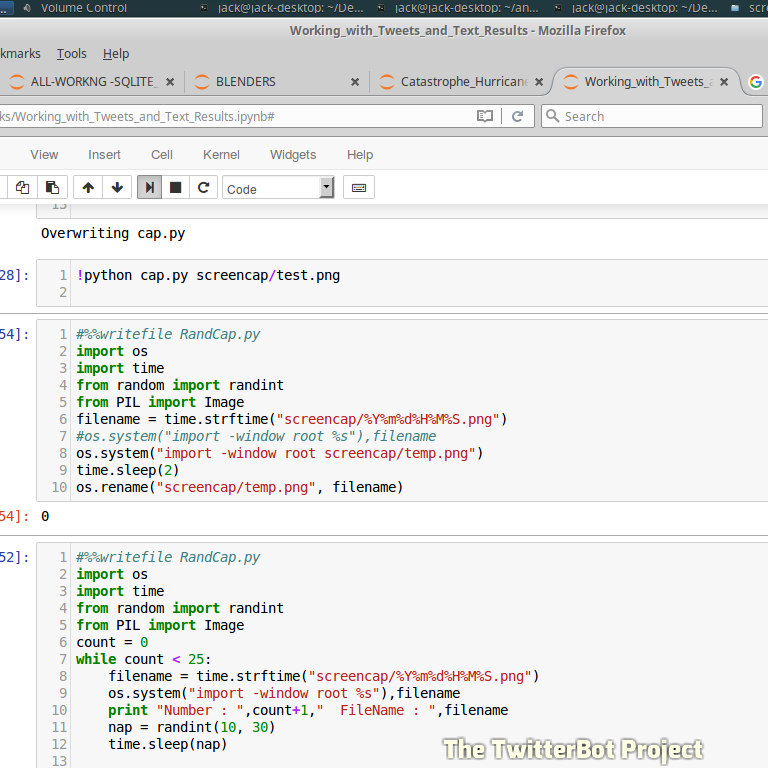

In [43]:
import GenIm
imfile = Image.open("screencap/640_20170911121823.png")
imout = "screencap/640.png"
GenIm.Signat(imfile, imout)

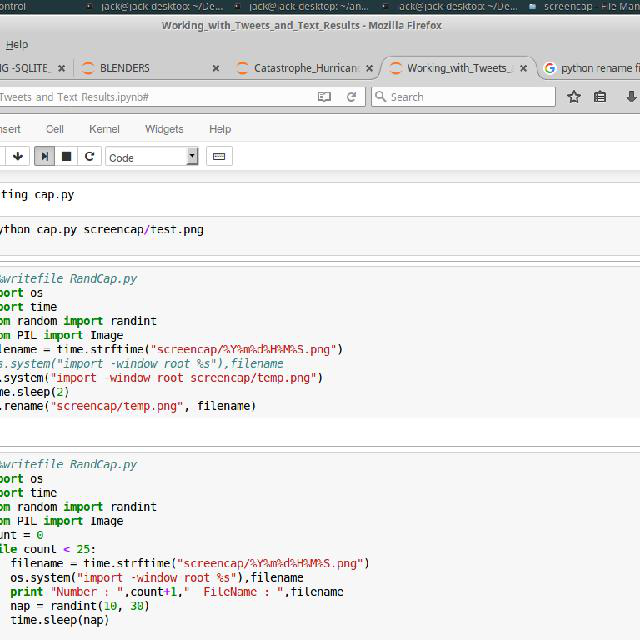

In [62]:
from PIL import Image
import GenIm

image = "screencap/20170911113012.png"
output = "screencap/Use01.jpg"
im = GenIm.Resize640(image, output)
im = Image.open("screencap/Use01.jpg")
Signat(imfile, imout)
im

In [47]:
%%writefile CAP.py
import os
import time
from PIL import Image
filename = time.strftime("screencap/%Y%m%d%H%M%S.png")
os.system("import -window root screencap/temp.png")
imCap = Image.open("screencap/temp.png")
filename = time.strftime("screencap/%Y%m%d%H%M%S.png")
imCap.save(filename)
print filename


Writing CAP.py


In [29]:
import gtk.gdk

w = gtk.gdk.get_default_root_window()
sz = w.get_size()
print "The size of the window is %d x %d" % sz
pb = gtk.gdk.Pixbuf(gtk.gdk.COLORSPACE_RGB,False,8,sz[0],sz[1])
pb = pb.get_from_drawable(w,w.get_colormap(),0,0,0,0,sz[0],sz[1])
if (pb != None):
    pb.save("screenshot.png","png")
    print "Screenshot saved to screenshot.png."
else:
    print "Unable to get the screenshot."

ImportError: No module named gtk.gdk

In [ ]:
 VALUES (?, ?)" a, b)
 (%s, %s,)", (a, b))

In [31]:
import os
os.system("import -window root screencap/temp.png")


0

In [3]:
!ls ~/anaconda2/lib/python2.7/site-packages/pyscreenshot

about.py   examples	 imcodec.py   __init__.pyc  plugins
about.pyc  idleutil.py	 imcodec.pyc  loader.py     procutil.py
check	   idleutil.pyc  __init__.py  loader.pyc    procutil.pyc


In [6]:
!ls ~/anaconda2/lib/python2.7/site-packages/pyscreenshot/plugins

gtkpixbuf.py	 __init__.pyc		pil.py		       qtgrabwindow.pyc
gtkpixbuf.pyc	 mac_quartz.py		pil.pyc		       scrot.py
imagemagick.py	 mac_quartz.pyc		pyside_grabwindow.py   scrot.pyc
imagemagick.pyc  mac_screencapture.py	pyside_grabwindow.pyc  wxscreen.py
__init__.py	 mac_screencapture.pyc	qtgrabwindow.py        wxscreen.pyc


In [116]:
!ls pyscreenshot/pyscreenshot

about.py   examples	 imcodec.py   __init__.pyc  plugins
about.pyc  idleutil.py	 imcodec.pyc  loader.py     procutil.py
check	   idleutil.pyc  __init__.py  loader.pyc    procutil.pyc


In [54]:
import random
from random import randint
import time
import markovify
import os
import sys
sys.path.insert(1, "/home/jack/anaconda2/envs/py27/lib/python2.7/site-packages")
import twython
import Key
from twython import Twython
from PIL import Image, ImageChops, ImageDraw, ImageFont, ImageFilter
def random_line(afile):
    line = next(afile)
    for num, aline in enumerate(afile):
        if random.randrange(num + 2): continue
        line = aline
    return line


# imported from Key.py
CONSUMER_KEY = Key.twiter()[0]
CONSUMER_SECRET = Key.twiter()[1]
ACCESS_KEY = Key.twiter()[2]
ACCESS_SECRET = Key.twiter()[3]

twitter = Twython(CONSUMER_KEY, CONSUMER_SECRET, ACCESS_KEY, ACCESS_SECRET)
photo = open('screencap/640_20170911132757.png', 'rb')
response = twitter.upload_media(media=photo)
afile = open("code.txt", 'r')
STR = random_line(afile)
twitter.update_status(status=STR, media_ids=[response['media_id']])


{u'contributors': None,
 u'coordinates': None,
 u'created_at': u'Mon Sep 11 13:36:20 +0000 2017',
 u'entities': {u'hashtags': [],
  u'media': [{u'display_url': u'pic.twitter.com/lA6QAc7z2u',
    u'expanded_url': u'https://twitter.com/JackLNorthrup/status/907236367008112641/photo/1',
    u'id': 907236359512788992,
    u'id_str': u'907236359512788992',
    u'indices': [59, 82],
    u'media_url': u'http://pbs.twimg.com/media/DJcmqYgUEAAkmGI.png',
    u'media_url_https': u'https://pbs.twimg.com/media/DJcmqYgUEAAkmGI.png',
    u'sizes': {u'large': {u'h': 768, u'resize': u'fit', u'w': 768},
     u'medium': {u'h': 768, u'resize': u'fit', u'w': 768},
     u'small': {u'h': 680, u'resize': u'fit', u'w': 680},
     u'thumb': {u'h': 150, u'resize': u'crop', u'w': 150}},
    u'type': u'photo',
    u'url': u'https://t.co/lA6QAc7z2u'}],
  u'symbols': [],
  u'urls': [],
  u'user_mentions': []},
 u'extended_entities': {u'media': [{u'display_url': u'pic.twitter.com/lA6QAc7z2u',
    u'expanded_url': u'ht

In [7]:
from PIL import Image, ImageFont
import GenIm

#img = Image.open('tmmpp/hurricane002masked.jpg')
position = (20,20)
text= "HURRICANE 2017"
font = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 40)
fs = font.getsize(text)
col = (255,255,255,200)
halo_col = (0,0,0)

print len(text.strip()),fs

14 (308, 40)


In [11]:
from PIL import Image, ImageFont
import GenIm

img = Image.open('tmmpp/HURRICANE_01.png')
position = (340,600)
text= "JackNorthrup_ImageBot"
font = ImageFont.truetype("/home/jack/.fonts/Exo-Black.ttf", 25)
col = (255,255,255,150)
halo_col = (0,0,0)
newim = GenIm.Draw_text_with_halo(img, position, text, font, col, halo_col)
newim.save("tmmpp/HURRICANE_02.png")
!showme tmmpp/HURRICANE_02.png

In [30]:
%%writefile code.txt
import random
import wx
import wx.lib.scrolledpanel as scrolled
class MyForm(wx.Frame) , 
def __init__(self) , 
wx.Frame.__init__(self ,  None ,  wx.ID_ANY ,   , Font Tutorial , )
# Add a panel so it looks the correct on all platforms
panel = scrolled.ScrolledPanel(self)
panel.SetAutoLayout(1) panel.SetupScrolling()
fontSizer = wx.BoxSizer(wx.VERTICAL)
families = { , FONTFAMILY_DECORATIVE , wx.FONTFAMILY_DECORATIVE ,  # A decorative font
 , FONTFAMILY_DEFAULT , wx.FONTFAMILY_DEFAULT , 
 , FONTFAMILY_MODERN , wx.FONTFAMILY_MODERN ,      # Usually a fixed pitch font
 , FONTFAMILY_ROMAN , wx.FONTFAMILY_ROMAN ,       # A formal ,  serif font
 , FONTFAMILY_SCRIPT , wx.FONTFAMILY_SCRIPT ,      # A handwriting font
 , FONTFAMILY_SWISS , wx.FONTFAMILY_SWISS ,       # A sans-serif font
 , FONTFAMILY_TELETYPE , wx.FONTFAMILY_TELETYPE    # A teletype font
 weights = { , FONTWEIGHT_BOLD , wx.FONTWEIGHT_BOLD , 
 , FONTWEIGHT_NORMAL , wx.FONTWEIGHT_NORMAL
styles = { , FONTSTYLE_ITALIC , wx.FONTSTYLE_ITALIC , 
 , FONTSTYLE_NORMAL , wx.FONTSTYLE_NORMAL , 
 , FONTSTYLE_SLANT , wx.FONTSTYLE_SLANT ,  sizes = [8 ,  10 ,  12 ,  14]
for family in families.keys() , 
for weight in weights.keys() , 
for style in styles.keys() , 
label =  , %s    %s    %s ,  % (family ,  weight ,  style)
size = random.choice(sizes)
font = wx.Font(size ,  families[family] ,  styles[style] ,  
weights[weight])  , txt = wx.StaticText(panel ,  label=label)
txt.SetFont(font) fontSizer.Add(txt ,  0 ,  wx.ALL ,  5)
panel.SetSizer(fontSizer)
sizer = wx.BoxSizer(wx.HORIZONTAL)
sizer.Add(panel ,  1 ,  wx.EXPAND)
self.SetSizer(sizer) Run the program
if __name__ ==  , __main__ , app = wx.App(False) frame = MyForm().Show()
app.MainLoop() # retrieve a line by the first word
def get_record(key ,  datafile) , '''return line of data file where first  , word ,  matches key'''
results = None with open(datafile) as data , 
for line in data , if key == line.split()[0] ,results = line
#break  return results datafile='data/twit.data' key = 'Trump' text = get_record(key ,  datafile)
print text twitter = Twitter() # username/password not required for these calls
friends = twitter.friends.ids(screen_name=USERNAME)
followers = twitter.followers.ids(screen_name=USERNAME)
guilty = [x for x in friends if x not in followers]
print  , There are %s tweeps you follow who do not follow you ,  % len(guilty)
for user_id in guilty , user = twitter.users.show(user_id=user_id)
print  , %s follows %s and has %s followers. ,  % \ user['name'] ,  user['friends_count'] ,  user['followers_count'] )
import gtk.gdk w = gtk.gdk.get_default_root_window()
sz = w.get_size() print 'The size of the window is %d x %d % sz
pb = gtk.gdk.Pixbuf(gtk.gdk.COLORSPACE_RGB , False , 8 , sz[0] , sz[1])
pb = pb.get_from_drawable(w , w.get_colormap() , 0 , 0 , 0 , 0 , sz[0] , sz[1])
if (pb != None) ,  pb.save('screenshot.png' , 'png')
print 'Screenshot saved to screenshot.png.'print 'Unable to get the screenshot.'
names.append(follower[ , name , ].encode( , utf-8 , )) usernames.append(follower[ , screen_name , ].encode( , utf-8 , ))
ids.append(follower[ , id , ]) locations.append(follower[ , location , ].encode( , utf-8 , ))
follower_count.append(follower[ , followers_count , ])
next_cursor = get_followers[ , next_cursor , ]
path = r , /home/jack/Desktop/deep-dream-generator/notebooks/new/1/ , 
#path = r , crawler4/ , base_image = random.choice([  x for x in os.listdir(path)
    if os.path.isfile(os.path.join(path ,  x))  ])
filename0=(path+base_image) #path0 = r , blend/ , 
path0 = r , newmask/ , base_image0 = random.choice([
x0 for x0 in os.listdir(path0) if os.path.isfile(os.path.join(path0 ,  x0))
]) filename00=(path0+base_image0) path1 = r , crawler4/ , 
base_image1 = random.choice([  x1 for x1 in os.listdir(path1)
if os.path.isfile(os.path.join(path1 ,  x1))])
mask0=(path1+base_image1) im1 = Image.open(filename0)
im1 = im1.resize((640 , 640) ,  Image.NEAREST) im1.save( , tmp/01.png , )
jpg_im1 = Image.open( , tmp/01.png , ) im02 = Image.open(filename00)
im2 = im02.resize((640 , 640) ,  Image.NEAREST)
im1.save( , tmp/02.png , ) jpg_im2 = Image.open( , tmp/02.png , ) 
im03 = Image.open(mask0) im04 = im03.resize((640 , 640) ,  Image.NEAREST)
#im04.save( , tmp/03.png , ) #jpg_im3 = Image.open( , tmp/03.png , )
#image_file = jpg_im3.convert( , RGBA , ) #im04 = image_file.convert('1')
datas = im04.getdata() newData = [] for item in datas , 
 if item[0] == 255 and item[1] == 255 and item[2] == 255 , 
newData.append((255 ,  255 ,  255 ,  0))  else , 
 newData.append(item) im04.putdata(newData) time.sleep(2)  
result1 = ImageChops.composite(jpg_im1 ,  jpg_im2 ,  im03)
#result1 = ImageChops.blend(jpg_im1 ,  jpg_im2 ,  .5)
filename = time.strftime( , crawler/%Y%m%d%H%M%S.png , )result1.save(filename)


Overwriting code.txt


In [32]:
import os
import random
import sys
import markovify


def random_line(afile):
    line = next(afile)
    for num, aline in enumerate(afile):
        if random.randrange(num + 2): continue
        line = aline
    return line


afile = open("code.txt", 'r')
STR = random_line(afile)
print STR

#im04.save( , tmp/03.png , ) #jpg_im3 = Image.open( , tmp/03.png , )



# Posting a Video

In [58]:
from PIL import Image, ImageChops, ImageDraw, ImageFont, ImageFilter
import random
from random import randint
import time
import markovify
import os
import sys
import Key
sys.path.insert(1, "/home/jack/anaconda2/envs/py27/lib/python2.7/site-packages")
import twython
from twython import Twython
def random_line(afile):
    line = next(afile)
    for num, aline in enumerate(afile):
        if random.randrange(num + 2): continue
        line = aline
    return line

#removed keys for privacy reasons
CONSUMER_KEY = Key.twiter()[0]
CONSUMER_SECRET = Key.twiter()[1]
ACCESS_KEY = Key.twiter()[2]
ACCESS_SECRET = Key.twiter()[3]

twitter = Twython(CONSUMER_KEY, CONSUMER_SECRET, ACCESS_KEY, ACCESS_SECRET)
afile = "code.txt"
STR = random_line(afile)

video = open('/path/to/file/video.mp4', 'rb')
response = twitter.upload_video(media=video, media_type='video/mp4')
twitter.update_status(status=STR, media_ids=[response['media_id']])


TypeError: str object is not an iterator

In [ ]:
import random
from random import randint
import time
import markovify
import os
import Key
import sys
sys.path.insert(1, "/home/jack/anaconda2/envs/py27/lib/python2.7/site-packages")
import twython
from twython import Twython
from PIL import Image, ImageChops, ImageDraw, ImageFont, ImageFilter
#removed keys for privacy reasons
CONSUMER_KEY = Key.twiter()[0]
CONSUMER_SECRET = Key.twiter()[1]
ACCESS_KEY = Key.twiter()[2]
ACCESS_SECRET = Key.twiter()[3]

twitter = Twython(CONSUMER_KEY, CONSUMER_SECRET, ACCESS_KEY, ACCESS_SECRET)

results = twitter.cursor(twitter.search, q='hurricane, florida')
print results

In [59]:
from twython import Twython, TwythonError
# Need to import csv now too!
import csv
import datetime
import Key

CONSUMER_KEY = Key.twiter()[0]
CONSUMER_SECRET = Key.twiter()[1]
ACCESS_KEY = Key.twiter()[2]
ACCESS_SECRET = Key.twiter()[3]

twitter = Twython(CONSUMER_KEY, CONSUMER_SECRET, ACCESS_KEY, ACCESS_SECRET)
# This time we want to make several lists!
names = []
usernames = []
ids = []
locations = []
follower_count = []

datestamp = datetime.datetime.now().strftime("%Y-%m-%d")

username = raw_input("Retrieve Follower list of: ")

next_cursor = -1

while(next_cursor):
    get_followers = twitter.get_followers_list(screen_name=username,count=200,cursor=next_cursor)
    for follower in get_followers["users"]:
# And add some more user details to its corresponding list
        names.append(follower["name"].encode("utf-8"))
        usernames.append(follower["screen_name"].encode("utf-8"))
        ids.append(follower["id"])
        locations.append(follower["location"].encode("utf-8"))
        follower_count.append(follower["followers_count"])
        next_cursor = get_followers["next_cursor"]

# Instead of creating a .txt we want to create a .csv!
open_csv = open(username+"-"+datestamp+".csv","wb")
# And write to it...
followers_csv = csv.writer(open_csv)

# Creating our top "title" row
names.insert(0,"@%s has %s followers (%s)" % (str(username),str(len(follower)),str(datestamp)))
usernames.insert(0,"")
ids.insert(0,"")
locations.insert(0,"")
follower_count.insert(0,"")

# Give each column its own title
names.insert(1,"Display Name")
usernames.insert(1,"Username (@)")
ids.insert(1,"User ID")
locations.insert(1,"Location")
follower_count.insert(1,"# of their Followers")

# Merge all our lists together so that they line up
rows = zip(names,usernames,ids,locations,follower_count)

# Write each row one-by-one to our spreadsheet
for row in rows:
    followers_csv.writerow(row)

# Save and close our csv spreadsheet
open_csv.close()



KeyboardInterrupt: 

In [ ]:
for result in results
    count=count+1
    if count>10:
        break
    print result


import twitter
api = twitter.Api()
api = twitter.Api(consumer_key='YazCRIfWX4VICiRCOiph08jDL',
                  consumer_secret='QOkLHou6NMwkghSHjMFXMdffQKJlDzttKtP6uBCcZ4VlQtvJyc',
                  access_token_key='296906916-AWggjhqpEWIS7EzXXhc2pOPBeCVJczpOm11cQGIf',
                  access_token_secret='zFrCiyaPt8gCBVVs1bLCmdCSyQQ3DKxT5wHJq2tOu2AMj')
users = api.GetFriends()
print([u.name for u in users])

import twitter
api = twitter.Api()
api = twitter.Api(consumer_key='YazCRIfWX4VICiRCOiph08jDL',
                  consumer_secret='QOkLHou6NMwkghSHjMFXMdffQKJlDzttKtP6uBCcZ4VlQtvJyc',
                  access_token_key='296906916-AWggjhqpEWIS7EzXXhc2pOPBeCVJczpOm11cQGIf',
                  access_token_secret='zFrCiyaPt8gCBVVs1bLCmdCSyQQ3DKxT5wHJq2tOu2AMj')
user = int(166329578)
statuses = api.GetUserTimeline(user)
print([s.text for s in statuses])

In [62]:
import twitter
import Key
api = twitter.Api()

api = twitter.Api(consumer_key=Key.twiter()[0],
                  consumer_secret=Key.twiter()[0],
                  access_token=Key.twiter()[0],
                  access_token_secret=Key.twiter()[0])
user = int(166329578)
statuses = api.GetUserTimeline(user)
print([s.text for s in statuses])

TypeError: __init__() got an unexpected keyword argument 'access_token'

# Get a user name from id number or vis versa

In [12]:
#Get a user name from id nymber or vis versa
import tweepy
import Key
consumer_key1 = Key.twiter()[0]
consumer_secret1 = Key.twiter()[1]
access_token1 = Key.twiter()[2]
access_token_secret1 = Key.twiter()[3]
twitter = Key.twiter()[4]

'''
consumer_key='YazCRIfWX4VICiRCOiph08jDL'
consumer_secret='QOkLHou6NMwkghSHjMFXMdffQKJlDzttKtP6uBCcZ4VlQtvJyc'
access_token ='296906916-AWggjhqpEWIS7EzXXhc2pOPBeCVJczpOm11cQGIf'
access_token_secret='zFrCiyaPt8gCBVVs1bLCmdCSyQQ3DKxT5wHJq2tOu2AMj'
'''
print consumer_key1,consumer_secret1,access_token1,access_token_secret1,"\n", twitter

IndexError: tuple index out of range

In [2]:
#Get a user name from id nymber or vis versa
import tweepy
import Key
consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]



auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)
user = api.get_user(166329578)                                                           
user.screen_name

#To get user id from user screen name
#user = api.get_user(screen_name = 'saimadhup')
#user.id

TweepError: [{u'message': u'Invalid or expired token.', u'code': 89}]

In [73]:
#Get a user name from id number or vis versa
import tweepy
import Key
consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)
#user = api.get_user(166329578)                                                           
#user.screen_name

#To get user id from user screen name
user = api.get_user(screen_name = 'MiamiDadeCounty')
user.id

25708791

In [75]:
import tweepy
import Key
consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)
for status in tweepy.Cursor(api.home_timeline).items(20):
    # Process a single status
    print(status.text)

RT @MrScottEddy: The trouble with unemployment is that the minute you wake up in the morning you're on the job.
RT @rapspotlights: A$AP Rocky with an afro 😂 https://t.co/TrE58HMALw
😂😂😂 @badgurlee21 https://t.co/tGTHXFeoZl
Oooops https://t.co/brl709GA8o
Caltech's optical quantum memory chip stores data in a flash https://t.co/jsIsEIYy4c https://t.co/0dp4cVfGXV
لا إله إلا أنت سبحانك إني كنت من الظالمين https://t.co/y2Pj5chzGT
RT @rapspotlights: NBA Youngboy &amp; his son got matching shoes https://t.co/gl3t0jb7ee
RT @unionsaustralia: If you're mad that #inequality is at a 70 year high - join your union. And participate in your union. https://t.co/7bk…
RT @BlueRosePH: Nahulog ako sa'yo
Sabi mo mahal mo rin ako,
Pero sabi mo mas mahal mo siya
Ngayon hindi ko na alam gagawin ko.
RT @sharmeyyynmalik: "When you've finally decided to let go of the things you can't have, another door starts to open."
How Jake Paul Set the Internet Ablaze https://t.co/pI5tozGbkH https://t.co/0Vw3vIjoyx
RT @k_mun

In [ ]:
import tweepy
import Key
consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)

for status in tweepy.Cursor(api.home_timeline).items(10):
    # Process a single status
    process_or_store(status._json)

In [ ]:
import tweepy
import Key
consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]


auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)


# Twitter Data Stream 

In [76]:
%%writefile config.py
import Key
consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]


Overwriting config.py


In [18]:
!python twitter_download.py -q Hurricane -d data

401
401
401
401
401
^C
Traceback (most recent call last):
  File "twitter_download.py", line 96, in <module>
    twitter_stream.filter(track=[args.query])
  File "/home/jack/anaconda2/lib/python2.7/site-packages/tweepy/streaming.py", line 445, in filter
    self._start(async)
  File "/home/jack/anaconda2/lib/python2.7/site-packages/tweepy/streaming.py", line 361, in _start
    self._run()
  File "/home/jack/anaconda2/lib/python2.7/site-packages/tweepy/streaming.py", line 255, in _run
    sleep(self.retry_time)
KeyboardInterrupt


In [ ]:

# To run this code, first edit config.py with your configuration, then:
#
# mkdir data
# python twitter_stream_download.py -q apple -d data
# 
# It will produce the list of tweets for the query "apple" 
# in the file data/stream_apple.json

import tweepy
from tweepy import Stream
from tweepy import OAuthHandler
from tweepy.streaming import StreamListener
import time
import argparse
import string
import config
import json
import Key
def get_parser():
    """Get parser for command line arguments."""
    parser = argparse.ArgumentParser(description="Twitter Downloader")
    parser.add_argument("-q",
                        "--query",
                        dest="query",
                        help="Query/Filter",
                        default='-')
    parser.add_argument("-d",
                        "--data-dir",
                        dest="data_dir",
                        help="Output/Data Directory")
    return parser


class MyListener(StreamListener):
    """Custom StreamListener for streaming data."""

    def __init__(self, data_dir, query):
        query_fname = format_filename(query)
        self.outfile = "%s/stream_%s.json" % (data_dir, query_fname)

    def on_data(self, data):
        try:
            with open(self.outfile, 'a') as f:
                f.write(data)
                print(data)
                return True
        except BaseException as e:
            print("Error on_data: %s" % str(e))
            time.sleep(5)
        return True

    def on_error(self, status):
        print(status)
        return True


def format_filename(fname):
    """Convert file name into a safe string.

    Arguments:
        fname -- the file name to convert
    Return:
        String -- converted file name
    """
    return ''.join(convert_valid(one_char) for one_char in fname)


def convert_valid(one_char):
    """Convert a character into '_' if invalid.

    Arguments:
        one_char -- the char to convert
    Return:
        Character -- converted char
    """
    valid_chars = "-_.%s%s" % (string.ascii_letters, string.digits)
    if one_char in valid_chars:
        return one_char
    else:
        return '_'

@classmethod
def parse(cls, api, raw):
    status = cls.first_parse(api, raw)
    setattr(status, 'json', json.dumps(raw))
    return status



consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]


auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)    
twitter_stream = Stream(auth, MyListener("data", "hurricane"))
twitter_stream.filter(track = "hurricane")


In [77]:
#! /usr/bin/env python

# how to unfollow everyone who isn't following you
# By Jamieson Becker (Public Domain/no copyright, do what you will)

# Easy instructions, even if you don't know Python
#
# 1.  Install pip (apt-get install python-pip) and then
#     pip install tweepy, which is the python twitter client
#
# 2.  create a new app in your account at dev.twitter.com
#     and then plug in your consumer and app keys below.
#     Trim all whitespace at beginning/end of your keys.
#
# 3.  the twitter app needs to have permissions changed to
#     read-write, as apps are read-only by default.
# 
# 4.  Execute this script: python unfollow.py

import time
import tweepy
import sys
import Key


consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)    


print "Loading followers.."
follower_objects = [follower for follower in tweepy.Cursor(api.followers).items()]

print "Found %s followers, finding friends.." % len(followers)
friend_objects = [friend for friend in tweepy.Cursor(api.friends).items()]

# create dictionaries based on id's for easy lookup
friends = dict([(friend.id, friend) for friend in friend_objects])
followers = dict([(follower.id, follower) for follower in follower_objects])

# find all your "non_friends" - people who don't follow you even though you follow them.
non_friends = [friend for friend in friend_objects if friend.id not in followers]

# double check, since this could be a rather traumatic operation.
print "Unfollowing %s non-following users.." % len(non_friends)
print "This will take approximately %s minutes." % (len(non_friends)/60.0)
answer = raw_input("Are you sure? [Y/n]").lower()
if answer and answer[0] != "y":
    sys.exit(1)

# start the removal process. In the event of a failure (thanks, twitter!),
# retry once after five seconds. An error on same record again is
# probably more serious issue, so abort with error

for nf in non_friends:
    print "Unfollowing " + str(nf.id).rjust(10)
    try:
        nf.unfollow()
    except:
        print "  .. failed, sleeping for 5 seconds and then trying again."
        time.sleep(5)
        nf.unfollow()
    print " .. completed, sleeping for 1 second."
time.sleep(1)

Loading followers..


RateLimitError: [{u'message': u'Rate limit exceeded', u'code': 88}]

In [7]:
import tweepy
import Key


consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)    


zFrCiyaPt8gCBVVs1bLCmdCSyQQ3DKxT5wHJq2tOu2AMj


In [25]:
import os
from sys import argv

#run, filename = argv
filename = "data/stream.json"

fin = open(filename)
fout = open(filename + '.tmp', 'w')
lines = fin.readlines()
for line in lines:
    fout.write(line[108:])
fout.close()
fin.close()
#os.rename(filename + '.tmp', filename)

In [31]:
from twitter.api import Twitter

USERNAME = 'r1cky' # set to your/any username

twitter = Twitter() # username/password not required for these calls
friends = twitter.friends.ids(screen_name=USERNAME)
followers = twitter.followers.ids(screen_name=USERNAME)
guilty = [x for x in friends if x not in followers]

print "There are %s tweeps you follow who do not follow you" % len(guilty)

for user_id in guilty:
    user = twitter.users.show(user_id=user_id)
    print "%s follows %s and has %s followers." % \
              (user['name'], user['friends_count'], user['followers_count'] )


ImportError: cannot import name Twitter

In [2]:
import textwrap
d = open("data/stream.tmp", "r")
value = d.read()
# Wrap this text.
wrapper = textwrap.TextWrapper(width=100)
 
word_list = wrapper.wrap(text=value)
 
# Print each line.
for element in word_list:
    print element
  

"Amen https:\/\/t.co\/WOH1I48B9v","display_text_range":[0,4],"source":"\u003ca
href=\"https:\/\/mobile.twitter.com\" rel=\"nofollow\"\u003eTwitter Lite\u003c\/a\u003e","truncated"
:false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_user_id":null,"in_
reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":367056179,"id_str":"367056179
","name":"Sean","screen_name":"ShineSp4rk","location":null,"url":null,"description":"Mostly I ramble
about sports. Mostly.\nDundee\ud83c\udfc6. \ud83c\udf0e admirer.","translator_type":"none","protecte
d":false,"verified":false,"followers_count":910,"friends_count":988,"listed_count":38,"favourites_co
unt":4301,"statuses_count":616,"created_at":"Sat Sep 03 09:13:28 +0000 2011","utc_offset":-25200,"ti
me_zone":"Arizona","geo_enabled":false,"lang":"en","contributors_enabled":false,"is_translator":fals
e,"profile_background_color":"000000","profile_background_image_url":"http:\/\/abs.twimg.com\/images
\/themes\/th

e":"none","protected":false,"verified":false,"followers_count":860,"friends_count":1396,"listed_coun
t":9,"favourites_count":51591,"statuses_count":33475,"created_at":"Thu Mar 31 11:05:20 +0000 2016","
utc_offset":null,"time_zone":null,"geo_enabled":true,"lang":"en","contributors_enabled":false,"is_tr
anslator":false,"profile_background_color":"F5F8FA","profile_background_image_url":"","profile_backg
round_image_url_https":"","profile_background_tile":false,"profile_link_color":"1DA1F2","profile_sid
ebar_border_color":"C0DEED","profile_sidebar_fill_color":"DDEEF6","profile_text_color":"333333","pro
file_use_background_image":true,"profile_image_url":"http:\/\/pbs.twimg.com\/profile_images\/8852369
93931845632\/DUYqYPAN_normal.jpg","profile_image_url_https":"https:\/\/pbs.twimg.com\/profile_images
\/885236993931845632\/DUYqYPAN_normal.jpg","profile_banner_url":"https:\/\/pbs.twimg.com\/profile_ba
nners\/715495187242463233\/1495201460","default_profile":true,"default_profile_image":false

mixedsignals.co","description":"renaissance woman\/headass","translator_type":"none","protected":fal
se,"verified":false,"followers_count":14352,"friends_count":88,"listed_count":172,"favourites_count"
:1448,"statuses_count":169994,"created_at":"Mon Apr 26 19:16:12 +0000 2010","utc_offset":-18000,"tim
e_zone":"Quito","geo_enabled":false,"lang":"en","contributors_enabled":false,"is_translator":false,"
profile_background_color":"FFFFFF","profile_background_image_url":"http:\/\/pbs.twimg.com\/profile_b
ackground_images\/237380025\/44357100.jpg","profile_background_image_url_https":"https:\/\/pbs.twimg
.com\/profile_background_images\/237380025\/44357100.jpg","profile_background_tile":false,"profile_l
ink_color":"ABB8C2","profile_sidebar_border_color":"FFFFFF","profile_sidebar_fill_color":"FFFFFF","p
rofile_text_color":"000000","profile_use_background_image":false,"profile_image_url":"http:\/\/pbs.t
wimg.com\/profile_images\/905847849757405188\/7E3nJcNB_normal.jpg","profile_image_url_https

d_str":"2900278936","name":"May 23rd
\ud83d\udca0\ud83d\udca0","screen_name":"U_Thought19","location":null,"url":null,"description":"sc: 
nurd101","translator_type":"none","protected":false,"verified":false,"followers_count":105,"friends_
count":139,"listed_count":0,"favourites_count":1416,"statuses_count":977,"created_at":"Mon Dec 01
06:40:26 +0000 2014","utc_offset":null,"time_zone":null,"geo_enabled":true,"lang":"en","contributors
_enabled":false,"is_translator":false,"profile_background_color":"C0DEED","profile_background_image_
url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_https":"
https:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_tile":false,"profile_li
nk_color":"1DA1F2","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"DDEEF6","pr
ofile_text_color":"333333","profile_use_background_image":true,"profile_image_url":"http:\/\/pbs.twi
mg.com\/profile_images\/835613737881059328\/8tqgKD6s_norm

"},"thumb":{"w":150,"h":150,"resize":"crop"}}},{"id":906523570242699267,"id_str":"906523570242699267
","indices":[144,167],"media_url":"http:\/\/pbs.twimg.com\/media\/DJSeYljVwAMRZP6.jpg","media_url_ht
tps":"https:\/\/pbs.twimg.com\/media\/DJSeYljVwAMRZP6.jpg","url":"https:\/\/t.co\/sDr1D4eX1y","displ
ay_url":"pic.twitter.com\/sDr1D4eX1y","expanded_url":"https:\/\/twitter.com\/thekjgeorge\/status\/90
6523668674527232\/photo\/1","type":"photo","sizes":{"medium":{"w":1200,"h":741,"resize":"fit"},"thum
b":{"w":150,"h":150,"resize":"crop"},"large":{"w":2048,"h":1265,"resize":"fit"},"small":{"w":680,"h"
:420,"resize":"fit"}}}]},"extended_entities":{"media":[{"id":906523560578998274,"id_str":"9065235605
78998274","indices":[144,167],"media_url":"http:\/\/pbs.twimg.com\/media\/DJSeYBjVYAIjxWM.jpg","medi
a_url_https":"https:\/\/pbs.twimg.com\/media\/DJSeYBjVYAIjxWM.jpg","url":"https:\/\/t.co\/sDr1D4eX1y
","display_url":"pic.twitter.com\/sDr1D4eX1y","expanded_url":"https:\/\/twitter.com\/thekjg

e_images\/893188932921315328\/_sesCsq6_normal.jpg","profile_banner_url":"https:\/\/pbs.twimg.com\/pr
ofile_banners\/892827218216456192\/1501724320","default_profile":false,"default_profile_image":false
,"following":null,"follow_request_sent":null,"notifications":null},"geo":null,"coordinates":null,"pl
ace":null,"contributors":null,"is_quote_status":false,"quote_count":0,"reply_count":0,"retweet_count
":0,"favorite_count":0,"entities":{"hashtags":[],"urls":[{"url":"https:\/\/t.co\/ag2P3y69Ym","expand
ed_url":"https:\/\/www.youtube.com\/watch?v=xoPxefvsdU8","display_url":"youtube.com\/watch?v=xoPxef\
u2026","indices":[117,140]}],"user_mentions":[],"symbols":[]},"favorited":false,"retweeted":false,"p
ossibly_sensitive":false,"filter_level":"low","lang":"en","timestamp_ms":"1505023076618"}  "RT
@janinekwon_: NU'EST 'I'm Bad' x WINNER 'Empty'\nThis remix is so good????
\ud83d\ude2d\ud83d\udc9e\nhttps:\/\/t.co\/h3a9Ng9hDr","source":"\u003ca
href=\"http:\/\/twitter.com\/download\/android\" re

video https:\/\/t.co\/zYxHorthFC Diss God - PontiacMadeDDG Diss Track (Official Lyric
Video)","source":"\u003ca href=\"http:\/\/www.google.com\/\" rel=\"nofollow\"\u003eGoogle\u003c\/a\u
003e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_u
ser_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":2843875133,"
id_str":"2843875133","name":"Luis Castillo","screen_name":"Castillo02Luis","location":"California,
USA","url":"https:\/\/www.youtube.com\/channel\/UC8GZq22CAKWM4E0Sa_6fKKA","description":"If I'm
wrong about God then I wasted my life. If you're wrong about God then you wasted your
eternity.\n-LeCrae\n(Unashamed)\nSacred Supremacy\ud83e\udd18","translator_type":"none","protected":
false,"verified":false,"followers_count":125,"friends_count":181,"listed_count":0,"favourites_count"
:1342,"statuses_count":1523,"created_at":"Sat Oct 25 16:19:26 +0000 2014","utc_offset":null,"time_zo
ne":null,"geo_enabled":fals

the tool!\n\n24 hour sale!:\u2026 ","source":"\u003ca
href=\"http:\/\/twitter.com\/download\/android\" rel=\"nofollow\"\u003eTwitter for Android\u003c\/a\
u003e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_
user_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":2739298286,
"id_str":"2739298286","name":"\ub2ec\ud33d","screen_name":"m01040654815","location":null,"url":null,
"description":null,"translator_type":"none","protected":false,"verified":false,"followers_count":33,
"friends_count":413,"listed_count":0,"favourites_count":48356,"statuses_count":35789,"created_at":"S
un Aug 17 08:26:15 +0000 2014","utc_offset":null,"time_zone":null,"geo_enabled":false,"lang":"ko","c
ontributors_enabled":false,"is_translator":false,"profile_background_color":"C0DEED","profile_backgr
ound_image_url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_u
rl_https":"https:\/\/abs.twimg.com\/i

eply_to_screen_name":null,"user":{"id":183041667,"id_str":"183041667","name":"Miss A
\u2728\ud83d\udda4","screen_name":"Gdrgns_Gizibe","location":null,"url":null,"description":"BIG BANG
\ube45\ubc45 SHINEE \uc0e4\uc774\ub2c8 BTS \ubc29\ud0c4\uc18c\ub144\ub2e8\u2728\ufe0f","translator_t
ype":"none","protected":false,"verified":false,"followers_count":268,"friends_count":434,"listed_cou
nt":1,"favourites_count":17365,"statuses_count":2265,"created_at":"Thu Aug 26 00:50:49 +0000 2010","
utc_offset":-18000,"time_zone":"Quito","geo_enabled":false,"lang":"en","contributors_enabled":false,
"is_translator":false,"profile_background_color":"131516","profile_background_image_url":"http:\/\/p
bs.twimg.com\/profile_background_images\/651971334826672128\/kf4LHnE1.jpg","profile_background_image
_url_https":"https:\/\/pbs.twimg.com\/profile_background_images\/651971334826672128\/kf4LHnE1.jpg","
profile_background_tile":true,"profile_link_color":"ABB8C2","profile_sidebar_border_color":"EEEEEE",
"profi

e":"DAY6","id":3390133696,"id_str":"3390133696","indices":[88,101]}],"symbols":[],"media":[{"id":906
584756271202306,"id_str":"906584756271202306","indices":[102,125],"media_url":"http:\/\/pbs.twimg.co
m\/ext_tw_video_thumb\/906584756271202306\/pu\/img\/Io7-2HSZm6mfeBwC.jpg","media_url_https":"https:\
/\/pbs.twimg.com\/ext_tw_video_thumb\/906584756271202306\/pu\/img\/Io7-2HSZm6mfeBwC.jpg","url":"http
s:\/\/t.co\/wPMBHMQIRU","display_url":"pic.twitter.com\/wPMBHMQIRU","expanded_url":"https:\/\/twitte
r.com\/strumnrun\/status\/906587051650191361\/video\/1","type":"photo","sizes":{"large":{"w":854,"h"
:480,"resize":"fit"},"thumb":{"w":150,"h":150,"resize":"crop"},"small":{"w":340,"h":191,"resize":"fi
t"},"medium":{"w":600,"h":337,"resize":"fit"}},"source_status_id":906587051650191361,"source_status_
id_str":"906587051650191361","source_user_id":3661750519,"source_user_id_str":"3661750519"}]},"exten
ded_entities":{"media":[{"id":906584756271202306,"id_str":"906584756271202306","indices":[1

through life.\" Mark Cuban: after college find a job that\u2026","source":"\u003ca
href=\"http:\/\/twitter.com\/download\/android\" rel=\"nofollow\"\u003eTwitter for Android\u003c\/a\
u003e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_
user_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":88646396,"i
d_str":"88646396","name":"Kiran Martis","screen_name":"kiranmartis","location":null,"url":null,"desc
ription":null,"translator_type":"none","protected":false,"verified":false,"followers_count":15,"frie
nds_count":110,"listed_count":0,"favourites_count":1807,"statuses_count":37,"created_at":"Mon Nov 09
11:42:48 +0000 2009","utc_offset":19800,"time_zone":"Chennai","geo_enabled":true,"lang":"en","contri
butors_enabled":false,"is_translator":false,"profile_background_color":"C0DEED","profile_background_
image_url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_ht
tps":"ht

"id_str":"3105484471","indices":[16,27]},{"screen_name":"idamaria_pacino","name":"#idamariapan #idaX
YZ","id":728289149497708545,"id_str":"728289149497708545","indices":[28,44]},{"screen_name":"idamari
apan1","name":"#idampan #idaSMA #XY","id":777651801839378432,"id_str":"777651801839378432","indices"
:[45,58]},{"screen_name":"JohnnyCash","name":"Johnny Cash","id":546941942,"id_str":"546941942","indi
ces":[59,70]},{"screen_name":"JohnnyDeppNews","name":"Johnny Depp News","id":16597818,"id_str":"1659
7818","indices":[71,86]},{"screen_name":"DisneyStudios","name":"Walt Disney
Studios","id":36947388,"id_str":"36947388","indices":[87,101]},{"screen_name":"AFP","name":"AFP news
agency","id":380648579,"id_str":"380648579","indices":[102,106]}],"symbols":[]},"favorited":false,"r
etweeted":false,"possibly_sensitive":false,"filter_level":"low","lang":"und"},"is_quote_status":true
,"extended_tweet":{"full_text":"@idampan @idamariapan1 @ioTSC @RobertDowneyJr @FBI #idampan #idaDali
#MaryCBeal #Rob

the LAME_SAINT name ZERO the LORD_MASTER luKAraELzuESi SPACE_MONKEY","translator_type":"none","prote
cted":false,"verified":false,"followers_count":8,"friends_count":2,"listed_count":32,"favourites_cou
nt":16,"statuses_count":152527,"created_at":"Fri Mar 13 02:42:53 +0000 2015","utc_offset":null,"time
_zone":null,"geo_enabled":false,"lang":"en","contributors_enabled":false,"is_translator":false,"prof
ile_background_color":"C0DEED","profile_background_image_url":"http:\/\/pbs.twimg.com\/profile_backg
round_images\/576217181878276096\/cco-vTUS.png","profile_background_image_url_https":"https:\/\/pbs.
twimg.com\/profile_background_images\/576217181878276096\/cco-vTUS.png","profile_background_tile":tr
ue,"profile_link_color":"0084B4","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color
":"DDEEF6","profile_text_color":"333333","profile_use_background_image":true,"profile_image_url":"ht
tp:\/\/pbs.twimg.com\/profile_images\/898516288208748546\/TqcMLQ0f_normal.jpg","profile_ima

om\/tmc\/threads\/mo\u2026","indices":[113,136]}],"user_mentions":[],"symbols":[]},"favorited":false
,"retweeted":false,"possibly_sensitive":false,"filter_level":"low","lang":"en"},"is_quote_status":tr
ue,"quote_count":5,"reply_count":21,"retweet_count":163,"favorite_count":472,"entities":{"hashtags":
[],"urls":[{"url":"https:\/\/t.co\/ynCJzlliU3","expanded_url":"https:\/\/twitter.com\/AustenAllred\/
status\/906625759183122432","display_url":"twitter.com\/AustenAllred\/s\u2026","indices":[59,82]}],"
user_mentions":[],"symbols":[]},"favorited":false,"retweeted":false,"possibly_sensitive":false,"filt
er_level":"low","lang":"en"},"quoted_status_id":906625759183122432,"quoted_status_id_str":"906625759
183122432","quoted_status":{"created_at":"Sat Sep 09 21:09:59 +0000
2017","id":906625759183122432,"id_str":"906625759183122432","text":"Whoa. Tesla just silently
upgraded every 60D Model S in an evacuation zone to give it a longer range. For
free.\n\nhttps:\/\/t.co\/CdnLkbEhmV","source":"\u00

ize":"fit"},"medium":{"w":600,"h":337,"resize":"fit"},"large":{"w":850,"h":478,"resize":"fit"}},"vid
eo_info":{"aspect_ratio":[425,239],"variants":[{"bitrate":0,"content_type":"video\/mp4","url":"https
:\/\/video.twimg.com\/tweet_video\/DJVo2L0VwAETN1Q.mp4"}]}}]},"favorited":false,"retweeted":false,"p
ossibly_sensitive":false,"filter_level":"low","lang":"en"},"is_quote_status":false,"quote_count":0,"
reply_count":0,"retweet_count":0,"favorite_count":0,"entities":{"hashtags":[{"text":"ALDUBFunMoments
","indices":[59,75]}],"urls":[],"user_mentions":[{"screen_name":"maichrd","name":"lo\u03c5","id":352
6995252,"id_str":"3526995252","indices":[3,11]}],"symbols":[],"media":[{"id":906746180079566849,"id_
str":"906746180079566849","indices":[76,99],"media_url":"http:\/\/pbs.twimg.com\/tweet_video_thumb\/
DJVo2L0VwAETN1Q.jpg","media_url_https":"https:\/\/pbs.twimg.com\/tweet_video_thumb\/DJVo2L0VwAETN1Q.
jpg","url":"https:\/\/t.co\/HwRV8b2JPp","display_url":"pic.twitter.com\/HwRV8b2JPp","expand

,137],"media_url":"http:\/\/pbs.twimg.com\/media\/DJUQXzEWAAkJMRJ.jpg","media_url_https":"https:\/\/
pbs.twimg.com\/media\/DJUQXzEWAAkJMRJ.jpg","url":"https:\/\/t.co\/3T2r9dLBaL","display_url":"pic.twi
tter.com\/3T2r9dLBaL","expanded_url":"https:\/\/twitter.com\/venezuelaaldia\/status\/906649065563283
456\/photo\/1","type":"photo","sizes":{"small":{"w":560,"h":420,"resize":"fit"},"thumb":{"w":150,"h"
:150,"resize":"crop"},"large":{"w":560,"h":420,"resize":"fit"},"medium":{"w":560,"h":420,"resize":"f
it"}},"source_status_id":906649065563283456,"source_status_id_str":"906649065563283456","source_user
_id":220742208,"source_user_id_str":"220742208"}]},"extended_entities":{"media":[{"id":9066489010164
85897,"id_str":"906648901016485897","indices":[114,137],"media_url":"http:\/\/pbs.twimg.com\/media\/
DJUQXzEWAAkJMRJ.jpg","media_url_https":"https:\/\/pbs.twimg.com\/media\/DJUQXzEWAAkJMRJ.jpg","url":"
https:\/\/t.co\/3T2r9dLBaL","display_url":"pic.twitter.com\/3T2r9dLBaL","expanded_url":"htt

keZockt","screen_name":"GurkigeGurke","location":null,"url":null,"description":null,"translator_type
":"none","protected":false,"verified":false,"followers_count":36,"friends_count":39,"listed_count":0
,"favourites_count":609,"statuses_count":181,"created_at":"Sun Apr 10 15:12:03 +0000 2016","utc_offs
et":null,"time_zone":null,"geo_enabled":true,"lang":"de","contributors_enabled":false,"is_translator
":false,"profile_background_color":"000000","profile_background_image_url":"http:\/\/abs.twimg.com\/
images\/themes\/theme1\/bg.png","profile_background_image_url_https":"https:\/\/abs.twimg.com\/image
s\/themes\/theme1\/bg.png","profile_background_tile":false,"profile_link_color":"19CF86","profile_si
debar_border_color":"000000","profile_sidebar_fill_color":"000000","profile_text_color":"000000","pr
ofile_use_background_image":false,"profile_image_url":"http:\/\/pbs.twimg.com\/profile_images\/71918
2049836290048\/8vYK6IvV_normal.jpg","profile_image_url_https":"https:\/\/pbs.twimg.com\/pro

150,"resize":"crop"},"medium":{"w":600,"h":600,"resize":"fit"},"large":{"w":720,"h":720,"resize":"fi
t"}}}]},"extended_entities":{"media":[{"id":905204023300644864,"id_str":"905204023300644864","indice
s":[59,82],"media_url":"http:\/\/pbs.twimg.com\/ext_tw_video_thumb\/905204023300644864\/pu\/img\/q5O
_IHJGJd6-A7yC.jpg","media_url_https":"https:\/\/pbs.twimg.com\/ext_tw_video_thumb\/90520402330064486
4\/pu\/img\/q5O_IHJGJd6-A7yC.jpg","url":"https:\/\/t.co\/Qzx8zX86W8","display_url":"pic.twitter.com\
/Qzx8zX86W8","expanded_url":"https:\/\/twitter.com\/futurism\/status\/905204163780505600\/video\/1",
"type":"video","sizes":{"small":{"w":340,"h":340,"resize":"fit"},"thumb":{"w":150,"h":150,"resize":"
crop"},"medium":{"w":600,"h":600,"resize":"fit"},"large":{"w":720,"h":720,"resize":"fit"}},"video_in
fo":{"aspect_ratio":[1,1],"duration_millis":68767,"variants":[{"bitrate":832000,"content_type":"vide
o\/mp4","url":"https:\/\/video.twimg.com\/ext_tw_video\/905204023300644864\/pu\/vid\/480x48

06756816456921089,"in_reply_to_status_id_str":"906756816456921089","in_reply_to_user_id":4656154213,
"in_reply_to_user_id_str":"4656154213","in_reply_to_screen_name":"yieriim","user":{"id":975962041,"i
d_str":"975962041","name":"Junhyung.","screen_name":"bigdadboiii","location":"AroundUs","url":"http:
\/\/Instagram.com\/bigbadboii","description":"( RP \/ mostly eng ) H I G H L I G H T \u2014 @catsu's
","translator_type":"none","protected":false,"verified":false,"followers_count":1968,"friends_count"
:80,"listed_count":1,"favourites_count":270,"statuses_count":29767,"created_at":"Wed Nov 28 11:45:00
+0000 2012","utc_offset":25200,"time_zone":"Jakarta","geo_enabled":true,"lang":"en","contributors_en
abled":false,"is_translator":false,"profile_background_color":"352726","profile_background_image_url
":"http:\/\/abs.twimg.com\/images\/themes\/theme5\/bg.gif","profile_background_image_url_https":"htt
ps:\/\/abs.twimg.com\/images\/themes\/theme5\/bg.gif","profile_background_tile":true,"profi

llowing":null,"follow_request_sent":null,"notifications":null},"geo":null,"coordinates":null,"place"
:null,"contributors":null,"is_quote_status":false,"quote_count":20,"reply_count":5,"retweet_count":0
,"favorite_count":2,"entities":{"hashtags":[],"urls":[],"user_mentions":[],"symbols":[]},"favorited"
:false,"retweeted":false,"filter_level":"low","lang":"es"},"is_quote_status":true,"quote_count":0,"r
eply_count":0,"retweet_count":0,"favorite_count":0,"entities":{"hashtags":[],"urls":[{"url":"https:\
/\/t.co\/jYYS9T8FHG","expanded_url":"https:\/\/twitter.com\/javierjmed\/status\/906659682076504064",
"display_url":"twitter.com\/javierjmed\/sta\u2026","indices":[40,63]}],"user_mentions":[],"symbols":
[]},"favorited":false,"retweeted":false,"possibly_sensitive":false,"filter_level":"low","lang":"es",
"timestamp_ms":"1505023089407"}  "@StarryCounselor Mak is already cuddling him.\n\n\"I've always
wanted to name a dog Oliver!! My sweet little
Ollieeee~\u2606.\"","display_text_range":[17,118]

pg","url":"https:\/\/t.co\/CRwFuj30sP","display_url":"pic.twitter.com\/CRwFuj30sP","expanded_url":"h
ttps:\/\/twitter.com\/DenaBahrin\/status\/906475735086383104\/photo\/1","type":"photo","sizes":{"med
ium":{"w":639,"h":919,"resize":"fit"},"large":{"w":639,"h":919,"resize":"fit"},"thumb":{"w":150,"h":
150,"resize":"crop"},"small":{"w":473,"h":680,"resize":"fit"}}}]},"favorited":false,"retweeted":fals
e,"possibly_sensitive":false,"filter_level":"low","lang":"in"},"is_quote_status":false,"quote_count"
:0,"reply_count":0,"retweet_count":0,"favorite_count":0,"entities":{"hashtags":[],"urls":[],"user_me
ntions":[{"screen_name":"DenaBahrin","name":"\u062f\u064a\u0627\u0646\u0629","id":308560681,"id_str"
:"308560681","indices":[3,14]}],"symbols":[],"media":[{"id":906475725095550976,"id_str":"90647572509
5550976","indices":[109,132],"media_url":"http:\/\/pbs.twimg.com\/media\/DJRy3ofVwAAkmDG.jpg","media
_url_https":"https:\/\/pbs.twimg.com\/media\/DJRy3ofVwAAkmDG.jpg","url":"https:\/\/t.co\/CR

e,"possibly_sensitive":false,"filter_level":"low","lang":"en","timestamp_ms":"1505023091603"}  "Sex
i Grenaa nu! https:\/\/t.co\/R8lGjwoVtt","source":"\u003ca href=\"http:\/\/www.google.com\/\" rel=\"
nofollow\"\u003eGoogle\u003c\/a\u003e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_s
tatus_id_str":null,"in_reply_to_user_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_nam
e":null,"user":{"id":760709648,"id_str":"760709648","name":"voksenbasen.dk","screen_name":"voksenbas
en","location":"Denmark","url":"http:\/\/www.voksenbasen.dk","description":"voksenbasen.dk er en
annonceside for voksne med annoncer i alle kategorier.","translator_type":"none","protected":false,"
verified":false,"followers_count":40,"friends_count":29,"listed_count":0,"favourites_count":0,"statu
ses_count":7396,"created_at":"Thu Aug 16 03:18:07 +0000 2012","utc_offset":null,"time_zone":null,"ge
o_enabled":false,"lang":"da","contributors_enabled":false,"is_translator":false,"profile_backgro

36\/pu\/vid\/1280x720\/wrXofqm8-mRLaPu5.mp4"},{"bitrate":832000,"content_type":"video\/mp4","url":"h
ttps:\/\/video.twimg.com\/ext_tw_video\/906326564190683136\/pu\/vid\/640x360\/MPWi4kzldxuqjUHo.mp4"}
,{"bitrate":320000,"content_type":"video\/mp4","url":"https:\/\/video.twimg.com\/ext_tw_video\/90632
6564190683136\/pu\/vid\/320x180\/BwuFJ4M_pC4U85I2.mp4"}]}}]},"favorited":false,"retweeted":false,"po
ssibly_sensitive":false,"filter_level":"low","lang":"pt"},"is_quote_status":false,"quote_count":0,"r
eply_count":0,"retweet_count":0,"favorite_count":0,"entities":{"hashtags":[],"urls":[],"user_mention
s":[{"screen_name":"whyyoongii","name":"\ub300\uad6c \uc18c\ub144\ub4e4","id":2534607297,"id_str":"2
534607297","indices":[3,14]}],"symbols":[],"media":[{"id":906326564190683136,"id_str":"9063265641906
83136","indices":[85,108],"media_url":"http:\/\/pbs.twimg.com\/ext_tw_video_thumb\/90632656419068313
6\/pu\/img\/tS5_wEV38UHkpdyA.jpg","media_url_https":"https:\/\/pbs.twimg.com\/ext_tw_video_

le_images\/533934183014346752\/hYoikSbs_normal.jpeg","profile_image_url_https":"https:\/\/pbs.twimg.
com\/profile_images\/533934183014346752\/hYoikSbs_normal.jpeg","default_profile":true,"default_profi
le_image":false,"following":null,"follow_request_sent":null,"notifications":null},"geo":null,"coordi
nates":null,"place":null,"contributors":null,"retweeted_status":{"created_at":"Sun Sep 10 02:40:52
+0000 2017","id":906709025328214016,"id_str":"906709025328214016","text":"As a massive hurricane
bears down on us, remember to fuck politics b\/c survival and helping people is far more impo\u2026
https:\/\/t.co\/sPyFsxFEWw","display_text_range":[0,140],"source":"\u003ca
href=\"https:\/\/about.twitter.com\/products\/tweetdeck\" rel=\"nofollow\"\u003eTweetDeck\u003c\/a\u
003e","truncated":true,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_us
er_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":36667104,"id_
str":"36667104","name":

{"screen_name":"LFCFansCorner","name":"LFC Fans Corner","id":544679772,"id_str":"544679772","indices
":[3,17]}],"symbols":[]},"favorited":false,"retweeted":false,"filter_level":"low","lang":"en","times
tamp_ms":"1505023094648"}  "RT @kyu_717: J\u2640\u30b9\u30f3 https:\/\/t.co\/5HhaGvWc9m #\u30b9\u30f
3\u30ae\u30eb\u79cb\u306e\u30cf\u30e1\u64ae\u308a\u5199\u771f\u9928\n\u30d8\u30a4\u30d8\u30a4\u30aa\
u30fc\u30e9\uff5e\uff5e\uff5e\u30a4\uff01\uff01","source":"\u003ca
href=\"http:\/\/twitter.com\/download\/iphone\" rel=\"nofollow\"\u003eTwitter for iPhone\u003c\/a\u0
03e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_us
er_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":7482044418792
16129,"id_str":"748204441879216129","name":"\u2728Dickstravaganza\u2728","screen_name":"freshdickies
","location":null,"url":null,"description":"@Zedachan's place for NSFW tweeting & retweeting \u2022
\u2757\ufe0fERO + HORROR 

"favourites_count":34005,"statuses_count":13274,"created_at":"Sun Oct 26 05:16:45 +0000
2014","utc_offset":19800,"time_zone":"New Delhi","geo_enabled":true,"lang":"en","contributors_enable
d":false,"is_translator":false,"profile_background_color":"C0DEED","profile_background_image_url":"h
ttp:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_https":"https:\
/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_tile":false,"profile_link_colo
r":"1DA1F2","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"DDEEF6","profile_t
ext_color":"333333","profile_use_background_image":true,"profile_image_url":"http:\/\/pbs.twimg.com\
/profile_images\/905857674499297281\/RuvHonvP_normal.jpg","profile_image_url_https":"https:\/\/pbs.t
wimg.com\/profile_images\/905857674499297281\/RuvHonvP_normal.jpg","profile_banner_url":"https:\/\/p
bs.twimg.com\/profile_banners\/2877839294\/1503508015","default_profile":true,"default_profile_image
":f

Oct 03 23:41:19 +0000 2015","id":650455621498740736,"id_str":"650455621498740736","text":"I'd kill
her","source":"\u003ca href=\"http:\/\/twitter.com\/download\/iphone\" rel=\"nofollow\"\u003eTwitter
for iPhone\u003c\/a\u003e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str
":null,"in_reply_to_user_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"use
r":{"id":754101056,"id_str":"754101056","name":"MAKE OUT HILL -
XXX","screen_name":"xxxtentacion","location":"bad vibes forever","url":"http:\/\/m.soundcloud.com
\/jahseh-onfroy","description":"the wolf in sheeps skin.","translator_type":"none","protected":false
,"verified":true,"followers_count":687519,"friends_count":0,"listed_count":607,"favourites_count":34
866,"statuses_count":55337,"created_at":"Mon Aug 13 00:54:00 +0000
2012","utc_offset":-14400,"time_zone":"Eastern Time (US & Canada)","geo_enabled":true,"lang":"en","c
ontributors_enabled":false,"is_translator":false,"profile_backgrou

ount":1441,"listed_count":10,"favourites_count":23226,"statuses_count":29534,"created_at":"Mon Mar
04 02:03:42 +0000 2013","utc_offset":null,"time_zone":null,"geo_enabled":true,"lang":"en","contribut
ors_enabled":false,"is_translator":false,"profile_background_color":"C0DEED","profile_background_ima
ge_url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_https
":"https:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_tile":false,"profile
_link_color":"1DA1F2","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"DDEEF6",
"profile_text_color":"333333","profile_use_background_image":true,"profile_image_url":"http:\/\/pbs.
twimg.com\/profile_images\/898786144552460288\/pzyquB62_normal.jpg","profile_image_url_https":"https
:\/\/pbs.twimg.com\/profile_images\/898786144552460288\/pzyquB62_normal.jpg","profile_banner_url":"h
ttps:\/\/pbs.twimg.com\/profile_banners\/1240268388\/1497582627","default_profile":true,"defa

perfect gift for your boyfriend but it can't be hearts and flowers? Here it is! Buy now:\u2026
https:\/\/t.co\/e62VDLb6EN","display_text_range":[0,140],"source":"\u003ca
href=\"https:\/\/www.socialjukebox.com\" rel=\"nofollow\"\u003eThe Social Jukebox\u003c\/a\u003e","t
runcated":true,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_user_id":n
ull,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":321087756,"id_str":"3
21087756","name":"Kathie Fitzpatrick","screen_name":"kathiefitz1","location":"Pacific
Northwest","url":"http:\/\/www.kathiefitzpatrickauthorsfellowship.com","description":"I am both a
Realtor\/Income Property Owner and Author of Whatever Happened to the Zodiac Killer? http:\/\/www.ka
thiefitzpatrickauthorsfellowship.com\/","translator_type":"none","protected":false,"verified":false,
"followers_count":846,"friends_count":2039,"listed_count":58,"favourites_count":3,"statuses_count":7
4736,"created_at":"Tue Jun 21 00:43:49 +

839081984\/h5UEtroL_normal.jpg","default_profile":false,"default_profile_image":false,"following":nu
ll,"follow_request_sent":null,"notifications":null},"geo":null,"coordinates":null,"place":null,"cont
ributors":null,"retweeted_status":{"created_at":"Sun Sep 10 05:50:23 +0000
2017","id":906756720126545920,"id_str":"906756720126545920","text":"In action, Trump is a xenophobic
rapist who is unfit to lead. But sure, let's talk about spirit
https:\/\/t.co\/cbLOrikOMs","display_text_range":[0,95],"source":"\u003ca
href=\"http:\/\/twitter.com\/download\/iphone\" rel=\"nofollow\"\u003eTwitter for iPhone\u003c\/a\u0
03e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_us
er_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":439928778,"id
_str":"439928778","name":"Zack Kopplin","screen_name":"ZackKopplin","location":"New Orleans,
LA","url":null,"description":"lnvestigator @GovAcctProj Whistleblowers, Science, Religion

+0000 2016","utc_offset":-25200,"time_zone":"Pacific Time (US & Canada)","geo_enabled":true,"lang":"
en","contributors_enabled":false,"is_translator":false,"profile_background_color":"F5F8FA","profile_
background_image_url":"","profile_background_image_url_https":"","profile_background_tile":false,"pr
ofile_link_color":"1DA1F2","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"DDE
EF6","profile_text_color":"333333","profile_use_background_image":true,"profile_image_url":"http:\/\
/pbs.twimg.com\/profile_images\/904734046550278144\/9n1c_3bD_normal.jpg","profile_image_url_https":"
https:\/\/pbs.twimg.com\/profile_images\/904734046550278144\/9n1c_3bD_normal.jpg","profile_banner_ur
l":"https:\/\/pbs.twimg.com\/profile_banners\/760554099884498944\/1504539813","default_profile":true
,"default_profile_image":false,"following":null,"follow_request_sent":null,"notifications":null},"ge
o":null,"coordinates":null,"place":null,"contributors":null,"is_quote_status":false,"quote_

150,"resize":"crop"}}}]},"extended_entities":{"media":[{"id":906260509128888320,"id_str":"9062605091
28888320","indices":[59,82],"media_url":"http:\/\/pbs.twimg.com\/media\/DJOvIaiXkAAj_3c.jpg","media_
url_https":"https:\/\/pbs.twimg.com\/media\/DJOvIaiXkAAj_3c.jpg","url":"https:\/\/t.co\/fT75Gml8rt",
"display_url":"pic.twitter.com\/fT75Gml8rt","expanded_url":"https:\/\/twitter.com\/wuantt\/status\/9
06260520063336448\/photo\/1","type":"photo","sizes":{"medium":{"w":960,"h":861,"resize":"fit"},"larg
e":{"w":960,"h":861,"resize":"fit"},"small":{"w":680,"h":610,"resize":"fit"},"thumb":{"w":150,"h":15
0,"resize":"crop"}}}]},"favorited":false,"retweeted":false,"possibly_sensitive":false,"filter_level"
:"low","lang":"pt"},"is_quote_status":false,"quote_count":0,"reply_count":0,"retweet_count":0,"favor
ite_count":0,"entities":{"hashtags":[],"urls":[],"user_mentions":[{"screen_name":"wuantt","name":"w
u a n t","id":388733606,"id_str":"388733606","indices":[3,10]}],"symbols":[],"media":[{"id":

_str":"289036420","name":"Steven.jpg","screen_name":"CastroWTF","location":"Florida,
USA","url":null,"description":"21 | In the woods apparently | Photographer | Jenyewen EP
\ud83c\udf39 | FloArts \ud83d\udcd6| Lightskin Lives Matter Too | IG:Castropls","translator_type":"r
egular","protected":false,"verified":false,"followers_count":12603,"friends_count":2736,"listed_coun
t":45,"favourites_count":6990,"statuses_count":66935,"created_at":"Wed Apr 27 22:21:26 +0000 2011","
utc_offset":-18000,"time_zone":"Quito","geo_enabled":true,"lang":"en","contributors_enabled":false,"
is_translator":false,"profile_background_color":"131516","profile_background_image_url":"http:\/\/pb
s.twimg.com\/profile_background_images\/467094240946704385\/ngxQk0fN.jpeg","profile_background_image
_url_https":"https:\/\/pbs.twimg.com\/profile_background_images\/467094240946704385\/ngxQk0fN.jpeg",
"profile_background_tile":true,"profile_link_color":"000000","profile_sidebar_border_color":"000000"
,"profile_sidebar_

ed_status":{"created_at":"Sat Sep 09 18:32:53 +0000
2017","id":906586223900164096,"id_str":"906586223900164096","text":"Ram Jethmalani retires. Do I
still need to pay his 2 Crore fee? Ya kal samose kha jau un paiso se?","source":"\u003ca
href=\"https:\/\/mobile.twitter.com\" rel=\"nofollow\"\u003eTwitter Lite\u003c\/a\u003e","truncated"
:false,"in_reply_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_user_id":null,"in_
reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":756199191362277376,"id_str":"
756199191362277376","name":"Arvind Kejriwal","screen_name":"TroluKejri","location":"Modi ji chain se
rhne nhi dete","url":null,"description":"Trolling Revolution In India Has Begun. Troll Kabhi Nhi Bad
lega.","translator_type":"none","protected":false,"verified":false,"followers_count":11465,"friends_
count":0,"listed_count":25,"favourites_count":63,"statuses_count":290,"created_at":"Thu Jul 21
18:48:31 +0000 2016","utc_offset":-25200,"time_zone":"Pacific

tp:\/\/pbs.twimg.com\/media\/DJV0OcyXgAAh_KB.jpg","media_url_https":"https:\/\/pbs.twimg.com\/media\
/DJV0OcyXgAAh_KB.jpg","url":"https:\/\/t.co\/2Xxw4Iqlhk","display_url":"pic.twitter.com\/2Xxw4Iqlhk"
,"expanded_url":"https:\/\/twitter.com\/DCSD_Bryce\/status\/906758737851019264\/photo\/1","type":"ph
oto","sizes":{"small":{"w":234,"h":147,"resize":"fit"},"thumb":{"w":147,"h":147,"resize":"crop"},"la
rge":{"w":234,"h":147,"resize":"fit"},"medium":{"w":234,"h":147,"resize":"fit"}}}]},"extended_entiti
es":{"media":[{"id":906758691579461632,"id_str":"906758691579461632","indices":[40,63],"media_url":"
http:\/\/pbs.twimg.com\/media\/DJV0OcyXgAAh_KB.jpg","media_url_https":"https:\/\/pbs.twimg.com\/medi
a\/DJV0OcyXgAAh_KB.jpg","url":"https:\/\/t.co\/2Xxw4Iqlhk","display_url":"pic.twitter.com\/2Xxw4Iqlh
k","expanded_url":"https:\/\/twitter.com\/DCSD_Bryce\/status\/906758737851019264\/photo\/1","type":"
photo","sizes":{"small":{"w":234,"h":147,"resize":"fit"},"thumb":{"w":147,"h":147,"resize":

":[],"urls":[],"user_mentions":[],"symbols":[]},"favorited":false,"retweeted":false,"filter_level":"
low","lang":"en"},"is_quote_status":false,"quote_count":0,"reply_count":0,"retweet_count":0,"favorit
e_count":0,"entities":{"hashtags":[],"urls":[],"user_mentions":[{"screen_name":"Tiffy_Nyaa","name":"
Tiffy","id":3031959164,"id_str":"3031959164","indices":[3,14]}],"symbols":[]},"favorited":false,"ret
weeted":false,"filter_level":"low","lang":"en","timestamp_ms":"1505023105674"}
"https:\/\/t.co\/lSjDZRxtf7 https:\/\/t.co\/1b9z8oH87d ms","source":"\u003ca
href=\"https:\/\/ifttt.com\" rel=\"nofollow\"\u003eIFTTT\u003c\/a\u003e","truncated":false,"in_reply
_to_status_id":null,"in_reply_to_status_id_str":null,"in_reply_to_user_id":null,"in_reply_to_user_id
_str":null,"in_reply_to_screen_name":null,"user":{"id":4418271387,"id_str":"4418271387","name":"Stre
etPhoto24","screen_name":"SPhoto24","location":"Almere,
Flevoland","url":"http:\/\/www.StreetPhoto24.com","description":"A collection of 

6307180797808640,"id_str":"906307180797808640","indices":[62,85],"media_url":"http:\/\/pbs.twimg.com
\/media\/DJPZlEDW0AAclvI.jpg","media_url_https":"https:\/\/pbs.twimg.com\/media\/DJPZlEDW0AAclvI.jpg
","url":"https:\/\/t.co\/wzFttmNAt4","display_url":"pic.twitter.com\/wzFttmNAt4","expanded_url":"htt
ps:\/\/twitter.com\/dianaaadee\/status\/906307186103644161\/photo\/1","type":"photo","sizes":{"mediu
m":{"w":750,"h":750,"resize":"fit"},"small":{"w":680,"h":680,"resize":"fit"},"thumb":{"w":150,"h":15
0,"resize":"crop"},"large":{"w":750,"h":750,"resize":"fit"}}}]},"extended_entities":{"media":[{"id":
906307180797808640,"id_str":"906307180797808640","indices":[62,85],"media_url":"http:\/\/pbs.twimg.c
om\/media\/DJPZlEDW0AAclvI.jpg","media_url_https":"https:\/\/pbs.twimg.com\/media\/DJPZlEDW0AAclvI.j
pg","url":"https:\/\/t.co\/wzFttmNAt4","display_url":"pic.twitter.com\/wzFttmNAt4","expanded_url":"h
ttps:\/\/twitter.com\/dianaaadee\/status\/906307186103644161\/photo\/1","type":"photo","siz

":"en","timestamp_ms":"1505023106674"}  "RT @Choco_Optimus: Cop pulls over a black man for failure
to signal,  walks to his car with his gun drawn... Black dude is my fucking\u2026
","source":"\u003ca href=\"http:\/\/twitter.com\/download\/iphone\" rel=\"nofollow\"\u003eTwitter
for iPhone\u003c\/a\u003e","truncated":false,"in_reply_to_status_id":null,"in_reply_to_status_id_str
":null,"in_reply_to_user_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"use
r":{"id":2880144461,"id_str":"2880144461","name":"Cameron Russ","screen_name":"_camiam_2","location"
:"919","url":null,"description":"#UNCC","translator_type":"none","protected":false,"verified":false,
"followers_count":335,"friends_count":565,"listed_count":1,"favourites_count":8776,"statuses_count":
1403,"created_at":"Sun Nov 16 22:22:09 +0000 2014","utc_offset":null,"time_zone":null,"geo_enabled":
false,"lang":"en","contributors_enabled":false,"is_translator":false,"profile_background_color":"C0D
EED","profile_

er_id":null,"in_reply_to_user_id_str":null,"in_reply_to_screen_name":null,"user":{"id":160409181,"id
_str":"160409181","name":"Wellington Boyce","screen_name":"WellieBoyce","location":"Los Angeles,
CA","url":"http:\/\/youtube.com\/wellingtonboyce","description":"Emo Booty eater. I think. I type.
http:\/\/Instagram.com\/Wellingtonboyce |||Business inquiries: wboyce44@gmail.com|||","translator_ty
pe":"none","protected":false,"verified":true,"followers_count":49929,"friends_count":676,"listed_cou
nt":173,"favourites_count":57507,"statuses_count":82294,"created_at":"Mon Jun 28 03:01:32 +0000
2010","utc_offset":-14400,"time_zone":"Eastern Time (US & Canada)","geo_enabled":true,"lang":"en","c
ontributors_enabled":false,"is_translator":false,"profile_background_color":"131516","profile_backgr
ound_image_url":"http:\/\/pbs.twimg.com\/profile_background_images\/283183276\/purplesparks.jpg","pr
ofile_background_image_url_https":"https:\/\/pbs.twimg.com\/profile_background_images\/283183276\/pu
r

In [17]:
import tweepy
from tweepy import Stream
from tweepy import OAuthHandler
from tweepy.streaming import StreamListener
import time
import argparse
import string
import config
import json


class MyListener(StreamListener):
    """Custom StreamListener for streaming data."""

    def __init__(self, data_dir, query):
        query_fname = format_filename(query)
        self.outfile = "%s/stream_%s.json" % (data_dir, query_fname)

    def on_data(self, data):
        try:
            with open(self.outfile, 'a') as f:
                f.write(data)
                print(data)
                return True
        except BaseException as e:
            print("Error on_data: %s" % str(e))
            time.sleep(5)
        return True

    def on_error(self, status):
        print(status)
        return True


def format_filename(fname):
    return ''.join(convert_valid(one_char) for one_char in fname)


def convert_valid(one_char):
    valid_chars = "-_.%s%s" % (string.ascii_letters, string.digits)
    if one_char in valid_chars:
        return one_char
    else:
        return '_'

@classmethod
def parse(cls, api, raw):
    status = cls.first_parse(api, raw)
    setattr(status, 'json', json.dumps(raw))
    return status

if __name__ == '__main__':
    parser = get_parser()
    args = parser.parse_args()
    auth = OAuthHandler(config.consumer_key, config.consumer_secret)
    auth.set_access_token(config.access_token, config.access_secret)
    api = tweepy.API(auth)

    twitter_stream = Stream(auth, MyListener(args.data_dir, args.query))
    twitter_stream.filter(track=[args.query])


Overwriting twitter_download.py


In [ ]:
import tweepy
import Key
consumer_key = Key.twiter()[0]
consumer_secret = Key.twiter()[1]
access_token = Key.twiter()[2]
access_token_secret = Key.twiter()[3]
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)


# Make a Twitter DataBase

In [21]:
import sqlite3
conn = sqlite3.connect('data/twitter.db')
c = conn.cursor()
c.execute("""CREATE TABLE twitter (
             contact_id integer PRIMARY KEY,
             twittername text NOT NULL,
             twitterid text NOT NULL,
             keywords text NOT NULL);
          """)
conn.commit()
conn.close()


In [97]:
#confirm it exists
!ls data/twitter.db

data/twitter.db


In [ ]:
hurricanes, earthquake, wildfires
Enter Twitter Name: >>TheBaxterBean
Enter Twitter Number: >>166329578
Enter keywords: >>Hurricane

In [ ]:
SELECT * FROM twitter WHERE keywords LIKE '%hurricane%'


In [93]:
import sqlite3
import numpy as np
conn = sqlite3.connect('data/twitter.db')
c = conn.cursor()# Never do this -- insecure!

t = ('Hurricane',)
c.execute('SELECT * FROM twitter ORDER BY keywords')
#print(c.fetchall())


arr = (c.fetchall())

file = 'TheBaxterbean'
np.savez(file, arr, allow_pickle=True, fix_imports=True)
conn.close()

In [95]:
from tempfile import TemporaryFile
outfile = TemporaryFile()

x = np.arange(10)
np.save(outfile, x)
outfile='TheBaxterbean.npy'
#outfile.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile)

array([[u'1', u'TheBaxterBean', u'166329578', u'Hurricane, Irma, Florida ']], 
      dtype='<U25')

In [ ]:
from tempfile import TemporaryFile
outfile = TemporaryFile()

x = np.arange(10)
np.save(outfile, x)

outfile.seek(0) # Only needed here to simulate closing & reopening file
np.load(outfile)

In [106]:
import sqlite3
conn = sqlite3.connect('data/twitter.db')
c = conn.cursor()# Never do this -- insecure!

#t = ('Hurricane',)
#c.execute('SELECT * FROM twitter ORDER BY keywords')
#print(c.fetchall())
#conn.close()

for row in c.execute('SELECT * FROM twitter ORDER BY contact_id'):
        #print(row),"\n-----\n","\n"
        
        print row[0],"  ",row[1],"  ",row[2],"  ",row[3],"\n-----\n",

conn.close()


1    TheBaxterBean    166329578    Hurricane, Irma, Florida  
-----
2    MiamiDadeCounty    25708791    Hurricane, Irma, Florida 
-----


In [104]:
import sqlite3
def insert_info(tweet):
    with sqlite3.connect("data/twitter.db") as db:
        cursor = db.cursor()
        sql = "insert into twitter (twittername,twitterid,keywords) values (?, ?, ?)"
        cursor.execute(sql, tweet)
        db.commit()

#if __name__ == "__main__":
print "You will be promted to enter TwitterName, TwitterID Number, and Keywords  "  
twittername = raw_input("Enter Twitter Name: >>")
twitterid = raw_input("Enter Twitter Number: >>")
keywords = raw_input("Enter Keywords: >>")
tweet = (twittername,twitterid,keywords)
insert_info(tweet)

You will be promted to enter TwitterName, TwitterID Number, and Keywords  
Enter Twitter Name: >>MiamiDadeCounty
Enter Twitter Number: >>25708791
Enter Keywords: >>Hurricane, Irma, Florida


In [ ]:
 
TheBaxterBean
166329578
Hurricane 


In [ ]:
import sqlite3
conn = sqlite3.connect('ipydb64.db')
c = conn.cursor()

# Larger example that inserts many records at a time
data = [('', '', ''),
        ('', '', ''),
        ('', '', ''),]

c.executemany("INSERT INTO python VALUES (?,?,?)", data)
conn.commit()
conn.close()

# END OF MAKE TWITTER DATABASE

In [ ]:
soup = BeautifulSoup(r.text, 'html.parser')

tweets = [p.text for p in soup.findAll('p', class_='tweet-text')]
txt = (tweets)


for list in txt:
    print list


In [ ]:
with open('largeFile', 'r') as inF:
    for line in inF:
        if 'myString' in line:
            # do_something

In [7]:
from bs4 import BeautifulSoup
import requests
#url = u'https://twitter.com/search?q='
#url = u'https://twitter.com/hashtag/irma?lang=en'
#url = u'https://twitter.com/scavino45/lists/florida-hurricane-irma'
url = u'https://twitter.com/Selebog55680943'
#query = u'%40drawranliou'
#query = u'%23hurricanne&src=typd'
#query = u'hurricane, florida'
r = requests.get(url)
soup = BeautifulSoup(r.text, 'html.parser')

tweets = [p.text for p in soup.findAll('p', class_='tweet-text')]
txt = (tweets)
txt2 = u' '.join((txt)).encode('utf-8').strip()

savefile = open("TweeterFollows.txt", "a")
#savefile = open("test001.txt", "w+")
for list in txt2:
    #My code goes here
    savefile.write(list)
    #end of loop
savefile.close()    
    

In [11]:
from bs4 import BeautifulSoup
import requests

url ="https://twitter.com/Selebog55680943"
r  = requests.get(url)
data = r.text
#soup = BeautifulSoup([data], "html")
soup = BeautifulSoup(data)

for link in soup.find_all('fullname'):
    print(link.get('show-popup-with-id'))


In [13]:
print r

<Response [200]>


# Getting all links in a website

from bs4 import BeautifulSoup<br />
import requests<br />

url ="http://jacknorthrup.com/links.html"<br />
r  = requests.get(url)<br />
data = r.text<br />
soup = BeautifulSoup(data)<br />

for link in soup.find_all('a'):<br />
    print(link.get('href')) <br />


In [ ]:
{"init_data":{"keyboardShortcuts":[{"name":"Actions","description":"Shortcuts for common actions.","shortcuts":[{"keys":["n"],"description":"New Tweet"},{"keys":["l"],"description":"Like"},{"keys":["r"],"description":"Reply"},{"keys":["t"],"description":"Retweet"},{"keys":["m"],"description":"Direct message"},{"keys":["u"],"description":"Mute User"},{"keys":["b"],"description":"Block User"},{"keys":["Enter"],"description":"Open Tweet details"},{"keys":["o"],"description":"Expand photo"},{"keys":["\/"],"description":"Search"},{"keys":["Ctrl","Enter"],"description":"Send Tweet"}]},{"name":"Navigation","description":"Shortcuts for navigating between items in timelines.","shortcuts":[{"keys":["?"],"description":"This menu"},{"keys":["j"],"description":"Next Tweet"},{"keys":["k"],"description":"Previous Tweet"},{"keys":["Space"],"description":"Page down"},{"keys":["."],"description":"Load new Tweets"}]},{"name":"Timelines","description":"Shortcuts for navigating to different timelines or pages.","shortcuts":[{"keys":["g","h"],"description":"Home"},{"keys":["g","n"],"description":"Notifications"},{"keys":["g","r"],"description":"Mentions"},{"keys":["g","p"],"description":"Profile"},{"keys":["g","l"],"description":"Likes"},{"keys":["g","i"],"description":"Lists"},{"keys":["g","m"],"description":"Messages"},{"keys":["g","s"],"description":"Settings"},{"keys":["g","u"],"description":"Go to user\u2026"}]}],"baseFoucClass":"swift-loading","bodyFoucClassNames":"swift-loading no-nav-banners","assetsBasePath":"https:\/\/abs.twimg.com\/a\/1504860450\/","assetVersionKey":"623f6d","emojiAssetsPath":"https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/","environment":"production","formAuthenticityToken":"192ada90874e864dd6f1641445a0fa645cf71760","loggedIn":true,"screenName":"JackLNorthrup","fullName":"Jack Northrup","userId":"296906916","guestId":"149793849077059325","createdAt":1305129689000,"needsPhoneVerification":false,"countryCode":"PH","allowAdsPersonalization":false,"scribeBufferSize":3,"pageName":"profile","sectionName":"following","scribeParameters":{"lang":"en"},"recaptchaApiUrl":"https:\/\/www.google.com\/recaptcha\/api\/js\/recaptcha_ajax.js","internalReferer":"\/ThePSF","geoEnabled":true,"typeaheadData":{"accounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"limit":6},"trendLocations":{"enabled":true},"dmConversations":{"enabled":true},"followedSearches":{"enabled":false},"savedSearches":{"enabled":true,"items":[{"name":"#bulacan","id_str":"139775382","search_query_source":"saved_search_click","query":"#bulacan","saved_search_path":"\/search?q=%23bulacan&src=savs","id":"139775382"}]},"dmAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyDMable":true},"mediaTagAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyShowUsersWithCanMediaTag":false,"currentUserId":296906916},"selectedUsers":{"enabled":true},"prefillUsers":{"enabled":true},"topics":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500,"limit":4},"concierge":{"enabled":false,"localQueriesEnabled":false,"remoteQueriesEnabled":false,"prefetchLimit":500,"limit":6},"recentSearches":{"enabled":true},"hashtags":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500},"useIndexedDB":false,"showSearchAccountSocialContext":true,"showDebugInfo":false,"useThrottle":true,"accountsOnTop":false,"remoteDebounceInterval":300,"remoteThrottleInterval":300,"tweetContextEnabled":false,"fullNameMatchingInCompose":true,"topicsWithFiltersEnabled":true},"dm":{"notifications":false,"usePushForNotifications":true,"participant_max":50,"welcome_message_add_to_conversation_enabled":true,"poll_options":{"foreground_poll_interval":3000,"burst_poll_interval":3000,"burst_poll_duration":300000,"max_poll_interval":60000},"card_prefetch":true,"card_prefetch_interval_in_seconds":2000,"dm_quick_reply_options_panel_dismiss_in_ms":2000,"open_dm_enabled":false},"autoplayDisabled":false,"pushStatePageLimit":500000,"routes":{"profile":"\/JackLNorthrup"},"pushState":true,"viewContainer":"#page-container","href":"\/ThePSF\/following","searchPathWithQuery":"\/search?q=query&src=typd","composeAltText":false,"night_mode_activated":false,"night_mode_available":true,"user_color":"F70A1D","deciders":{"custom_timeline_curation":false,"native_notifications":true,"disable_ajax_datatype_default_to_text":false,"dm_polling_frequency_in_seconds":3000,"dm_granular_mute_controls":true,"enable_media_tag_prefetch":true,"enableMacawNymizerConversionLanding":false,"hqImageUploads":false,"live_pipeline_consume":true,"mqImageUploads":false,"partnerIdSyncEnabled":true,"sruMediaCategory":true,"photoSruGifLimitMb":15,"promoted_logging_force_post":true,"promoted_video_logging_enabled":true,"pushState":true,"emojiNewCategory":false,"contentEditablePlainTextOnly":false,"web_client_api_stats":false,"web_perftown_stats":true,"web_perftown_ttft":true,"web_client_events_ttft":true,"log_push_state_ttft_metrics":true,"web_sru_stats":false,"web_upload_video":true,"web_upload_video_advanced":false,"upload_video_size":500,"useVmapVariants":false,"autoplayPreviewPreroll":true,"moments_home_module":false,"moments_lohp_enabled":true,"enableNativePush":true,"autoSubscribeNativePush":false,"allowWebPushVapidUpgrade":true,"stickersInteractivity":true,"stickersInteractivityDuringLoading":true,"stickersExperience":true,"dynamic_video_ads_include_long_videos":true,"push_state_size":1000,"live_video_media_control_enabled":false,"use_api_for_retweet_and_unretweet":false,"use_api_for_follow_and_unfollow":true,"edge_probe_enabled":false,"like_over_http_client":true,"enable_tweetstorm_creation":false,"cramming_ui_enabled":false,"dm_report_webview_macaw_swift_enabled":true,"page_title_unread_notification_count":false},"experiments":{},"toasts_dm":true,"toasts_timeline":false,"toasts_dm_poll_scale":60,"defaultNotificationIcon":"https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/mobile\/wp7_app_icon.png","promptbirdData":{"promptbirdEnabled":false,"immediateTriggers":["PullToRefresh","Navigate"],"format":"ProfileOther"},"pageContext":"profile","deviceEnabled":true,"hasPushDevice":true,"smsDeviceVerified":true,"skipAutoSignupDialog":false,"shouldReplaceSignupWithLogin":true,"hashflagBaseUrl":"https:\/\/abs.twimg.com\/hashflags\/","activeHashflags":{"المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gobinge":"ThreeUK_Dolph_a_Sloth\/ThreeUK_Dolph_a_Sloth.png","çağlayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","skol":"NFL_2017_MINVikings_v2\/NFL_2017_MINVikings_v2.png","chargers":"NFL_2017_LAChargers_v2\/NFL_2017_LAChargers_v2.png","ボディソープきれた":"unilever_emojiv4\/unilever_emojiv4.png","영화마더":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalteaser":"MersalEmoji\/MersalEmoji.png","ourhealthynyc":"NYC_health_Emoji\/NYC_health_Emoji.png","thetick":"The_Tick_Emoji\/The_Tick_Emoji.png","partiucelebreak":"Kit_Kat_Emoji_v2\/Kit_Kat_Emoji_v2.png","tebtennisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","itishappeningagain":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","avici":"Avicii_emojiv2\/Avicii_emojiv2.png","twitter4me":"Twitter4Me_Emoji\/Twitter4Me_Emoji.png","httr":"NFL_2017_WASHRedskins_v4\/NFL_2017_WASHRedskins_v4.png","twinpeakssundays":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","cam356":"CAM365_emoji\/CAM365_emoji.png","giantspride":"NFL_2017_NYGiants_v4\/NFL_2017_NYGiants_v4.png","letsbelonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","xfactor2017":"XFactorAug2017\/XFactorAug2017.png","goldencircleday":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","r1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","thescriptfamily":"The_Script_Emoji\/The_Script_Emoji.png","undrip":"UIPD_Emojiv2\/UIPD_Emojiv2.png","mersaltheme":"MersalEmoji\/MersalEmoji.png","onepride":"NFL_2017_DETLions_v2\/NFL_2017_DETLions_v2.png","getshorty":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","badmoments":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","ellen15":"Ellen15_emoji\/Ellen15_emoji.png","spideyreturns":"SpiderMan_Emoji\/SpiderMan_Emoji.png","wnba":"WMBA_Emoji\/WMBA_Emoji.png","مهرجان":"GEA_Emoji\/GEA_Emoji.png","iemshanghai":"IEM_2017_Emoji\/IEM_2017_Emoji.png","fortheloveoflearning":"Apple_Edu_Emojiv3\/Apple_Edu_Emojiv3.png","avicii":"Avicii_emojiv2\/Avicii_emojiv2.png","periscope":"Periscope\/Periscope.png","runtheneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","soudoador":"Donor_Emoji\/Donor_Emoji.png","almosafer":"Almo_Emojiv2\/Almo_Emojiv2.png","exidelife":"Exide_Emoji\/Exide_Emoji.png","cokestudioph":"CokeStudioPH\/CokeStudioPH.png","gopackgo":"NFL_2017_GBYPackers_v2\/NFL_2017_GBYPackers_v2.png","thexfactor":"XFactorAug2017\/XFactorAug2017.png","transparentamazon":"Transparent_emoji\/Transparent_emoji.png","cgd":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","esloneny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","mercuryprize":"Mercury_Prize_Emoji\/Mercury_Prize_Emoji.png","وناسة":"GEA_Emoji\/GEA_Emoji.png","elpapacol":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","jets":"NFL_2017_NYJets_v2\/NFL_2017_NYJets_v2.png","haydicagla":"TEBTennis_emoji\/TEBTennis_emoji.png","castinggh":"BB_2017_Emoji\/BB_2017_Emoji.png","7reasonstobuyvivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","prazeremdescobrir":"Caprese_Emojiv2\/Caprese_Emojiv2.png","lovetwitter":"LoveTwitter\/LoveTwitter.png","eslny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","sharksforever":"NRL_2017_SharksForever\/NRL_2017_SharksForever.png","mobily":"Mobily_Emoji\/Mobily_Emoji.png","forlove":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","teamspidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","finalschapter":"AFLFianlsSeries2017_FinalsChapter\/AFLFianlsSeries2017_FinalsChapter.png","imarooster":"NRL_2017_IMARooster_v2\/NRL_2017_IMARooster_v2.png","chrisodowd":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","elife":"Mobily_Emoji\/Mobily_Emoji.png","espejopublico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","أنا_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","電影母親":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalmusiclive":"MersalEmoji\/MersalEmoji.png","vsee7":"VivoV7plus_emoji\/VivoV7plus_emoji.png","xfbootcamp":"XFactorAug2017\/XFactorAug2017.png","aviciilonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","thewebhead":"SpiderMan_Emoji\/SpiderMan_Emoji.png","badape":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","standupwithyt":"SUTC_Emojiv2\/SUTC_Emojiv2.png","ifood":"Ifood_Emoji\/Ifood_Emoji.png","livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","wannasprite":"Sprite_Emoji_Summer\/Sprite_Emoji_Summer.png","destappagol":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","jaguars":"NFL_2017_JAXJaguars_v2\/NFL_2017_JAXJaguars_v2.png","ifoodsalva":"Ifood_Emoji\/Ifood_Emoji.png","twinpeakspremiere":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","wnbalive":"WMBA_Emoji\/WMBA_Emoji.png","ダヴうるおいお届け便":"unilever_emojiv4\/unilever_emojiv4.png","f3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","visitpandora":"Disney_Visit_Pandora_emoji_ext\/Disney_Visit_Pandora_emoji_ext.png","mersaltrailer":"MersalEmoji\/MersalEmoji.png","btw2017":"GermanElection2017_v2\/GermanElection2017_v2.png","destiny2":"destiny2\/destiny2.png","praqualquerfome":"Ifood_Emoji\/Ifood_Emoji.png","gameofthrones":"HBO_GoT\/HBO_GoT.png","bengals50":"NFL_2017_CINBengals\/NFL_2017_CINBengals.png","oppof3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","r1livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","caviaris":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","radio1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","elmoreleonard":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","nuevotiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","eurobasket2017":"Euro_Basket\/Euro_Basket.png","judwaa2kidussehra":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","gobears":"NFL_2017_CHIBears\/NFL_2017_CHIBears.png","nba2k":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","apnapan":"Uber_indiav2\/Uber_indiav2.png","sienteelsabor":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","احجز_الحين_وادفع_بعدين":"Almo_Emojiv2\/Almo_Emojiv2.png","díapueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","milesdaly":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","ابتسامة":"GEA_Emoji\/GEA_Emoji.png","ghrevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","cruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","dhden17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","oonchihaibuilding":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviarlive":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","tebtennisstarsseries":"TEBTennis_emoji\/TEBTennis_emoji.png","eslonenewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","imadonor":"Donor_Emoji\/Donor_Emoji.png","btw":"GermanElection2017_v2\/GermanElection2017_v2.png","autochtones":"UIPD_Emojiv2\/UIPD_Emojiv2.png","haydiçağla":"TEBTennis_emoji\/TEBTennis_emoji.png","مرح":"GEA_Emoji\/GEA_Emoji.png","badmomsnightout":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","titanup":"NFL_2017_TENTitans\/NFL_2017_TENTitans.png","eslonenyc2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","oppof3":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","insecurehbo":"HBO_Emoji\/HBO_Emoji.png","6chairchallenge":"XFactorAug2017\/XFactorAug2017.png","raqi":"Mobily_Emoji\/Mobily_Emoji.png","btw17":"GermanElection2017_v2\/GermanElection2017_v2.png","willtnt":"Will_TV_Emoij\/Will_TV_Emoij.png","votrevie":"Percy_Extensionv2\/Percy_Extensionv2.png","gotmvp":"Amazon_GoT_Emojiv4\/Amazon_GoT_Emojiv4.png","mothermovieph":"Mother_Emojiv2\/Mother_Emojiv2.png","agentcooper":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","su2c":"SUTC_Emojiv2\/SUTC_Emojiv2.png","spidermanmovie":"SpiderMan_Emoji\/SpiderMan_Emoji.png","sixchairchallenge":"XFactorAug2017\/XFactorAug2017.png","மெர்சல்":"MersalEmoji\/MersalEmoji.png","golive":"GoLive_Emoji\/GoLive_Emoji.png","freedomchild":"The_Script_Emoji\/The_Script_Emoji.png","نقاطي":"Mobily_Emoji\/Mobily_Emoji.png","appleevent":"AcmeConfidential_2017\/AcmeConfidential_2017.png","ايلايف":"Mobily_Emoji\/Mobily_Emoji.png","nrlgf":"NRL_2017_NRLGF_v2\/NRL_2017_NRLGF_v2.png","tiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","ويك_إند":"GEA_Emoji\/GEA_Emoji.png","beredseered":"NFL_2017_AZ_Cards_v2\/NFL_2017_AZ_Cards_v2.png","celebsgodatingseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","masterchefazteca":"MasterChefMX\/MasterChefMX.png","makeeverydeathcount":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","thescript":"The_Script_Emoji\/The_Script_Emoji.png","somosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","courseàlaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","iamadonor":"Donor_Emoji\/Donor_Emoji.png","wearegeelong":"AFLFinalsSeries2017_Geelong\/AFLFinalsSeries2017_Geelong.png","eslnyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","türkekonomibankası":"TEBTennis_emoji\/TEBTennis_emoji.png","indigenousday":"UIPD_Emojiv2\/UIPD_Emojiv2.png","dhatx17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","bucs":"NFL_2017_TAMPABuccaneers\/NFL_2017_TAMPABuccaneers.png","larams":"NFL_2017_LARams_v2\/NFL_2017_LARams_v2.png","dbt1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","conversepublicaccess":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","entelmediafest":"MoxEntel_emoji\/MoxEntel_emoji.png","واجد":"Mobily_Emoji\/Mobily_Emoji.png","gbbo":"GBBO_2017_v3\/GBBO_2017_v3.png","gopats":"NFL_2017_NEPatriots_v2\/NFL_2017_NEPatriots_v2.png","camry":"ToyotaCamryEmoji\/ToyotaCamryEmoji.png","maeofilme":"Mother_Emojiv2\/Mother_Emojiv2.png","شركة_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","islareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","gowinx":"Tab_Winx_Emoji\/Tab_Winx_Emoji.png","bluesupreme":"Nike_AL_Emoji\/Nike_AL_Emoji.png","standuptocancer":"SUTC_Emojiv2\/SUTC_Emojiv2.png","iemsydney2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","loretv":"AmazonLore\/AmazonLore.png","2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","jesuisdonneur":"Donor_Emoji\/Donor_Emoji.png","browns":"NFL_2017_CLEBrowns\/NFL_2017_CLEBrowns.png","judwaa2":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","aviciiisback":"Avicii_emojiv2\/Avicii_emojiv2.png","mengo":"FlamengoCopa\/FlamengoCopa.png","iemoakland2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","islaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","موبايلي":"Mobily_Emoji\/Mobily_Emoji.png","feelthewins":"YahooFantasyFootball2017\/YahooFantasyFootball2017.png","iemoakland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","colts":"NFL_2017_INDColts_v2\/NFL_2017_INDColts_v2.png","سعادة":"GEA_Emoji\/GEA_Emoji.png","masterchefmx":"MasterChefMX\/MasterChefMX.png","laislaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","superboost":"Sky_Bet_Boost_Emoji\/Sky_Bet_Boost_Emoji.png","almosafertravel":"Almo_Emojiv2\/Almo_Emojiv2.png","cheddarlive":"Cheddar_Emoji_v3\/Cheddar_Emoji_v3.png","winterishere":"HBO_GoT\/HBO_GoT.png","theneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","madrelapelicula":"Mother_Emojiv2\/Mother_Emojiv2.png","wembleycup":"WembleyCup_2017\/WembleyCup_2017.png","goniners":"NFL_2017_SF49ers_v2\/NFL_2017_SF49ers_v2.png","gala1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","caglayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","aflfinals":"AFLFinalsSeries2017_AFLFinalsTrophy\/AFLFinalsSeries2017_AFLFinalsTrophy.png","vivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","soyindígena":"UIPD_Emojiv2\/UIPD_Emojiv2.png","aviciiyoubelove":"Avicii_emojiv2\/Avicii_emojiv2.png","datelaoportunidad":"CO_Emoji\/CO_Emoji.png","aatohsahi":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","iempoland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thalapathy61":"MersalEmoji\/MersalEmoji.png","viveponiente":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslcologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","weflyasone":"AFLFinalsSeries2017_WeFlyAsOne\/AFLFinalsSeries2017_WeFlyAsOne.png","alamexicana":"SidralMundetAlaMexicana\/SidralMundetAlaMexicana.png","getbackching":"Dial_Emoji1\/Dial_Emoji1.png","super6":"Sky_Bet_6_Emoji\/Sky_Bet_6_Emoji.png","flyeaglesfly":"NFL_2017_PHILEagles_v2\/NFL_2017_PHILEagles_v2.png","iemshanghai2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thewallcrawler":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aalaporaanthamizhan":"MersalEmoji\/MersalEmoji.png","تطبيق_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","esmadre":"Mother_Emojiv2\/Mother_Emojiv2.png","valg17":"Norwegian_election_2017\/Norwegian_election_2017.png","standupcanoe":"SUTC_Emojiv2\/SUTC_Emojiv2.png","bbcr1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","dondelograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","cibcrunforthecure":"CIBC_Emojiv2\/CIBC_Emojiv2.png","netneutrality":"Net_Emoji\/Net_Emoji.png","dhfr17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","seahawks":"NFL_2017_SEASeahawks_v2\/NFL_2017_SEASeahawks_v2.png","ravensflock":"NFL_2017_BALRavens_v2\/NFL_2017_BALRavens_v2.png","canada150":"Canada150_emojiv5\/Canada150_emojiv5.png","iem":"IEM_2017_Emoji\/IEM_2017_Emoji.png","شارك_واربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","dhw17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","forfreedom":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","dbt3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tebletenis":"TEBTennis_emoji\/TEBTennis_emoji.png","celebsgodating":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","thebestofcokestudioph":"CokeStudioPH\/CokeStudioPH.png","rayromano":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","exidelifeinsurance":"Exide_Emoji\/Exide_Emoji.png","توقع_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","buevdesamsungvar":"SamsungBESVBrand\/SamsungBESVBrand.png","xf2017":"XFactorAug2017\/XFactorAug2017.png","мама":"Mother_Emojiv2\/Mother_Emojiv2.png","edfpulse":"EDF_Emoji\/EDF_Emoji.png","weareportadelaide":"AFLFinalsSeries2017_WeArePortAdelaide\/AFLFinalsSeries2017_WeArePortAdelaide.png","100mbeliebers":"Bieber100M_emoji\/Bieber100M_emoji.png","twinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","fitsyourlife":"Percy_Extensionv2\/Percy_Extensionv2.png","mothermovieth":"Mother_Emojiv2\/Mother_Emojiv2.png","lograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","madden18":"Madden_Emojiv2\/Madden_Emojiv2.png","アイナナ2周年":"AinanaEmoji\/AinanaEmoji.png","iemkatowice":"IEM_2017_Emoji\/IEM_2017_Emoji.png","badmomsxmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","masterchefmex":"MasterChefMX\/MasterChefMX.png","cgd2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","laislareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","melbourneproud":"NRL_2017_MelbourneProud_\/NRL_2017_MelbourneProud_.png","eslone2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","vivamexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","epix":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","6añosdehieloyfuego":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","badmoms":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","warfortheplanet":"Caesar_Emoji\/Caesar_Emoji.png","spidermanhomecoming":"SpiderMan_Emoji\/SpiderMan_Emoji.png","2kproam":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","cgdseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","voteformorepower":"VoteForMorePower_Emoji\/VoteForMorePower_Emoji.png","converse":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","vivaméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","xffinal":"XFactorAug2017\/XFactorAug2017.png","happydeathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","unlockunlimited":"Live_Nation_Emoji_T\/Live_Nation_Emoji_T.png","بهجة":"GEA_Emoji\/GEA_Emoji.png","loreamazon":"AmazonLore\/AmazonLore.png","imsorrytv":"Sorry_Emoji\/Sorry_Emoji.png","badmomschristmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","flamengo":"FlamengoCopa\/FlamengoCopa.png","motherlefilm":"Mother_Emojiv2\/Mother_Emojiv2.png","2kfirstlook":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","movistarseries":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslonenyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","tantanatan":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviar":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","findyourgrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","johncena":"AG_emoji_Facev2\/AG_emoji_Facev2.png","soydonante":"Donor_Emoji\/Donor_Emoji.png","dallascowboys":"NFL_2017_DALCowboys\/NFL_2017_DALCowboys.png","iem2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","dipi2017":"UIPD_Emojiv2\/UIPD_Emojiv2.png","blockbustermersal":"MersalEmoji\/MersalEmoji.png","موبايلي1100":"Mobily_Emoji\/Mobily_Emoji.png","neethanae":"MersalEmoji\/MersalEmoji.png","gotiges":"AFLFinalsSeries2017_gotiges\/AFLFinalsSeries2017_gotiges.png","過嚇":"Mother_Emojiv2\/Mother_Emojiv2.png","dbt2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","theticksdcc":"The_Tick_Emoji\/The_Tick_Emoji.png","nqtoughertogether":"NRL_2017_NQTougherTogether\/NRL_2017_NQTougherTogether.png","eslone":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nbaeleague":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","finddialdude":"Dial_Emoji2\/Dial_Emoji2.png","gots7":"HBO_GoT\/HBO_GoT.png","eslonecgn":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","issoecruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","herosalutes":"Hero_salute_Emoji\/Hero_salute_Emoji.png","madeinmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","tebtenisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","copadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","texans":"NFL_2017_HOUTexans_v2\/NFL_2017_HOUTexans_v2.png","amoigualchocolate":"Cacau_Show_2\/Cacau_Show_2.png","dhmtl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","badmomsmovie":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","mothermovie":"Mother_Emojiv2\/Mother_Emojiv2.png","gala3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","gala2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tsl100":"MersalEmoji\/MersalEmoji.png","eslonegenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","judgeshouses":"XFactorAug2017\/XFactorAug2017.png","adamconover":"adam_Emoji\/adam_Emoji.png","xfactor":"XFactorAug2017\/XFactorAug2017.png","fechadocomocruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","neqaty":"Mobily_Emoji\/Mobily_Emoji.png","الهيئة_العامة_للترفيه":"GEA_Emoji\/GEA_Emoji.png","raidernation":"NFL_2017_Raiders_v4\/NFL_2017_Raiders_v4.png","mobily1100":"Mobily_Emoji\/Mobily_Emoji.png","cacomptepourmoi":"AXA_Emoji\/AXA_Emoji.png","finsup":"NFL_2017_MIADolphins_v2\/NFL_2017_MIADolphins_v2.png","هالة_الأزرق":"Nike_AL_Emoji\/Nike_AL_Emoji.png","heforshe":"HeForShe_fixed\/HeForShe_fixed.png","proudlysydney":"AFLFinalsSeries2017_ProudlySydney\/AFLFinalsSeries2017_ProudlySydney.png","uberindia":"Uber_indiav2\/Uber_indiav2.png","adamruins":"adam_Emoji\/adam_Emoji.png","csabraxgracenote":"CokeStudioPH\/CokeStudioPH.png","عروض_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","pueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","روزنامة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","valg2017":"Norwegian_election_2017\/Norwegian_election_2017.png","hagamosteamback":"HagamosTeamBlack_v2\/HagamosTeamBlack_v2.png","inbrotherhood":"NFL_2017_ATLFalcons_v2\/NFL_2017_ATLFalcons_v2.png","名前入りリップ":"Estee_Emoji\/Estee_Emoji.png","liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","teamtick":"The_Tick_Emoji\/The_Tick_Emoji.png","whatwouldichangeitto":"Avicii_emojiv2\/Avicii_emojiv2.png","transparenttv":"Transparent_emoji\/Transparent_emoji.png","lorepremiere":"AmazonLore\/AmazonLore.png","forfamily":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","masterchefmexico":"MasterChefMX\/MasterChefMX.png","esloneny2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","apnihigaadi":"Uber_indiav2\/Uber_indiav2.png","ichbinspender":"Donor_Emoji\/Donor_Emoji.png","dhvlc17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","coursealaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","alittlelesslonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","blackhistorymonth":"BlackHistoryMonth\/BlackHistoryMonth.png","siguetubeat":"ChevroletBeatGMMexico_v2\/ChevroletBeatGMMexico_v2.png","dhatl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","eslhamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","csebedancelxautotelic":"CokeStudioPH\/CokeStudioPH.png","hechoenméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","eslonecologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","deathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","wemetontwitter":"WeMetOnt_Emoji\/WeMetOnt_Emoji.png","newtwinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","nba2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","issoécruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","bundestagswahl2017":"GermanElection2017_v2\/GermanElection2017_v2.png","modopapa":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","iemsydney":"IEM_2017_Emoji\/IEM_2017_Emoji.png","celebsgodating2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","vamosflamengo":"FlamengoCopa\/FlamengoCopa.png","csfrancoxreeselansangan":"CokeStudioPH\/CokeStudioPH.png","theprelude":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","motherfilm":"Mother_Emojiv2\/Mother_Emojiv2.png","loganlucky":"LoganLucky_Emoji\/LoganLucky_Emoji.png","lorenycc":"AmazonLore\/AmazonLore.png","wearemanly":"NRL_2017_WeAreManly\/NRL_2017_WeAreManly.png","موبايلي_1100":"Mobily_Emoji\/Mobily_Emoji.png","新一番搾り":"KirinIchiban\/KirinIchiban.png","twinpeaks2017":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","روزنامة_العيد":"GEA_Emoji\/GEA_Emoji.png","películamadre":"Mother_Emojiv2\/Mother_Emojiv2.png","bhm":"BlackHistoryMonth\/BlackHistoryMonth.png","werehistory":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","v7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","cantstopwontstop":"CantStopWontStopEmoji\/CantStopWontStopEmoji.png","goldencircle":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","weareindigenous":"UIPD_Emojiv2\/UIPD_Emojiv2.png","eslgenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","bundestagswahl":"GermanElection2017_v2\/GermanElection2017_v2.png","twinpeaksday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","crispypanpizza":"DiGiornoCrispyPanPizza\/DiGiornoCrispyPanPizza.png","spideygoals":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersalarasan":"MersalEmoji\/MersalEmoji.png","originalosinazúcar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","americangrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","eslnewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","wajid":"Mobily_Emoji\/Mobily_Emoji.png","blacklivesmatter":"BlackHistoryMonth\/BlackHistoryMonth.png","bieninchismo":"Corona_MX_Q3\/Corona_MX_Q3.png","lambasaath":"Exide_Emoji\/Exide_Emoji.png","eslcologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","eslonehamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","parrapride":"NRL_2017_ParraPride\/NRL_2017_ParraPride.png","mobily_1100":"Mobily_Emoji\/Mobily_Emoji.png","youbelove":"Avicii_emojiv2\/Avicii_emojiv2.png","usopen":"USOPENTennis2017\/USOPENTennis2017.png","chiefskingdom":"NFL_2017_KCChiefs_v2\/NFL_2017_KCChiefs_v2.png","راقي":"Mobily_Emoji\/Mobily_Emoji.png","annefilmi":"Mother_Emojiv2\/Mother_Emojiv2.png","mersal":"MersalEmoji\/MersalEmoji.png","onestar":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","bronxnation":"NRL_2017_BronxNation\/NRL_2017_BronxNation.png","mersalalbum":"MersalEmoji\/MersalEmoji.png","vivo7secsselfiechallenge":"VivoV7plus_emoji\/VivoV7plus_emoji.png","membersgetit":"Virgin_member_Emoji\/Virgin_member_Emoji.png","partnershipsforlife":"Exide_Emoji\/Exide_Emoji.png","spidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aviciiwithoutyou":"Avicii_emojiv2\/Avicii_emojiv2.png","المسافر_يغنيك":"Almo_Emojiv2\/Almo_Emojiv2.png","xfactorfinal":"XFactorAug2017\/XFactorAug2017.png","2kday":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","spideysquad":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersaldiwali":"MersalEmoji\/MersalEmoji.png","twinpeakssunday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","aviciifriendofmine":"Avicii_emojiv2\/Avicii_emojiv2.png","heretocreate":"Adidas_Emoji_HTCv2\/Adidas_Emoji_HTCv2.png","الترفيه":"GEA_Emoji\/GEA_Emoji.png","اربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gosaints":"NFL_2017_NOLASaints_v2\/NFL_2017_NOLASaints_v2.png","nyfw":"NYFW_Sept2017\/NYFW_Sept2017.png","kingsman":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","broncoscountry":"NFL_2017_DENBroncos\/NFL_2017_DENBroncos.png","finalcopadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","herewego":"NFL_2017_PITSteelers_v2\/NFL_2017_PITSteelers_v2.png","هيئة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","teb":"TEBTennis_emoji\/TEBTennis_emoji.png","madrelapelícula":"Mother_Emojiv2\/Mother_Emojiv2.png","hellaoutthere":"HBO_Emoji\/HBO_Emoji.png","شاركونا_العيد":"GEA_Emoji\/GEA_Emoji.png","lesmembresenprofitent":"Virgin_member_Emoji\/Virgin_member_Emoji.png","notallheroesarehuman":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","eurobasket":"Euro_Basket\/Euro_Basket.png","adamruinseverything":"adam_Emoji\/adam_Emoji.png","dhs17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","nflblitz":"NFL_2017_Blitz_v2\/NFL_2017_Blitz_v2.png","hechoenmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","アナザーエデン":"GREE_Emoji_AEv2\/GREE_Emoji_AEv2.png","طيران_ناس":"FlyNasEidAdha_Emoji_v2\/FlyNasEidAdha_Emoji_v2.png","coronasunsets":"Corona_Sunset_Emoji_extended\/Corona_Sunset_Emoji_extended.png","موقع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","espejopúblico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","المسافر_معك":"Almo_Emojiv2\/Almo_Emojiv2.png","gobills":"NFL_2017_BUFBills_v2\/NFL_2017_BUFBills_v2.png","granhermanorevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","maachosingle":"MersalEmoji\/MersalEmoji.png","originalosinazucar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","eslonecologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nrlfinals":"NRL_2017_NRLFinals\/NRL_2017_NRLFinals.png","sonodonatore":"Donor_Emoji\/Donor_Emoji.png","keeppounding":"NFL_2017_CARPanthers_v3\/NFL_2017_CARPanthers_v3.png"},"profile_user":{"id":63873759,"id_str":"63873759","name":"Python Software","screen_name":"ThePSF","location":"Everywhere Python is!","url":"http:\/\/www.python.org\/psf","description":"The Python Software Foundation. For help with Python code, see comp.lang.python.","protected":false,"followers_count":156111,"friends_count":92,"listed_count":3243,"created_at":"Sat Aug 08 01:26:03 +0000 2009","favourites_count":186,"utc_offset":-14400,"time_zone":"Eastern Time (US & Canada)","geo_enabled":false,"verified":true,"statuses_count":2940,"lang":"en","contributors_enabled":false,"is_translator":false,"is_translation_enabled":false,"profile_background_color":"2B9DD6","profile_background_image_url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_https":"https:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_tile":false,"profile_image_url":"http:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_image_url_https":"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_link_color":"0084B4","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"FFEE30","profile_text_color":"333333","profile_use_background_image":true,"has_extended_profile":false,"default_profile":false,"default_profile_image":false,"following":true,"follow_request_sent":false,"notifications":false,"business_profile_state":"none","translator_type":"none"},"profileEditingCSSBundle":"https:\/\/abs.twimg.com\/a\/1504860450\/css\/t1\/twitter_profile_editing.bundle.css","profile_id":63873759,"business_profile":false,"b2c_logged_out_support_indicators_enabled":true,"business_profile_featured_collections_complete":false,"cardsGallery":true,"injectComposedTweets":false,"inlineProfileEditing":false,"isClusterFollowReplenishEnabled":false,"autoplayEnabled":true,"periscopeLiveStatusPollInterval":15000,"trendsCacheKey":"3c618d964a","decider_personalized_trends":true,"trendsEndpoint":"\/i\/trends","wtfOptions":{"pc":false,"connections":true,"limit":3,"display_location":"profile-sidebar","dismissable":true,"similar_to_user_id":"63873759"},"showSensitiveContent":true,"autoPlayBalloonsAnimation":false,"momentsNuxTooltipsEnabled":true,"timeline_url":"\/ThePSF\/following\/users"},"title":"People followed by Python Software (@ThePSF) | Twitter","section":null,"module":"app\/pages\/profile\/highline_following","cache_ttl":300,"body_class_names":"three-col logged-in user-style-ThePSF enhanced-mini-profile ProfilePage","doc_class_names":"route-profile","route_name":"profile","page_container_class_names":"AppContent","ttft_navigation":false,"page":"\n  \n\n  \n        \n\u003cstyle id=\"user-style-ThePSF\"\u003e\n\n\n\n\n\n\n  a,\n  a:hover,\n  a:focus,\n  a:active \u007b\n    color: #0084B4;\n  \u007d\n\n  .u-textUserColor,\n  .u-textUserColorHover:hover,\n  .u-textUserColorHover:hover .ProfileTweet-actionCount,\n  .u-textUserColorHover:focus \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .u-borderUserColor,\n  .u-borderUserColorHover:hover,\n  .u-borderUserColorHover:focus \u007b\n    border-color: #0084B4 !important;\n  \u007d\n\n  .u-bgUserColor,\n  .u-bgUserColorHover:hover,\n  .u-bgUserColorHover:focus \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-dropdownUserColor \u003e li:hover,\n  .u-dropdownUserColor \u003e li:focus,\n  .u-dropdownUserColor \u003e li \u003e button:hover,\n  .u-dropdownUserColor \u003e li \u003e button:focus,\n  .u-dropdownUserColor \u003e li \u003e a:focus,\n  .u-dropdownUserColor \u003e li \u003e a:hover \u007b\n    color: #fff !important;\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-boxShadowInsetUserColorHover:hover,\n  .u-boxShadowInsetUserColorHover:focus \u007b\n    box-shadow: inset 0 0 0 5px #0084B4 !important;\n  \u007d\n\n  .u-dropdownOpenUserColor.dropdown.open .dropdown-toggle \u007b\n    color: #0084B4;\n  \u007d\n\n\n  .u-textUserColorLight \u007b\n    color: #99CDE1 !important;\n  \u007d\n\n  .u-borderUserColorLight,\n  .u-borderUserColorLightFocus:focus,\n  .u-borderUserColorLightHover:hover,\n  .u-borderUserColorLightHover:focus \u007b\n    border-color: #99CDE1 !important;\n  \u007d\n\n  .u-bgUserColorLight \u007b\n    background-color: #99CDE1 !important;\n  \u007d\n\n\n  .u-boxShadowUserColorLighterFocus:focus \u007b\n    box-shadow: 0 0 8px rgba(0, 0, 0, 0.05), inset 0 1px 2px rgba(0,132,180,0.25) !important;\n  \u007d\n\n\n  .u-textUserColorLightest \u007b\n    color: #E5F2F7 !important;\n  \u007d\n\n  .u-borderUserColorLightest \u007b\n    border-color: #E5F2F7 !important;\n  \u007d\n\n  .u-bgUserColorLightest \u007b\n    background-color: #E5F2F7 !important;\n  \u007d\n\n\n  .u-textUserColorLighter \u007b\n    color: #BFE0EC !important;\n  \u007d\n\n  .u-borderUserColorLighter \u007b\n    border-color: #BFE0EC !important;\n  \u007d\n\n  .u-bgUserColorLighter \u007b\n    background-color: #BFE0EC !important;\n  \u007d\n\n\n  .u-bgUserColorDarkHover:hover \u007b\n    background-color: #05719A !important;\n  \u007d\n\n  .u-borderUserColorDark \u007b\n    border-color: #05719A !important;\n  \u007d\n\n\n  .u-bgUserColorDarkerActive:active \u007b\n    background-color: #0A5F81 !important;\n  \u007d\n\n\n\n\n\n\n\n\n\n\n\n\n\na,\n.btn-link,\n.btn-link:focus,\n.icon-btn,\n\n\n\n.pretty-link b,\n.pretty-link:hover s,\n.pretty-link:hover b,\n.pretty-link:focus s,\n.pretty-link:focus b,\n\n.metadata a:hover,\n.metadata a:focus,\n\na.account-group:hover .fullname,\na.account-group:focus .fullname,\n.account-summary:focus .fullname,\n\n.message .message-text a,\n.message .message-text button,\n.stats a strong,\n.plain-btn:hover,\n.plain-btn:focus,\n.dropdown.open .user-dropdown.plain-btn,\n.open \u003e .plain-btn,\n#global-actions .new:before,\n.module .list-link:hover,\n.module .list-link:focus,\n\n.stats a:hover,\n.stats a:hover strong,\n.stats a:focus,\n.stats a:focus strong,\n\n.find-friends-sources li:hover .source,\n\n\n\n\n\n.stream-item a:hover .fullname,\n.stream-item a:focus .fullname,\n\n.stream-item .view-all-supplements:hover,\n.stream-item .view-all-supplements:focus,\n\n.tweet .time a:hover,\n.tweet .time a:focus,\n.tweet .details.with-icn b,\n.tweet .details.with-icn .Icon,\n\n.stream-item:hover .original-tweet .details b,\n.stream-item .original-tweet.focus .details b,\n.stream-item.open .original-tweet .details b,\n\n.client-and-actions a:hover,\n.client-and-actions a:focus,\n\n.dismiss-btn:hover b,\n\n.tweet .context .pretty-link:hover s,\n.tweet .context .pretty-link:hover b,\n.tweet .context .pretty-link:focus s,\n.tweet .context .pretty-link:focus b,\n\n.list .username a:hover,\n.list .username a:focus,\n.list-membership-container .create-a-list,\n.list-membership-container .create-a-list:hover,\n.new-tweets-bar,\n\n\n\n.card .list-details a:hover,\n.card .list-details a:focus,\n.card .card-body:hover .attribution,\n.card .card-body .attribution:focus \u007b\n  color: #0084B4;\n\u007d\n\n\n\n    #global-actions \u003e li \u003e a \u007b\n      border-bottom-color: #0084B4;\n    \u007d\n\n    #global-actions \u003e li:hover \u003e a,\n    #global-actions \u003e li \u003e a:focus,\n    #global-actions \u003e li.active .text,\n    .nav.right-actions \u003e li \u003e a:hover,\n    .nav.right-actions \u003e li \u003e a:focus \u007b\n      color: #0084B4;\n    \u007d\n\n\n  \n  .FoundMediaSearch--keyboard .FoundMediaSearch-focusable.is-focused \u007b\n    border-color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover,\n  .icon-btn:active,\n  .icon-btn.active,\n  .icon-btn.enabled \u007b\n    border-color: #0084B4;\n    border-color: rgba(0,132,180,0.4);\n    color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover \u007b\n    background-image: linear-gradient(rgba(255,255,255,0), rgba(0,132,180,0.1));\n  \u007d\n\n  .icon-btn.disabled,\n  .icon-btn.disabled:hover,\n  .icon-btn[disabled],\n  .icon-btn[aria-disabled=true] \u007b\n    color: #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--primary,\n  .EdgeButton--primary:focus \u007b\n    background-color: #329CC3;\n    border-color: transparent;\n  \u007d\n\n  .EdgeButton--primary:hover,\n  .EdgeButton--primary:active \u007b\n    background-color: #0084B4;\n    border-color: #0084B4;\n  \u007d\n\n  .EdgeButton--primary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--primary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #329CC3;\n  \u007d\n\n  \n  \n\n  .EdgeButton--secondary,\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:focus,\n  .EdgeButton--secondary:active \u007b\n    border-color: #0084B4;\n    color: #0084B4;\n  \u007d\n\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:active \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n  .EdgeButton--secondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .EdgeButton--secondary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedPrimary \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .EdgeButton--invertedPrimary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedPrimary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedSecondary \u007b\n    background-color: #0084B4;\n  \u007d\n\n  .EdgeButton--invertedSecondary:hover \u007b\n    background-color: #329CC3;\n  \u007d\n\n  .EdgeButton--invertedSecondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedSecondary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n\n  .btn:focus,\n  .btn.focus,\n  .Button:focus,\n  .EmojiPicker-item.is-focused,\n  .EmojiPicker .EmojiCategoryIcon:focus,\n  .EmojiPicker-skinTone:focus + .EmojiPicker-skinToneSwatch,\n  a:focus \u003e img:first-child:last-child,\n  button:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 2px 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .selected-stream-item:focus \u007b\n    box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item[tabindex=\"-1\"]:focus \u007b\n    outline: 3px solid rgba(0,132,180,0.4) !important;\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item:focus \u007b\n    box-shadow: none;\n  \u007d\n\n  \n\n  .global-dm-nav.new.with-count .dm-new .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .global-nav .people .count .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .dropdown-menu li \u003e a:hover,\n  .dropdown-menu li \u003e a:focus,\n  .dropdown-menu .dropdown-link:hover,\n  .dropdown-menu .dropdown-link:focus,\n  .dropdown-menu .dropdown-link.is-focused,\n  .dropdown-menu li:hover .dropdown-link,\n  .dropdown-menu li:focus .dropdown-link,\n  .dropdown-menu .selected a,\n  .dropdown-menu .dropdown-link.selected \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  \/* for items in typeahead dropdown menu on logged in pages *\/\n  .dropdown-menu .typeahead-items li \u003e a:focus,\n  .dropdown-menu .typeahead-items li \u003e a:hover,\n  .dropdown-menu .typeahead-items .selected,\n  .dropdown-menu .typeahead-items .selected a \u007b\n    background-color: #E5F2F7 !important;\n    color: #0084B4 !important;\n  \u007d\n\n  .typeahead a:hover,\n  .typeahead a:hover strong,\n  .typeahead a:hover .fullname,\n  .typeahead .selected a,\n  .typeahead .selected strong,\n  .typeahead .selected .fullname,\n  .typeahead .selected .Icon--close \u007b\n    color: #0084B4 !important;\n  \u007d\n\n\n.home-tweet-box,\n.LiveVideo-tweetBox,\n.RetweetDialog-commentBox \u007b\n  background-color: #E5F2F7;\n\u007d\n\n.top-timeline-tweetbox .timeline-tweet-box .tweet-form.condensed .tweet-box \u007b\n  color: #0084B4;\n\u007d\n\n.RichEditor,\n.TweetBoxAttachments \u007b\n  border-color: #BFE0EC;\n\u007d\n\ninput:focus,\ntextarea:focus,\ndiv[contenteditable=\"true\"]:focus,\ndiv[contenteditable=\"true\"].fake-focus,\ndiv[contenteditable=\"plaintext-only\"]:focus,\ndiv[contenteditable=\"plaintext-only\"].fake-focus \u007b\n  border-color: #99CDE1;\n  box-shadow: inset 0 0 0 1px rgba(0,132,180,0.7);\n\u007d\n\n.tweet-box textarea:focus,\n.tweet-box input[type=text],\n.currently-dragging .tweet-form.is-droppable .tweet-drag-help,\n.tweet-box[contenteditable=\"true\"]:focus,\n.RichEditor.is-fakeFocus,\n.RichEditor.is-fakeFocus ~ .TweetBoxAttachments \u007b\n  border-color: #99CDE1;\n  box-shadow: 0 0 0 1px #99CDE1;\n\u007d\n\n.MomentCapsuleItem.selected-stream-item:focus \u007b\n  box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n\u007d\n\n\n\n\ns,\n.pretty-link:hover s,\n.pretty-link:focus s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:hover s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:focus s \u007b\n    color: #0084B4;\n\u007d\n\n\n\n.vellip,\n.vellip:before,\n.vellip:after,\n.conversation-module \u003e li:after,\n.conversation-module \u003e li:before,\n.ThreadedConversation-tweet:not(.is-hiddenAncestor) ~ .ThreadedConversation-tweet:before,\n.ThreadedConversation-tweet:after,\n.ThreadedConversation-moreReplies:before,\n.ThreadedConversation-viewOther:before,\n.ThreadedConversation-unavailableTweet:before,\n.ThreadedConversation-unavailableTweet:after,\n.ThreadedConversation--permalinkTweetWithAncestors:before \u007b\n    border-color: #99CDE1;\n\u007d\n\n\n\n\n.tweet .sm-reply,\n.tweet .sm-rt,\n.tweet .sm-fav,\n.tweet .sm-image,\n.tweet .sm-video,\n.tweet .sm-audio,\n.tweet .sm-geo,\n.tweet .sm-in,\n.tweet .sm-trash,\n.tweet .sm-more,\n.tweet .sm-page,\n.tweet .sm-embed,\n.tweet .sm-summary,\n.tweet .sm-chat,\n\n.timelines-navigation .active .profile-nav-icon,\n.timelines-navigation .profile-nav-icon:hover,\n.timelines-navigation .profile-nav-link:focus .profile-nav-icon,\n\n.sm-top-tweet \u007b\n    background-color: #0084B4;\n\u007d\n\n.enhanced-mini-profile .mini-profile .profile-summary \u007b\n  background-image: url(https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/grey_header_web.jpg);\n\u007d\n\n  #global-tweet-dialog .modal-header,\n  #Tweetstorm-dialog .modal-header \u007b\n    border-bottom: solid 1px rgba(0,132,180,0.25);\n  \u007d\n\n  #global-tweet-dialog .modal-tweet-form-container,\n  #Tweetstorm-dialog .modal-body \u007b\n    background-color: #0084B4;\n    background: rgba(0,132,180,0.1);\n  \u007d\n\n  .TweetstormDialog-tweet-box .tweet-box-avatar:after,\n  .TweetstormDialog-tweet-box .tweet-box-avatar:before \u007b\n    border-color: #99CDE1;\n  \u007d\n\n  .global-nav .search-input:focus,\n  .global-nav .search-input.focus \u007b\n    border: 2px solid #0084B4;\n  \u007d\n\u007d\n\n  .inline-reply-tweetbox \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n\u003c\/style\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy ProfileCanopy--withNav js-variableHeightTopBar\"\u003e\n  \u003cdiv class=\"ProfileCanopy-inner\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-header u-bgUserColor\"\u003e\n  \u003cdiv class=\"ProfileCanopy-headerBg\"\u003e\n    \u003cimg alt=\"\"\n      \n      class=\"u-hidden\"\n    \u003e\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"AppContainer\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-avatar\"\u003e\n      \u003cdiv class=\"ProfileAvatar\"\u003e\n    \u003ca class=\"ProfileAvatar-container u-block js-tooltip profile-picture\"\n        href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        title=\"Python Software\"\n        data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        target=\"_blank\"\n        rel=\"noopener\"\u003e\n        \u003cimg class=\"ProfileAvatar-image \" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\" alt=\"Python Software\"\u003e\n    \u003c\/a\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-headerPromptAnchor\"\u003e\u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-navBar u-boxShadow\"\u003e\n      \n      \u003cdiv class=\"AppContainer\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-card\" role=\"presentation\"\u003e\n              \u003cdiv class=\"ProfileCardMini\"\u003e\n  \u003ca class=\"ProfileCardMini-avatar profile-picture js-tooltip\"\n     href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     title=\"Python Software\"\n     data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     target=\"_blank\"\n     rel=\"noopener\"\u003e\n    \u003cimg class=\"ProfileCardMini-avatarImage\" alt=\"Python Software\" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png\" \u003e\n  \u003c\/a\u003e\n  \u003cdiv class=\"ProfileCardMini-details\"\u003e\n    \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock ProfileNameTruncated-withBadges ProfileNameTruncated-withBadges--1\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ThePSF\"  data-aria-label-part\u003e\n      Python Software\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n    \u003cdiv class=\"ProfileCardMini-screenname\"\u003e\n      \u003ca href=\"\/ThePSF\" class=\"ProfileCardMini-screennameLink u-linkComplex js-nav u-dir\" dir=\"ltr\"\u003e\n        \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n      \u003c\/a\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-nav\"\u003e\n              \n  \u003cdiv class=\"ProfileNav\" role=\"navigation\" data-user-id=\"63873759\"\u003e\n    \u003cul class=\"ProfileNav-list\"\u003e\n\u003cli class=\"ProfileNav-item ProfileNav-item--tweets\"\u003e\n          \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"2,940 Tweets\" data-nav=\"tweets\"\n              href=\"\/ThePSF\"\n\u003e\n            \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eTweets\u003c\/span\u003e\n              \u003cspan class=\"u-hiddenVisually\"\u003eTweets\u003c\/span\u003e\n            \u003cspan class=\"ProfileNav-value\"  data-count=2940 data-is-compact=\"false\"\u003e2,940\n            \u003c\/span\u003e\n          \u003c\/a\u003e\n        \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--following is-active\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav\" title=\"92 Following\" data-nav=\"following\"\n            tabindex=0\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowing\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowing, current page.\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=92 data-is-compact=\"false\"\u003e92\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--followers\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"156,111 Followers\" data-nav=\"followers\"\n            href=\"\/ThePSF\/followers\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowers\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowers\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=156111 data-is-compact=\"true\"\u003e156K\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--favorites\" data-more-item=\".ProfileNav-dropdownItem--favorites\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"186 Likes\" data-nav=\"favorites\"\n            href=\"\/ThePSF\/likes\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLikes\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLikes\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=186 data-is-compact=\"false\"\u003e186\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--lists\" data-more-item=\".ProfileNav-dropdownItem--lists\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip  js-nav u-textUserColor\" title=\"8 Lists\" data-nav=\"all_lists\"\n            href=\"\/ThePSF\/lists\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLists\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLists\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-is-compact=\"false\"\u003e8\u003c\/span\u003e\n        \u003c\/a\u003e\u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--more dropdown is-hidden\"\u003e        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link ProfileNav-stat--moreLink js-dropdown-toggle\" role=\"button\" href=\"#more\"\u003e\n          \u003cspan class=\"ProfileNav-label\"\u003e&nbsp;\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\"\u003eMore \u003cspan class=\"ProfileNav-dropdownCaret Icon Icon--medium Icon--caretDown\"\u003e\u003c\/span\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\n        \u003cdiv class=\"dropdown-menu\"\u003e\n          \u003cdiv class=\"dropdown-caret\"\u003e\n            \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n            \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n          \u003cul\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/likes\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--favorites is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLikes\u003c\/a\u003e\u003c\/li\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/lists\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--lists is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLists\u003c\/a\u003e\u003c\/li\u003e\u003c\/ul\u003e\n        \u003c\/div\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--userActions u-floatRight u-textRight with-rightCaret \"\u003e\n        \u003cdiv class=\"UserActions   u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group following not-muting including \" data-user-id=\"63873759\"\n        data-screen-name=\"ThePSF\" data-name=\"Python Software\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    \n    EdgeButton--medium \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    \n    EdgeButton--medium \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n      \u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"AppContainer\"\u003e\n      \u003cdiv class=\"AppContent-main content-main u-cf\" role=\"main\" aria-labelledby=\"content-main-heading\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n              \u003cdiv class=\"Grid-cell\"\u003e\n                \u003cdiv class=\"ProfileSidebar ProfileSidebar--withLeftAlignment\"\u003e\n  \u003cdiv class=\"ProfileHeaderCard\"\u003e\n  \u003ch1 class=\"ProfileHeaderCard-name\"\u003e\n    \u003ca href=\"\/ThePSF\"\n       class=\"ProfileHeaderCard-nameLink u-textInheritColor js-nav\"\u003ePython Software\u003c\/a\u003e\u003cspan class=\"ProfileHeaderCard-badges\"\u003e\u003ca href=\"\/help\/verified\" class=\"js-tooltip\" target=\"_blank\" title=\"Verified account\" data-placement=\"right\" rel=\"noopener\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/span\u003e\n  \u003c\/h1\u003e\n\n  \u003ch2 class=\"ProfileHeaderCard-screenname u-inlineBlock u-dir\" dir=\"ltr\"\u003e\n    \u003ca class=\"ProfileHeaderCard-screennameLink u-linkComplex js-nav\" href=\"\/ThePSF\"\u003e\n      \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n    \u003c\/a\u003e\n  \u003c\/h2\u003e\n\n    \u003cp class=\"ProfileHeaderCard-bio u-dir\" dir=\"ltr\"\u003eThe Python Software Foundation. For help with Python code, see comp.lang.python.\u003c\/p\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-location \"\u003e\n      \u003cspan class=\"Icon Icon--geo Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-locationText u-dir\" dir=\"ltr\"\u003e\n            Everywhere Python is!\n\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-url \"\u003e\n      \u003cspan class=\"Icon Icon--url Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-urlText u-dir\"\u003e  \u003ca class=\"u-textUserColor\" target=\"_blank\" rel=\"me nofollow noopener\" href=\"http:\/\/t.co\/KdOzhmst4U\" title=\"http:\/\/www.python.org\/psf\"\u003e\n    python.org\/psf\n  \u003c\/a\u003e\n\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"ProfileHeaderCard-joinDate\"\u003e\n      \u003cspan class=\"Icon Icon--calendar Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-joinDateText js-tooltip u-dir\" dir=\"ltr\" title=\"8:26 PM - 7 Aug 2009\"\u003eJoined August 2009\u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-birthdate u-hidden\"\u003e\n      \u003cspan class=\"Icon Icon--balloon Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-birthdateText u-dir\" dir=\"ltr\"\u003e\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n        \u003cdiv class=\"ProfileMessagingActions\"\u003e\n  \u003cdiv class=\"ProfileMessagingActions-actionsContainer\"\u003e\n\u003cdiv class=\"ProfileMessagingActions-buttonWrapper u-sizeFull\"\u003e\n      \u003cbutton class=\"NewTweetButton u-sizeFull js-tooltip EdgeButton EdgeButton--primary  u-textTruncate\"\n  type=\"button\"\n  title=\"Tweet to Python Software\"\n  data-draft-tweet-id=\"profile_63873759\"\n  \n  data-dialog-title=\"Tweet to Python Software\"\n  \n  data-screen-name=\"ThePSF\"\n  \u003e\n  \u003cspan class=\"NewTweetButton-content button-text tweeting-text\"\u003e\n    \u003cspan class=\"NewTweetButton-text\" aria-hidden=\"true\"\u003eTweet to Python Software\u003c\/span\u003e\u003cspan class=\"u-hiddenVisually\"\u003eMention Python Software in a Tweet\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n    \u003c\/div\u003e  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n\n\n      \u003cdiv class=\"ProfileUserList ProfileUserList--socialProof\"\u003e\n  \u003cdiv class=\"ProfileUserList-heading\"\u003e\n    \u003cdiv class=\"ProfileUserList-title\"\u003e\n      \u003cspan class=\"Icon Icon--person Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileUserList-listName\"\u003e\n            \u003ca href=\"\/ThePSF\/followers_you_follow\" class=\"ProfileUserList-permalink u-textUserColor js-nav\"\u003e9 Followers you know\u003c\/a\u003e\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cul class=\"ProfileUserList-facepile u-cf\"\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/DocRizwan1\" data-user-id=\"565400818\" original-title=\"Doc Rizwan\" title=\"Doc Rizwan\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/775394157720379393\/YXqqrVbm_normal.jpg\" alt=\"Doc Rizwan\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/TrigonometryBot\" data-user-id=\"826653423076470785\" original-title=\"TrigonomArtryBot\" title=\"TrigonomArtryBot\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/868013725080461312\/AFrh9rbQ_normal.jpg\" alt=\"TrigonomArtryBot\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/github\" data-user-id=\"13334762\" original-title=\"GitHub\" title=\"GitHub\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/616309728688238592\/pBeeJQDQ_normal.png\" alt=\"GitHub\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/randal_olson\" data-user-id=\"49413866\" original-title=\"Randy Olson\" title=\"Randy Olson\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/770816518988959744\/Ma530Li__normal.jpg\" alt=\"Randy Olson\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/remotepython\" data-user-id=\"792841966811742208\" original-title=\"Remote Python Jobs\" title=\"Remote Python Jobs\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/806026422569431040\/O9zDV0Rr_normal.jpg\" alt=\"Remote Python Jobs\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/ruddraarnab\" data-user-id=\"41618894\" original-title=\"Ruddra Arnab\" title=\"Ruddra Arnab\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/506171926536937472\/kG8wzfe2_normal.jpeg\" alt=\"Ruddra Arnab\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/mysqlboy\" data-user-id=\"101830860\" original-title=\"andmoo\" title=\"andmoo\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/898266315366027264\/4591sunP_normal.jpg\" alt=\"andmoo\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/raymondh\" data-user-id=\"14159138\" original-title=\"Raymond Hettinger\" title=\"Raymond Hettinger\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/73450913\/IMG_0202_normal.jpg\" alt=\"Raymond Hettinger\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/dabeaz\" data-user-id=\"20958216\" original-title=\"David Beazley\" title=\"David Beazley\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/848508178639749120\/x8ltNamO_normal.jpg\" alt=\"David Beazley\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n  \u003c\/ul\u003e\n\u003c\/div\u003e\n\n\n      \u003cdiv class=\"PhotoRail\"\u003e\n  \u003cdiv class=\"PhotoRail-heading\"\u003e\n    \u003cspan class=\"Icon Icon--camera Icon--medium\"\u003e\u003c\/span\u003e\n    \u003cspan class=\"PhotoRail-headingText\"\u003e\n            \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithCount js-nav\"\u003e\n                \n                36 Photos and videos\n            \u003c\/a\u003e\n          \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithoutCount js-nav\"\u003e\n            Photos and videos\n          \u003c\/a\u003e\n    \u003c\/span\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"PhotoRail-mediaBox\"\u003e\n    \u003cspan class=\"js-photoRailInsertPoint\"\u003e\u003c\/span\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n      \n\u003cdiv class=\"SidebarCommonModules\"\u003e\n\n\n\n        \u003cdiv class=\"module wtf-module js-wtf-module roaming-module\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-header\"\u003e\n      \u003ch3\u003eWho to follow\u003c\/h3\u003e\n      \u003csmall\u003e&middot; \u003c\/small\u003e\n      \u003cbutton type=\"button\" class=\"btn-link js-refresh-suggestions\"\u003e\u003csmall\u003eRefresh\u003c\/small\u003e\u003c\/button\u003e\n      \u003csmall class=\"view-all\"\u003e&middot; \u003ca class=\"js-view-all-link js-nav\" href=\"\/who_to_follow\/suggestions\" data-element-term=\"view_all_link\"\u003eView all\u003c\/a\u003e\u003c\/small\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"js-recommended-followers dashboard-user-recommendations flex-module-inner\" data-section-id=\"wtf\"\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n      \u003cdiv class=\"flex-module\"\u003e\n        \u003cdiv class=\"flex-module-footer\"\u003e\n          \u003ca href=\"\/who_to_follow\/import\" class=\"js-find-friends-link js-nav\" data-element-term=\"import_link\"\u003e\n            \u003cspan class=\"Icon Icon--small Icon--people\"\u003e\u003c\/span\u003eFind people you know\n          \u003c\/a\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n  \n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"module Trends trends hidden\"\u003e\n  \u003cdiv class=\"trends-inner\"\u003e\n    \u003cdiv class=\"flex-module trends-container \"\u003e\n  \u003cdiv class=\"flex-module-header\"\u003e\n    \n    \u003ch3\u003e\u003cspan class=\"trend-location js-trend-location\"\u003efalse\u003c\/span\u003e\u003c\/h3\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"flex-module-inner\"\u003e\n    \u003cul class=\"trend-items js-trends\"\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n  \u003cdiv class=\"Footer module roaming-module Footer--slim Footer--blankBackground\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-inner js-items-container\"\u003e\n      \u003cul class=\"u-cf\"\u003e\n        \u003cli class=\"Footer-item Footer-copyright copyright\"\u003e&copy; 2017 Twitter\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/about\" rel=\"noopener\"\u003eAbout\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\" rel=\"noopener\"\u003eHelp Center\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/tos\" rel=\"noopener\"\u003eTerms\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/privacy\" rel=\"noopener\"\u003ePrivacy policy\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170514\" rel=\"noopener\"\u003eCookies\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170451\" rel=\"noopener\"\u003eAds info\u003c\/a\u003e\u003c\/li\u003e\n      \u003c\/ul\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n              \u003c\/div\u003e\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n                \u003cdiv class=\"Grid-cell\"\u003e\n                  \u003cdiv class=\"js-profileClusterFollow\"\u003e\u003c\/div\u003e\n                \u003c\/div\u003e\n\n              \u003cdiv class=\"Grid-cell\n                    \n              \" data-test-selector=\"ProfileTimeline\"\u003e\n                  \n                    \u003cdiv class=\"ProfileHeading\"\u003e\n  \u003cdiv class=\"ProfileHeading-spacer\"\u003e\u003c\/div\u003e\n    \u003cdiv class=\"ProfileHeading-content ProfileHeading-content--noFill\"\u003e\n      \u003ch2 id=\"content-main-heading\" class=\"ProfileHeading-title u-hiddenVisually \"\u003eFollowing\u003c\/h2\u003e\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n                  \n                  \n\n\n\n    \u003cdiv class=\"GridTimeline\"\u003e\n\n    \u003cdiv class=\"stream-item js-new-items-bar-container\"\u003e\n\u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-items has-items\"\n    role=\"list\"\n    data-max-position=\"\" data-min-position=\"1546763660339429920\"\n    \u003e\n    \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3729891\"\nid=\"stream-item-user-3729891\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"audreyr\"\n     data-user-id=\"3729891\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/audreyr\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0099B9;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3729891\/1408910176\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/audreyr\" title=\"Audrey Roy Greenfeld\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/575880029986406402\/nGEXuiyL_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting can-dm \" data-user-id=\"3729891\"\n        data-screen-name=\"audreyr\" data-name=\"Audrey Roy Greenfeld\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/audreyr\"  data-aria-label-part\u003e\n      Audrey Roy Greenfeld\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/audreyr\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCreator of Python\/JS\/CSS open-source libraries. Coauthor of Two Scoops of Django. Married to \u003ca href=\"\/pydanny\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003epydanny\u003c\/b\u003e\u003c\/a\u003e. Painter, sculptor, artist. MIT EECS 2005\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1167122150\"\nid=\"stream-item-user-1167122150\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"WillingCarol\"\n     data-user-id=\"1167122150\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/WillingCarol\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #088253;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1167122150\/1365661184\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/WillingCarol\" title=\"Carol Willing\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3505309243\/ac95abef52375b120e6efe195ebe109b_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1167122150\"\n        data-screen-name=\"WillingCarol\" data-name=\"Carol Willing\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/WillingCarol\"  data-aria-label-part\u003e\n      Carol Willing\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/WillingCarol\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eLearn. Build. Share.  \u003ca href=\"\/projectjupyter\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eprojectjupyter\u003c\/b\u003e\u003c\/a\u003e CPython core dev. Former Director, \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/calpoly\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ecalpoly\u003c\/b\u003e\u003c\/a\u003e research engineer. \u003ca href=\"\/fablabsd\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003efablabsd\u003c\/b\u003e\u003c\/a\u003e Geek in Res. \u003ca href=\"\/MITSloan\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eMITSloan\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/DukeU\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eDukeU\u003c\/b\u003e\u003c\/a\u003e alum\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"154915461\"\nid=\"stream-item-user-154915461\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"ramalhoorg\"\n     data-user-id=\"154915461\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/ramalhoorg\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1B95E0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/154915461\/1492235910\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/ramalhoorg\" title=\"Luciano Ramalho \u2602\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/790558819336224768\/K55wRzKk_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"154915461\"\n        data-screen-name=\"ramalhoorg\" data-name=\"Luciano Ramalho \u2602\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ramalhoorg\"  data-aria-label-part\u003e\n      Luciano Ramalho \u003cspan class=\"Emoji Emoji--forLinks\" style=\"background-image:url('https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/2602.png')\" title=\"Umbrella\" aria-label=\"Emoji: Umbrella\"\u003e&nbsp;\u003c\/span\u003e\u003cspan class=\"visuallyhidden\" aria-hidden=\"true\"\u003e\u2602\u003c\/span\u003e\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/ramalhoorg\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003estand-up programmer at \u003ca href=\"\/ThoughtWorks\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThoughtWorks\u003c\/b\u003e\u003c\/a\u003e \u2022 author of \u003ca href=\"\/FluentPython\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eFluentPython\u003c\/b\u003e\u003c\/a\u003e \u2022 he \u2022 I don&#39;t vet the source of every tweet or retweet\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"20639941\"\nid=\"stream-item-user-20639941\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"roguelynn\"\n     data-user-id=\"20639941\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/roguelynn\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #17406C;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/20639941\/1355088856\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/roguelynn\" title=\"__root__\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/528403730731782144\/yGmOOium_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"20639941\"\n        data-screen-name=\"roguelynn\" data-name=\"__root__\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/roguelynn\"  data-aria-label-part\u003e\n      __root__\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/roguelynn\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSite Reliability Engineer \u003ca href=\"\/Spotify\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eSpotify\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e &amp; DSF member. \u003ca href=\"\/PyLadies\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyLadies\u003c\/b\u003e\u003c\/a\u003e leader. VM\/docker\/bare metal breaker, insomniac, flaneur. Thoughts are my own.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"815280469466083328\"\nid=\"stream-item-user-815280469466083328\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"zimbopy\"\n     data-user-id=\"815280469466083328\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/zimbopy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/815280469466083328\/1483216169\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/zimbopy\" title=\"ZimboPy\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/815895677897150464\/Pj-G5C9u_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"815280469466083328\"\n        data-screen-name=\"zimbopy\" data-name=\"ZimboPy\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/zimbopy\"  data-aria-label-part\u003e\n      ZimboPy\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/zimbopy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eZimboPy is an effort by local Python developers and Purple Lipstick in Harare to advance the cause of women in tech!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"762144638\"\nid=\"stream-item-user-762144638\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NaomiCeder\"\n     data-user-id=\"762144638\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NaomiCeder\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/762144638\/1421413182\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NaomiCeder\" title=\"Naomi Ceder\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/556072622752931842\/GEtJXmV3_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"762144638\"\n        data-screen-name=\"NaomiCeder\" data-name=\"Naomi Ceder\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NaomiCeder\"  data-aria-label-part\u003e\n      Naomi Ceder\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NaomiCeder\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCoder, speaker, teacher, co-founder of \u003ca href=\"\/trans_code\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/a\u003e, chair of \u003ca href=\"\/thePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ethePSF\u003c\/b\u003e\u003c\/a\u003e Board of directors\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2929703872\"\nid=\"stream-item-user-2929703872\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"trans_code\"\n     data-user-id=\"2929703872\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/trans_code\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0000A0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2929703872\/1422820214\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/trans_code\" title=\"Trans*Code\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/561976168606228480\/HyiRZjXa_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2929703872\"\n        data-screen-name=\"trans_code\" data-name=\"Trans*Code\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/trans_code\"  data-aria-label-part\u003e\n      Trans*Code\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/trans_code\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eBringing trans* folk and allies together for a hack day and community building in the UK and around the world.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1068951084\"\nid=\"stream-item-user-1068951084\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NumFOCUS\"\n     data-user-id=\"1068951084\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #489BB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1068951084\/1503689071\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NumFOCUS\" title=\"NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/882723198818590720\/LH034Czl_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1068951084\"\n        data-screen-name=\"NumFOCUS\" data-name=\"NumFOCUS\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NumFOCUS\"  data-aria-label-part\u003e\n      NumFOCUS\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NumFOCUS\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eNumFOCUS is a non-profit promoting open source scientific computing, reproducible research, and education in data science. We also organize \u003ca href=\"\/PyData\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyData\u003c\/b\u003e\u003c\/a\u003e!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"987181214\"\nid=\"stream-item-user-987181214\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"SciPyConf\"\n     data-user-id=\"987181214\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/987181214\/1495029300\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/SciPyConf\" title=\"SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3230781982\/75b59cc2fee2c80cb14e59c819abfdb7_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"987181214\"\n        data-screen-name=\"SciPyConf\" data-name=\"SciPyConf\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/SciPyConf\"  data-aria-label-part\u003e\n      SciPyConf\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/SciPyConf\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eConference for Scientific and Technical Computing topics in the Python programming language. July 10-16, 2017 in Austin, TX. \u003ca href=\"\/hashtag\/SciPy2017?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003eSciPy2017\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2544208537\"\nid=\"stream-item-user-2544208537\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"djangogirls\"\n     data-user-id=\"2544208537\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/djangogirls\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #FF9500;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2544208537\/1439058482\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/djangogirls\" title=\"Django Girls\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/474213835859951617\/4vabKlGs_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2544208537\"\n        data-screen-name=\"djangogirls\" data-name=\"Django Girls\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/djangogirls\"  data-aria-label-part\u003e\n      Django Girls\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/djangogirls\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eDjango Girls is non-profit that organises free workshops for women who want to start their adventure with programming and web development.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"602827049\"\nid=\"stream-item-user-602827049\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconph\"\n     data-user-id=\"602827049\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconph\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #D14E4D;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/602827049\/1480732570\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconph\" title=\"PyCon Philippines\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/799928920116117505\/NsdTwbzO_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"602827049\"\n        data-screen-name=\"pyconph\" data-name=\"PyCon Philippines\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconph\"  data-aria-label-part\u003e\n      PyCon Philippines\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconph\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eFebruary 25-26, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2330088174\"\nid=\"stream-item-user-2330088174\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconse\"\n     data-user-id=\"2330088174\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconse\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0084B4;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2330088174\/1420637642\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconse\" title=\"PyCon Sweden\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/458546252951470080\/gz7i-Fyr_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2330088174\"\n        data-screen-name=\"pyconse\" data-name=\"PyCon Sweden\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconse\"  data-aria-label-part\u003e\n      PyCon Sweden\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconse\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Sweden 2017 is taking place in Stockholm on September 6th, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"4517651986\"\nid=\"stream-item-user-4517651986\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconil\"\n     data-user-id=\"4517651986\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconil\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #7FDBB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/4517651986\/1457603741\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconil\" title=\"PyCon Israel\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/707200238445010944\/vlLqVkVs_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"4517651986\"\n        data-screen-name=\"pyconil\" data-name=\"PyCon Israel\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconil\"  data-aria-label-part\u003e\n      PyCon Israel\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconil\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSpread the word and tag us with \u003ca href=\"\/hashtag\/pyconil?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconil\u003c\/b\u003e\u003c\/a\u003e\n\u003ca href=\"https:\/\/t.co\/wzKnd3knrD\" rel=\"nofollow noopener\" dir=\"ltr\" data-expanded-url=\"http:\/\/www.facebook.com\/pyconisrael\" class=\"twitter-timeline-link\" target=\"_blank\" title=\"http:\/\/www.facebook.com\/pyconisrael\" \u003e\u003cspan class=\"invisible\"\u003ehttp:\/\/www.\u003c\/span\u003e\u003cspan class=\"js-display-url\"\u003efacebook.com\/pyconisrael\u003c\/span\u003e\u003cspan class=\"tco-ellipsis\"\u003e\u003cspan class=\"invisible\"\u003e&nbsp;\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"625299437\"\nid=\"stream-item-user-625299437\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconza\"\n     data-user-id=\"625299437\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconza\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #000000;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/625299437\/1495432557\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconza\" title=\"PyConZA\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866532965559521280\/c-UzzWnP_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"625299437\"\n        data-screen-name=\"pyconza\" data-name=\"PyConZA\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconza\"  data-aria-label-part\u003e\n      PyConZA\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconza\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyConZA 2017 will be in Cape Town. Tweet at us if you&#39;d like to help organize. A conference for everyone in the Python community, from beginners to old hands.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1908452016\"\nid=\"stream-item-user-1908452016\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconmy\"\n     data-user-id=\"1908452016\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconmy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1908452016\/1471215172\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconmy\" title=\"PyCon MY\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/635391079001423873\/PzmgyTpO_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1908452016\"\n        data-screen-name=\"pyconmy\" data-name=\"PyCon MY\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconmy\"  data-aria-label-part\u003e\n      PyCon MY\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconmy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Malaysia\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"499339900\"\nid=\"stream-item-user-499339900\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConTW\"\n     data-user-id=\"499339900\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConTW\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/499339900\/1403352989\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConTW\" title=\"PyCon Taiwan\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/851073823357059072\/dyff_G3a_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"499339900\"\n        data-screen-name=\"PyConTW\" data-name=\"PyCon Taiwan\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConTW\"  data-aria-label-part\u003e\n      PyCon Taiwan\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConTW\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Taiwan\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1391623356\"\nid=\"stream-item-user-1391623356\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConKR\"\n     data-user-id=\"1391623356\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConKR\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0098B3;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1391623356\/1495381678\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConKR\" title=\"PyCon Korea 2017\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866319624631050243\/CMHeixBm_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1391623356\"\n        data-screen-name=\"PyConKR\" data-name=\"PyCon Korea 2017\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConKR\"  data-aria-label-part\u003e\n      PyCon Korea 2017\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConKR\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eAug. 12\u201315, 2017 \u003ca href=\"\/hashtag\/PyConKR?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3083880998\"\nid=\"stream-item-user-3083880998\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconhk\"\n     data-user-id=\"3083880998\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconhk\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3083880998\/1469182323\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconhk\" title=\"PyCON HK\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/756431398425153537\/PT-8jHlp_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"3083880998\"\n        data-screen-name=\"pyconhk\" data-name=\"PyCON HK\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconhk\"  data-aria-label-part\u003e\n      PyCON HK\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconhk\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003e2017.11.04-05 Python Conference in Hong Kong \u003ca href=\"\/hashtag\/pycon?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epycon\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/python?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epython\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/pyconhk?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/hongkong?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ehongkong\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-end has-items has-more-items\"\u003e\n      \u003cdiv class=\"GridTimeline-emptyText\" id=\"content-main-heading\"\u003e\n        @ThePSF isn&#39;t following anyone yet.\n      \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"GridTimeline-footer\"\u003e\n      \u003cspan class=\"spinner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n\n\n\n\n\n\n              \u003c\/div\u003e\n\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv id=\"trends_dialog\" class=\"trends-dialog modal-container\"\u003e\n  \u003cdiv class=\"modal draggable\"\u003e\n    \u003cdiv class=\"modal-content\"\u003e\n      \u003cbutton type=\"button\" class=\"modal-btn modal-close js-close\"\u003e\n  \u003cspan class=\"Icon Icon--close Icon--medium\"\u003e\n    \u003cspan class=\"visuallyhidden\"\u003eClose\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n      \u003cdiv class=\"modal-header\"\u003e\n          \u003ch3 class=\"modal-title\"\u003e\n            Trends\n            \n          \u003c\/h3\u003e\n      \u003c\/div\u003e\n\n      \u003cdiv class=\"modal-body\"\u003e\n\n          \u003cdiv class=\"trends-personalized content-placeholder\"\u003e\n  \u003ch2 class=\"title\"\u003eTrends tailored just for you.\u003c\/h2\u003e\n  \u003cp\u003eTrends offer a unique way to get closer to what you care about. They are tailored for you based on your location and who you follow.\u003c\/p\u003e\n  \u003cp class=\"placeholder-actions\"\u003e\n    \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary customize-by-location\"\u003eChange\u003c\/button\u003e\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eKeep tailored Trends\u003c\/button\u003e\n  \u003c\/p\u003e\n\u003c\/div\u003e\n\n        \u003cdiv class=\"trends-dialog-error\"\u003e\n          \u003cp\u003e\u003c\/p\u003e\n        \u003c\/div\u003e\n\n        \u003cdiv class=\"trends-wrapper\" id=\"trends_dialog_content\"\u003e\n          \n          \u003cdiv class=\"loading\"\u003e\n            \u003cspan class=\"spinner-bigger\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n        \u003cdiv class=\"modal-footer trends-by-location\"\u003e\n            \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary select-default\" data-personalized=\"true\"\u003eGet tailored Trends\u003c\/button\u003e\n\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eDone\u003c\/button\u003e\n\n        \u003c\/div\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n","banners":"","canonical_url":"https:\/\/twitter.com\/thepsf\/following"}

In [19]:
from bs4 import BeautifulSoup
import requests

#url ="https://twitter.com/scavino45/lists/florida-hurricane-irma"
url ="https://twitter.com/ThePSF/following"
r  = requests.get(url)
data = r.text
soup = BeautifulSoup(data)

for link in soup.find_all('a'):
    print(link.get('href'))


#timeline
/
/about
#supported_languages
?lang=id
?lang=msa
?lang=ca
?lang=cs
?lang=da
?lang=de
?lang=en
?lang=en-gb
?lang=es
?lang=fr
?lang=hr
?lang=it
?lang=hu
?lang=nl
?lang=no
?lang=pl
?lang=pt
?lang=ro
?lang=sk
?lang=fi
?lang=sv
?lang=vi
?lang=tr
?lang=el
?lang=bg
?lang=ru
?lang=sr
?lang=uk
?lang=he
?lang=ar
?lang=fa
?lang=mr
?lang=hi
?lang=bn
?lang=gu
?lang=ta
?lang=kn
?lang=th
?lang=ko
?lang=ja
?lang=zh-cn
?lang=zh-tw
/login
/account/begin_password_reset
https://twitter.com/signup
/account/begin_password_reset
https://twitter.com/signup
/account/complete
#


None


None
None
None
http://support.twitter.com/forums/26810/entries/78525
https://dev.twitter.com/docs/embedded-tweets
https://dev.twitter.com/docs/embedded-tweets
https://dev.twitter.com/overview/terms/agreement
https://dev.twitter.com/overview/terms/policy
/account/begin_password_reset
https://twitter.com/signup
https://twitter.com/signup
/login
http://support.twitter.com/articles/14226-how-to-find-your-twitter-short-code

In [ ]:
from bs4 import BeautifulSoup
import requests

url = raw_input("Enter a website to extract the URL's from: ")
r  = requests.get("http://" +url)
data = r.text
soup = BeautifulSoup(data)

for link in soup.find_all('a'):
    print(link.get('href'))


In [ ]:
import textwrap
d = open("hurricane_04.txt", "r")
value = d.read()
# Wrap this text.
wrapper = textwrap.TextWrapper(width=118)
 
word_list = wrapper.wrap(text=value)
 
# Print each line.
for element in word_list:
    print (element)
  

In [109]:
from PIL import Image, ImageEnhance
mean= Image.open('/home/jack/ICONS/MEAN.png')
mean640 = mean.resize((640,640), Image.NEAREST)
mean640
enhancer = ImageEnhance.Sharpness(mean640)

factor = 2
#enhancer.enhance(factor).show("Sharpness %f" % factor)
enhancered = enhancer.enhance(factor)
enhancered.save("tmmpp/mean640.jpg")

In [97]:
from bs4 import BeautifulSoup
import requests
url = u'https://twitter.com/search?q='
#query = u'%40drawranliou'
#query = u'%23hurricanne&src=typd'
query = u'Hurricanupdate, '
r = requests.get(url+query)
soup = BeautifulSoup(r.text, 'html.parser')

tweets = [p.text for p in soup.findAll('p', class_='tweet-text')]
txt = (tweets)
txt2 = u' '.join((txt)).encode('utf-8').strip()

savefile = open("hurricane_sept11_01.txt", "a")
for list in txt2:
    #My code goes here
    savefile.write(list)
    #end of loop
savefile.close()    
    

# Working With Text Files

In [140]:
# Counts all letters in text ( badletters is null )
def count_letters(word):
    BAD_LETTERS = ""
    return len([letter for letter in word if letter not in BAD_LETTERS])

d = open("hurricane_01.txt", "r")
word = d.read()
count_letters(word)

2470

In [139]:
# Counts all letters in textfile ( disregards the spaces )
def count_letters(word):
    BAD_LETTERS = " "
    return len([letter for letter in word if letter not in BAD_LETTERS])

d = open("hurricane_01.txt", "r")
word = d.read()
count_letters(word)

2152

In [141]:
# Counts all letters in textfile ( disregards the spaces )
def count_letters(word):
    BAD_LETTERS = " ","/"
    return len([letter for letter in word if letter not in BAD_LETTERS])

d = open("hurricane_01.txt", "r")
word = d.read()
count_letters(word)

2113

In [142]:
# counts spaces
d = open("hurricane_01.txt", "r")
string=d.read()

counter = 0
for i in string:
    if i == ' ':
        counter += 1
print(counter)

39


In [136]:
d = open("hurricane_01.txt", "r")
string=d.read()

counter = 0
for i in string:
    if i == '\n':
        counter += 1
print(counter)

6


In [114]:
%%perl 
$mp3 = qx{echo "Hello from IPerl" | text2wave | lame - -}; # pipe text to Festival TTS and convert to MP3

LAME 3.99.5 64bits (http://lame.sf.net)
Using polyphase lowpass filter, transition band:  5742 Hz -  5935 Hz
Encoding <stdin> to <stdout>
Encoding as 16 kHz single-ch MPEG-2 Layer III (10.7x)  24 kbps qval=3


In [23]:
import textwrap
strs = '{"init_data":{"keyboardShortcuts":[{"name":"Actions","description":"Shortcuts for common actions.","shortcuts":[{"keys":["n"],"description":"New Tweet"},{"keys":["l"],"description":"Like"},{"keys":["r"],"description":"Reply"},{"keys":["t"],"description":"Retweet"},{"keys":["m"],"description":"Direct message"},{"keys":["u"],"description":"Mute User"},{"keys":["b"],"description":"Block User"},{"keys":["Enter"],"description":"Open Tweet details"},{"keys":["o"],"description":"Expand photo"},{"keys":["\/"],"description":"Search"},{"keys":["Ctrl","Enter"],"description":"Send Tweet"}]},{"name":"Navigation","description":"Shortcuts for navigating between items in timelines.","shortcuts":[{"keys":["?"],"description":"This menu"},{"keys":["j"],"description":"Next Tweet"},{"keys":["k"],"description":"Previous Tweet"},{"keys":["Space"],"description":"Page down"},{"keys":["."],"description":"Load new Tweets"}]},{"name":"Timelines","description":"Shortcuts for navigating to different timelines or pages.","shortcuts":[{"keys":["g","h"],"description":"Home"},{"keys":["g","n"],"description":"Notifications"},{"keys":["g","r"],"description":"Mentions"},{"keys":["g","p"],"description":"Profile"},{"keys":["g","l"],"description":"Likes"},{"keys":["g","i"],"description":"Lists"},{"keys":["g","m"],"description":"Messages"},{"keys":["g","s"],"description":"Settings"},{"keys":["g","u"],"description":"Go to user\u2026"}]}],"baseFoucClass":"swift-loading","bodyFoucClassNames":"swift-loading no-nav-banners","assetsBasePath":"https:\/\/abs.twimg.com\/a\/1504860450\/","assetVersionKey":"623f6d","emojiAssetsPath":"https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/","environment":"production","formAuthenticityToken":"192ada90874e864dd6f1641445a0fa645cf71760","loggedIn":true,"screenName":"JackLNorthrup","fullName":"Jack Northrup","userId":"296906916","guestId":"149793849077059325","createdAt":1305129689000,"needsPhoneVerification":false,"countryCode":"PH","allowAdsPersonalization":false,"scribeBufferSize":3,"pageName":"profile","sectionName":"following","scribeParameters":{"lang":"en"},"recaptchaApiUrl":"https:\/\/www.google.com\/recaptcha\/api\/js\/recaptcha_ajax.js","internalReferer":"\/ThePSF","geoEnabled":true,"typeaheadData":{"accounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"limit":6},"trendLocations":{"enabled":true},"dmConversations":{"enabled":true},"followedSearches":{"enabled":false},"savedSearches":{"enabled":true,"items":[{"name":"#bulacan","id_str":"139775382","search_query_source":"saved_search_click","query":"#bulacan","saved_search_path":"\/search?q=%23bulacan&src=savs","id":"139775382"}]},"dmAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyDMable":true},"mediaTagAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyShowUsersWithCanMediaTag":false,"currentUserId":296906916},"selectedUsers":{"enabled":true},"prefillUsers":{"enabled":true},"topics":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500,"limit":4},"concierge":{"enabled":false,"localQueriesEnabled":false,"remoteQueriesEnabled":false,"prefetchLimit":500,"limit":6},"recentSearches":{"enabled":true},"hashtags":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500},"useIndexedDB":false,"showSearchAccountSocialContext":true,"showDebugInfo":false,"useThrottle":true,"accountsOnTop":false,"remoteDebounceInterval":300,"remoteThrottleInterval":300,"tweetContextEnabled":false,"fullNameMatchingInCompose":true,"topicsWithFiltersEnabled":true},"dm":{"notifications":false,"usePushForNotifications":true,"participant_max":50,"welcome_message_add_to_conversation_enabled":true,"poll_options":{"foreground_poll_interval":3000,"burst_poll_interval":3000,"burst_poll_duration":300000,"max_poll_interval":60000},"card_prefetch":true,"card_prefetch_interval_in_seconds":2000,"dm_quick_reply_options_panel_dismiss_in_ms":2000,"open_dm_enabled":false},"autoplayDisabled":false,"pushStatePageLimit":500000,"routes":{"profile":"\/JackLNorthrup"},"pushState":true,"viewContainer":"#page-container","href":"\/ThePSF\/following","searchPathWithQuery":"\/search?q=query&src=typd","composeAltText":false,"night_mode_activated":false,"night_mode_available":true,"user_color":"F70A1D","deciders":{"custom_timeline_curation":false,"native_notifications":true,"disable_ajax_datatype_default_to_text":false,"dm_polling_frequency_in_seconds":3000,"dm_granular_mute_controls":true,"enable_media_tag_prefetch":true,"enableMacawNymizerConversionLanding":false,"hqImageUploads":false,"live_pipeline_consume":true,"mqImageUploads":false,"partnerIdSyncEnabled":true,"sruMediaCategory":true,"photoSruGifLimitMb":15,"promoted_logging_force_post":true,"promoted_video_logging_enabled":true,"pushState":true,"emojiNewCategory":false,"contentEditablePlainTextOnly":false,"web_client_api_stats":false,"web_perftown_stats":true,"web_perftown_ttft":true,"web_client_events_ttft":true,"log_push_state_ttft_metrics":true,"web_sru_stats":false,"web_upload_video":true,"web_upload_video_advanced":false,"upload_video_size":500,"useVmapVariants":false,"autoplayPreviewPreroll":true,"moments_home_module":false,"moments_lohp_enabled":true,"enableNativePush":true,"autoSubscribeNativePush":false,"allowWebPushVapidUpgrade":true,"stickersInteractivity":true,"stickersInteractivityDuringLoading":true,"stickersExperience":true,"dynamic_video_ads_include_long_videos":true,"push_state_size":1000,"live_video_media_control_enabled":false,"use_api_for_retweet_and_unretweet":false,"use_api_for_follow_and_unfollow":true,"edge_probe_enabled":false,"like_over_http_client":true,"enable_tweetstorm_creation":false,"cramming_ui_enabled":false,"dm_report_webview_macaw_swift_enabled":true,"page_title_unread_notification_count":false},"experiments":{},"toasts_dm":true,"toasts_timeline":false,"toasts_dm_poll_scale":60,"defaultNotificationIcon":"https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/mobile\/wp7_app_icon.png","promptbirdData":{"promptbirdEnabled":false,"immediateTriggers":["PullToRefresh","Navigate"],"format":"ProfileOther"},"pageContext":"profile","deviceEnabled":true,"hasPushDevice":true,"smsDeviceVerified":true,"skipAutoSignupDialog":false,"shouldReplaceSignupWithLogin":true,"hashflagBaseUrl":"https:\/\/abs.twimg.com\/hashflags\/","activeHashflags":{"المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gobinge":"ThreeUK_Dolph_a_Sloth\/ThreeUK_Dolph_a_Sloth.png","çağlayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","skol":"NFL_2017_MINVikings_v2\/NFL_2017_MINVikings_v2.png","chargers":"NFL_2017_LAChargers_v2\/NFL_2017_LAChargers_v2.png","ボディソープきれた":"unilever_emojiv4\/unilever_emojiv4.png","영화마더":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalteaser":"MersalEmoji\/MersalEmoji.png","ourhealthynyc":"NYC_health_Emoji\/NYC_health_Emoji.png","thetick":"The_Tick_Emoji\/The_Tick_Emoji.png","partiucelebreak":"Kit_Kat_Emoji_v2\/Kit_Kat_Emoji_v2.png","tebtennisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","itishappeningagain":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","avici":"Avicii_emojiv2\/Avicii_emojiv2.png","twitter4me":"Twitter4Me_Emoji\/Twitter4Me_Emoji.png","httr":"NFL_2017_WASHRedskins_v4\/NFL_2017_WASHRedskins_v4.png","twinpeakssundays":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","cam356":"CAM365_emoji\/CAM365_emoji.png","giantspride":"NFL_2017_NYGiants_v4\/NFL_2017_NYGiants_v4.png","letsbelonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","xfactor2017":"XFactorAug2017\/XFactorAug2017.png","goldencircleday":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","r1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","thescriptfamily":"The_Script_Emoji\/The_Script_Emoji.png","undrip":"UIPD_Emojiv2\/UIPD_Emojiv2.png","mersaltheme":"MersalEmoji\/MersalEmoji.png","onepride":"NFL_2017_DETLions_v2\/NFL_2017_DETLions_v2.png","getshorty":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","badmoments":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","ellen15":"Ellen15_emoji\/Ellen15_emoji.png","spideyreturns":"SpiderMan_Emoji\/SpiderMan_Emoji.png","wnba":"WMBA_Emoji\/WMBA_Emoji.png","مهرجان":"GEA_Emoji\/GEA_Emoji.png","iemshanghai":"IEM_2017_Emoji\/IEM_2017_Emoji.png","fortheloveoflearning":"Apple_Edu_Emojiv3\/Apple_Edu_Emojiv3.png","avicii":"Avicii_emojiv2\/Avicii_emojiv2.png","periscope":"Periscope\/Periscope.png","runtheneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","soudoador":"Donor_Emoji\/Donor_Emoji.png","almosafer":"Almo_Emojiv2\/Almo_Emojiv2.png","exidelife":"Exide_Emoji\/Exide_Emoji.png","cokestudioph":"CokeStudioPH\/CokeStudioPH.png","gopackgo":"NFL_2017_GBYPackers_v2\/NFL_2017_GBYPackers_v2.png","thexfactor":"XFactorAug2017\/XFactorAug2017.png","transparentamazon":"Transparent_emoji\/Transparent_emoji.png","cgd":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","esloneny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","mercuryprize":"Mercury_Prize_Emoji\/Mercury_Prize_Emoji.png","وناسة":"GEA_Emoji\/GEA_Emoji.png","elpapacol":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","jets":"NFL_2017_NYJets_v2\/NFL_2017_NYJets_v2.png","haydicagla":"TEBTennis_emoji\/TEBTennis_emoji.png","castinggh":"BB_2017_Emoji\/BB_2017_Emoji.png","7reasonstobuyvivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","prazeremdescobrir":"Caprese_Emojiv2\/Caprese_Emojiv2.png","lovetwitter":"LoveTwitter\/LoveTwitter.png","eslny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","sharksforever":"NRL_2017_SharksForever\/NRL_2017_SharksForever.png","mobily":"Mobily_Emoji\/Mobily_Emoji.png","forlove":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","teamspidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","finalschapter":"AFLFianlsSeries2017_FinalsChapter\/AFLFianlsSeries2017_FinalsChapter.png","imarooster":"NRL_2017_IMARooster_v2\/NRL_2017_IMARooster_v2.png","chrisodowd":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","elife":"Mobily_Emoji\/Mobily_Emoji.png","espejopublico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","أنا_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","電影母親":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalmusiclive":"MersalEmoji\/MersalEmoji.png","vsee7":"VivoV7plus_emoji\/VivoV7plus_emoji.png","xfbootcamp":"XFactorAug2017\/XFactorAug2017.png","aviciilonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","thewebhead":"SpiderMan_Emoji\/SpiderMan_Emoji.png","badape":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","standupwithyt":"SUTC_Emojiv2\/SUTC_Emojiv2.png","ifood":"Ifood_Emoji\/Ifood_Emoji.png","livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","wannasprite":"Sprite_Emoji_Summer\/Sprite_Emoji_Summer.png","destappagol":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","jaguars":"NFL_2017_JAXJaguars_v2\/NFL_2017_JAXJaguars_v2.png","ifoodsalva":"Ifood_Emoji\/Ifood_Emoji.png","twinpeakspremiere":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","wnbalive":"WMBA_Emoji\/WMBA_Emoji.png","ダヴうるおいお届け便":"unilever_emojiv4\/unilever_emojiv4.png","f3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","visitpandora":"Disney_Visit_Pandora_emoji_ext\/Disney_Visit_Pandora_emoji_ext.png","mersaltrailer":"MersalEmoji\/MersalEmoji.png","btw2017":"GermanElection2017_v2\/GermanElection2017_v2.png","destiny2":"destiny2\/destiny2.png","praqualquerfome":"Ifood_Emoji\/Ifood_Emoji.png","gameofthrones":"HBO_GoT\/HBO_GoT.png","bengals50":"NFL_2017_CINBengals\/NFL_2017_CINBengals.png","oppof3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","r1livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","caviaris":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","radio1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","elmoreleonard":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","nuevotiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","eurobasket2017":"Euro_Basket\/Euro_Basket.png","judwaa2kidussehra":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","gobears":"NFL_2017_CHIBears\/NFL_2017_CHIBears.png","nba2k":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","apnapan":"Uber_indiav2\/Uber_indiav2.png","sienteelsabor":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","احجز_الحين_وادفع_بعدين":"Almo_Emojiv2\/Almo_Emojiv2.png","díapueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","milesdaly":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","ابتسامة":"GEA_Emoji\/GEA_Emoji.png","ghrevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","cruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","dhden17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","oonchihaibuilding":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviarlive":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","tebtennisstarsseries":"TEBTennis_emoji\/TEBTennis_emoji.png","eslonenewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","imadonor":"Donor_Emoji\/Donor_Emoji.png","btw":"GermanElection2017_v2\/GermanElection2017_v2.png","autochtones":"UIPD_Emojiv2\/UIPD_Emojiv2.png","haydiçağla":"TEBTennis_emoji\/TEBTennis_emoji.png","مرح":"GEA_Emoji\/GEA_Emoji.png","badmomsnightout":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","titanup":"NFL_2017_TENTitans\/NFL_2017_TENTitans.png","eslonenyc2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","oppof3":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","insecurehbo":"HBO_Emoji\/HBO_Emoji.png","6chairchallenge":"XFactorAug2017\/XFactorAug2017.png","raqi":"Mobily_Emoji\/Mobily_Emoji.png","btw17":"GermanElection2017_v2\/GermanElection2017_v2.png","willtnt":"Will_TV_Emoij\/Will_TV_Emoij.png","votrevie":"Percy_Extensionv2\/Percy_Extensionv2.png","gotmvp":"Amazon_GoT_Emojiv4\/Amazon_GoT_Emojiv4.png","mothermovieph":"Mother_Emojiv2\/Mother_Emojiv2.png","agentcooper":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","su2c":"SUTC_Emojiv2\/SUTC_Emojiv2.png","spidermanmovie":"SpiderMan_Emoji\/SpiderMan_Emoji.png","sixchairchallenge":"XFactorAug2017\/XFactorAug2017.png","மெர்சல்":"MersalEmoji\/MersalEmoji.png","golive":"GoLive_Emoji\/GoLive_Emoji.png","freedomchild":"The_Script_Emoji\/The_Script_Emoji.png","نقاطي":"Mobily_Emoji\/Mobily_Emoji.png","appleevent":"AcmeConfidential_2017\/AcmeConfidential_2017.png","ايلايف":"Mobily_Emoji\/Mobily_Emoji.png","nrlgf":"NRL_2017_NRLGF_v2\/NRL_2017_NRLGF_v2.png","tiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","ويك_إند":"GEA_Emoji\/GEA_Emoji.png","beredseered":"NFL_2017_AZ_Cards_v2\/NFL_2017_AZ_Cards_v2.png","celebsgodatingseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","masterchefazteca":"MasterChefMX\/MasterChefMX.png","makeeverydeathcount":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","thescript":"The_Script_Emoji\/The_Script_Emoji.png","somosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","courseàlaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","iamadonor":"Donor_Emoji\/Donor_Emoji.png","wearegeelong":"AFLFinalsSeries2017_Geelong\/AFLFinalsSeries2017_Geelong.png","eslnyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","türkekonomibankası":"TEBTennis_emoji\/TEBTennis_emoji.png","indigenousday":"UIPD_Emojiv2\/UIPD_Emojiv2.png","dhatx17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","bucs":"NFL_2017_TAMPABuccaneers\/NFL_2017_TAMPABuccaneers.png","larams":"NFL_2017_LARams_v2\/NFL_2017_LARams_v2.png","dbt1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","conversepublicaccess":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","entelmediafest":"MoxEntel_emoji\/MoxEntel_emoji.png","واجد":"Mobily_Emoji\/Mobily_Emoji.png","gbbo":"GBBO_2017_v3\/GBBO_2017_v3.png","gopats":"NFL_2017_NEPatriots_v2\/NFL_2017_NEPatriots_v2.png","camry":"ToyotaCamryEmoji\/ToyotaCamryEmoji.png","maeofilme":"Mother_Emojiv2\/Mother_Emojiv2.png","شركة_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","islareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","gowinx":"Tab_Winx_Emoji\/Tab_Winx_Emoji.png","bluesupreme":"Nike_AL_Emoji\/Nike_AL_Emoji.png","standuptocancer":"SUTC_Emojiv2\/SUTC_Emojiv2.png","iemsydney2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","loretv":"AmazonLore\/AmazonLore.png","2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","jesuisdonneur":"Donor_Emoji\/Donor_Emoji.png","browns":"NFL_2017_CLEBrowns\/NFL_2017_CLEBrowns.png","judwaa2":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","aviciiisback":"Avicii_emojiv2\/Avicii_emojiv2.png","mengo":"FlamengoCopa\/FlamengoCopa.png","iemoakland2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","islaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","موبايلي":"Mobily_Emoji\/Mobily_Emoji.png","feelthewins":"YahooFantasyFootball2017\/YahooFantasyFootball2017.png","iemoakland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","colts":"NFL_2017_INDColts_v2\/NFL_2017_INDColts_v2.png","سعادة":"GEA_Emoji\/GEA_Emoji.png","masterchefmx":"MasterChefMX\/MasterChefMX.png","laislaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","superboost":"Sky_Bet_Boost_Emoji\/Sky_Bet_Boost_Emoji.png","almosafertravel":"Almo_Emojiv2\/Almo_Emojiv2.png","cheddarlive":"Cheddar_Emoji_v3\/Cheddar_Emoji_v3.png","winterishere":"HBO_GoT\/HBO_GoT.png","theneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","madrelapelicula":"Mother_Emojiv2\/Mother_Emojiv2.png","wembleycup":"WembleyCup_2017\/WembleyCup_2017.png","goniners":"NFL_2017_SF49ers_v2\/NFL_2017_SF49ers_v2.png","gala1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","caglayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","aflfinals":"AFLFinalsSeries2017_AFLFinalsTrophy\/AFLFinalsSeries2017_AFLFinalsTrophy.png","vivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","soyindígena":"UIPD_Emojiv2\/UIPD_Emojiv2.png","aviciiyoubelove":"Avicii_emojiv2\/Avicii_emojiv2.png","datelaoportunidad":"CO_Emoji\/CO_Emoji.png","aatohsahi":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","iempoland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thalapathy61":"MersalEmoji\/MersalEmoji.png","viveponiente":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslcologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","weflyasone":"AFLFinalsSeries2017_WeFlyAsOne\/AFLFinalsSeries2017_WeFlyAsOne.png","alamexicana":"SidralMundetAlaMexicana\/SidralMundetAlaMexicana.png","getbackching":"Dial_Emoji1\/Dial_Emoji1.png","super6":"Sky_Bet_6_Emoji\/Sky_Bet_6_Emoji.png","flyeaglesfly":"NFL_2017_PHILEagles_v2\/NFL_2017_PHILEagles_v2.png","iemshanghai2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thewallcrawler":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aalaporaanthamizhan":"MersalEmoji\/MersalEmoji.png","تطبيق_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","esmadre":"Mother_Emojiv2\/Mother_Emojiv2.png","valg17":"Norwegian_election_2017\/Norwegian_election_2017.png","standupcanoe":"SUTC_Emojiv2\/SUTC_Emojiv2.png","bbcr1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","dondelograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","cibcrunforthecure":"CIBC_Emojiv2\/CIBC_Emojiv2.png","netneutrality":"Net_Emoji\/Net_Emoji.png","dhfr17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","seahawks":"NFL_2017_SEASeahawks_v2\/NFL_2017_SEASeahawks_v2.png","ravensflock":"NFL_2017_BALRavens_v2\/NFL_2017_BALRavens_v2.png","canada150":"Canada150_emojiv5\/Canada150_emojiv5.png","iem":"IEM_2017_Emoji\/IEM_2017_Emoji.png","شارك_واربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","dhw17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","forfreedom":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","dbt3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tebletenis":"TEBTennis_emoji\/TEBTennis_emoji.png","celebsgodating":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","thebestofcokestudioph":"CokeStudioPH\/CokeStudioPH.png","rayromano":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","exidelifeinsurance":"Exide_Emoji\/Exide_Emoji.png","توقع_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","buevdesamsungvar":"SamsungBESVBrand\/SamsungBESVBrand.png","xf2017":"XFactorAug2017\/XFactorAug2017.png","мама":"Mother_Emojiv2\/Mother_Emojiv2.png","edfpulse":"EDF_Emoji\/EDF_Emoji.png","weareportadelaide":"AFLFinalsSeries2017_WeArePortAdelaide\/AFLFinalsSeries2017_WeArePortAdelaide.png","100mbeliebers":"Bieber100M_emoji\/Bieber100M_emoji.png","twinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","fitsyourlife":"Percy_Extensionv2\/Percy_Extensionv2.png","mothermovieth":"Mother_Emojiv2\/Mother_Emojiv2.png","lograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","madden18":"Madden_Emojiv2\/Madden_Emojiv2.png","アイナナ2周年":"AinanaEmoji\/AinanaEmoji.png","iemkatowice":"IEM_2017_Emoji\/IEM_2017_Emoji.png","badmomsxmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","masterchefmex":"MasterChefMX\/MasterChefMX.png","cgd2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","laislareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","melbourneproud":"NRL_2017_MelbourneProud_\/NRL_2017_MelbourneProud_.png","eslone2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","vivamexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","epix":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","6añosdehieloyfuego":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","badmoms":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","warfortheplanet":"Caesar_Emoji\/Caesar_Emoji.png","spidermanhomecoming":"SpiderMan_Emoji\/SpiderMan_Emoji.png","2kproam":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","cgdseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","voteformorepower":"VoteForMorePower_Emoji\/VoteForMorePower_Emoji.png","converse":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","vivaméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","xffinal":"XFactorAug2017\/XFactorAug2017.png","happydeathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","unlockunlimited":"Live_Nation_Emoji_T\/Live_Nation_Emoji_T.png","بهجة":"GEA_Emoji\/GEA_Emoji.png","loreamazon":"AmazonLore\/AmazonLore.png","imsorrytv":"Sorry_Emoji\/Sorry_Emoji.png","badmomschristmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","flamengo":"FlamengoCopa\/FlamengoCopa.png","motherlefilm":"Mother_Emojiv2\/Mother_Emojiv2.png","2kfirstlook":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","movistarseries":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslonenyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","tantanatan":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviar":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","findyourgrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","johncena":"AG_emoji_Facev2\/AG_emoji_Facev2.png","soydonante":"Donor_Emoji\/Donor_Emoji.png","dallascowboys":"NFL_2017_DALCowboys\/NFL_2017_DALCowboys.png","iem2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","dipi2017":"UIPD_Emojiv2\/UIPD_Emojiv2.png","blockbustermersal":"MersalEmoji\/MersalEmoji.png","موبايلي1100":"Mobily_Emoji\/Mobily_Emoji.png","neethanae":"MersalEmoji\/MersalEmoji.png","gotiges":"AFLFinalsSeries2017_gotiges\/AFLFinalsSeries2017_gotiges.png","過嚇":"Mother_Emojiv2\/Mother_Emojiv2.png","dbt2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","theticksdcc":"The_Tick_Emoji\/The_Tick_Emoji.png","nqtoughertogether":"NRL_2017_NQTougherTogether\/NRL_2017_NQTougherTogether.png","eslone":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nbaeleague":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","finddialdude":"Dial_Emoji2\/Dial_Emoji2.png","gots7":"HBO_GoT\/HBO_GoT.png","eslonecgn":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","issoecruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","herosalutes":"Hero_salute_Emoji\/Hero_salute_Emoji.png","madeinmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","tebtenisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","copadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","texans":"NFL_2017_HOUTexans_v2\/NFL_2017_HOUTexans_v2.png","amoigualchocolate":"Cacau_Show_2\/Cacau_Show_2.png","dhmtl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","badmomsmovie":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","mothermovie":"Mother_Emojiv2\/Mother_Emojiv2.png","gala3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","gala2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tsl100":"MersalEmoji\/MersalEmoji.png","eslonegenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","judgeshouses":"XFactorAug2017\/XFactorAug2017.png","adamconover":"adam_Emoji\/adam_Emoji.png","xfactor":"XFactorAug2017\/XFactorAug2017.png","fechadocomocruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","neqaty":"Mobily_Emoji\/Mobily_Emoji.png","الهيئة_العامة_للترفيه":"GEA_Emoji\/GEA_Emoji.png","raidernation":"NFL_2017_Raiders_v4\/NFL_2017_Raiders_v4.png","mobily1100":"Mobily_Emoji\/Mobily_Emoji.png","cacomptepourmoi":"AXA_Emoji\/AXA_Emoji.png","finsup":"NFL_2017_MIADolphins_v2\/NFL_2017_MIADolphins_v2.png","هالة_الأزرق":"Nike_AL_Emoji\/Nike_AL_Emoji.png","heforshe":"HeForShe_fixed\/HeForShe_fixed.png","proudlysydney":"AFLFinalsSeries2017_ProudlySydney\/AFLFinalsSeries2017_ProudlySydney.png","uberindia":"Uber_indiav2\/Uber_indiav2.png","adamruins":"adam_Emoji\/adam_Emoji.png","csabraxgracenote":"CokeStudioPH\/CokeStudioPH.png","عروض_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","pueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","روزنامة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","valg2017":"Norwegian_election_2017\/Norwegian_election_2017.png","hagamosteamback":"HagamosTeamBlack_v2\/HagamosTeamBlack_v2.png","inbrotherhood":"NFL_2017_ATLFalcons_v2\/NFL_2017_ATLFalcons_v2.png","名前入りリップ":"Estee_Emoji\/Estee_Emoji.png","liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","teamtick":"The_Tick_Emoji\/The_Tick_Emoji.png","whatwouldichangeitto":"Avicii_emojiv2\/Avicii_emojiv2.png","transparenttv":"Transparent_emoji\/Transparent_emoji.png","lorepremiere":"AmazonLore\/AmazonLore.png","forfamily":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","masterchefmexico":"MasterChefMX\/MasterChefMX.png","esloneny2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","apnihigaadi":"Uber_indiav2\/Uber_indiav2.png","ichbinspender":"Donor_Emoji\/Donor_Emoji.png","dhvlc17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","coursealaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","alittlelesslonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","blackhistorymonth":"BlackHistoryMonth\/BlackHistoryMonth.png","siguetubeat":"ChevroletBeatGMMexico_v2\/ChevroletBeatGMMexico_v2.png","dhatl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","eslhamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","csebedancelxautotelic":"CokeStudioPH\/CokeStudioPH.png","hechoenméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","eslonecologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","deathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","wemetontwitter":"WeMetOnt_Emoji\/WeMetOnt_Emoji.png","newtwinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","nba2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","issoécruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","bundestagswahl2017":"GermanElection2017_v2\/GermanElection2017_v2.png","modopapa":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","iemsydney":"IEM_2017_Emoji\/IEM_2017_Emoji.png","celebsgodating2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","vamosflamengo":"FlamengoCopa\/FlamengoCopa.png","csfrancoxreeselansangan":"CokeStudioPH\/CokeStudioPH.png","theprelude":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","motherfilm":"Mother_Emojiv2\/Mother_Emojiv2.png","loganlucky":"LoganLucky_Emoji\/LoganLucky_Emoji.png","lorenycc":"AmazonLore\/AmazonLore.png","wearemanly":"NRL_2017_WeAreManly\/NRL_2017_WeAreManly.png","موبايلي_1100":"Mobily_Emoji\/Mobily_Emoji.png","新一番搾り":"KirinIchiban\/KirinIchiban.png","twinpeaks2017":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","روزنامة_العيد":"GEA_Emoji\/GEA_Emoji.png","películamadre":"Mother_Emojiv2\/Mother_Emojiv2.png","bhm":"BlackHistoryMonth\/BlackHistoryMonth.png","werehistory":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","v7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","cantstopwontstop":"CantStopWontStopEmoji\/CantStopWontStopEmoji.png","goldencircle":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","weareindigenous":"UIPD_Emojiv2\/UIPD_Emojiv2.png","eslgenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","bundestagswahl":"GermanElection2017_v2\/GermanElection2017_v2.png","twinpeaksday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","crispypanpizza":"DiGiornoCrispyPanPizza\/DiGiornoCrispyPanPizza.png","spideygoals":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersalarasan":"MersalEmoji\/MersalEmoji.png","originalosinazúcar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","americangrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","eslnewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","wajid":"Mobily_Emoji\/Mobily_Emoji.png","blacklivesmatter":"BlackHistoryMonth\/BlackHistoryMonth.png","bieninchismo":"Corona_MX_Q3\/Corona_MX_Q3.png","lambasaath":"Exide_Emoji\/Exide_Emoji.png","eslcologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","eslonehamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","parrapride":"NRL_2017_ParraPride\/NRL_2017_ParraPride.png","mobily_1100":"Mobily_Emoji\/Mobily_Emoji.png","youbelove":"Avicii_emojiv2\/Avicii_emojiv2.png","usopen":"USOPENTennis2017\/USOPENTennis2017.png","chiefskingdom":"NFL_2017_KCChiefs_v2\/NFL_2017_KCChiefs_v2.png","راقي":"Mobily_Emoji\/Mobily_Emoji.png","annefilmi":"Mother_Emojiv2\/Mother_Emojiv2.png","mersal":"MersalEmoji\/MersalEmoji.png","onestar":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","bronxnation":"NRL_2017_BronxNation\/NRL_2017_BronxNation.png","mersalalbum":"MersalEmoji\/MersalEmoji.png","vivo7secsselfiechallenge":"VivoV7plus_emoji\/VivoV7plus_emoji.png","membersgetit":"Virgin_member_Emoji\/Virgin_member_Emoji.png","partnershipsforlife":"Exide_Emoji\/Exide_Emoji.png","spidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aviciiwithoutyou":"Avicii_emojiv2\/Avicii_emojiv2.png","المسافر_يغنيك":"Almo_Emojiv2\/Almo_Emojiv2.png","xfactorfinal":"XFactorAug2017\/XFactorAug2017.png","2kday":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","spideysquad":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersaldiwali":"MersalEmoji\/MersalEmoji.png","twinpeakssunday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","aviciifriendofmine":"Avicii_emojiv2\/Avicii_emojiv2.png","heretocreate":"Adidas_Emoji_HTCv2\/Adidas_Emoji_HTCv2.png","الترفيه":"GEA_Emoji\/GEA_Emoji.png","اربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gosaints":"NFL_2017_NOLASaints_v2\/NFL_2017_NOLASaints_v2.png","nyfw":"NYFW_Sept2017\/NYFW_Sept2017.png","kingsman":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","broncoscountry":"NFL_2017_DENBroncos\/NFL_2017_DENBroncos.png","finalcopadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","herewego":"NFL_2017_PITSteelers_v2\/NFL_2017_PITSteelers_v2.png","هيئة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","teb":"TEBTennis_emoji\/TEBTennis_emoji.png","madrelapelícula":"Mother_Emojiv2\/Mother_Emojiv2.png","hellaoutthere":"HBO_Emoji\/HBO_Emoji.png","شاركونا_العيد":"GEA_Emoji\/GEA_Emoji.png","lesmembresenprofitent":"Virgin_member_Emoji\/Virgin_member_Emoji.png","notallheroesarehuman":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","eurobasket":"Euro_Basket\/Euro_Basket.png","adamruinseverything":"adam_Emoji\/adam_Emoji.png","dhs17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","nflblitz":"NFL_2017_Blitz_v2\/NFL_2017_Blitz_v2.png","hechoenmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","アナザーエデン":"GREE_Emoji_AEv2\/GREE_Emoji_AEv2.png","طيران_ناس":"FlyNasEidAdha_Emoji_v2\/FlyNasEidAdha_Emoji_v2.png","coronasunsets":"Corona_Sunset_Emoji_extended\/Corona_Sunset_Emoji_extended.png","موقع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","espejopúblico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","المسافر_معك":"Almo_Emojiv2\/Almo_Emojiv2.png","gobills":"NFL_2017_BUFBills_v2\/NFL_2017_BUFBills_v2.png","granhermanorevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","maachosingle":"MersalEmoji\/MersalEmoji.png","originalosinazucar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","eslonecologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nrlfinals":"NRL_2017_NRLFinals\/NRL_2017_NRLFinals.png","sonodonatore":"Donor_Emoji\/Donor_Emoji.png","keeppounding":"NFL_2017_CARPanthers_v3\/NFL_2017_CARPanthers_v3.png"},"profile_user":{"id":63873759,"id_str":"63873759","name":"Python Software","screen_name":"ThePSF","location":"Everywhere Python is!","url":"http:\/\/www.python.org\/psf","description":"The Python Software Foundation. For help with Python code, see comp.lang.python.","protected":false,"followers_count":156111,"friends_count":92,"listed_count":3243,"created_at":"Sat Aug 08 01:26:03 +0000 2009","favourites_count":186,"utc_offset":-14400,"time_zone":"Eastern Time (US & Canada)","geo_enabled":false,"verified":true,"statuses_count":2940,"lang":"en","contributors_enabled":false,"is_translator":false,"is_translation_enabled":false,"profile_background_color":"2B9DD6","profile_background_image_url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_https":"https:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_tile":false,"profile_image_url":"http:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_image_url_https":"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_link_color":"0084B4","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"FFEE30","profile_text_color":"333333","profile_use_background_image":true,"has_extended_profile":false,"default_profile":false,"default_profile_image":false,"following":true,"follow_request_sent":false,"notifications":false,"business_profile_state":"none","translator_type":"none"},"profileEditingCSSBundle":"https:\/\/abs.twimg.com\/a\/1504860450\/css\/t1\/twitter_profile_editing.bundle.css","profile_id":63873759,"business_profile":false,"b2c_logged_out_support_indicators_enabled":true,"business_profile_featured_collections_complete":false,"cardsGallery":true,"injectComposedTweets":false,"inlineProfileEditing":false,"isClusterFollowReplenishEnabled":false,"autoplayEnabled":true,"periscopeLiveStatusPollInterval":15000,"trendsCacheKey":"3c618d964a","decider_personalized_trends":true,"trendsEndpoint":"\/i\/trends","wtfOptions":{"pc":false,"connections":true,"limit":3,"display_location":"profile-sidebar","dismissable":true,"similar_to_user_id":"63873759"},"showSensitiveContent":true,"autoPlayBalloonsAnimation":false,"momentsNuxTooltipsEnabled":true,"timeline_url":"\/ThePSF\/following\/users"},"title":"People followed by Python Software (@ThePSF) | Twitter","section":null,"module":"app\/pages\/profile\/highline_following","cache_ttl":300,"body_class_names":"three-col logged-in user-style-ThePSF enhanced-mini-profile ProfilePage","doc_class_names":"route-profile","route_name":"profile","page_container_class_names":"AppContent","ttft_navigation":false,"page":"\n  \n\n  \n        \n\u003cstyle id=\"user-style-ThePSF\"\u003e\n\n\n\n\n\n\n  a,\n  a:hover,\n  a:focus,\n  a:active \u007b\n    color: #0084B4;\n  \u007d\n\n  .u-textUserColor,\n  .u-textUserColorHover:hover,\n  .u-textUserColorHover:hover .ProfileTweet-actionCount,\n  .u-textUserColorHover:focus \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .u-borderUserColor,\n  .u-borderUserColorHover:hover,\n  .u-borderUserColorHover:focus \u007b\n    border-color: #0084B4 !important;\n  \u007d\n\n  .u-bgUserColor,\n  .u-bgUserColorHover:hover,\n  .u-bgUserColorHover:focus \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-dropdownUserColor \u003e li:hover,\n  .u-dropdownUserColor \u003e li:focus,\n  .u-dropdownUserColor \u003e li \u003e button:hover,\n  .u-dropdownUserColor \u003e li \u003e button:focus,\n  .u-dropdownUserColor \u003e li \u003e a:focus,\n  .u-dropdownUserColor \u003e li \u003e a:hover \u007b\n    color: #fff !important;\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-boxShadowInsetUserColorHover:hover,\n  .u-boxShadowInsetUserColorHover:focus \u007b\n    box-shadow: inset 0 0 0 5px #0084B4 !important;\n  \u007d\n\n  .u-dropdownOpenUserColor.dropdown.open .dropdown-toggle \u007b\n    color: #0084B4;\n  \u007d\n\n\n  .u-textUserColorLight \u007b\n    color: #99CDE1 !important;\n  \u007d\n\n  .u-borderUserColorLight,\n  .u-borderUserColorLightFocus:focus,\n  .u-borderUserColorLightHover:hover,\n  .u-borderUserColorLightHover:focus \u007b\n    border-color: #99CDE1 !important;\n  \u007d\n\n  .u-bgUserColorLight \u007b\n    background-color: #99CDE1 !important;\n  \u007d\n\n\n  .u-boxShadowUserColorLighterFocus:focus \u007b\n    box-shadow: 0 0 8px rgba(0, 0, 0, 0.05), inset 0 1px 2px rgba(0,132,180,0.25) !important;\n  \u007d\n\n\n  .u-textUserColorLightest \u007b\n    color: #E5F2F7 !important;\n  \u007d\n\n  .u-borderUserColorLightest \u007b\n    border-color: #E5F2F7 !important;\n  \u007d\n\n  .u-bgUserColorLightest \u007b\n    background-color: #E5F2F7 !important;\n  \u007d\n\n\n  .u-textUserColorLighter \u007b\n    color: #BFE0EC !important;\n  \u007d\n\n  .u-borderUserColorLighter \u007b\n    border-color: #BFE0EC !important;\n  \u007d\n\n  .u-bgUserColorLighter \u007b\n    background-color: #BFE0EC !important;\n  \u007d\n\n\n  .u-bgUserColorDarkHover:hover \u007b\n    background-color: #05719A !important;\n  \u007d\n\n  .u-borderUserColorDark \u007b\n    border-color: #05719A !important;\n  \u007d\n\n\n  .u-bgUserColorDarkerActive:active \u007b\n    background-color: #0A5F81 !important;\n  \u007d\n\n\n\n\n\n\n\n\n\n\n\n\n\na,\n.btn-link,\n.btn-link:focus,\n.icon-btn,\n\n\n\n.pretty-link b,\n.pretty-link:hover s,\n.pretty-link:hover b,\n.pretty-link:focus s,\n.pretty-link:focus b,\n\n.metadata a:hover,\n.metadata a:focus,\n\na.account-group:hover .fullname,\na.account-group:focus .fullname,\n.account-summary:focus .fullname,\n\n.message .message-text a,\n.message .message-text button,\n.stats a strong,\n.plain-btn:hover,\n.plain-btn:focus,\n.dropdown.open .user-dropdown.plain-btn,\n.open \u003e .plain-btn,\n#global-actions .new:before,\n.module .list-link:hover,\n.module .list-link:focus,\n\n.stats a:hover,\n.stats a:hover strong,\n.stats a:focus,\n.stats a:focus strong,\n\n.find-friends-sources li:hover .source,\n\n\n\n\n\n.stream-item a:hover .fullname,\n.stream-item a:focus .fullname,\n\n.stream-item .view-all-supplements:hover,\n.stream-item .view-all-supplements:focus,\n\n.tweet .time a:hover,\n.tweet .time a:focus,\n.tweet .details.with-icn b,\n.tweet .details.with-icn .Icon,\n\n.stream-item:hover .original-tweet .details b,\n.stream-item .original-tweet.focus .details b,\n.stream-item.open .original-tweet .details b,\n\n.client-and-actions a:hover,\n.client-and-actions a:focus,\n\n.dismiss-btn:hover b,\n\n.tweet .context .pretty-link:hover s,\n.tweet .context .pretty-link:hover b,\n.tweet .context .pretty-link:focus s,\n.tweet .context .pretty-link:focus b,\n\n.list .username a:hover,\n.list .username a:focus,\n.list-membership-container .create-a-list,\n.list-membership-container .create-a-list:hover,\n.new-tweets-bar,\n\n\n\n.card .list-details a:hover,\n.card .list-details a:focus,\n.card .card-body:hover .attribution,\n.card .card-body .attribution:focus \u007b\n  color: #0084B4;\n\u007d\n\n\n\n    #global-actions \u003e li \u003e a \u007b\n      border-bottom-color: #0084B4;\n    \u007d\n\n    #global-actions \u003e li:hover \u003e a,\n    #global-actions \u003e li \u003e a:focus,\n    #global-actions \u003e li.active .text,\n    .nav.right-actions \u003e li \u003e a:hover,\n    .nav.right-actions \u003e li \u003e a:focus \u007b\n      color: #0084B4;\n    \u007d\n\n\n  \n  .FoundMediaSearch--keyboard .FoundMediaSearch-focusable.is-focused \u007b\n    border-color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover,\n  .icon-btn:active,\n  .icon-btn.active,\n  .icon-btn.enabled \u007b\n    border-color: #0084B4;\n    border-color: rgba(0,132,180,0.4);\n    color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover \u007b\n    background-image: linear-gradient(rgba(255,255,255,0), rgba(0,132,180,0.1));\n  \u007d\n\n  .icon-btn.disabled,\n  .icon-btn.disabled:hover,\n  .icon-btn[disabled],\n  .icon-btn[aria-disabled=true] \u007b\n    color: #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--primary,\n  .EdgeButton--primary:focus \u007b\n    background-color: #329CC3;\n    border-color: transparent;\n  \u007d\n\n  .EdgeButton--primary:hover,\n  .EdgeButton--primary:active \u007b\n    background-color: #0084B4;\n    border-color: #0084B4;\n  \u007d\n\n  .EdgeButton--primary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--primary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #329CC3;\n  \u007d\n\n  \n  \n\n  .EdgeButton--secondary,\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:focus,\n  .EdgeButton--secondary:active \u007b\n    border-color: #0084B4;\n    color: #0084B4;\n  \u007d\n\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:active \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n  .EdgeButton--secondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .EdgeButton--secondary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedPrimary \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .EdgeButton--invertedPrimary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedPrimary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedSecondary \u007b\n    background-color: #0084B4;\n  \u007d\n\n  .EdgeButton--invertedSecondary:hover \u007b\n    background-color: #329CC3;\n  \u007d\n\n  .EdgeButton--invertedSecondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedSecondary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n\n  .btn:focus,\n  .btn.focus,\n  .Button:focus,\n  .EmojiPicker-item.is-focused,\n  .EmojiPicker .EmojiCategoryIcon:focus,\n  .EmojiPicker-skinTone:focus + .EmojiPicker-skinToneSwatch,\n  a:focus \u003e img:first-child:last-child,\n  button:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 2px 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .selected-stream-item:focus \u007b\n    box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item[tabindex=\"-1\"]:focus \u007b\n    outline: 3px solid rgba(0,132,180,0.4) !important;\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item:focus \u007b\n    box-shadow: none;\n  \u007d\n\n  \n\n  .global-dm-nav.new.with-count .dm-new .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .global-nav .people .count .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .dropdown-menu li \u003e a:hover,\n  .dropdown-menu li \u003e a:focus,\n  .dropdown-menu .dropdown-link:hover,\n  .dropdown-menu .dropdown-link:focus,\n  .dropdown-menu .dropdown-link.is-focused,\n  .dropdown-menu li:hover .dropdown-link,\n  .dropdown-menu li:focus .dropdown-link,\n  .dropdown-menu .selected a,\n  .dropdown-menu .dropdown-link.selected \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  \/* for items in typeahead dropdown menu on logged in pages *\/\n  .dropdown-menu .typeahead-items li \u003e a:focus,\n  .dropdown-menu .typeahead-items li \u003e a:hover,\n  .dropdown-menu .typeahead-items .selected,\n  .dropdown-menu .typeahead-items .selected a \u007b\n    background-color: #E5F2F7 !important;\n    color: #0084B4 !important;\n  \u007d\n\n  .typeahead a:hover,\n  .typeahead a:hover strong,\n  .typeahead a:hover .fullname,\n  .typeahead .selected a,\n  .typeahead .selected strong,\n  .typeahead .selected .fullname,\n  .typeahead .selected .Icon--close \u007b\n    color: #0084B4 !important;\n  \u007d\n\n\n.home-tweet-box,\n.LiveVideo-tweetBox,\n.RetweetDialog-commentBox \u007b\n  background-color: #E5F2F7;\n\u007d\n\n.top-timeline-tweetbox .timeline-tweet-box .tweet-form.condensed .tweet-box \u007b\n  color: #0084B4;\n\u007d\n\n.RichEditor,\n.TweetBoxAttachments \u007b\n  border-color: #BFE0EC;\n\u007d\n\ninput:focus,\ntextarea:focus,\ndiv[contenteditable=\"true\"]:focus,\ndiv[contenteditable=\"true\"].fake-focus,\ndiv[contenteditable=\"plaintext-only\"]:focus,\ndiv[contenteditable=\"plaintext-only\"].fake-focus \u007b\n  border-color: #99CDE1;\n  box-shadow: inset 0 0 0 1px rgba(0,132,180,0.7);\n\u007d\n\n.tweet-box textarea:focus,\n.tweet-box input[type=text],\n.currently-dragging .tweet-form.is-droppable .tweet-drag-help,\n.tweet-box[contenteditable=\"true\"]:focus,\n.RichEditor.is-fakeFocus,\n.RichEditor.is-fakeFocus ~ .TweetBoxAttachments \u007b\n  border-color: #99CDE1;\n  box-shadow: 0 0 0 1px #99CDE1;\n\u007d\n\n.MomentCapsuleItem.selected-stream-item:focus \u007b\n  box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n\u007d\n\n\n\n\ns,\n.pretty-link:hover s,\n.pretty-link:focus s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:hover s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:focus s \u007b\n    color: #0084B4;\n\u007d\n\n\n\n.vellip,\n.vellip:before,\n.vellip:after,\n.conversation-module \u003e li:after,\n.conversation-module \u003e li:before,\n.ThreadedConversation-tweet:not(.is-hiddenAncestor) ~ .ThreadedConversation-tweet:before,\n.ThreadedConversation-tweet:after,\n.ThreadedConversation-moreReplies:before,\n.ThreadedConversation-viewOther:before,\n.ThreadedConversation-unavailableTweet:before,\n.ThreadedConversation-unavailableTweet:after,\n.ThreadedConversation--permalinkTweetWithAncestors:before \u007b\n    border-color: #99CDE1;\n\u007d\n\n\n\n\n.tweet .sm-reply,\n.tweet .sm-rt,\n.tweet .sm-fav,\n.tweet .sm-image,\n.tweet .sm-video,\n.tweet .sm-audio,\n.tweet .sm-geo,\n.tweet .sm-in,\n.tweet .sm-trash,\n.tweet .sm-more,\n.tweet .sm-page,\n.tweet .sm-embed,\n.tweet .sm-summary,\n.tweet .sm-chat,\n\n.timelines-navigation .active .profile-nav-icon,\n.timelines-navigation .profile-nav-icon:hover,\n.timelines-navigation .profile-nav-link:focus .profile-nav-icon,\n\n.sm-top-tweet \u007b\n    background-color: #0084B4;\n\u007d\n\n.enhanced-mini-profile .mini-profile .profile-summary \u007b\n  background-image: url(https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/grey_header_web.jpg);\n\u007d\n\n  #global-tweet-dialog .modal-header,\n  #Tweetstorm-dialog .modal-header \u007b\n    border-bottom: solid 1px rgba(0,132,180,0.25);\n  \u007d\n\n  #global-tweet-dialog .modal-tweet-form-container,\n  #Tweetstorm-dialog .modal-body \u007b\n    background-color: #0084B4;\n    background: rgba(0,132,180,0.1);\n  \u007d\n\n  .TweetstormDialog-tweet-box .tweet-box-avatar:after,\n  .TweetstormDialog-tweet-box .tweet-box-avatar:before \u007b\n    border-color: #99CDE1;\n  \u007d\n\n  .global-nav .search-input:focus,\n  .global-nav .search-input.focus \u007b\n    border: 2px solid #0084B4;\n  \u007d\n\u007d\n\n  .inline-reply-tweetbox \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n\u003c\/style\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy ProfileCanopy--withNav js-variableHeightTopBar\"\u003e\n  \u003cdiv class=\"ProfileCanopy-inner\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-header u-bgUserColor\"\u003e\n  \u003cdiv class=\"ProfileCanopy-headerBg\"\u003e\n    \u003cimg alt=\"\"\n      \n      class=\"u-hidden\"\n    \u003e\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"AppContainer\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-avatar\"\u003e\n      \u003cdiv class=\"ProfileAvatar\"\u003e\n    \u003ca class=\"ProfileAvatar-container u-block js-tooltip profile-picture\"\n        href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        title=\"Python Software\"\n        data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        target=\"_blank\"\n        rel=\"noopener\"\u003e\n        \u003cimg class=\"ProfileAvatar-image \" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\" alt=\"Python Software\"\u003e\n    \u003c\/a\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-headerPromptAnchor\"\u003e\u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-navBar u-boxShadow\"\u003e\n      \n      \u003cdiv class=\"AppContainer\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-card\" role=\"presentation\"\u003e\n              \u003cdiv class=\"ProfileCardMini\"\u003e\n  \u003ca class=\"ProfileCardMini-avatar profile-picture js-tooltip\"\n     href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     title=\"Python Software\"\n     data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     target=\"_blank\"\n     rel=\"noopener\"\u003e\n    \u003cimg class=\"ProfileCardMini-avatarImage\" alt=\"Python Software\" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png\" \u003e\n  \u003c\/a\u003e\n  \u003cdiv class=\"ProfileCardMini-details\"\u003e\n    \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock ProfileNameTruncated-withBadges ProfileNameTruncated-withBadges--1\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ThePSF\"  data-aria-label-part\u003e\n      Python Software\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n    \u003cdiv class=\"ProfileCardMini-screenname\"\u003e\n      \u003ca href=\"\/ThePSF\" class=\"ProfileCardMini-screennameLink u-linkComplex js-nav u-dir\" dir=\"ltr\"\u003e\n        \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n      \u003c\/a\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-nav\"\u003e\n              \n  \u003cdiv class=\"ProfileNav\" role=\"navigation\" data-user-id=\"63873759\"\u003e\n    \u003cul class=\"ProfileNav-list\"\u003e\n\u003cli class=\"ProfileNav-item ProfileNav-item--tweets\"\u003e\n          \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"2,940 Tweets\" data-nav=\"tweets\"\n              href=\"\/ThePSF\"\n\u003e\n            \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eTweets\u003c\/span\u003e\n              \u003cspan class=\"u-hiddenVisually\"\u003eTweets\u003c\/span\u003e\n            \u003cspan class=\"ProfileNav-value\"  data-count=2940 data-is-compact=\"false\"\u003e2,940\n            \u003c\/span\u003e\n          \u003c\/a\u003e\n        \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--following is-active\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav\" title=\"92 Following\" data-nav=\"following\"\n            tabindex=0\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowing\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowing, current page.\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=92 data-is-compact=\"false\"\u003e92\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--followers\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"156,111 Followers\" data-nav=\"followers\"\n            href=\"\/ThePSF\/followers\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowers\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowers\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=156111 data-is-compact=\"true\"\u003e156K\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--favorites\" data-more-item=\".ProfileNav-dropdownItem--favorites\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"186 Likes\" data-nav=\"favorites\"\n            href=\"\/ThePSF\/likes\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLikes\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLikes\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=186 data-is-compact=\"false\"\u003e186\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--lists\" data-more-item=\".ProfileNav-dropdownItem--lists\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip  js-nav u-textUserColor\" title=\"8 Lists\" data-nav=\"all_lists\"\n            href=\"\/ThePSF\/lists\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLists\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLists\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-is-compact=\"false\"\u003e8\u003c\/span\u003e\n        \u003c\/a\u003e\u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--more dropdown is-hidden\"\u003e        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link ProfileNav-stat--moreLink js-dropdown-toggle\" role=\"button\" href=\"#more\"\u003e\n          \u003cspan class=\"ProfileNav-label\"\u003e&nbsp;\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\"\u003eMore \u003cspan class=\"ProfileNav-dropdownCaret Icon Icon--medium Icon--caretDown\"\u003e\u003c\/span\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\n        \u003cdiv class=\"dropdown-menu\"\u003e\n          \u003cdiv class=\"dropdown-caret\"\u003e\n            \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n            \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n          \u003cul\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/likes\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--favorites is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLikes\u003c\/a\u003e\u003c\/li\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/lists\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--lists is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLists\u003c\/a\u003e\u003c\/li\u003e\u003c\/ul\u003e\n        \u003c\/div\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--userActions u-floatRight u-textRight with-rightCaret \"\u003e\n        \u003cdiv class=\"UserActions   u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group following not-muting including \" data-user-id=\"63873759\"\n        data-screen-name=\"ThePSF\" data-name=\"Python Software\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    \n    EdgeButton--medium \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    \n    EdgeButton--medium \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n      \u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"AppContainer\"\u003e\n      \u003cdiv class=\"AppContent-main content-main u-cf\" role=\"main\" aria-labelledby=\"content-main-heading\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n              \u003cdiv class=\"Grid-cell\"\u003e\n                \u003cdiv class=\"ProfileSidebar ProfileSidebar--withLeftAlignment\"\u003e\n  \u003cdiv class=\"ProfileHeaderCard\"\u003e\n  \u003ch1 class=\"ProfileHeaderCard-name\"\u003e\n    \u003ca href=\"\/ThePSF\"\n       class=\"ProfileHeaderCard-nameLink u-textInheritColor js-nav\"\u003ePython Software\u003c\/a\u003e\u003cspan class=\"ProfileHeaderCard-badges\"\u003e\u003ca href=\"\/help\/verified\" class=\"js-tooltip\" target=\"_blank\" title=\"Verified account\" data-placement=\"right\" rel=\"noopener\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/span\u003e\n  \u003c\/h1\u003e\n\n  \u003ch2 class=\"ProfileHeaderCard-screenname u-inlineBlock u-dir\" dir=\"ltr\"\u003e\n    \u003ca class=\"ProfileHeaderCard-screennameLink u-linkComplex js-nav\" href=\"\/ThePSF\"\u003e\n      \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n    \u003c\/a\u003e\n  \u003c\/h2\u003e\n\n    \u003cp class=\"ProfileHeaderCard-bio u-dir\" dir=\"ltr\"\u003eThe Python Software Foundation. For help with Python code, see comp.lang.python.\u003c\/p\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-location \"\u003e\n      \u003cspan class=\"Icon Icon--geo Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-locationText u-dir\" dir=\"ltr\"\u003e\n            Everywhere Python is!\n\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-url \"\u003e\n      \u003cspan class=\"Icon Icon--url Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-urlText u-dir\"\u003e  \u003ca class=\"u-textUserColor\" target=\"_blank\" rel=\"me nofollow noopener\" href=\"http:\/\/t.co\/KdOzhmst4U\" title=\"http:\/\/www.python.org\/psf\"\u003e\n    python.org\/psf\n  \u003c\/a\u003e\n\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"ProfileHeaderCard-joinDate\"\u003e\n      \u003cspan class=\"Icon Icon--calendar Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-joinDateText js-tooltip u-dir\" dir=\"ltr\" title=\"8:26 PM - 7 Aug 2009\"\u003eJoined August 2009\u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-birthdate u-hidden\"\u003e\n      \u003cspan class=\"Icon Icon--balloon Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-birthdateText u-dir\" dir=\"ltr\"\u003e\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n        \u003cdiv class=\"ProfileMessagingActions\"\u003e\n  \u003cdiv class=\"ProfileMessagingActions-actionsContainer\"\u003e\n\u003cdiv class=\"ProfileMessagingActions-buttonWrapper u-sizeFull\"\u003e\n      \u003cbutton class=\"NewTweetButton u-sizeFull js-tooltip EdgeButton EdgeButton--primary  u-textTruncate\"\n  type=\"button\"\n  title=\"Tweet to Python Software\"\n  data-draft-tweet-id=\"profile_63873759\"\n  \n  data-dialog-title=\"Tweet to Python Software\"\n  \n  data-screen-name=\"ThePSF\"\n  \u003e\n  \u003cspan class=\"NewTweetButton-content button-text tweeting-text\"\u003e\n    \u003cspan class=\"NewTweetButton-text\" aria-hidden=\"true\"\u003eTweet to Python Software\u003c\/span\u003e\u003cspan class=\"u-hiddenVisually\"\u003eMention Python Software in a Tweet\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n    \u003c\/div\u003e  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n\n\n      \u003cdiv class=\"ProfileUserList ProfileUserList--socialProof\"\u003e\n  \u003cdiv class=\"ProfileUserList-heading\"\u003e\n    \u003cdiv class=\"ProfileUserList-title\"\u003e\n      \u003cspan class=\"Icon Icon--person Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileUserList-listName\"\u003e\n            \u003ca href=\"\/ThePSF\/followers_you_follow\" class=\"ProfileUserList-permalink u-textUserColor js-nav\"\u003e9 Followers you know\u003c\/a\u003e\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cul class=\"ProfileUserList-facepile u-cf\"\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/DocRizwan1\" data-user-id=\"565400818\" original-title=\"Doc Rizwan\" title=\"Doc Rizwan\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/775394157720379393\/YXqqrVbm_normal.jpg\" alt=\"Doc Rizwan\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/TrigonometryBot\" data-user-id=\"826653423076470785\" original-title=\"TrigonomArtryBot\" title=\"TrigonomArtryBot\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/868013725080461312\/AFrh9rbQ_normal.jpg\" alt=\"TrigonomArtryBot\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/github\" data-user-id=\"13334762\" original-title=\"GitHub\" title=\"GitHub\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/616309728688238592\/pBeeJQDQ_normal.png\" alt=\"GitHub\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/randal_olson\" data-user-id=\"49413866\" original-title=\"Randy Olson\" title=\"Randy Olson\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/770816518988959744\/Ma530Li__normal.jpg\" alt=\"Randy Olson\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/remotepython\" data-user-id=\"792841966811742208\" original-title=\"Remote Python Jobs\" title=\"Remote Python Jobs\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/806026422569431040\/O9zDV0Rr_normal.jpg\" alt=\"Remote Python Jobs\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/ruddraarnab\" data-user-id=\"41618894\" original-title=\"Ruddra Arnab\" title=\"Ruddra Arnab\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/506171926536937472\/kG8wzfe2_normal.jpeg\" alt=\"Ruddra Arnab\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/mysqlboy\" data-user-id=\"101830860\" original-title=\"andmoo\" title=\"andmoo\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/898266315366027264\/4591sunP_normal.jpg\" alt=\"andmoo\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/raymondh\" data-user-id=\"14159138\" original-title=\"Raymond Hettinger\" title=\"Raymond Hettinger\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/73450913\/IMG_0202_normal.jpg\" alt=\"Raymond Hettinger\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/dabeaz\" data-user-id=\"20958216\" original-title=\"David Beazley\" title=\"David Beazley\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/848508178639749120\/x8ltNamO_normal.jpg\" alt=\"David Beazley\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n  \u003c\/ul\u003e\n\u003c\/div\u003e\n\n\n      \u003cdiv class=\"PhotoRail\"\u003e\n  \u003cdiv class=\"PhotoRail-heading\"\u003e\n    \u003cspan class=\"Icon Icon--camera Icon--medium\"\u003e\u003c\/span\u003e\n    \u003cspan class=\"PhotoRail-headingText\"\u003e\n            \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithCount js-nav\"\u003e\n                \n                36 Photos and videos\n            \u003c\/a\u003e\n          \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithoutCount js-nav\"\u003e\n            Photos and videos\n          \u003c\/a\u003e\n    \u003c\/span\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"PhotoRail-mediaBox\"\u003e\n    \u003cspan class=\"js-photoRailInsertPoint\"\u003e\u003c\/span\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n      \n\u003cdiv class=\"SidebarCommonModules\"\u003e\n\n\n\n        \u003cdiv class=\"module wtf-module js-wtf-module roaming-module\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-header\"\u003e\n      \u003ch3\u003eWho to follow\u003c\/h3\u003e\n      \u003csmall\u003e&middot; \u003c\/small\u003e\n      \u003cbutton type=\"button\" class=\"btn-link js-refresh-suggestions\"\u003e\u003csmall\u003eRefresh\u003c\/small\u003e\u003c\/button\u003e\n      \u003csmall class=\"view-all\"\u003e&middot; \u003ca class=\"js-view-all-link js-nav\" href=\"\/who_to_follow\/suggestions\" data-element-term=\"view_all_link\"\u003eView all\u003c\/a\u003e\u003c\/small\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"js-recommended-followers dashboard-user-recommendations flex-module-inner\" data-section-id=\"wtf\"\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n      \u003cdiv class=\"flex-module\"\u003e\n        \u003cdiv class=\"flex-module-footer\"\u003e\n          \u003ca href=\"\/who_to_follow\/import\" class=\"js-find-friends-link js-nav\" data-element-term=\"import_link\"\u003e\n            \u003cspan class=\"Icon Icon--small Icon--people\"\u003e\u003c\/span\u003eFind people you know\n          \u003c\/a\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n  \n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"module Trends trends hidden\"\u003e\n  \u003cdiv class=\"trends-inner\"\u003e\n    \u003cdiv class=\"flex-module trends-container \"\u003e\n  \u003cdiv class=\"flex-module-header\"\u003e\n    \n    \u003ch3\u003e\u003cspan class=\"trend-location js-trend-location\"\u003efalse\u003c\/span\u003e\u003c\/h3\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"flex-module-inner\"\u003e\n    \u003cul class=\"trend-items js-trends\"\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n  \u003cdiv class=\"Footer module roaming-module Footer--slim Footer--blankBackground\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-inner js-items-container\"\u003e\n      \u003cul class=\"u-cf\"\u003e\n        \u003cli class=\"Footer-item Footer-copyright copyright\"\u003e&copy; 2017 Twitter\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/about\" rel=\"noopener\"\u003eAbout\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\" rel=\"noopener\"\u003eHelp Center\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/tos\" rel=\"noopener\"\u003eTerms\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/privacy\" rel=\"noopener\"\u003ePrivacy policy\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170514\" rel=\"noopener\"\u003eCookies\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170451\" rel=\"noopener\"\u003eAds info\u003c\/a\u003e\u003c\/li\u003e\n      \u003c\/ul\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n              \u003c\/div\u003e\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n                \u003cdiv class=\"Grid-cell\"\u003e\n                  \u003cdiv class=\"js-profileClusterFollow\"\u003e\u003c\/div\u003e\n                \u003c\/div\u003e\n\n              \u003cdiv class=\"Grid-cell\n                    \n              \" data-test-selector=\"ProfileTimeline\"\u003e\n                  \n                    \u003cdiv class=\"ProfileHeading\"\u003e\n  \u003cdiv class=\"ProfileHeading-spacer\"\u003e\u003c\/div\u003e\n    \u003cdiv class=\"ProfileHeading-content ProfileHeading-content--noFill\"\u003e\n      \u003ch2 id=\"content-main-heading\" class=\"ProfileHeading-title u-hiddenVisually \"\u003eFollowing\u003c\/h2\u003e\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n                  \n                  \n\n\n\n    \u003cdiv class=\"GridTimeline\"\u003e\n\n    \u003cdiv class=\"stream-item js-new-items-bar-container\"\u003e\n\u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-items has-items\"\n    role=\"list\"\n    data-max-position=\"\" data-min-position=\"1546763660339429920\"\n    \u003e\n    \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3729891\"\nid=\"stream-item-user-3729891\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"audreyr\"\n     data-user-id=\"3729891\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/audreyr\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0099B9;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3729891\/1408910176\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/audreyr\" title=\"Audrey Roy Greenfeld\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/575880029986406402\/nGEXuiyL_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting can-dm \" data-user-id=\"3729891\"\n        data-screen-name=\"audreyr\" data-name=\"Audrey Roy Greenfeld\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/audreyr\"  data-aria-label-part\u003e\n      Audrey Roy Greenfeld\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/audreyr\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCreator of Python\/JS\/CSS open-source libraries. Coauthor of Two Scoops of Django. Married to \u003ca href=\"\/pydanny\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003epydanny\u003c\/b\u003e\u003c\/a\u003e. Painter, sculptor, artist. MIT EECS 2005\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1167122150\"\nid=\"stream-item-user-1167122150\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"WillingCarol\"\n     data-user-id=\"1167122150\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/WillingCarol\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #088253;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1167122150\/1365661184\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/WillingCarol\" title=\"Carol Willing\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3505309243\/ac95abef52375b120e6efe195ebe109b_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1167122150\"\n        data-screen-name=\"WillingCarol\" data-name=\"Carol Willing\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/WillingCarol\"  data-aria-label-part\u003e\n      Carol Willing\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/WillingCarol\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eLearn. Build. Share.  \u003ca href=\"\/projectjupyter\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eprojectjupyter\u003c\/b\u003e\u003c\/a\u003e CPython core dev. Former Director, \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/calpoly\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ecalpoly\u003c\/b\u003e\u003c\/a\u003e research engineer. \u003ca href=\"\/fablabsd\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003efablabsd\u003c\/b\u003e\u003c\/a\u003e Geek in Res. \u003ca href=\"\/MITSloan\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eMITSloan\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/DukeU\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eDukeU\u003c\/b\u003e\u003c\/a\u003e alum\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"154915461\"\nid=\"stream-item-user-154915461\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"ramalhoorg\"\n     data-user-id=\"154915461\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/ramalhoorg\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1B95E0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/154915461\/1492235910\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/ramalhoorg\" title=\"Luciano Ramalho \u2602\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/790558819336224768\/K55wRzKk_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"154915461\"\n        data-screen-name=\"ramalhoorg\" data-name=\"Luciano Ramalho \u2602\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ramalhoorg\"  data-aria-label-part\u003e\n      Luciano Ramalho \u003cspan class=\"Emoji Emoji--forLinks\" style=\"background-image:url('https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/2602.png')\" title=\"Umbrella\" aria-label=\"Emoji: Umbrella\"\u003e&nbsp;\u003c\/span\u003e\u003cspan class=\"visuallyhidden\" aria-hidden=\"true\"\u003e\u2602\u003c\/span\u003e\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/ramalhoorg\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003estand-up programmer at \u003ca href=\"\/ThoughtWorks\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThoughtWorks\u003c\/b\u003e\u003c\/a\u003e \u2022 author of \u003ca href=\"\/FluentPython\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eFluentPython\u003c\/b\u003e\u003c\/a\u003e \u2022 he \u2022 I don&#39;t vet the source of every tweet or retweet\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"20639941\"\nid=\"stream-item-user-20639941\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"roguelynn\"\n     data-user-id=\"20639941\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/roguelynn\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #17406C;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/20639941\/1355088856\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/roguelynn\" title=\"__root__\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/528403730731782144\/yGmOOium_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"20639941\"\n        data-screen-name=\"roguelynn\" data-name=\"__root__\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/roguelynn\"  data-aria-label-part\u003e\n      __root__\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/roguelynn\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSite Reliability Engineer \u003ca href=\"\/Spotify\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eSpotify\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e &amp; DSF member. \u003ca href=\"\/PyLadies\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyLadies\u003c\/b\u003e\u003c\/a\u003e leader. VM\/docker\/bare metal breaker, insomniac, flaneur. Thoughts are my own.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"815280469466083328\"\nid=\"stream-item-user-815280469466083328\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"zimbopy\"\n     data-user-id=\"815280469466083328\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/zimbopy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/815280469466083328\/1483216169\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/zimbopy\" title=\"ZimboPy\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/815895677897150464\/Pj-G5C9u_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"815280469466083328\"\n        data-screen-name=\"zimbopy\" data-name=\"ZimboPy\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/zimbopy\"  data-aria-label-part\u003e\n      ZimboPy\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/zimbopy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eZimboPy is an effort by local Python developers and Purple Lipstick in Harare to advance the cause of women in tech!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"762144638\"\nid=\"stream-item-user-762144638\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NaomiCeder\"\n     data-user-id=\"762144638\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NaomiCeder\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/762144638\/1421413182\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NaomiCeder\" title=\"Naomi Ceder\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/556072622752931842\/GEtJXmV3_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"762144638\"\n        data-screen-name=\"NaomiCeder\" data-name=\"Naomi Ceder\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NaomiCeder\"  data-aria-label-part\u003e\n      Naomi Ceder\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NaomiCeder\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCoder, speaker, teacher, co-founder of \u003ca href=\"\/trans_code\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/a\u003e, chair of \u003ca href=\"\/thePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ethePSF\u003c\/b\u003e\u003c\/a\u003e Board of directors\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2929703872\"\nid=\"stream-item-user-2929703872\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"trans_code\"\n     data-user-id=\"2929703872\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/trans_code\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0000A0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2929703872\/1422820214\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/trans_code\" title=\"Trans*Code\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/561976168606228480\/HyiRZjXa_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2929703872\"\n        data-screen-name=\"trans_code\" data-name=\"Trans*Code\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/trans_code\"  data-aria-label-part\u003e\n      Trans*Code\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/trans_code\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eBringing trans* folk and allies together for a hack day and community building in the UK and around the world.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1068951084\"\nid=\"stream-item-user-1068951084\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NumFOCUS\"\n     data-user-id=\"1068951084\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #489BB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1068951084\/1503689071\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NumFOCUS\" title=\"NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/882723198818590720\/LH034Czl_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1068951084\"\n        data-screen-name=\"NumFOCUS\" data-name=\"NumFOCUS\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NumFOCUS\"  data-aria-label-part\u003e\n      NumFOCUS\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NumFOCUS\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eNumFOCUS is a non-profit promoting open source scientific computing, reproducible research, and education in data science. We also organize \u003ca href=\"\/PyData\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyData\u003c\/b\u003e\u003c\/a\u003e!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"987181214\"\nid=\"stream-item-user-987181214\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"SciPyConf\"\n     data-user-id=\"987181214\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/987181214\/1495029300\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/SciPyConf\" title=\"SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3230781982\/75b59cc2fee2c80cb14e59c819abfdb7_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"987181214\"\n        data-screen-name=\"SciPyConf\" data-name=\"SciPyConf\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/SciPyConf\"  data-aria-label-part\u003e\n      SciPyConf\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/SciPyConf\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eConference for Scientific and Technical Computing topics in the Python programming language. July 10-16, 2017 in Austin, TX. \u003ca href=\"\/hashtag\/SciPy2017?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003eSciPy2017\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2544208537\"\nid=\"stream-item-user-2544208537\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"djangogirls\"\n     data-user-id=\"2544208537\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/djangogirls\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #FF9500;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2544208537\/1439058482\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/djangogirls\" title=\"Django Girls\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/474213835859951617\/4vabKlGs_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2544208537\"\n        data-screen-name=\"djangogirls\" data-name=\"Django Girls\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/djangogirls\"  data-aria-label-part\u003e\n      Django Girls\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/djangogirls\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eDjango Girls is non-profit that organises free workshops for women who want to start their adventure with programming and web development.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"602827049\"\nid=\"stream-item-user-602827049\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconph\"\n     data-user-id=\"602827049\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconph\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #D14E4D;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/602827049\/1480732570\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconph\" title=\"PyCon Philippines\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/799928920116117505\/NsdTwbzO_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"602827049\"\n        data-screen-name=\"pyconph\" data-name=\"PyCon Philippines\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconph\"  data-aria-label-part\u003e\n      PyCon Philippines\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconph\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eFebruary 25-26, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2330088174\"\nid=\"stream-item-user-2330088174\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconse\"\n     data-user-id=\"2330088174\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconse\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0084B4;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2330088174\/1420637642\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconse\" title=\"PyCon Sweden\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/458546252951470080\/gz7i-Fyr_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2330088174\"\n        data-screen-name=\"pyconse\" data-name=\"PyCon Sweden\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconse\"  data-aria-label-part\u003e\n      PyCon Sweden\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconse\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Sweden 2017 is taking place in Stockholm on September 6th, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"4517651986\"\nid=\"stream-item-user-4517651986\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconil\"\n     data-user-id=\"4517651986\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconil\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #7FDBB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/4517651986\/1457603741\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconil\" title=\"PyCon Israel\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/707200238445010944\/vlLqVkVs_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"4517651986\"\n        data-screen-name=\"pyconil\" data-name=\"PyCon Israel\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconil\"  data-aria-label-part\u003e\n      PyCon Israel\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconil\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSpread the word and tag us with \u003ca href=\"\/hashtag\/pyconil?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconil\u003c\/b\u003e\u003c\/a\u003e\n\u003ca href=\"https:\/\/t.co\/wzKnd3knrD\" rel=\"nofollow noopener\" dir=\"ltr\" data-expanded-url=\"http:\/\/www.facebook.com\/pyconisrael\" class=\"twitter-timeline-link\" target=\"_blank\" title=\"http:\/\/www.facebook.com\/pyconisrael\" \u003e\u003cspan class=\"invisible\"\u003ehttp:\/\/www.\u003c\/span\u003e\u003cspan class=\"js-display-url\"\u003efacebook.com\/pyconisrael\u003c\/span\u003e\u003cspan class=\"tco-ellipsis\"\u003e\u003cspan class=\"invisible\"\u003e&nbsp;\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"625299437\"\nid=\"stream-item-user-625299437\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconza\"\n     data-user-id=\"625299437\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconza\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #000000;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/625299437\/1495432557\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconza\" title=\"PyConZA\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866532965559521280\/c-UzzWnP_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"625299437\"\n        data-screen-name=\"pyconza\" data-name=\"PyConZA\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconza\"  data-aria-label-part\u003e\n      PyConZA\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconza\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyConZA 2017 will be in Cape Town. Tweet at us if you&#39;d like to help organize. A conference for everyone in the Python community, from beginners to old hands.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1908452016\"\nid=\"stream-item-user-1908452016\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconmy\"\n     data-user-id=\"1908452016\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconmy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1908452016\/1471215172\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconmy\" title=\"PyCon MY\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/635391079001423873\/PzmgyTpO_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1908452016\"\n        data-screen-name=\"pyconmy\" data-name=\"PyCon MY\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconmy\"  data-aria-label-part\u003e\n      PyCon MY\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconmy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Malaysia\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"499339900\"\nid=\"stream-item-user-499339900\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConTW\"\n     data-user-id=\"499339900\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConTW\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/499339900\/1403352989\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConTW\" title=\"PyCon Taiwan\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/851073823357059072\/dyff_G3a_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"499339900\"\n        data-screen-name=\"PyConTW\" data-name=\"PyCon Taiwan\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConTW\"  data-aria-label-part\u003e\n      PyCon Taiwan\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConTW\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Taiwan\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1391623356\"\nid=\"stream-item-user-1391623356\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConKR\"\n     data-user-id=\"1391623356\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConKR\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0098B3;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1391623356\/1495381678\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConKR\" title=\"PyCon Korea 2017\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866319624631050243\/CMHeixBm_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1391623356\"\n        data-screen-name=\"PyConKR\" data-name=\"PyCon Korea 2017\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConKR\"  data-aria-label-part\u003e\n      PyCon Korea 2017\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConKR\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eAug. 12\u201315, 2017 \u003ca href=\"\/hashtag\/PyConKR?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3083880998\"\nid=\"stream-item-user-3083880998\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconhk\"\n     data-user-id=\"3083880998\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconhk\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3083880998\/1469182323\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconhk\" title=\"PyCON HK\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/756431398425153537\/PT-8jHlp_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"3083880998\"\n        data-screen-name=\"pyconhk\" data-name=\"PyCON HK\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconhk\"  data-aria-label-part\u003e\n      PyCON HK\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconhk\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003e2017.11.04-05 Python Conference in Hong Kong \u003ca href=\"\/hashtag\/pycon?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epycon\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/python?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epython\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/pyconhk?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/hongkong?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ehongkong\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-end has-items has-more-items\"\u003e\n      \u003cdiv class=\"GridTimeline-emptyText\" id=\"content-main-heading\"\u003e\n        @ThePSF isn&#39;t following anyone yet.\n      \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"GridTimeline-footer\"\u003e\n      \u003cspan class=\"spinner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n\n\n\n\n\n\n              \u003c\/div\u003e\n\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv id=\"trends_dialog\" class=\"trends-dialog modal-container\"\u003e\n  \u003cdiv class=\"modal draggable\"\u003e\n    \u003cdiv class=\"modal-content\"\u003e\n      \u003cbutton type=\"button\" class=\"modal-btn modal-close js-close\"\u003e\n  \u003cspan class=\"Icon Icon--close Icon--medium\"\u003e\n    \u003cspan class=\"visuallyhidden\"\u003eClose\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n      \u003cdiv class=\"modal-header\"\u003e\n          \u003ch3 class=\"modal-title\"\u003e\n            Trends\n            \n          \u003c\/h3\u003e\n      \u003c\/div\u003e\n\n      \u003cdiv class=\"modal-body\"\u003e\n\n          \u003cdiv class=\"trends-personalized content-placeholder\"\u003e\n  \u003ch2 class=\"title\"\u003eTrends tailored just for you.\u003c\/h2\u003e\n  \u003cp\u003eTrends offer a unique way to get closer to what you care about. They are tailored for you based on your location and who you follow.\u003c\/p\u003e\n  \u003cp class=\"placeholder-actions\"\u003e\n    \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary customize-by-location\"\u003eChange\u003c\/button\u003e\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eKeep tailored Trends\u003c\/button\u003e\n  \u003c\/p\u003e\n\u003c\/div\u003e\n\n        \u003cdiv class=\"trends-dialog-error\"\u003e\n          \u003cp\u003e\u003c\/p\u003e\n        \u003c\/div\u003e\n\n        \u003cdiv class=\"trends-wrapper\" id=\"trends_dialog_content\"\u003e\n          \n          \u003cdiv class=\"loading\"\u003e\n            \u003cspan class=\"spinner-bigger\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n        \u003cdiv class=\"modal-footer trends-by-location\"\u003e\n            \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary select-default\" data-personalized=\"true\"\u003eGet tailored Trends\u003c\/button\u003e\n\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eDone\u003c\/button\u003e\n\n        \u003c\/div\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n","banners":"","canonical_url":"https:\/\/twitter.com\/thepsf\/following"}'#strs = "In my project, I have a bunch of strings that are read in from a file. Most of them, when printed in the command console, exceed 80 characters in length and wrap around, looking ugly."
print(textwrap.fill(strs, 90))


SyntaxError: invalid syntax (<ipython-input-23-30e2c35cd66a>, line 2)

In [134]:
#!/usr/bin/python
import textwrap
d = open("hurricane_01.txt", "r")
str = d.read()

#str = "this is string example....wow!!!";

sub = "i";
print "str.count(sub, 4, 40) : ", str.count(sub, 4, 40)
sub = "Hurricane";
print "str.count(sub) : ", str.count(sub)

str.count(sub, 4, 40) :  2
str.count(sub) :  14


In [131]:
import textwrap
d = open("hurricane_01.txt", "r")
string = d.read()

str.count(sub, start= 0,end=len(string))
sub = 'Hurricane'

TypeError: count() takes no keyword arguments

In [96]:
import textwrap
d = open("hurricane_sept11_01.txt", "r")
value = d.read()
# Wrap this text.
wrapper = textwrap.TextWrapper(width=118)
 
word_list = wrapper.wrap(text=value)
 
# Print each line.
for element in word_list:
    print (element)
  

Some of the biggest thanks post-Irma to @JohnMoralesNBC6 and the @NWS teams across South Florida. Hurricane rock
stars. Seriously. Live shot of #MarcoIsland where trash cans are attempting last minute evacuation from #florida #Irma
#HurricaneIrmapic.twitter.com/IO1e4WLuuw California on fire Texas flooded with water Idaho having an earthquake
Florida having hurricane wind  We need Aang to save us STUNNING VIDEO: As Hurricane Irma reached Florida, a waterspout
was spotted off the coast of Fort Lauderdale. http://fxn.ws/2wTfgGI pic.twitter.com/1rOtsVWgLz Live updates as
Hurricane Irma slams into Florida http://nyti.ms/2xpjc3n pic.twitter.com/CDtX0chAJa If anyone/everyone can PLZ PLZ
retweet this or send it out to any of ur friends or loved ones for Florida huge hurricane tip!
#FloridaStrongpic.twitter.com/sZtIEV6XhO Go morning Cebu. Kumusta kaha ang taga Florida nga naigo sa kusug nga bagyo
nga gitawag nila ug hurricane Irma?... http://fb.me/2mP30C1Fa  What a hero  #Hurricane #Miami #Flor

In [86]:
#line = "This is a text.This is another text,it has no space after the comma."
line = '{"init_data":{"keyboardShortcuts":[{"name":"Actions","description":"Shortcuts for common actions.","shortcuts":[{"keys":["n"],"description":"New'
line = line.replace('{"', ' ', line.count('{"')).replace('"', '', line.count('"'))
line = line.replace(':', ' ', line.count(':')).replace('[', '', line.count('['))
line = line.replace('n]', ' ')
line = line.replace(',', ', ')
line = line.replace('.,', ',')
line = line.replace('s  , d', 's, d')
print line

 init_data  keyboardShortcuts  name Actions, description Shortcuts for common actions, shortcuts  keys, description New


In [94]:
#line = "This is a text.This is another text,it has no space after the comma."
#line = '{ init_data :{ keyboardShortcuts :[{ name : Actions , description : Shortcuts for common actions\n , shortcuts :[{ keys :[ n ], description : New Tweet },{ keys :[ l ], description : Like },{ keys :[ r ], description : Reply },{ keys :[ t ], description : Retweet },{ keys :[ m ], description : Direct message },{ keys :[ u ], description : Mute User },{ keys :[ b ], description : Block User },{ keys :[ Enter ], description : Open Tweet details },{ keys :[ o ], description : Expand photo },{ keys :[   ], description : Search },{ keys :[ Ctrl , Enter ], description : Send Tweet }]},{ name : Navigation , description : Shortcuts for navigating between items in timelines\n , shortcuts :[{ keys :[ ? ], description : This menu },{ keys :[ j ], description : Next Tweet },{ keys :[ k ], description : Previous Tweet },{ keys :[ Space ], description : Page down },{ keys :[ \n ], description : Load new Tweets }]},{ name : Timelines , description : Shortcuts for navigating to different timelines or pages\n , shortcuts :[{ keys :[ g , h ], description : Home },{ keys :[ g , n ], description : Notifications },{ keys :[ g , r ], description : Mentions },{ keys :[ g , p ], description : Profile },{ keys :[ g , l ], description : Likes },{ keys :[ g , i ], description : Lists },{ keys :[ g , m ], description : Messages },{ keys :[ g , s ], description : Settings },{ keys :[ g , u ], description : Go to user\\u2026 }]}], baseFoucClass : swift-loading , bodyFoucClassNames : swift-loading no-nav-banners , assetsBasePath : https:  abs\ntwimg\ncom a 1504860450  , assetVersionKey : 623f6d , emojiAssetsPath : https:  abs\ntwimg\ncom emoji v2 72x72  , environment : production , formAuthenticityToken : 192ada90874e864dd6f1641445a0fa645cf71760 , loggedIn :true, screenName : JackLNorthrup , fullName : Jack Northrup , userId : 296906916 , guestId : 149793849077059325 , createdAt :1305129689000, needsPhoneVerification :false, countryCode : PH , allowAdsPersonalization :false, scribeBufferSize :3, pageName : profile , sectionName : following , scribeParameters :{ lang : en }, recaptchaApiUrl : '
newfile=open("newfile01.txt", "w")
textfile = open("sometest.txt", "r")
line = textfile.read()

line = line.replace('{"', ' ', line.count('{"')).replace('"', '', line.count('"'))
line = line.replace(':', ' ', line.count(':')).replace('[', '', line.count('['))
line = line.replace('n]', ' ')
line = line.replace(',', ', ')
line = line.replace('.,', ',')
line = line.replace('s  , d', 's, d')
line = line.replace('\u003e', '')
line = line.replace('\u003c', '')
line = line.replace('\u003e', '')
line = line.replace(' \u007b\n  ', '')
#print line
newfile.write(line)

In [ ]:
text = str(list)
html_str = text
Html_file= open("filename.html","w")
Html_file.write(html_str)
Html_file.close()

In [71]:
textfile = open("sometest.txt", "r")
textfile.read()

"'{ init_data :{ keyboardShortcuts :[{ name : Actions , description : Shortcuts for common actions\n , shortcuts :[{ keys :[ n ], description : New Tweet },{ keys :[ l ], description : Like },{ keys :[ r ], description : Reply },{ keys :[ t ], description : Retweet },{ keys :[ m ], description : Direct message },{ keys :[ u ], description : Mute User },{ keys :[ b ], description : Block User },{ keys :[ Enter ], description : Open Tweet details },{ keys :[ o ], description : Expand photo },{ keys :[   ], description : Search },{ keys :[ Ctrl , Enter ], description : Send Tweet }]},{ name : Navigation , description : Shortcuts for navigating between items in timelines\n , shortcuts :[{ keys :[ ? ], description : This menu },{ keys :[ j ], description : Next Tweet },{ keys :[ k ], description : Previous Tweet },{ keys :[ Space ], description : Page down },{ keys :[ \n ], description : Load new Tweets }]},{ name : Timelines , description : Shortcuts for navigating to different timelines o

In [64]:
textfile = open("outputfile2.txt", "r")
textfile.read()

"'{ init_data :{ keyboardShortcuts :[{ name \n Actions , description \n Shortcuts for common actions\n , shortcuts :[{ keys :[ n ], description \n New Tweet },{ keys :[ l ], description \n Like },{ keys :[ r ], description \n Reply },{ keys :[ t ], description \n Retweet },{ keys :[ m ], description \n Direct message },{ keys :[ u ], description \n Mute User },{ keys :[ b ], description \n Block User },{ keys :[ Enter ], description \n Open Tweet details },{ keys :[ o ], description \n Expand photo },{ keys :[ \\/ ], description \n Search },{ keys :[ Ctrl , Enter ], description \n Send Tweet }]},{ name \n Navigation , description \n Shortcuts for navigating between items in timelines\n , shortcuts :[{ keys :[ ? ], description \n This menu },{ keys :[ j ], description \n Next Tweet },{ keys :[ k ], description \n Previous Tweet },{ keys :[ Space ], description \n Page down },{ keys :[ \n ], description \n Load new Tweets }]},{ name \n Timelines , description \n Shortcuts for navigating 

In [57]:
%load sometest.txt


The text you're trying to load seems pretty big (253126 characters). Continue (y/[N]) ? n
Operation cancelled.


In [72]:
# GOOD
import textwrap
d = open("outputfile2.txt", "r")
value = d.read()
# Wrap this text.
wrapper = textwrap.TextWrapper(width=118)
 
word_list = wrapper.wrap(text=value)
 
# Print each line.
for element in word_list:
    print (element)
  

'{ init_data :{ keyboardShortcuts :[{ name : Actions , description : Shortcuts for common actions  , shortcuts :[{
keys :[ n ], description : New Tweet },{ keys :[ l ], description : Like },{ keys :[ r ], description : Reply },{ keys
:[ t ], description : Retweet },{ keys :[ m ], description : Direct message },{ keys :[ u ], description : Mute User
},{ keys :[ b ], description : Block User },{ keys :[ Enter ], description : Open Tweet details },{ keys :[ o ],
description : Expand photo },{ keys :[   ], description : Search },{ keys :[ Ctrl , Enter ], description : Send Tweet
}]},{ name : Navigation , description : Shortcuts for navigating between items in timelines  , shortcuts :[{ keys :[ ?
], description : This menu },{ keys :[ j ], description : Next Tweet },{ keys :[ k ], description : Previous Tweet },{
keys :[ Space ], description : Page down },{ keys :[   ], description : Load new Tweets }]},{ name : Timelines ,
description : Shortcuts for navigating to different timelines or pa

ltr\  \u003e@\u003cb\u003ezimbopy\u003c b\u003e\u003c span\u003e\u003c span\u003e\u003c span\u003e\n          \u003c
button\u003e\u003cbutton type=\ button\  class=\ first-load js-tooltip mute-button btn small plain-btn\  title=\ Mute
@zimbopy\  data-placement=\ top\ \u003e\n            \u003cspan class=\ Icon Icon--unmuted Icon--medium\
\u003e\u003cspan class=\ visuallyhidden\ \u003eMute \u003cspan class=\ username u-dir\  dir=\ ltr\
\u003e@\u003cb\u003ezimbopy\u003c b\u003e\u003c span\u003e\u003c span\u003e\u003c span\u003e\n          \u003c
button\u003e\u003c span\u003e\u003cspan class=\ user-actions-follow-button js-follow-btn follow-button\ \u003e\n
\u003cbutton type=\ button\  class=\ \n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n
button-text\n    follow-text\ \u003e\n    \u003cspan\u003eFollow\u003c span\u003e\n  \u003c button\u003e\n
\u003cbutton type=\ button\  class=\ \n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n
button

# START ____  Removing Characters from text files

### This gets ride of all ( png-space-comma   and replaces them with nothing )

In [73]:
d = open("outputfile2.txt", "r")
e =open("sometest.txt", "w+")
for line in d.readlines():
    e.write(line.replace('png , ',  ""))

e.close() 

#### This gets ride of all (  space-png-space-comma-space     and replaces them with a single space  )

In [70]:
d = open("sometest.txt", "r")
e =open("outputfile2.txt", "w+")
for line in d.readlines():
    e.write(line.replace(" png , ",  " "))

e.close() 

#### This gets ride of all the characters in a line after a colon : 

In [75]:
d = open("sometest.txt", "r")
e =open("outputfile2.txt", "w+")

for line in d.readlines():
    e.write(line.split(":")[0])

e.close() 

# END ____  Removing Characters from text files

In [43]:
import textwrap
d = '{"init_data":{"keyboardShortcuts":[{"name":"Actions","description":"Shortcuts for common actions.","shortcuts":'
#textfile = open("sometest.txt", "w")
"""
text = str(list)
html_str = text
Html_file= open("filename.html","w")
Html_file.write(html_str)
Html_file.close()
"""
e = open("outputfile.txt", "w+")
for line in d.read():
    e.write(line.replace('":"',  " "))

e.close()    




AttributeError: 'str' object has no attribute 'read'

In [56]:
%%writefile sometest.txt
'{"init_data":{"keyboardShortcuts":[{"name":"Actions","description":"Shortcuts for common actions.","shortcuts":[{"keys":["n"],"description":"New Tweet"},{"keys":["l"],"description":"Like"},{"keys":["r"],"description":"Reply"},{"keys":["t"],"description":"Retweet"},{"keys":["m"],"description":"Direct message"},{"keys":["u"],"description":"Mute User"},{"keys":["b"],"description":"Block User"},{"keys":["Enter"],"description":"Open Tweet details"},{"keys":["o"],"description":"Expand photo"},{"keys":["\/"],"description":"Search"},{"keys":["Ctrl","Enter"],"description":"Send Tweet"}]},{"name":"Navigation","description":"Shortcuts for navigating between items in timelines.","shortcuts":[{"keys":["?"],"description":"This menu"},{"keys":["j"],"description":"Next Tweet"},{"keys":["k"],"description":"Previous Tweet"},{"keys":["Space"],"description":"Page down"},{"keys":["."],"description":"Load new Tweets"}]},{"name":"Timelines","description":"Shortcuts for navigating to different timelines or pages.","shortcuts":[{"keys":["g","h"],"description":"Home"},{"keys":["g","n"],"description":"Notifications"},{"keys":["g","r"],"description":"Mentions"},{"keys":["g","p"],"description":"Profile"},{"keys":["g","l"],"description":"Likes"},{"keys":["g","i"],"description":"Lists"},{"keys":["g","m"],"description":"Messages"},{"keys":["g","s"],"description":"Settings"},{"keys":["g","u"],"description":"Go to user\u2026"}]}],"baseFoucClass":"swift-loading","bodyFoucClassNames":"swift-loading no-nav-banners","assetsBasePath":"https:\/\/abs.twimg.com\/a\/1504860450\/","assetVersionKey":"623f6d","emojiAssetsPath":"https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/","environment":"production","formAuthenticityToken":"192ada90874e864dd6f1641445a0fa645cf71760","loggedIn":true,"screenName":"JackLNorthrup","fullName":"Jack Northrup","userId":"296906916","guestId":"149793849077059325","createdAt":1305129689000,"needsPhoneVerification":false,"countryCode":"PH","allowAdsPersonalization":false,"scribeBufferSize":3,"pageName":"profile","sectionName":"following","scribeParameters":{"lang":"en"},"recaptchaApiUrl":"https:\/\/www.google.com\/recaptcha\/api\/js\/recaptcha_ajax.js","internalReferer":"\/ThePSF","geoEnabled":true,"typeaheadData":{"accounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"limit":6},"trendLocations":{"enabled":true},"dmConversations":{"enabled":true},"followedSearches":{"enabled":false},"savedSearches":{"enabled":true,"items":[{"name":"#bulacan","id_str":"139775382","search_query_source":"saved_search_click","query":"#bulacan","saved_search_path":"\/search?q=%23bulacan&src=savs","id":"139775382"}]},"dmAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyDMable":true},"mediaTagAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyShowUsersWithCanMediaTag":false,"currentUserId":296906916},"selectedUsers":{"enabled":true},"prefillUsers":{"enabled":true},"topics":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500,"limit":4},"concierge":{"enabled":false,"localQueriesEnabled":false,"remoteQueriesEnabled":false,"prefetchLimit":500,"limit":6},"recentSearches":{"enabled":true},"hashtags":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500},"useIndexedDB":false,"showSearchAccountSocialContext":true,"showDebugInfo":false,"useThrottle":true,"accountsOnTop":false,"remoteDebounceInterval":300,"remoteThrottleInterval":300,"tweetContextEnabled":false,"fullNameMatchingInCompose":true,"topicsWithFiltersEnabled":true},"dm":{"notifications":false,"usePushForNotifications":true,"participant_max":50,"welcome_message_add_to_conversation_enabled":true,"poll_options":{"foreground_poll_interval":3000,"burst_poll_interval":3000,"burst_poll_duration":300000,"max_poll_interval":60000},"card_prefetch":true,"card_prefetch_interval_in_seconds":2000,"dm_quick_reply_options_panel_dismiss_in_ms":2000,"open_dm_enabled":false},"autoplayDisabled":false,"pushStatePageLimit":500000,"routes":{"profile":"\/JackLNorthrup"},"pushState":true,"viewContainer":"#page-container","href":"\/ThePSF\/following","searchPathWithQuery":"\/search?q=query&src=typd","composeAltText":false,"night_mode_activated":false,"night_mode_available":true,"user_color":"F70A1D","deciders":{"custom_timeline_curation":false,"native_notifications":true,"disable_ajax_datatype_default_to_text":false,"dm_polling_frequency_in_seconds":3000,"dm_granular_mute_controls":true,"enable_media_tag_prefetch":true,"enableMacawNymizerConversionLanding":false,"hqImageUploads":false,"live_pipeline_consume":true,"mqImageUploads":false,"partnerIdSyncEnabled":true,"sruMediaCategory":true,"photoSruGifLimitMb":15,"promoted_logging_force_post":true,"promoted_video_logging_enabled":true,"pushState":true,"emojiNewCategory":false,"contentEditablePlainTextOnly":false,"web_client_api_stats":false,"web_perftown_stats":true,"web_perftown_ttft":true,"web_client_events_ttft":true,"log_push_state_ttft_metrics":true,"web_sru_stats":false,"web_upload_video":true,"web_upload_video_advanced":false,"upload_video_size":500,"useVmapVariants":false,"autoplayPreviewPreroll":true,"moments_home_module":false,"moments_lohp_enabled":true,"enableNativePush":true,"autoSubscribeNativePush":false,"allowWebPushVapidUpgrade":true,"stickersInteractivity":true,"stickersInteractivityDuringLoading":true,"stickersExperience":true,"dynamic_video_ads_include_long_videos":true,"push_state_size":1000,"live_video_media_control_enabled":false,"use_api_for_retweet_and_unretweet":false,"use_api_for_follow_and_unfollow":true,"edge_probe_enabled":false,"like_over_http_client":true,"enable_tweetstorm_creation":false,"cramming_ui_enabled":false,"dm_report_webview_macaw_swift_enabled":true,"page_title_unread_notification_count":false},"experiments":{},"toasts_dm":true,"toasts_timeline":false,"toasts_dm_poll_scale":60,"defaultNotificationIcon":"https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/mobile\/wp7_app_icon.png","promptbirdData":{"promptbirdEnabled":false,"immediateTriggers":["PullToRefresh","Navigate"],"format":"ProfileOther"},"pageContext":"profile","deviceEnabled":true,"hasPushDevice":true,"smsDeviceVerified":true,"skipAutoSignupDialog":false,"shouldReplaceSignupWithLogin":true,"hashflagBaseUrl":"https:\/\/abs.twimg.com\/hashflags\/","activeHashflags":{"المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gobinge":"ThreeUK_Dolph_a_Sloth\/ThreeUK_Dolph_a_Sloth.png","çağlayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","skol":"NFL_2017_MINVikings_v2\/NFL_2017_MINVikings_v2.png","chargers":"NFL_2017_LAChargers_v2\/NFL_2017_LAChargers_v2.png","ボディソープきれた":"unilever_emojiv4\/unilever_emojiv4.png","영화마더":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalteaser":"MersalEmoji\/MersalEmoji.png","ourhealthynyc":"NYC_health_Emoji\/NYC_health_Emoji.png","thetick":"The_Tick_Emoji\/The_Tick_Emoji.png","partiucelebreak":"Kit_Kat_Emoji_v2\/Kit_Kat_Emoji_v2.png","tebtennisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","itishappeningagain":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","avici":"Avicii_emojiv2\/Avicii_emojiv2.png","twitter4me":"Twitter4Me_Emoji\/Twitter4Me_Emoji.png","httr":"NFL_2017_WASHRedskins_v4\/NFL_2017_WASHRedskins_v4.png","twinpeakssundays":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","cam356":"CAM365_emoji\/CAM365_emoji.png","giantspride":"NFL_2017_NYGiants_v4\/NFL_2017_NYGiants_v4.png","letsbelonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","xfactor2017":"XFactorAug2017\/XFactorAug2017.png","goldencircleday":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","r1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","thescriptfamily":"The_Script_Emoji\/The_Script_Emoji.png","undrip":"UIPD_Emojiv2\/UIPD_Emojiv2.png","mersaltheme":"MersalEmoji\/MersalEmoji.png","onepride":"NFL_2017_DETLions_v2\/NFL_2017_DETLions_v2.png","getshorty":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","badmoments":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","ellen15":"Ellen15_emoji\/Ellen15_emoji.png","spideyreturns":"SpiderMan_Emoji\/SpiderMan_Emoji.png","wnba":"WMBA_Emoji\/WMBA_Emoji.png","مهرجان":"GEA_Emoji\/GEA_Emoji.png","iemshanghai":"IEM_2017_Emoji\/IEM_2017_Emoji.png","fortheloveoflearning":"Apple_Edu_Emojiv3\/Apple_Edu_Emojiv3.png","avicii":"Avicii_emojiv2\/Avicii_emojiv2.png","periscope":"Periscope\/Periscope.png","runtheneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","soudoador":"Donor_Emoji\/Donor_Emoji.png","almosafer":"Almo_Emojiv2\/Almo_Emojiv2.png","exidelife":"Exide_Emoji\/Exide_Emoji.png","cokestudioph":"CokeStudioPH\/CokeStudioPH.png","gopackgo":"NFL_2017_GBYPackers_v2\/NFL_2017_GBYPackers_v2.png","thexfactor":"XFactorAug2017\/XFactorAug2017.png","transparentamazon":"Transparent_emoji\/Transparent_emoji.png","cgd":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","esloneny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","mercuryprize":"Mercury_Prize_Emoji\/Mercury_Prize_Emoji.png","وناسة":"GEA_Emoji\/GEA_Emoji.png","elpapacol":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","jets":"NFL_2017_NYJets_v2\/NFL_2017_NYJets_v2.png","haydicagla":"TEBTennis_emoji\/TEBTennis_emoji.png","castinggh":"BB_2017_Emoji\/BB_2017_Emoji.png","7reasonstobuyvivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","prazeremdescobrir":"Caprese_Emojiv2\/Caprese_Emojiv2.png","lovetwitter":"LoveTwitter\/LoveTwitter.png","eslny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","sharksforever":"NRL_2017_SharksForever\/NRL_2017_SharksForever.png","mobily":"Mobily_Emoji\/Mobily_Emoji.png","forlove":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","teamspidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","finalschapter":"AFLFianlsSeries2017_FinalsChapter\/AFLFianlsSeries2017_FinalsChapter.png","imarooster":"NRL_2017_IMARooster_v2\/NRL_2017_IMARooster_v2.png","chrisodowd":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","elife":"Mobily_Emoji\/Mobily_Emoji.png","espejopublico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","أنا_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","電影母親":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalmusiclive":"MersalEmoji\/MersalEmoji.png","vsee7":"VivoV7plus_emoji\/VivoV7plus_emoji.png","xfbootcamp":"XFactorAug2017\/XFactorAug2017.png","aviciilonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","thewebhead":"SpiderMan_Emoji\/SpiderMan_Emoji.png","badape":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","standupwithyt":"SUTC_Emojiv2\/SUTC_Emojiv2.png","ifood":"Ifood_Emoji\/Ifood_Emoji.png","livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","wannasprite":"Sprite_Emoji_Summer\/Sprite_Emoji_Summer.png","destappagol":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","jaguars":"NFL_2017_JAXJaguars_v2\/NFL_2017_JAXJaguars_v2.png","ifoodsalva":"Ifood_Emoji\/Ifood_Emoji.png","twinpeakspremiere":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","wnbalive":"WMBA_Emoji\/WMBA_Emoji.png","ダヴうるおいお届け便":"unilever_emojiv4\/unilever_emojiv4.png","f3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","visitpandora":"Disney_Visit_Pandora_emoji_ext\/Disney_Visit_Pandora_emoji_ext.png","mersaltrailer":"MersalEmoji\/MersalEmoji.png","btw2017":"GermanElection2017_v2\/GermanElection2017_v2.png","destiny2":"destiny2\/destiny2.png","praqualquerfome":"Ifood_Emoji\/Ifood_Emoji.png","gameofthrones":"HBO_GoT\/HBO_GoT.png","bengals50":"NFL_2017_CINBengals\/NFL_2017_CINBengals.png","oppof3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","r1livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","caviaris":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","radio1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","elmoreleonard":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","nuevotiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","eurobasket2017":"Euro_Basket\/Euro_Basket.png","judwaa2kidussehra":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","gobears":"NFL_2017_CHIBears\/NFL_2017_CHIBears.png","nba2k":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","apnapan":"Uber_indiav2\/Uber_indiav2.png","sienteelsabor":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","احجز_الحين_وادفع_بعدين":"Almo_Emojiv2\/Almo_Emojiv2.png","díapueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","milesdaly":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","ابتسامة":"GEA_Emoji\/GEA_Emoji.png","ghrevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","cruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","dhden17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","oonchihaibuilding":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviarlive":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","tebtennisstarsseries":"TEBTennis_emoji\/TEBTennis_emoji.png","eslonenewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","imadonor":"Donor_Emoji\/Donor_Emoji.png","btw":"GermanElection2017_v2\/GermanElection2017_v2.png","autochtones":"UIPD_Emojiv2\/UIPD_Emojiv2.png","haydiçağla":"TEBTennis_emoji\/TEBTennis_emoji.png","مرح":"GEA_Emoji\/GEA_Emoji.png","badmomsnightout":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","titanup":"NFL_2017_TENTitans\/NFL_2017_TENTitans.png","eslonenyc2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","oppof3":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","insecurehbo":"HBO_Emoji\/HBO_Emoji.png","6chairchallenge":"XFactorAug2017\/XFactorAug2017.png","raqi":"Mobily_Emoji\/Mobily_Emoji.png","btw17":"GermanElection2017_v2\/GermanElection2017_v2.png","willtnt":"Will_TV_Emoij\/Will_TV_Emoij.png","votrevie":"Percy_Extensionv2\/Percy_Extensionv2.png","gotmvp":"Amazon_GoT_Emojiv4\/Amazon_GoT_Emojiv4.png","mothermovieph":"Mother_Emojiv2\/Mother_Emojiv2.png","agentcooper":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","su2c":"SUTC_Emojiv2\/SUTC_Emojiv2.png","spidermanmovie":"SpiderMan_Emoji\/SpiderMan_Emoji.png","sixchairchallenge":"XFactorAug2017\/XFactorAug2017.png","மெர்சல்":"MersalEmoji\/MersalEmoji.png","golive":"GoLive_Emoji\/GoLive_Emoji.png","freedomchild":"The_Script_Emoji\/The_Script_Emoji.png","نقاطي":"Mobily_Emoji\/Mobily_Emoji.png","appleevent":"AcmeConfidential_2017\/AcmeConfidential_2017.png","ايلايف":"Mobily_Emoji\/Mobily_Emoji.png","nrlgf":"NRL_2017_NRLGF_v2\/NRL_2017_NRLGF_v2.png","tiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","ويك_إند":"GEA_Emoji\/GEA_Emoji.png","beredseered":"NFL_2017_AZ_Cards_v2\/NFL_2017_AZ_Cards_v2.png","celebsgodatingseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","masterchefazteca":"MasterChefMX\/MasterChefMX.png","makeeverydeathcount":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","thescript":"The_Script_Emoji\/The_Script_Emoji.png","somosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","courseàlaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","iamadonor":"Donor_Emoji\/Donor_Emoji.png","wearegeelong":"AFLFinalsSeries2017_Geelong\/AFLFinalsSeries2017_Geelong.png","eslnyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","türkekonomibankası":"TEBTennis_emoji\/TEBTennis_emoji.png","indigenousday":"UIPD_Emojiv2\/UIPD_Emojiv2.png","dhatx17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","bucs":"NFL_2017_TAMPABuccaneers\/NFL_2017_TAMPABuccaneers.png","larams":"NFL_2017_LARams_v2\/NFL_2017_LARams_v2.png","dbt1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","conversepublicaccess":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","entelmediafest":"MoxEntel_emoji\/MoxEntel_emoji.png","واجد":"Mobily_Emoji\/Mobily_Emoji.png","gbbo":"GBBO_2017_v3\/GBBO_2017_v3.png","gopats":"NFL_2017_NEPatriots_v2\/NFL_2017_NEPatriots_v2.png","camry":"ToyotaCamryEmoji\/ToyotaCamryEmoji.png","maeofilme":"Mother_Emojiv2\/Mother_Emojiv2.png","شركة_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","islareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","gowinx":"Tab_Winx_Emoji\/Tab_Winx_Emoji.png","bluesupreme":"Nike_AL_Emoji\/Nike_AL_Emoji.png","standuptocancer":"SUTC_Emojiv2\/SUTC_Emojiv2.png","iemsydney2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","loretv":"AmazonLore\/AmazonLore.png","2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","jesuisdonneur":"Donor_Emoji\/Donor_Emoji.png","browns":"NFL_2017_CLEBrowns\/NFL_2017_CLEBrowns.png","judwaa2":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","aviciiisback":"Avicii_emojiv2\/Avicii_emojiv2.png","mengo":"FlamengoCopa\/FlamengoCopa.png","iemoakland2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","islaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","موبايلي":"Mobily_Emoji\/Mobily_Emoji.png","feelthewins":"YahooFantasyFootball2017\/YahooFantasyFootball2017.png","iemoakland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","colts":"NFL_2017_INDColts_v2\/NFL_2017_INDColts_v2.png","سعادة":"GEA_Emoji\/GEA_Emoji.png","masterchefmx":"MasterChefMX\/MasterChefMX.png","laislaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","superboost":"Sky_Bet_Boost_Emoji\/Sky_Bet_Boost_Emoji.png","almosafertravel":"Almo_Emojiv2\/Almo_Emojiv2.png","cheddarlive":"Cheddar_Emoji_v3\/Cheddar_Emoji_v3.png","winterishere":"HBO_GoT\/HBO_GoT.png","theneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","madrelapelicula":"Mother_Emojiv2\/Mother_Emojiv2.png","wembleycup":"WembleyCup_2017\/WembleyCup_2017.png","goniners":"NFL_2017_SF49ers_v2\/NFL_2017_SF49ers_v2.png","gala1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","caglayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","aflfinals":"AFLFinalsSeries2017_AFLFinalsTrophy\/AFLFinalsSeries2017_AFLFinalsTrophy.png","vivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","soyindígena":"UIPD_Emojiv2\/UIPD_Emojiv2.png","aviciiyoubelove":"Avicii_emojiv2\/Avicii_emojiv2.png","datelaoportunidad":"CO_Emoji\/CO_Emoji.png","aatohsahi":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","iempoland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thalapathy61":"MersalEmoji\/MersalEmoji.png","viveponiente":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslcologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","weflyasone":"AFLFinalsSeries2017_WeFlyAsOne\/AFLFinalsSeries2017_WeFlyAsOne.png","alamexicana":"SidralMundetAlaMexicana\/SidralMundetAlaMexicana.png","getbackching":"Dial_Emoji1\/Dial_Emoji1.png","super6":"Sky_Bet_6_Emoji\/Sky_Bet_6_Emoji.png","flyeaglesfly":"NFL_2017_PHILEagles_v2\/NFL_2017_PHILEagles_v2.png","iemshanghai2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thewallcrawler":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aalaporaanthamizhan":"MersalEmoji\/MersalEmoji.png","تطبيق_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","esmadre":"Mother_Emojiv2\/Mother_Emojiv2.png","valg17":"Norwegian_election_2017\/Norwegian_election_2017.png","standupcanoe":"SUTC_Emojiv2\/SUTC_Emojiv2.png","bbcr1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","dondelograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","cibcrunforthecure":"CIBC_Emojiv2\/CIBC_Emojiv2.png","netneutrality":"Net_Emoji\/Net_Emoji.png","dhfr17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","seahawks":"NFL_2017_SEASeahawks_v2\/NFL_2017_SEASeahawks_v2.png","ravensflock":"NFL_2017_BALRavens_v2\/NFL_2017_BALRavens_v2.png","canada150":"Canada150_emojiv5\/Canada150_emojiv5.png","iem":"IEM_2017_Emoji\/IEM_2017_Emoji.png","شارك_واربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","dhw17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","forfreedom":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","dbt3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tebletenis":"TEBTennis_emoji\/TEBTennis_emoji.png","celebsgodating":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","thebestofcokestudioph":"CokeStudioPH\/CokeStudioPH.png","rayromano":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","exidelifeinsurance":"Exide_Emoji\/Exide_Emoji.png","توقع_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","buevdesamsungvar":"SamsungBESVBrand\/SamsungBESVBrand.png","xf2017":"XFactorAug2017\/XFactorAug2017.png","мама":"Mother_Emojiv2\/Mother_Emojiv2.png","edfpulse":"EDF_Emoji\/EDF_Emoji.png","weareportadelaide":"AFLFinalsSeries2017_WeArePortAdelaide\/AFLFinalsSeries2017_WeArePortAdelaide.png","100mbeliebers":"Bieber100M_emoji\/Bieber100M_emoji.png","twinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","fitsyourlife":"Percy_Extensionv2\/Percy_Extensionv2.png","mothermovieth":"Mother_Emojiv2\/Mother_Emojiv2.png","lograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","madden18":"Madden_Emojiv2\/Madden_Emojiv2.png","アイナナ2周年":"AinanaEmoji\/AinanaEmoji.png","iemkatowice":"IEM_2017_Emoji\/IEM_2017_Emoji.png","badmomsxmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","masterchefmex":"MasterChefMX\/MasterChefMX.png","cgd2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","laislareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","melbourneproud":"NRL_2017_MelbourneProud_\/NRL_2017_MelbourneProud_.png","eslone2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","vivamexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","epix":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","6añosdehieloyfuego":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","badmoms":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","warfortheplanet":"Caesar_Emoji\/Caesar_Emoji.png","spidermanhomecoming":"SpiderMan_Emoji\/SpiderMan_Emoji.png","2kproam":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","cgdseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","voteformorepower":"VoteForMorePower_Emoji\/VoteForMorePower_Emoji.png","converse":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","vivaméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","xffinal":"XFactorAug2017\/XFactorAug2017.png","happydeathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","unlockunlimited":"Live_Nation_Emoji_T\/Live_Nation_Emoji_T.png","بهجة":"GEA_Emoji\/GEA_Emoji.png","loreamazon":"AmazonLore\/AmazonLore.png","imsorrytv":"Sorry_Emoji\/Sorry_Emoji.png","badmomschristmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","flamengo":"FlamengoCopa\/FlamengoCopa.png","motherlefilm":"Mother_Emojiv2\/Mother_Emojiv2.png","2kfirstlook":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","movistarseries":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslonenyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","tantanatan":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviar":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","findyourgrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","johncena":"AG_emoji_Facev2\/AG_emoji_Facev2.png","soydonante":"Donor_Emoji\/Donor_Emoji.png","dallascowboys":"NFL_2017_DALCowboys\/NFL_2017_DALCowboys.png","iem2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","dipi2017":"UIPD_Emojiv2\/UIPD_Emojiv2.png","blockbustermersal":"MersalEmoji\/MersalEmoji.png","موبايلي1100":"Mobily_Emoji\/Mobily_Emoji.png","neethanae":"MersalEmoji\/MersalEmoji.png","gotiges":"AFLFinalsSeries2017_gotiges\/AFLFinalsSeries2017_gotiges.png","過嚇":"Mother_Emojiv2\/Mother_Emojiv2.png","dbt2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","theticksdcc":"The_Tick_Emoji\/The_Tick_Emoji.png","nqtoughertogether":"NRL_2017_NQTougherTogether\/NRL_2017_NQTougherTogether.png","eslone":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nbaeleague":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","finddialdude":"Dial_Emoji2\/Dial_Emoji2.png","gots7":"HBO_GoT\/HBO_GoT.png","eslonecgn":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","issoecruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","herosalutes":"Hero_salute_Emoji\/Hero_salute_Emoji.png","madeinmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","tebtenisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","copadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","texans":"NFL_2017_HOUTexans_v2\/NFL_2017_HOUTexans_v2.png","amoigualchocolate":"Cacau_Show_2\/Cacau_Show_2.png","dhmtl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","badmomsmovie":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","mothermovie":"Mother_Emojiv2\/Mother_Emojiv2.png","gala3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","gala2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tsl100":"MersalEmoji\/MersalEmoji.png","eslonegenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","judgeshouses":"XFactorAug2017\/XFactorAug2017.png","adamconover":"adam_Emoji\/adam_Emoji.png","xfactor":"XFactorAug2017\/XFactorAug2017.png","fechadocomocruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","neqaty":"Mobily_Emoji\/Mobily_Emoji.png","الهيئة_العامة_للترفيه":"GEA_Emoji\/GEA_Emoji.png","raidernation":"NFL_2017_Raiders_v4\/NFL_2017_Raiders_v4.png","mobily1100":"Mobily_Emoji\/Mobily_Emoji.png","cacomptepourmoi":"AXA_Emoji\/AXA_Emoji.png","finsup":"NFL_2017_MIADolphins_v2\/NFL_2017_MIADolphins_v2.png","هالة_الأزرق":"Nike_AL_Emoji\/Nike_AL_Emoji.png","heforshe":"HeForShe_fixed\/HeForShe_fixed.png","proudlysydney":"AFLFinalsSeries2017_ProudlySydney\/AFLFinalsSeries2017_ProudlySydney.png","uberindia":"Uber_indiav2\/Uber_indiav2.png","adamruins":"adam_Emoji\/adam_Emoji.png","csabraxgracenote":"CokeStudioPH\/CokeStudioPH.png","عروض_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","pueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","روزنامة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","valg2017":"Norwegian_election_2017\/Norwegian_election_2017.png","hagamosteamback":"HagamosTeamBlack_v2\/HagamosTeamBlack_v2.png","inbrotherhood":"NFL_2017_ATLFalcons_v2\/NFL_2017_ATLFalcons_v2.png","名前入りリップ":"Estee_Emoji\/Estee_Emoji.png","liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","teamtick":"The_Tick_Emoji\/The_Tick_Emoji.png","whatwouldichangeitto":"Avicii_emojiv2\/Avicii_emojiv2.png","transparenttv":"Transparent_emoji\/Transparent_emoji.png","lorepremiere":"AmazonLore\/AmazonLore.png","forfamily":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","masterchefmexico":"MasterChefMX\/MasterChefMX.png","esloneny2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","apnihigaadi":"Uber_indiav2\/Uber_indiav2.png","ichbinspender":"Donor_Emoji\/Donor_Emoji.png","dhvlc17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","coursealaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","alittlelesslonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","blackhistorymonth":"BlackHistoryMonth\/BlackHistoryMonth.png","siguetubeat":"ChevroletBeatGMMexico_v2\/ChevroletBeatGMMexico_v2.png","dhatl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","eslhamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","csebedancelxautotelic":"CokeStudioPH\/CokeStudioPH.png","hechoenméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","eslonecologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","deathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","wemetontwitter":"WeMetOnt_Emoji\/WeMetOnt_Emoji.png","newtwinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","nba2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","issoécruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","bundestagswahl2017":"GermanElection2017_v2\/GermanElection2017_v2.png","modopapa":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","iemsydney":"IEM_2017_Emoji\/IEM_2017_Emoji.png","celebsgodating2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","vamosflamengo":"FlamengoCopa\/FlamengoCopa.png","csfrancoxreeselansangan":"CokeStudioPH\/CokeStudioPH.png","theprelude":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","motherfilm":"Mother_Emojiv2\/Mother_Emojiv2.png","loganlucky":"LoganLucky_Emoji\/LoganLucky_Emoji.png","lorenycc":"AmazonLore\/AmazonLore.png","wearemanly":"NRL_2017_WeAreManly\/NRL_2017_WeAreManly.png","موبايلي_1100":"Mobily_Emoji\/Mobily_Emoji.png","新一番搾り":"KirinIchiban\/KirinIchiban.png","twinpeaks2017":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","روزنامة_العيد":"GEA_Emoji\/GEA_Emoji.png","películamadre":"Mother_Emojiv2\/Mother_Emojiv2.png","bhm":"BlackHistoryMonth\/BlackHistoryMonth.png","werehistory":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","v7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","cantstopwontstop":"CantStopWontStopEmoji\/CantStopWontStopEmoji.png","goldencircle":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","weareindigenous":"UIPD_Emojiv2\/UIPD_Emojiv2.png","eslgenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","bundestagswahl":"GermanElection2017_v2\/GermanElection2017_v2.png","twinpeaksday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","crispypanpizza":"DiGiornoCrispyPanPizza\/DiGiornoCrispyPanPizza.png","spideygoals":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersalarasan":"MersalEmoji\/MersalEmoji.png","originalosinazúcar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","americangrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","eslnewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","wajid":"Mobily_Emoji\/Mobily_Emoji.png","blacklivesmatter":"BlackHistoryMonth\/BlackHistoryMonth.png","bieninchismo":"Corona_MX_Q3\/Corona_MX_Q3.png","lambasaath":"Exide_Emoji\/Exide_Emoji.png","eslcologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","eslonehamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","parrapride":"NRL_2017_ParraPride\/NRL_2017_ParraPride.png","mobily_1100":"Mobily_Emoji\/Mobily_Emoji.png","youbelove":"Avicii_emojiv2\/Avicii_emojiv2.png","usopen":"USOPENTennis2017\/USOPENTennis2017.png","chiefskingdom":"NFL_2017_KCChiefs_v2\/NFL_2017_KCChiefs_v2.png","راقي":"Mobily_Emoji\/Mobily_Emoji.png","annefilmi":"Mother_Emojiv2\/Mother_Emojiv2.png","mersal":"MersalEmoji\/MersalEmoji.png","onestar":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","bronxnation":"NRL_2017_BronxNation\/NRL_2017_BronxNation.png","mersalalbum":"MersalEmoji\/MersalEmoji.png","vivo7secsselfiechallenge":"VivoV7plus_emoji\/VivoV7plus_emoji.png","membersgetit":"Virgin_member_Emoji\/Virgin_member_Emoji.png","partnershipsforlife":"Exide_Emoji\/Exide_Emoji.png","spidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aviciiwithoutyou":"Avicii_emojiv2\/Avicii_emojiv2.png","المسافر_يغنيك":"Almo_Emojiv2\/Almo_Emojiv2.png","xfactorfinal":"XFactorAug2017\/XFactorAug2017.png","2kday":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","spideysquad":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersaldiwali":"MersalEmoji\/MersalEmoji.png","twinpeakssunday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","aviciifriendofmine":"Avicii_emojiv2\/Avicii_emojiv2.png","heretocreate":"Adidas_Emoji_HTCv2\/Adidas_Emoji_HTCv2.png","الترفيه":"GEA_Emoji\/GEA_Emoji.png","اربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gosaints":"NFL_2017_NOLASaints_v2\/NFL_2017_NOLASaints_v2.png","nyfw":"NYFW_Sept2017\/NYFW_Sept2017.png","kingsman":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","broncoscountry":"NFL_2017_DENBroncos\/NFL_2017_DENBroncos.png","finalcopadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","herewego":"NFL_2017_PITSteelers_v2\/NFL_2017_PITSteelers_v2.png","هيئة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","teb":"TEBTennis_emoji\/TEBTennis_emoji.png","madrelapelícula":"Mother_Emojiv2\/Mother_Emojiv2.png","hellaoutthere":"HBO_Emoji\/HBO_Emoji.png","شاركونا_العيد":"GEA_Emoji\/GEA_Emoji.png","lesmembresenprofitent":"Virgin_member_Emoji\/Virgin_member_Emoji.png","notallheroesarehuman":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","eurobasket":"Euro_Basket\/Euro_Basket.png","adamruinseverything":"adam_Emoji\/adam_Emoji.png","dhs17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","nflblitz":"NFL_2017_Blitz_v2\/NFL_2017_Blitz_v2.png","hechoenmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","アナザーエデン":"GREE_Emoji_AEv2\/GREE_Emoji_AEv2.png","طيران_ناس":"FlyNasEidAdha_Emoji_v2\/FlyNasEidAdha_Emoji_v2.png","coronasunsets":"Corona_Sunset_Emoji_extended\/Corona_Sunset_Emoji_extended.png","موقع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","espejopúblico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","المسافر_معك":"Almo_Emojiv2\/Almo_Emojiv2.png","gobills":"NFL_2017_BUFBills_v2\/NFL_2017_BUFBills_v2.png","granhermanorevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","maachosingle":"MersalEmoji\/MersalEmoji.png","originalosinazucar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","eslonecologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nrlfinals":"NRL_2017_NRLFinals\/NRL_2017_NRLFinals.png","sonodonatore":"Donor_Emoji\/Donor_Emoji.png","keeppounding":"NFL_2017_CARPanthers_v3\/NFL_2017_CARPanthers_v3.png"},"profile_user":{"id":63873759,"id_str":"63873759","name":"Python Software","screen_name":"ThePSF","location":"Everywhere Python is!","url":"http:\/\/www.python.org\/psf","description":"The Python Software Foundation. For help with Python code, see comp.lang.python.","protected":false,"followers_count":156111,"friends_count":92,"listed_count":3243,"created_at":"Sat Aug 08 01:26:03 +0000 2009","favourites_count":186,"utc_offset":-14400,"time_zone":"Eastern Time (US & Canada)","geo_enabled":false,"verified":true,"statuses_count":2940,"lang":"en","contributors_enabled":false,"is_translator":false,"is_translation_enabled":false,"profile_background_color":"2B9DD6","profile_background_image_url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_https":"https:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_tile":false,"profile_image_url":"http:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_image_url_https":"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_link_color":"0084B4","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"FFEE30","profile_text_color":"333333","profile_use_background_image":true,"has_extended_profile":false,"default_profile":false,"default_profile_image":false,"following":true,"follow_request_sent":false,"notifications":false,"business_profile_state":"none","translator_type":"none"},"profileEditingCSSBundle":"https:\/\/abs.twimg.com\/a\/1504860450\/css\/t1\/twitter_profile_editing.bundle.css","profile_id":63873759,"business_profile":false,"b2c_logged_out_support_indicators_enabled":true,"business_profile_featured_collections_complete":false,"cardsGallery":true,"injectComposedTweets":false,"inlineProfileEditing":false,"isClusterFollowReplenishEnabled":false,"autoplayEnabled":true,"periscopeLiveStatusPollInterval":15000,"trendsCacheKey":"3c618d964a","decider_personalized_trends":true,"trendsEndpoint":"\/i\/trends","wtfOptions":{"pc":false,"connections":true,"limit":3,"display_location":"profile-sidebar","dismissable":true,"similar_to_user_id":"63873759"},"showSensitiveContent":true,"autoPlayBalloonsAnimation":false,"momentsNuxTooltipsEnabled":true,"timeline_url":"\/ThePSF\/following\/users"},"title":"People followed by Python Software (@ThePSF) | Twitter","section":null,"module":"app\/pages\/profile\/highline_following","cache_ttl":300,"body_class_names":"three-col logged-in user-style-ThePSF enhanced-mini-profile ProfilePage","doc_class_names":"route-profile","route_name":"profile","page_container_class_names":"AppContent","ttft_navigation":false,"page":"\n  \n\n  \n        \n\u003cstyle id=\"user-style-ThePSF\"\u003e\n\n\n\n\n\n\n  a,\n  a:hover,\n  a:focus,\n  a:active \u007b\n    color: #0084B4;\n  \u007d\n\n  .u-textUserColor,\n  .u-textUserColorHover:hover,\n  .u-textUserColorHover:hover .ProfileTweet-actionCount,\n  .u-textUserColorHover:focus \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .u-borderUserColor,\n  .u-borderUserColorHover:hover,\n  .u-borderUserColorHover:focus \u007b\n    border-color: #0084B4 !important;\n  \u007d\n\n  .u-bgUserColor,\n  .u-bgUserColorHover:hover,\n  .u-bgUserColorHover:focus \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-dropdownUserColor \u003e li:hover,\n  .u-dropdownUserColor \u003e li:focus,\n  .u-dropdownUserColor \u003e li \u003e button:hover,\n  .u-dropdownUserColor \u003e li \u003e button:focus,\n  .u-dropdownUserColor \u003e li \u003e a:focus,\n  .u-dropdownUserColor \u003e li \u003e a:hover \u007b\n    color: #fff !important;\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-boxShadowInsetUserColorHover:hover,\n  .u-boxShadowInsetUserColorHover:focus \u007b\n    box-shadow: inset 0 0 0 5px #0084B4 !important;\n  \u007d\n\n  .u-dropdownOpenUserColor.dropdown.open .dropdown-toggle \u007b\n    color: #0084B4;\n  \u007d\n\n\n  .u-textUserColorLight \u007b\n    color: #99CDE1 !important;\n  \u007d\n\n  .u-borderUserColorLight,\n  .u-borderUserColorLightFocus:focus,\n  .u-borderUserColorLightHover:hover,\n  .u-borderUserColorLightHover:focus \u007b\n    border-color: #99CDE1 !important;\n  \u007d\n\n  .u-bgUserColorLight \u007b\n    background-color: #99CDE1 !important;\n  \u007d\n\n\n  .u-boxShadowUserColorLighterFocus:focus \u007b\n    box-shadow: 0 0 8px rgba(0, 0, 0, 0.05), inset 0 1px 2px rgba(0,132,180,0.25) !important;\n  \u007d\n\n\n  .u-textUserColorLightest \u007b\n    color: #E5F2F7 !important;\n  \u007d\n\n  .u-borderUserColorLightest \u007b\n    border-color: #E5F2F7 !important;\n  \u007d\n\n  .u-bgUserColorLightest \u007b\n    background-color: #E5F2F7 !important;\n  \u007d\n\n\n  .u-textUserColorLighter \u007b\n    color: #BFE0EC !important;\n  \u007d\n\n  .u-borderUserColorLighter \u007b\n    border-color: #BFE0EC !important;\n  \u007d\n\n  .u-bgUserColorLighter \u007b\n    background-color: #BFE0EC !important;\n  \u007d\n\n\n  .u-bgUserColorDarkHover:hover \u007b\n    background-color: #05719A !important;\n  \u007d\n\n  .u-borderUserColorDark \u007b\n    border-color: #05719A !important;\n  \u007d\n\n\n  .u-bgUserColorDarkerActive:active \u007b\n    background-color: #0A5F81 !important;\n  \u007d\n\n\n\n\n\n\n\n\n\n\n\n\n\na,\n.btn-link,\n.btn-link:focus,\n.icon-btn,\n\n\n\n.pretty-link b,\n.pretty-link:hover s,\n.pretty-link:hover b,\n.pretty-link:focus s,\n.pretty-link:focus b,\n\n.metadata a:hover,\n.metadata a:focus,\n\na.account-group:hover .fullname,\na.account-group:focus .fullname,\n.account-summary:focus .fullname,\n\n.message .message-text a,\n.message .message-text button,\n.stats a strong,\n.plain-btn:hover,\n.plain-btn:focus,\n.dropdown.open .user-dropdown.plain-btn,\n.open \u003e .plain-btn,\n#global-actions .new:before,\n.module .list-link:hover,\n.module .list-link:focus,\n\n.stats a:hover,\n.stats a:hover strong,\n.stats a:focus,\n.stats a:focus strong,\n\n.find-friends-sources li:hover .source,\n\n\n\n\n\n.stream-item a:hover .fullname,\n.stream-item a:focus .fullname,\n\n.stream-item .view-all-supplements:hover,\n.stream-item .view-all-supplements:focus,\n\n.tweet .time a:hover,\n.tweet .time a:focus,\n.tweet .details.with-icn b,\n.tweet .details.with-icn .Icon,\n\n.stream-item:hover .original-tweet .details b,\n.stream-item .original-tweet.focus .details b,\n.stream-item.open .original-tweet .details b,\n\n.client-and-actions a:hover,\n.client-and-actions a:focus,\n\n.dismiss-btn:hover b,\n\n.tweet .context .pretty-link:hover s,\n.tweet .context .pretty-link:hover b,\n.tweet .context .pretty-link:focus s,\n.tweet .context .pretty-link:focus b,\n\n.list .username a:hover,\n.list .username a:focus,\n.list-membership-container .create-a-list,\n.list-membership-container .create-a-list:hover,\n.new-tweets-bar,\n\n\n\n.card .list-details a:hover,\n.card .list-details a:focus,\n.card .card-body:hover .attribution,\n.card .card-body .attribution:focus \u007b\n  color: #0084B4;\n\u007d\n\n\n\n    #global-actions \u003e li \u003e a \u007b\n      border-bottom-color: #0084B4;\n    \u007d\n\n    #global-actions \u003e li:hover \u003e a,\n    #global-actions \u003e li \u003e a:focus,\n    #global-actions \u003e li.active .text,\n    .nav.right-actions \u003e li \u003e a:hover,\n    .nav.right-actions \u003e li \u003e a:focus \u007b\n      color: #0084B4;\n    \u007d\n\n\n  \n  .FoundMediaSearch--keyboard .FoundMediaSearch-focusable.is-focused \u007b\n    border-color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover,\n  .icon-btn:active,\n  .icon-btn.active,\n  .icon-btn.enabled \u007b\n    border-color: #0084B4;\n    border-color: rgba(0,132,180,0.4);\n    color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover \u007b\n    background-image: linear-gradient(rgba(255,255,255,0), rgba(0,132,180,0.1));\n  \u007d\n\n  .icon-btn.disabled,\n  .icon-btn.disabled:hover,\n  .icon-btn[disabled],\n  .icon-btn[aria-disabled=true] \u007b\n    color: #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--primary,\n  .EdgeButton--primary:focus \u007b\n    background-color: #329CC3;\n    border-color: transparent;\n  \u007d\n\n  .EdgeButton--primary:hover,\n  .EdgeButton--primary:active \u007b\n    background-color: #0084B4;\n    border-color: #0084B4;\n  \u007d\n\n  .EdgeButton--primary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--primary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #329CC3;\n  \u007d\n\n  \n  \n\n  .EdgeButton--secondary,\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:focus,\n  .EdgeButton--secondary:active \u007b\n    border-color: #0084B4;\n    color: #0084B4;\n  \u007d\n\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:active \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n  .EdgeButton--secondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .EdgeButton--secondary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedPrimary \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .EdgeButton--invertedPrimary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedPrimary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedSecondary \u007b\n    background-color: #0084B4;\n  \u007d\n\n  .EdgeButton--invertedSecondary:hover \u007b\n    background-color: #329CC3;\n  \u007d\n\n  .EdgeButton--invertedSecondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedSecondary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n\n  .btn:focus,\n  .btn.focus,\n  .Button:focus,\n  .EmojiPicker-item.is-focused,\n  .EmojiPicker .EmojiCategoryIcon:focus,\n  .EmojiPicker-skinTone:focus + .EmojiPicker-skinToneSwatch,\n  a:focus \u003e img:first-child:last-child,\n  button:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 2px 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .selected-stream-item:focus \u007b\n    box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item[tabindex=\"-1\"]:focus \u007b\n    outline: 3px solid rgba(0,132,180,0.4) !important;\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item:focus \u007b\n    box-shadow: none;\n  \u007d\n\n  \n\n  .global-dm-nav.new.with-count .dm-new .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .global-nav .people .count .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .dropdown-menu li \u003e a:hover,\n  .dropdown-menu li \u003e a:focus,\n  .dropdown-menu .dropdown-link:hover,\n  .dropdown-menu .dropdown-link:focus,\n  .dropdown-menu .dropdown-link.is-focused,\n  .dropdown-menu li:hover .dropdown-link,\n  .dropdown-menu li:focus .dropdown-link,\n  .dropdown-menu .selected a,\n  .dropdown-menu .dropdown-link.selected \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  \/* for items in typeahead dropdown menu on logged in pages *\/\n  .dropdown-menu .typeahead-items li \u003e a:focus,\n  .dropdown-menu .typeahead-items li \u003e a:hover,\n  .dropdown-menu .typeahead-items .selected,\n  .dropdown-menu .typeahead-items .selected a \u007b\n    background-color: #E5F2F7 !important;\n    color: #0084B4 !important;\n  \u007d\n\n  .typeahead a:hover,\n  .typeahead a:hover strong,\n  .typeahead a:hover .fullname,\n  .typeahead .selected a,\n  .typeahead .selected strong,\n  .typeahead .selected .fullname,\n  .typeahead .selected .Icon--close \u007b\n    color: #0084B4 !important;\n  \u007d\n\n\n.home-tweet-box,\n.LiveVideo-tweetBox,\n.RetweetDialog-commentBox \u007b\n  background-color: #E5F2F7;\n\u007d\n\n.top-timeline-tweetbox .timeline-tweet-box .tweet-form.condensed .tweet-box \u007b\n  color: #0084B4;\n\u007d\n\n.RichEditor,\n.TweetBoxAttachments \u007b\n  border-color: #BFE0EC;\n\u007d\n\ninput:focus,\ntextarea:focus,\ndiv[contenteditable=\"true\"]:focus,\ndiv[contenteditable=\"true\"].fake-focus,\ndiv[contenteditable=\"plaintext-only\"]:focus,\ndiv[contenteditable=\"plaintext-only\"].fake-focus \u007b\n  border-color: #99CDE1;\n  box-shadow: inset 0 0 0 1px rgba(0,132,180,0.7);\n\u007d\n\n.tweet-box textarea:focus,\n.tweet-box input[type=text],\n.currently-dragging .tweet-form.is-droppable .tweet-drag-help,\n.tweet-box[contenteditable=\"true\"]:focus,\n.RichEditor.is-fakeFocus,\n.RichEditor.is-fakeFocus ~ .TweetBoxAttachments \u007b\n  border-color: #99CDE1;\n  box-shadow: 0 0 0 1px #99CDE1;\n\u007d\n\n.MomentCapsuleItem.selected-stream-item:focus \u007b\n  box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n\u007d\n\n\n\n\ns,\n.pretty-link:hover s,\n.pretty-link:focus s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:hover s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:focus s \u007b\n    color: #0084B4;\n\u007d\n\n\n\n.vellip,\n.vellip:before,\n.vellip:after,\n.conversation-module \u003e li:after,\n.conversation-module \u003e li:before,\n.ThreadedConversation-tweet:not(.is-hiddenAncestor) ~ .ThreadedConversation-tweet:before,\n.ThreadedConversation-tweet:after,\n.ThreadedConversation-moreReplies:before,\n.ThreadedConversation-viewOther:before,\n.ThreadedConversation-unavailableTweet:before,\n.ThreadedConversation-unavailableTweet:after,\n.ThreadedConversation--permalinkTweetWithAncestors:before \u007b\n    border-color: #99CDE1;\n\u007d\n\n\n\n\n.tweet .sm-reply,\n.tweet .sm-rt,\n.tweet .sm-fav,\n.tweet .sm-image,\n.tweet .sm-video,\n.tweet .sm-audio,\n.tweet .sm-geo,\n.tweet .sm-in,\n.tweet .sm-trash,\n.tweet .sm-more,\n.tweet .sm-page,\n.tweet .sm-embed,\n.tweet .sm-summary,\n.tweet .sm-chat,\n\n.timelines-navigation .active .profile-nav-icon,\n.timelines-navigation .profile-nav-icon:hover,\n.timelines-navigation .profile-nav-link:focus .profile-nav-icon,\n\n.sm-top-tweet \u007b\n    background-color: #0084B4;\n\u007d\n\n.enhanced-mini-profile .mini-profile .profile-summary \u007b\n  background-image: url(https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/grey_header_web.jpg);\n\u007d\n\n  #global-tweet-dialog .modal-header,\n  #Tweetstorm-dialog .modal-header \u007b\n    border-bottom: solid 1px rgba(0,132,180,0.25);\n  \u007d\n\n  #global-tweet-dialog .modal-tweet-form-container,\n  #Tweetstorm-dialog .modal-body \u007b\n    background-color: #0084B4;\n    background: rgba(0,132,180,0.1);\n  \u007d\n\n  .TweetstormDialog-tweet-box .tweet-box-avatar:after,\n  .TweetstormDialog-tweet-box .tweet-box-avatar:before \u007b\n    border-color: #99CDE1;\n  \u007d\n\n  .global-nav .search-input:focus,\n  .global-nav .search-input.focus \u007b\n    border: 2px solid #0084B4;\n  \u007d\n\u007d\n\n  .inline-reply-tweetbox \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n\u003c\/style\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy ProfileCanopy--withNav js-variableHeightTopBar\"\u003e\n  \u003cdiv class=\"ProfileCanopy-inner\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-header u-bgUserColor\"\u003e\n  \u003cdiv class=\"ProfileCanopy-headerBg\"\u003e\n    \u003cimg alt=\"\"\n      \n      class=\"u-hidden\"\n    \u003e\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"AppContainer\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-avatar\"\u003e\n      \u003cdiv class=\"ProfileAvatar\"\u003e\n    \u003ca class=\"ProfileAvatar-container u-block js-tooltip profile-picture\"\n        href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        title=\"Python Software\"\n        data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        target=\"_blank\"\n        rel=\"noopener\"\u003e\n        \u003cimg class=\"ProfileAvatar-image \" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\" alt=\"Python Software\"\u003e\n    \u003c\/a\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-headerPromptAnchor\"\u003e\u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-navBar u-boxShadow\"\u003e\n      \n      \u003cdiv class=\"AppContainer\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-card\" role=\"presentation\"\u003e\n              \u003cdiv class=\"ProfileCardMini\"\u003e\n  \u003ca class=\"ProfileCardMini-avatar profile-picture js-tooltip\"\n     href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     title=\"Python Software\"\n     data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     target=\"_blank\"\n     rel=\"noopener\"\u003e\n    \u003cimg class=\"ProfileCardMini-avatarImage\" alt=\"Python Software\" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png\" \u003e\n  \u003c\/a\u003e\n  \u003cdiv class=\"ProfileCardMini-details\"\u003e\n    \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock ProfileNameTruncated-withBadges ProfileNameTruncated-withBadges--1\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ThePSF\"  data-aria-label-part\u003e\n      Python Software\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n    \u003cdiv class=\"ProfileCardMini-screenname\"\u003e\n      \u003ca href=\"\/ThePSF\" class=\"ProfileCardMini-screennameLink u-linkComplex js-nav u-dir\" dir=\"ltr\"\u003e\n        \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n      \u003c\/a\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-nav\"\u003e\n              \n  \u003cdiv class=\"ProfileNav\" role=\"navigation\" data-user-id=\"63873759\"\u003e\n    \u003cul class=\"ProfileNav-list\"\u003e\n\u003cli class=\"ProfileNav-item ProfileNav-item--tweets\"\u003e\n          \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"2,940 Tweets\" data-nav=\"tweets\"\n              href=\"\/ThePSF\"\n\u003e\n            \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eTweets\u003c\/span\u003e\n              \u003cspan class=\"u-hiddenVisually\"\u003eTweets\u003c\/span\u003e\n            \u003cspan class=\"ProfileNav-value\"  data-count=2940 data-is-compact=\"false\"\u003e2,940\n            \u003c\/span\u003e\n          \u003c\/a\u003e\n        \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--following is-active\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav\" title=\"92 Following\" data-nav=\"following\"\n            tabindex=0\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowing\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowing, current page.\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=92 data-is-compact=\"false\"\u003e92\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--followers\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"156,111 Followers\" data-nav=\"followers\"\n            href=\"\/ThePSF\/followers\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowers\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowers\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=156111 data-is-compact=\"true\"\u003e156K\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--favorites\" data-more-item=\".ProfileNav-dropdownItem--favorites\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"186 Likes\" data-nav=\"favorites\"\n            href=\"\/ThePSF\/likes\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLikes\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLikes\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=186 data-is-compact=\"false\"\u003e186\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--lists\" data-more-item=\".ProfileNav-dropdownItem--lists\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip  js-nav u-textUserColor\" title=\"8 Lists\" data-nav=\"all_lists\"\n            href=\"\/ThePSF\/lists\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLists\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLists\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-is-compact=\"false\"\u003e8\u003c\/span\u003e\n        \u003c\/a\u003e\u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--more dropdown is-hidden\"\u003e        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link ProfileNav-stat--moreLink js-dropdown-toggle\" role=\"button\" href=\"#more\"\u003e\n          \u003cspan class=\"ProfileNav-label\"\u003e&nbsp;\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\"\u003eMore \u003cspan class=\"ProfileNav-dropdownCaret Icon Icon--medium Icon--caretDown\"\u003e\u003c\/span\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\n        \u003cdiv class=\"dropdown-menu\"\u003e\n          \u003cdiv class=\"dropdown-caret\"\u003e\n            \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n            \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n          \u003cul\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/likes\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--favorites is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLikes\u003c\/a\u003e\u003c\/li\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/lists\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--lists is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLists\u003c\/a\u003e\u003c\/li\u003e\u003c\/ul\u003e\n        \u003c\/div\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--userActions u-floatRight u-textRight with-rightCaret \"\u003e\n        \u003cdiv class=\"UserActions   u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group following not-muting including \" data-user-id=\"63873759\"\n        data-screen-name=\"ThePSF\" data-name=\"Python Software\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    \n    EdgeButton--medium \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    \n    EdgeButton--medium \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n      \u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"AppContainer\"\u003e\n      \u003cdiv class=\"AppContent-main content-main u-cf\" role=\"main\" aria-labelledby=\"content-main-heading\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n              \u003cdiv class=\"Grid-cell\"\u003e\n                \u003cdiv class=\"ProfileSidebar ProfileSidebar--withLeftAlignment\"\u003e\n  \u003cdiv class=\"ProfileHeaderCard\"\u003e\n  \u003ch1 class=\"ProfileHeaderCard-name\"\u003e\n    \u003ca href=\"\/ThePSF\"\n       class=\"ProfileHeaderCard-nameLink u-textInheritColor js-nav\"\u003ePython Software\u003c\/a\u003e\u003cspan class=\"ProfileHeaderCard-badges\"\u003e\u003ca href=\"\/help\/verified\" class=\"js-tooltip\" target=\"_blank\" title=\"Verified account\" data-placement=\"right\" rel=\"noopener\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/span\u003e\n  \u003c\/h1\u003e\n\n  \u003ch2 class=\"ProfileHeaderCard-screenname u-inlineBlock u-dir\" dir=\"ltr\"\u003e\n    \u003ca class=\"ProfileHeaderCard-screennameLink u-linkComplex js-nav\" href=\"\/ThePSF\"\u003e\n      \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n    \u003c\/a\u003e\n  \u003c\/h2\u003e\n\n    \u003cp class=\"ProfileHeaderCard-bio u-dir\" dir=\"ltr\"\u003eThe Python Software Foundation. For help with Python code, see comp.lang.python.\u003c\/p\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-location \"\u003e\n      \u003cspan class=\"Icon Icon--geo Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-locationText u-dir\" dir=\"ltr\"\u003e\n            Everywhere Python is!\n\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-url \"\u003e\n      \u003cspan class=\"Icon Icon--url Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-urlText u-dir\"\u003e  \u003ca class=\"u-textUserColor\" target=\"_blank\" rel=\"me nofollow noopener\" href=\"http:\/\/t.co\/KdOzhmst4U\" title=\"http:\/\/www.python.org\/psf\"\u003e\n    python.org\/psf\n  \u003c\/a\u003e\n\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"ProfileHeaderCard-joinDate\"\u003e\n      \u003cspan class=\"Icon Icon--calendar Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-joinDateText js-tooltip u-dir\" dir=\"ltr\" title=\"8:26 PM - 7 Aug 2009\"\u003eJoined August 2009\u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-birthdate u-hidden\"\u003e\n      \u003cspan class=\"Icon Icon--balloon Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-birthdateText u-dir\" dir=\"ltr\"\u003e\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n        \u003cdiv class=\"ProfileMessagingActions\"\u003e\n  \u003cdiv class=\"ProfileMessagingActions-actionsContainer\"\u003e\n\u003cdiv class=\"ProfileMessagingActions-buttonWrapper u-sizeFull\"\u003e\n      \u003cbutton class=\"NewTweetButton u-sizeFull js-tooltip EdgeButton EdgeButton--primary  u-textTruncate\"\n  type=\"button\"\n  title=\"Tweet to Python Software\"\n  data-draft-tweet-id=\"profile_63873759\"\n  \n  data-dialog-title=\"Tweet to Python Software\"\n  \n  data-screen-name=\"ThePSF\"\n  \u003e\n  \u003cspan class=\"NewTweetButton-content button-text tweeting-text\"\u003e\n    \u003cspan class=\"NewTweetButton-text\" aria-hidden=\"true\"\u003eTweet to Python Software\u003c\/span\u003e\u003cspan class=\"u-hiddenVisually\"\u003eMention Python Software in a Tweet\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n    \u003c\/div\u003e  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n\n\n      \u003cdiv class=\"ProfileUserList ProfileUserList--socialProof\"\u003e\n  \u003cdiv class=\"ProfileUserList-heading\"\u003e\n    \u003cdiv class=\"ProfileUserList-title\"\u003e\n      \u003cspan class=\"Icon Icon--person Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileUserList-listName\"\u003e\n            \u003ca href=\"\/ThePSF\/followers_you_follow\" class=\"ProfileUserList-permalink u-textUserColor js-nav\"\u003e9 Followers you know\u003c\/a\u003e\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cul class=\"ProfileUserList-facepile u-cf\"\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/DocRizwan1\" data-user-id=\"565400818\" original-title=\"Doc Rizwan\" title=\"Doc Rizwan\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/775394157720379393\/YXqqrVbm_normal.jpg\" alt=\"Doc Rizwan\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/TrigonometryBot\" data-user-id=\"826653423076470785\" original-title=\"TrigonomArtryBot\" title=\"TrigonomArtryBot\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/868013725080461312\/AFrh9rbQ_normal.jpg\" alt=\"TrigonomArtryBot\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/github\" data-user-id=\"13334762\" original-title=\"GitHub\" title=\"GitHub\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/616309728688238592\/pBeeJQDQ_normal.png\" alt=\"GitHub\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/randal_olson\" data-user-id=\"49413866\" original-title=\"Randy Olson\" title=\"Randy Olson\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/770816518988959744\/Ma530Li__normal.jpg\" alt=\"Randy Olson\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/remotepython\" data-user-id=\"792841966811742208\" original-title=\"Remote Python Jobs\" title=\"Remote Python Jobs\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/806026422569431040\/O9zDV0Rr_normal.jpg\" alt=\"Remote Python Jobs\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/ruddraarnab\" data-user-id=\"41618894\" original-title=\"Ruddra Arnab\" title=\"Ruddra Arnab\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/506171926536937472\/kG8wzfe2_normal.jpeg\" alt=\"Ruddra Arnab\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/mysqlboy\" data-user-id=\"101830860\" original-title=\"andmoo\" title=\"andmoo\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/898266315366027264\/4591sunP_normal.jpg\" alt=\"andmoo\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/raymondh\" data-user-id=\"14159138\" original-title=\"Raymond Hettinger\" title=\"Raymond Hettinger\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/73450913\/IMG_0202_normal.jpg\" alt=\"Raymond Hettinger\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/dabeaz\" data-user-id=\"20958216\" original-title=\"David Beazley\" title=\"David Beazley\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/848508178639749120\/x8ltNamO_normal.jpg\" alt=\"David Beazley\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n  \u003c\/ul\u003e\n\u003c\/div\u003e\n\n\n      \u003cdiv class=\"PhotoRail\"\u003e\n  \u003cdiv class=\"PhotoRail-heading\"\u003e\n    \u003cspan class=\"Icon Icon--camera Icon--medium\"\u003e\u003c\/span\u003e\n    \u003cspan class=\"PhotoRail-headingText\"\u003e\n            \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithCount js-nav\"\u003e\n                \n                36 Photos and videos\n            \u003c\/a\u003e\n          \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithoutCount js-nav\"\u003e\n            Photos and videos\n          \u003c\/a\u003e\n    \u003c\/span\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"PhotoRail-mediaBox\"\u003e\n    \u003cspan class=\"js-photoRailInsertPoint\"\u003e\u003c\/span\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n      \n\u003cdiv class=\"SidebarCommonModules\"\u003e\n\n\n\n        \u003cdiv class=\"module wtf-module js-wtf-module roaming-module\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-header\"\u003e\n      \u003ch3\u003eWho to follow\u003c\/h3\u003e\n      \u003csmall\u003e&middot; \u003c\/small\u003e\n      \u003cbutton type=\"button\" class=\"btn-link js-refresh-suggestions\"\u003e\u003csmall\u003eRefresh\u003c\/small\u003e\u003c\/button\u003e\n      \u003csmall class=\"view-all\"\u003e&middot; \u003ca class=\"js-view-all-link js-nav\" href=\"\/who_to_follow\/suggestions\" data-element-term=\"view_all_link\"\u003eView all\u003c\/a\u003e\u003c\/small\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"js-recommended-followers dashboard-user-recommendations flex-module-inner\" data-section-id=\"wtf\"\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n      \u003cdiv class=\"flex-module\"\u003e\n        \u003cdiv class=\"flex-module-footer\"\u003e\n          \u003ca href=\"\/who_to_follow\/import\" class=\"js-find-friends-link js-nav\" data-element-term=\"import_link\"\u003e\n            \u003cspan class=\"Icon Icon--small Icon--people\"\u003e\u003c\/span\u003eFind people you know\n          \u003c\/a\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n  \n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"module Trends trends hidden\"\u003e\n  \u003cdiv class=\"trends-inner\"\u003e\n    \u003cdiv class=\"flex-module trends-container \"\u003e\n  \u003cdiv class=\"flex-module-header\"\u003e\n    \n    \u003ch3\u003e\u003cspan class=\"trend-location js-trend-location\"\u003efalse\u003c\/span\u003e\u003c\/h3\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"flex-module-inner\"\u003e\n    \u003cul class=\"trend-items js-trends\"\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n  \u003cdiv class=\"Footer module roaming-module Footer--slim Footer--blankBackground\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-inner js-items-container\"\u003e\n      \u003cul class=\"u-cf\"\u003e\n        \u003cli class=\"Footer-item Footer-copyright copyright\"\u003e&copy; 2017 Twitter\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/about\" rel=\"noopener\"\u003eAbout\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\" rel=\"noopener\"\u003eHelp Center\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/tos\" rel=\"noopener\"\u003eTerms\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/privacy\" rel=\"noopener\"\u003ePrivacy policy\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170514\" rel=\"noopener\"\u003eCookies\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170451\" rel=\"noopener\"\u003eAds info\u003c\/a\u003e\u003c\/li\u003e\n      \u003c\/ul\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n              \u003c\/div\u003e\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n                \u003cdiv class=\"Grid-cell\"\u003e\n                  \u003cdiv class=\"js-profileClusterFollow\"\u003e\u003c\/div\u003e\n                \u003c\/div\u003e\n\n              \u003cdiv class=\"Grid-cell\n                    \n              \" data-test-selector=\"ProfileTimeline\"\u003e\n                  \n                    \u003cdiv class=\"ProfileHeading\"\u003e\n  \u003cdiv class=\"ProfileHeading-spacer\"\u003e\u003c\/div\u003e\n    \u003cdiv class=\"ProfileHeading-content ProfileHeading-content--noFill\"\u003e\n      \u003ch2 id=\"content-main-heading\" class=\"ProfileHeading-title u-hiddenVisually \"\u003eFollowing\u003c\/h2\u003e\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n                  \n                  \n\n\n\n    \u003cdiv class=\"GridTimeline\"\u003e\n\n    \u003cdiv class=\"stream-item js-new-items-bar-container\"\u003e\n\u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-items has-items\"\n    role=\"list\"\n    data-max-position=\"\" data-min-position=\"1546763660339429920\"\n    \u003e\n    \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3729891\"\nid=\"stream-item-user-3729891\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"audreyr\"\n     data-user-id=\"3729891\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/audreyr\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0099B9;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3729891\/1408910176\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/audreyr\" title=\"Audrey Roy Greenfeld\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/575880029986406402\/nGEXuiyL_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting can-dm \" data-user-id=\"3729891\"\n        data-screen-name=\"audreyr\" data-name=\"Audrey Roy Greenfeld\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/audreyr\"  data-aria-label-part\u003e\n      Audrey Roy Greenfeld\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/audreyr\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCreator of Python\/JS\/CSS open-source libraries. Coauthor of Two Scoops of Django. Married to \u003ca href=\"\/pydanny\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003epydanny\u003c\/b\u003e\u003c\/a\u003e. Painter, sculptor, artist. MIT EECS 2005\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1167122150\"\nid=\"stream-item-user-1167122150\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"WillingCarol\"\n     data-user-id=\"1167122150\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/WillingCarol\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #088253;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1167122150\/1365661184\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/WillingCarol\" title=\"Carol Willing\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3505309243\/ac95abef52375b120e6efe195ebe109b_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1167122150\"\n        data-screen-name=\"WillingCarol\" data-name=\"Carol Willing\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/WillingCarol\"  data-aria-label-part\u003e\n      Carol Willing\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/WillingCarol\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eLearn. Build. Share.  \u003ca href=\"\/projectjupyter\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eprojectjupyter\u003c\/b\u003e\u003c\/a\u003e CPython core dev. Former Director, \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/calpoly\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ecalpoly\u003c\/b\u003e\u003c\/a\u003e research engineer. \u003ca href=\"\/fablabsd\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003efablabsd\u003c\/b\u003e\u003c\/a\u003e Geek in Res. \u003ca href=\"\/MITSloan\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eMITSloan\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/DukeU\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eDukeU\u003c\/b\u003e\u003c\/a\u003e alum\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"154915461\"\nid=\"stream-item-user-154915461\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"ramalhoorg\"\n     data-user-id=\"154915461\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/ramalhoorg\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1B95E0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/154915461\/1492235910\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/ramalhoorg\" title=\"Luciano Ramalho \u2602\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/790558819336224768\/K55wRzKk_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"154915461\"\n        data-screen-name=\"ramalhoorg\" data-name=\"Luciano Ramalho \u2602\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ramalhoorg\"  data-aria-label-part\u003e\n      Luciano Ramalho \u003cspan class=\"Emoji Emoji--forLinks\" style=\"background-image:url('https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/2602.png')\" title=\"Umbrella\" aria-label=\"Emoji: Umbrella\"\u003e&nbsp;\u003c\/span\u003e\u003cspan class=\"visuallyhidden\" aria-hidden=\"true\"\u003e\u2602\u003c\/span\u003e\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/ramalhoorg\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003estand-up programmer at \u003ca href=\"\/ThoughtWorks\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThoughtWorks\u003c\/b\u003e\u003c\/a\u003e \u2022 author of \u003ca href=\"\/FluentPython\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eFluentPython\u003c\/b\u003e\u003c\/a\u003e \u2022 he \u2022 I don&#39;t vet the source of every tweet or retweet\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"20639941\"\nid=\"stream-item-user-20639941\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"roguelynn\"\n     data-user-id=\"20639941\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/roguelynn\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #17406C;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/20639941\/1355088856\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/roguelynn\" title=\"__root__\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/528403730731782144\/yGmOOium_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"20639941\"\n        data-screen-name=\"roguelynn\" data-name=\"__root__\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/roguelynn\"  data-aria-label-part\u003e\n      __root__\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/roguelynn\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSite Reliability Engineer \u003ca href=\"\/Spotify\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eSpotify\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e &amp; DSF member. \u003ca href=\"\/PyLadies\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyLadies\u003c\/b\u003e\u003c\/a\u003e leader. VM\/docker\/bare metal breaker, insomniac, flaneur. Thoughts are my own.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"815280469466083328\"\nid=\"stream-item-user-815280469466083328\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"zimbopy\"\n     data-user-id=\"815280469466083328\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/zimbopy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/815280469466083328\/1483216169\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/zimbopy\" title=\"ZimboPy\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/815895677897150464\/Pj-G5C9u_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"815280469466083328\"\n        data-screen-name=\"zimbopy\" data-name=\"ZimboPy\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/zimbopy\"  data-aria-label-part\u003e\n      ZimboPy\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/zimbopy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eZimboPy is an effort by local Python developers and Purple Lipstick in Harare to advance the cause of women in tech!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"762144638\"\nid=\"stream-item-user-762144638\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NaomiCeder\"\n     data-user-id=\"762144638\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NaomiCeder\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/762144638\/1421413182\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NaomiCeder\" title=\"Naomi Ceder\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/556072622752931842\/GEtJXmV3_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"762144638\"\n        data-screen-name=\"NaomiCeder\" data-name=\"Naomi Ceder\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NaomiCeder\"  data-aria-label-part\u003e\n      Naomi Ceder\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NaomiCeder\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCoder, speaker, teacher, co-founder of \u003ca href=\"\/trans_code\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/a\u003e, chair of \u003ca href=\"\/thePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ethePSF\u003c\/b\u003e\u003c\/a\u003e Board of directors\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2929703872\"\nid=\"stream-item-user-2929703872\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"trans_code\"\n     data-user-id=\"2929703872\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/trans_code\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0000A0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2929703872\/1422820214\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/trans_code\" title=\"Trans*Code\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/561976168606228480\/HyiRZjXa_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2929703872\"\n        data-screen-name=\"trans_code\" data-name=\"Trans*Code\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/trans_code\"  data-aria-label-part\u003e\n      Trans*Code\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/trans_code\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eBringing trans* folk and allies together for a hack day and community building in the UK and around the world.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1068951084\"\nid=\"stream-item-user-1068951084\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NumFOCUS\"\n     data-user-id=\"1068951084\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #489BB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1068951084\/1503689071\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NumFOCUS\" title=\"NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/882723198818590720\/LH034Czl_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1068951084\"\n        data-screen-name=\"NumFOCUS\" data-name=\"NumFOCUS\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NumFOCUS\"  data-aria-label-part\u003e\n      NumFOCUS\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NumFOCUS\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eNumFOCUS is a non-profit promoting open source scientific computing, reproducible research, and education in data science. We also organize \u003ca href=\"\/PyData\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyData\u003c\/b\u003e\u003c\/a\u003e!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"987181214\"\nid=\"stream-item-user-987181214\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"SciPyConf\"\n     data-user-id=\"987181214\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/987181214\/1495029300\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/SciPyConf\" title=\"SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3230781982\/75b59cc2fee2c80cb14e59c819abfdb7_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"987181214\"\n        data-screen-name=\"SciPyConf\" data-name=\"SciPyConf\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/SciPyConf\"  data-aria-label-part\u003e\n      SciPyConf\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/SciPyConf\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eConference for Scientific and Technical Computing topics in the Python programming language. July 10-16, 2017 in Austin, TX. \u003ca href=\"\/hashtag\/SciPy2017?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003eSciPy2017\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2544208537\"\nid=\"stream-item-user-2544208537\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"djangogirls\"\n     data-user-id=\"2544208537\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/djangogirls\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #FF9500;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2544208537\/1439058482\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/djangogirls\" title=\"Django Girls\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/474213835859951617\/4vabKlGs_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2544208537\"\n        data-screen-name=\"djangogirls\" data-name=\"Django Girls\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/djangogirls\"  data-aria-label-part\u003e\n      Django Girls\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/djangogirls\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eDjango Girls is non-profit that organises free workshops for women who want to start their adventure with programming and web development.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"602827049\"\nid=\"stream-item-user-602827049\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconph\"\n     data-user-id=\"602827049\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconph\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #D14E4D;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/602827049\/1480732570\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconph\" title=\"PyCon Philippines\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/799928920116117505\/NsdTwbzO_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"602827049\"\n        data-screen-name=\"pyconph\" data-name=\"PyCon Philippines\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconph\"  data-aria-label-part\u003e\n      PyCon Philippines\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconph\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eFebruary 25-26, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2330088174\"\nid=\"stream-item-user-2330088174\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconse\"\n     data-user-id=\"2330088174\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconse\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0084B4;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2330088174\/1420637642\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconse\" title=\"PyCon Sweden\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/458546252951470080\/gz7i-Fyr_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2330088174\"\n        data-screen-name=\"pyconse\" data-name=\"PyCon Sweden\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconse\"  data-aria-label-part\u003e\n      PyCon Sweden\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconse\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Sweden 2017 is taking place in Stockholm on September 6th, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"4517651986\"\nid=\"stream-item-user-4517651986\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconil\"\n     data-user-id=\"4517651986\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconil\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #7FDBB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/4517651986\/1457603741\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconil\" title=\"PyCon Israel\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/707200238445010944\/vlLqVkVs_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"4517651986\"\n        data-screen-name=\"pyconil\" data-name=\"PyCon Israel\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconil\"  data-aria-label-part\u003e\n      PyCon Israel\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconil\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSpread the word and tag us with \u003ca href=\"\/hashtag\/pyconil?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconil\u003c\/b\u003e\u003c\/a\u003e\n\u003ca href=\"https:\/\/t.co\/wzKnd3knrD\" rel=\"nofollow noopener\" dir=\"ltr\" data-expanded-url=\"http:\/\/www.facebook.com\/pyconisrael\" class=\"twitter-timeline-link\" target=\"_blank\" title=\"http:\/\/www.facebook.com\/pyconisrael\" \u003e\u003cspan class=\"invisible\"\u003ehttp:\/\/www.\u003c\/span\u003e\u003cspan class=\"js-display-url\"\u003efacebook.com\/pyconisrael\u003c\/span\u003e\u003cspan class=\"tco-ellipsis\"\u003e\u003cspan class=\"invisible\"\u003e&nbsp;\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"625299437\"\nid=\"stream-item-user-625299437\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconza\"\n     data-user-id=\"625299437\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconza\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #000000;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/625299437\/1495432557\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconza\" title=\"PyConZA\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866532965559521280\/c-UzzWnP_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"625299437\"\n        data-screen-name=\"pyconza\" data-name=\"PyConZA\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconza\"  data-aria-label-part\u003e\n      PyConZA\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconza\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyConZA 2017 will be in Cape Town. Tweet at us if you&#39;d like to help organize. A conference for everyone in the Python community, from beginners to old hands.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1908452016\"\nid=\"stream-item-user-1908452016\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconmy\"\n     data-user-id=\"1908452016\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconmy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1908452016\/1471215172\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconmy\" title=\"PyCon MY\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/635391079001423873\/PzmgyTpO_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1908452016\"\n        data-screen-name=\"pyconmy\" data-name=\"PyCon MY\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconmy\"  data-aria-label-part\u003e\n      PyCon MY\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconmy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Malaysia\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"499339900\"\nid=\"stream-item-user-499339900\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConTW\"\n     data-user-id=\"499339900\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConTW\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/499339900\/1403352989\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConTW\" title=\"PyCon Taiwan\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/851073823357059072\/dyff_G3a_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"499339900\"\n        data-screen-name=\"PyConTW\" data-name=\"PyCon Taiwan\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConTW\"  data-aria-label-part\u003e\n      PyCon Taiwan\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConTW\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Taiwan\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1391623356\"\nid=\"stream-item-user-1391623356\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConKR\"\n     data-user-id=\"1391623356\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConKR\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0098B3;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1391623356\/1495381678\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConKR\" title=\"PyCon Korea 2017\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866319624631050243\/CMHeixBm_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1391623356\"\n        data-screen-name=\"PyConKR\" data-name=\"PyCon Korea 2017\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConKR\"  data-aria-label-part\u003e\n      PyCon Korea 2017\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConKR\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eAug. 12\u201315, 2017 \u003ca href=\"\/hashtag\/PyConKR?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3083880998\"\nid=\"stream-item-user-3083880998\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconhk\"\n     data-user-id=\"3083880998\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconhk\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3083880998\/1469182323\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconhk\" title=\"PyCON HK\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/756431398425153537\/PT-8jHlp_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"3083880998\"\n        data-screen-name=\"pyconhk\" data-name=\"PyCON HK\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconhk\"  data-aria-label-part\u003e\n      PyCON HK\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconhk\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003e2017.11.04-05 Python Conference in Hong Kong \u003ca href=\"\/hashtag\/pycon?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epycon\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/python?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epython\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/pyconhk?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/hongkong?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ehongkong\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-end has-items has-more-items\"\u003e\n      \u003cdiv class=\"GridTimeline-emptyText\" id=\"content-main-heading\"\u003e\n        @ThePSF isn&#39;t following anyone yet.\n      \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"GridTimeline-footer\"\u003e\n      \u003cspan class=\"spinner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n\n\n\n\n\n\n              \u003c\/div\u003e\n\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv id=\"trends_dialog\" class=\"trends-dialog modal-container\"\u003e\n  \u003cdiv class=\"modal draggable\"\u003e\n    \u003cdiv class=\"modal-content\"\u003e\n      \u003cbutton type=\"button\" class=\"modal-btn modal-close js-close\"\u003e\n  \u003cspan class=\"Icon Icon--close Icon--medium\"\u003e\n    \u003cspan class=\"visuallyhidden\"\u003eClose\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n      \u003cdiv class=\"modal-header\"\u003e\n          \u003ch3 class=\"modal-title\"\u003e\n            Trends\n            \n          \u003c\/h3\u003e\n      \u003c\/div\u003e\n\n      \u003cdiv class=\"modal-body\"\u003e\n\n          \u003cdiv class=\"trends-personalized content-placeholder\"\u003e\n  \u003ch2 class=\"title\"\u003eTrends tailored just for you.\u003c\/h2\u003e\n  \u003cp\u003eTrends offer a unique way to get closer to what you care about. They are tailored for you based on your location and who you follow.\u003c\/p\u003e\n  \u003cp class=\"placeholder-actions\"\u003e\n    \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary customize-by-location\"\u003eChange\u003c\/button\u003e\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eKeep tailored Trends\u003c\/button\u003e\n  \u003c\/p\u003e\n\u003c\/div\u003e\n\n        \u003cdiv class=\"trends-dialog-error\"\u003e\n          \u003cp\u003e\u003c\/p\u003e\n        \u003c\/div\u003e\n\n        \u003cdiv class=\"trends-wrapper\" id=\"trends_dialog_content\"\u003e\n          \n          \u003cdiv class=\"loading\"\u003e\n            \u003cspan class=\"spinner-bigger\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n        \u003cdiv class=\"modal-footer trends-by-location\"\u003e\n            \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary select-default\" data-personalized=\"true\"\u003eGet tailored Trends\u003c\/button\u003e\n\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eDone\u003c\/button\u003e\n\n        \u003c\/div\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n","banners":"","canonical_url":"https:\/\/twitter.com\/thepsf\/following"}'#strs = "In my project, I have a bunch of strings that are read in from a file. Most of them, when printed in the command console, exceed 80 characters in length and wrap around, looking ugly."


Overwriting sometest.txt


In [50]:
import textwrap
textfile2 = open("sometest2.txt", "w")
textfile = open("sometest.txt", "r")
line = textfile.read()
value = line.replace('.', '. ', line.count('.')).replace(',', ', ', line.count(','))



value.write(textfile2)
textfile.close()
textfile2.close()




#wrapper = textwrap.TextWrapper(width=80)
#word_list = wrapper.wrap(text=value)
 
# Print each line.
#for element in word_list:
#    print (element)


AttributeError: 'str' object has no attribute 'write'

In [27]:
import textwrap
line = '{"init_data":{"keyboardShortcuts":[{"name":"Actions","description":"Shortcuts for common actions.","shortcuts":[{"keys":["n"],"description":"New Tweet"},{"keys":["l"],"description":"Like"},{"keys":["r"],"description":"Reply"},{"keys":["t"],"description":"Retweet"},{"keys":["m"],"description":"Direct message"},{"keys":["u"],"description":"Mute User"},{"keys":["b"],"description":"Block User"},{"keys":["Enter"],"description":"Open Tweet details"},{"keys":["o"],"description":"Expand photo"},{"keys":["\/"],"description":"Search"},{"keys":["Ctrl","Enter"],"description":"Send Tweet"}]},{"name":"Navigation","description":"Shortcuts for navigating between items in timelines.","shortcuts":[{"keys":["?"],"description":"This menu"},{"keys":["j"],"description":"Next Tweet"},{"keys":["k"],"description":"Previous Tweet"},{"keys":["Space"],"description":"Page down"},{"keys":["."],"description":"Load new Tweets"}]},{"name":"Timelines","description":"Shortcuts for navigating to different timelines or pages.","shortcuts":[{"keys":["g","h"],"description":"Home"},{"keys":["g","n"],"description":"Notifications"},{"keys":["g","r"],"description":"Mentions"},{"keys":["g","p"],"description":"Profile"},{"keys":["g","l"],"description":"Likes"},{"keys":["g","i"],"description":"Lists"},{"keys":["g","m"],"description":"Messages"},{"keys":["g","s"],"description":"Settings"},{"keys":["g","u"],"description":"Go to user\u2026"}]}],"baseFoucClass":"swift-loading","bodyFoucClassNames":"swift-loading no-nav-banners","assetsBasePath":"https:\/\/abs.twimg.com\/a\/1504860450\/","assetVersionKey":"623f6d","emojiAssetsPath":"https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/","environment":"production","formAuthenticityToken":"192ada90874e864dd6f1641445a0fa645cf71760","loggedIn":true,"screenName":"JackLNorthrup","fullName":"Jack Northrup","userId":"296906916","guestId":"149793849077059325","createdAt":1305129689000,"needsPhoneVerification":false,"countryCode":"PH","allowAdsPersonalization":false,"scribeBufferSize":3,"pageName":"profile","sectionName":"following","scribeParameters":{"lang":"en"},"recaptchaApiUrl":"https:\/\/www.google.com\/recaptcha\/api\/js\/recaptcha_ajax.js","internalReferer":"\/ThePSF","geoEnabled":true,"typeaheadData":{"accounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"limit":6},"trendLocations":{"enabled":true},"dmConversations":{"enabled":true},"followedSearches":{"enabled":false},"savedSearches":{"enabled":true,"items":[{"name":"#bulacan","id_str":"139775382","search_query_source":"saved_search_click","query":"#bulacan","saved_search_path":"\/search?q=%23bulacan&src=savs","id":"139775382"}]},"dmAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyDMable":true},"mediaTagAccounts":{"enabled":true,"localQueriesEnabled":true,"remoteQueriesEnabled":true,"onlyShowUsersWithCanMediaTag":false,"currentUserId":296906916},"selectedUsers":{"enabled":true},"prefillUsers":{"enabled":true},"topics":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500,"limit":4},"concierge":{"enabled":false,"localQueriesEnabled":false,"remoteQueriesEnabled":false,"prefetchLimit":500,"limit":6},"recentSearches":{"enabled":true},"hashtags":{"enabled":true,"localQueriesEnabled":false,"remoteQueriesEnabled":true,"prefetchLimit":500},"useIndexedDB":false,"showSearchAccountSocialContext":true,"showDebugInfo":false,"useThrottle":true,"accountsOnTop":false,"remoteDebounceInterval":300,"remoteThrottleInterval":300,"tweetContextEnabled":false,"fullNameMatchingInCompose":true,"topicsWithFiltersEnabled":true},"dm":{"notifications":false,"usePushForNotifications":true,"participant_max":50,"welcome_message_add_to_conversation_enabled":true,"poll_options":{"foreground_poll_interval":3000,"burst_poll_interval":3000,"burst_poll_duration":300000,"max_poll_interval":60000},"card_prefetch":true,"card_prefetch_interval_in_seconds":2000,"dm_quick_reply_options_panel_dismiss_in_ms":2000,"open_dm_enabled":false},"autoplayDisabled":false,"pushStatePageLimit":500000,"routes":{"profile":"\/JackLNorthrup"},"pushState":true,"viewContainer":"#page-container","href":"\/ThePSF\/following","searchPathWithQuery":"\/search?q=query&src=typd","composeAltText":false,"night_mode_activated":false,"night_mode_available":true,"user_color":"F70A1D","deciders":{"custom_timeline_curation":false,"native_notifications":true,"disable_ajax_datatype_default_to_text":false,"dm_polling_frequency_in_seconds":3000,"dm_granular_mute_controls":true,"enable_media_tag_prefetch":true,"enableMacawNymizerConversionLanding":false,"hqImageUploads":false,"live_pipeline_consume":true,"mqImageUploads":false,"partnerIdSyncEnabled":true,"sruMediaCategory":true,"photoSruGifLimitMb":15,"promoted_logging_force_post":true,"promoted_video_logging_enabled":true,"pushState":true,"emojiNewCategory":false,"contentEditablePlainTextOnly":false,"web_client_api_stats":false,"web_perftown_stats":true,"web_perftown_ttft":true,"web_client_events_ttft":true,"log_push_state_ttft_metrics":true,"web_sru_stats":false,"web_upload_video":true,"web_upload_video_advanced":false,"upload_video_size":500,"useVmapVariants":false,"autoplayPreviewPreroll":true,"moments_home_module":false,"moments_lohp_enabled":true,"enableNativePush":true,"autoSubscribeNativePush":false,"allowWebPushVapidUpgrade":true,"stickersInteractivity":true,"stickersInteractivityDuringLoading":true,"stickersExperience":true,"dynamic_video_ads_include_long_videos":true,"push_state_size":1000,"live_video_media_control_enabled":false,"use_api_for_retweet_and_unretweet":false,"use_api_for_follow_and_unfollow":true,"edge_probe_enabled":false,"like_over_http_client":true,"enable_tweetstorm_creation":false,"cramming_ui_enabled":false,"dm_report_webview_macaw_swift_enabled":true,"page_title_unread_notification_count":false},"experiments":{},"toasts_dm":true,"toasts_timeline":false,"toasts_dm_poll_scale":60,"defaultNotificationIcon":"https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/mobile\/wp7_app_icon.png","promptbirdData":{"promptbirdEnabled":false,"immediateTriggers":["PullToRefresh","Navigate"],"format":"ProfileOther"},"pageContext":"profile","deviceEnabled":true,"hasPushDevice":true,"smsDeviceVerified":true,"skipAutoSignupDialog":false,"shouldReplaceSignupWithLogin":true,"hashflagBaseUrl":"https:\/\/abs.twimg.com\/hashflags\/","activeHashflags":{"المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gobinge":"ThreeUK_Dolph_a_Sloth\/ThreeUK_Dolph_a_Sloth.png","çağlayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","skol":"NFL_2017_MINVikings_v2\/NFL_2017_MINVikings_v2.png","chargers":"NFL_2017_LAChargers_v2\/NFL_2017_LAChargers_v2.png","ボディソープきれた":"unilever_emojiv4\/unilever_emojiv4.png","영화마더":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalteaser":"MersalEmoji\/MersalEmoji.png","ourhealthynyc":"NYC_health_Emoji\/NYC_health_Emoji.png","thetick":"The_Tick_Emoji\/The_Tick_Emoji.png","partiucelebreak":"Kit_Kat_Emoji_v2\/Kit_Kat_Emoji_v2.png","tebtennisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","itishappeningagain":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","avici":"Avicii_emojiv2\/Avicii_emojiv2.png","twitter4me":"Twitter4Me_Emoji\/Twitter4Me_Emoji.png","httr":"NFL_2017_WASHRedskins_v4\/NFL_2017_WASHRedskins_v4.png","twinpeakssundays":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","cam356":"CAM365_emoji\/CAM365_emoji.png","giantspride":"NFL_2017_NYGiants_v4\/NFL_2017_NYGiants_v4.png","letsbelonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","xfactor2017":"XFactorAug2017\/XFactorAug2017.png","goldencircleday":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","r1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","thescriptfamily":"The_Script_Emoji\/The_Script_Emoji.png","undrip":"UIPD_Emojiv2\/UIPD_Emojiv2.png","mersaltheme":"MersalEmoji\/MersalEmoji.png","onepride":"NFL_2017_DETLions_v2\/NFL_2017_DETLions_v2.png","getshorty":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","badmoments":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","ellen15":"Ellen15_emoji\/Ellen15_emoji.png","spideyreturns":"SpiderMan_Emoji\/SpiderMan_Emoji.png","wnba":"WMBA_Emoji\/WMBA_Emoji.png","مهرجان":"GEA_Emoji\/GEA_Emoji.png","iemshanghai":"IEM_2017_Emoji\/IEM_2017_Emoji.png","fortheloveoflearning":"Apple_Edu_Emojiv3\/Apple_Edu_Emojiv3.png","avicii":"Avicii_emojiv2\/Avicii_emojiv2.png","periscope":"Periscope\/Periscope.png","runtheneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","soudoador":"Donor_Emoji\/Donor_Emoji.png","almosafer":"Almo_Emojiv2\/Almo_Emojiv2.png","exidelife":"Exide_Emoji\/Exide_Emoji.png","cokestudioph":"CokeStudioPH\/CokeStudioPH.png","gopackgo":"NFL_2017_GBYPackers_v2\/NFL_2017_GBYPackers_v2.png","thexfactor":"XFactorAug2017\/XFactorAug2017.png","transparentamazon":"Transparent_emoji\/Transparent_emoji.png","cgd":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","esloneny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","mercuryprize":"Mercury_Prize_Emoji\/Mercury_Prize_Emoji.png","وناسة":"GEA_Emoji\/GEA_Emoji.png","elpapacol":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","jets":"NFL_2017_NYJets_v2\/NFL_2017_NYJets_v2.png","haydicagla":"TEBTennis_emoji\/TEBTennis_emoji.png","castinggh":"BB_2017_Emoji\/BB_2017_Emoji.png","7reasonstobuyvivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","prazeremdescobrir":"Caprese_Emojiv2\/Caprese_Emojiv2.png","lovetwitter":"LoveTwitter\/LoveTwitter.png","eslny":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","sharksforever":"NRL_2017_SharksForever\/NRL_2017_SharksForever.png","mobily":"Mobily_Emoji\/Mobily_Emoji.png","forlove":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","teamspidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","finalschapter":"AFLFianlsSeries2017_FinalsChapter\/AFLFianlsSeries2017_FinalsChapter.png","imarooster":"NRL_2017_IMARooster_v2\/NRL_2017_IMARooster_v2.png","chrisodowd":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","elife":"Mobily_Emoji\/Mobily_Emoji.png","espejopublico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","أنا_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","電影母親":"Mother_Emojiv2\/Mother_Emojiv2.png","mersalmusiclive":"MersalEmoji\/MersalEmoji.png","vsee7":"VivoV7plus_emoji\/VivoV7plus_emoji.png","xfbootcamp":"XFactorAug2017\/XFactorAug2017.png","aviciilonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","thewebhead":"SpiderMan_Emoji\/SpiderMan_Emoji.png","badape":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","standupwithyt":"SUTC_Emojiv2\/SUTC_Emojiv2.png","ifood":"Ifood_Emoji\/Ifood_Emoji.png","livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","wannasprite":"Sprite_Emoji_Summer\/Sprite_Emoji_Summer.png","destappagol":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","jaguars":"NFL_2017_JAXJaguars_v2\/NFL_2017_JAXJaguars_v2.png","ifoodsalva":"Ifood_Emoji\/Ifood_Emoji.png","twinpeakspremiere":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","wnbalive":"WMBA_Emoji\/WMBA_Emoji.png","ダヴうるおいお届け便":"unilever_emojiv4\/unilever_emojiv4.png","f3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","visitpandora":"Disney_Visit_Pandora_emoji_ext\/Disney_Visit_Pandora_emoji_ext.png","mersaltrailer":"MersalEmoji\/MersalEmoji.png","btw2017":"GermanElection2017_v2\/GermanElection2017_v2.png","destiny2":"destiny2\/destiny2.png","praqualquerfome":"Ifood_Emoji\/Ifood_Emoji.png","gameofthrones":"HBO_GoT\/HBO_GoT.png","bengals50":"NFL_2017_CINBengals\/NFL_2017_CINBengals.png","oppof3plus":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","r1livelounge":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","caviaris":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","radio1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","elmoreleonard":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","nuevotiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","eurobasket2017":"Euro_Basket\/Euro_Basket.png","judwaa2kidussehra":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","gobears":"NFL_2017_CHIBears\/NFL_2017_CHIBears.png","nba2k":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","apnapan":"Uber_indiav2\/Uber_indiav2.png","sienteelsabor":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","احجز_الحين_وادفع_بعدين":"Almo_Emojiv2\/Almo_Emojiv2.png","díapueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","milesdaly":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","ابتسامة":"GEA_Emoji\/GEA_Emoji.png","ghrevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","cruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","dhden17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","oonchihaibuilding":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviarlive":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","tebtennisstarsseries":"TEBTennis_emoji\/TEBTennis_emoji.png","eslonenewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","imadonor":"Donor_Emoji\/Donor_Emoji.png","btw":"GermanElection2017_v2\/GermanElection2017_v2.png","autochtones":"UIPD_Emojiv2\/UIPD_Emojiv2.png","haydiçağla":"TEBTennis_emoji\/TEBTennis_emoji.png","مرح":"GEA_Emoji\/GEA_Emoji.png","badmomsnightout":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","titanup":"NFL_2017_TENTitans\/NFL_2017_TENTitans.png","eslonenyc2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","oppof3":"OPPO_emojiv5_extend\/OPPO_emojiv5_extend.png","insecurehbo":"HBO_Emoji\/HBO_Emoji.png","6chairchallenge":"XFactorAug2017\/XFactorAug2017.png","raqi":"Mobily_Emoji\/Mobily_Emoji.png","btw17":"GermanElection2017_v2\/GermanElection2017_v2.png","willtnt":"Will_TV_Emoij\/Will_TV_Emoij.png","votrevie":"Percy_Extensionv2\/Percy_Extensionv2.png","gotmvp":"Amazon_GoT_Emojiv4\/Amazon_GoT_Emojiv4.png","mothermovieph":"Mother_Emojiv2\/Mother_Emojiv2.png","agentcooper":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","su2c":"SUTC_Emojiv2\/SUTC_Emojiv2.png","spidermanmovie":"SpiderMan_Emoji\/SpiderMan_Emoji.png","sixchairchallenge":"XFactorAug2017\/XFactorAug2017.png","மெர்சல்":"MersalEmoji\/MersalEmoji.png","golive":"GoLive_Emoji\/GoLive_Emoji.png","freedomchild":"The_Script_Emoji\/The_Script_Emoji.png","نقاطي":"Mobily_Emoji\/Mobily_Emoji.png","appleevent":"AcmeConfidential_2017\/AcmeConfidential_2017.png","ايلايف":"Mobily_Emoji\/Mobily_Emoji.png","nrlgf":"NRL_2017_NRLGF_v2\/NRL_2017_NRLGF_v2.png","tiguan":"Tiguan_Emoji\/Tiguan_Emoji.png","ويك_إند":"GEA_Emoji\/GEA_Emoji.png","beredseered":"NFL_2017_AZ_Cards_v2\/NFL_2017_AZ_Cards_v2.png","celebsgodatingseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","masterchefazteca":"MasterChefMX\/MasterChefMX.png","makeeverydeathcount":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","thescript":"The_Script_Emoji\/The_Script_Emoji.png","somosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","courseàlaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","iamadonor":"Donor_Emoji\/Donor_Emoji.png","wearegeelong":"AFLFinalsSeries2017_Geelong\/AFLFinalsSeries2017_Geelong.png","eslnyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","türkekonomibankası":"TEBTennis_emoji\/TEBTennis_emoji.png","indigenousday":"UIPD_Emojiv2\/UIPD_Emojiv2.png","dhatx17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","bucs":"NFL_2017_TAMPABuccaneers\/NFL_2017_TAMPABuccaneers.png","larams":"NFL_2017_LARams_v2\/NFL_2017_LARams_v2.png","dbt1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","conversepublicaccess":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","entelmediafest":"MoxEntel_emoji\/MoxEntel_emoji.png","واجد":"Mobily_Emoji\/Mobily_Emoji.png","gbbo":"GBBO_2017_v3\/GBBO_2017_v3.png","gopats":"NFL_2017_NEPatriots_v2\/NFL_2017_NEPatriots_v2.png","camry":"ToyotaCamryEmoji\/ToyotaCamryEmoji.png","maeofilme":"Mother_Emojiv2\/Mother_Emojiv2.png","شركة_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","islareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","gowinx":"Tab_Winx_Emoji\/Tab_Winx_Emoji.png","bluesupreme":"Nike_AL_Emoji\/Nike_AL_Emoji.png","standuptocancer":"SUTC_Emojiv2\/SUTC_Emojiv2.png","iemsydney2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","loretv":"AmazonLore\/AmazonLore.png","2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","jesuisdonneur":"Donor_Emoji\/Donor_Emoji.png","browns":"NFL_2017_CLEBrowns\/NFL_2017_CLEBrowns.png","judwaa2":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","aviciiisback":"Avicii_emojiv2\/Avicii_emojiv2.png","mengo":"FlamengoCopa\/FlamengoCopa.png","iemoakland2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","islaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","موبايلي":"Mobily_Emoji\/Mobily_Emoji.png","feelthewins":"YahooFantasyFootball2017\/YahooFantasyFootball2017.png","iemoakland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","colts":"NFL_2017_INDColts_v2\/NFL_2017_INDColts_v2.png","سعادة":"GEA_Emoji\/GEA_Emoji.png","masterchefmx":"MasterChefMX\/MasterChefMX.png","laislaelreality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","superboost":"Sky_Bet_Boost_Emoji\/Sky_Bet_Boost_Emoji.png","almosafertravel":"Almo_Emojiv2\/Almo_Emojiv2.png","cheddarlive":"Cheddar_Emoji_v3\/Cheddar_Emoji_v3.png","winterishere":"HBO_GoT\/HBO_GoT.png","theneighborhood":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","madrelapelicula":"Mother_Emojiv2\/Mother_Emojiv2.png","wembleycup":"WembleyCup_2017\/WembleyCup_2017.png","goniners":"NFL_2017_SF49ers_v2\/NFL_2017_SF49ers_v2.png","gala1gh":"BB_2017_Emoji\/BB_2017_Emoji.png","caglayasor":"TEBTennis_emoji\/TEBTennis_emoji.png","aflfinals":"AFLFinalsSeries2017_AFLFinalsTrophy\/AFLFinalsSeries2017_AFLFinalsTrophy.png","vivov7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","soyindígena":"UIPD_Emojiv2\/UIPD_Emojiv2.png","aviciiyoubelove":"Avicii_emojiv2\/Avicii_emojiv2.png","datelaoportunidad":"CO_Emoji\/CO_Emoji.png","aatohsahi":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","iempoland":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thalapathy61":"MersalEmoji\/MersalEmoji.png","viveponiente":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslcologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","weflyasone":"AFLFinalsSeries2017_WeFlyAsOne\/AFLFinalsSeries2017_WeFlyAsOne.png","alamexicana":"SidralMundetAlaMexicana\/SidralMundetAlaMexicana.png","getbackching":"Dial_Emoji1\/Dial_Emoji1.png","super6":"Sky_Bet_6_Emoji\/Sky_Bet_6_Emoji.png","flyeaglesfly":"NFL_2017_PHILEagles_v2\/NFL_2017_PHILEagles_v2.png","iemshanghai2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","thewallcrawler":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aalaporaanthamizhan":"MersalEmoji\/MersalEmoji.png","تطبيق_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","esmadre":"Mother_Emojiv2\/Mother_Emojiv2.png","valg17":"Norwegian_election_2017\/Norwegian_election_2017.png","standupcanoe":"SUTC_Emojiv2\/SUTC_Emojiv2.png","bbcr1liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","dondelograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","cibcrunforthecure":"CIBC_Emojiv2\/CIBC_Emojiv2.png","netneutrality":"Net_Emoji\/Net_Emoji.png","dhfr17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","seahawks":"NFL_2017_SEASeahawks_v2\/NFL_2017_SEASeahawks_v2.png","ravensflock":"NFL_2017_BALRavens_v2\/NFL_2017_BALRavens_v2.png","canada150":"Canada150_emojiv5\/Canada150_emojiv5.png","iem":"IEM_2017_Emoji\/IEM_2017_Emoji.png","شارك_واربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","dhw17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","forfreedom":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","dbt3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tebletenis":"TEBTennis_emoji\/TEBTennis_emoji.png","celebsgodating":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","thebestofcokestudioph":"CokeStudioPH\/CokeStudioPH.png","rayromano":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","exidelifeinsurance":"Exide_Emoji\/Exide_Emoji.png","توقع_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","buevdesamsungvar":"SamsungBESVBrand\/SamsungBESVBrand.png","xf2017":"XFactorAug2017\/XFactorAug2017.png","мама":"Mother_Emojiv2\/Mother_Emojiv2.png","edfpulse":"EDF_Emoji\/EDF_Emoji.png","weareportadelaide":"AFLFinalsSeries2017_WeArePortAdelaide\/AFLFinalsSeries2017_WeArePortAdelaide.png","100mbeliebers":"Bieber100M_emoji\/Bieber100M_emoji.png","twinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","fitsyourlife":"Percy_Extensionv2\/Percy_Extensionv2.png","mothermovieth":"Mother_Emojiv2\/Mother_Emojiv2.png","lograndesucede":"Tiguan_Emoji\/Tiguan_Emoji.png","madden18":"Madden_Emojiv2\/Madden_Emojiv2.png","アイナナ2周年":"AinanaEmoji\/AinanaEmoji.png","iemkatowice":"IEM_2017_Emoji\/IEM_2017_Emoji.png","badmomsxmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","masterchefmex":"MasterChefMX\/MasterChefMX.png","cgd2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","laislareality":"LaIsla_MX_2017_v3\/LaIsla_MX_2017_v3.png","melbourneproud":"NRL_2017_MelbourneProud_\/NRL_2017_MelbourneProud_.png","eslone2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","vivamexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","epix":"Get_Shorty_Emoji\/Get_Shorty_Emoji.png","6añosdehieloyfuego":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","badmoms":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","warfortheplanet":"Caesar_Emoji\/Caesar_Emoji.png","spidermanhomecoming":"SpiderMan_Emoji\/SpiderMan_Emoji.png","2kproam":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","cgdseries3":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","voteformorepower":"VoteForMorePower_Emoji\/VoteForMorePower_Emoji.png","converse":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","vivaméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","xffinal":"XFactorAug2017\/XFactorAug2017.png","happydeathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","unlockunlimited":"Live_Nation_Emoji_T\/Live_Nation_Emoji_T.png","بهجة":"GEA_Emoji\/GEA_Emoji.png","loreamazon":"AmazonLore\/AmazonLore.png","imsorrytv":"Sorry_Emoji\/Sorry_Emoji.png","badmomschristmas":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","flamengo":"FlamengoCopa\/FlamengoCopa.png","motherlefilm":"Mother_Emojiv2\/Mother_Emojiv2.png","2kfirstlook":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","movistarseries":"GoT_Spain_Emoji\/GoT_Spain_Emoji.png","eslonenyc":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","tantanatan":"Judwa2_Movie_Emoji\/Judwa2_Movie_Emoji.png","rapcaviar":"SpotifyRapCaviar_v2\/SpotifyRapCaviar_v2.png","findyourgrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","johncena":"AG_emoji_Facev2\/AG_emoji_Facev2.png","soydonante":"Donor_Emoji\/Donor_Emoji.png","dallascowboys":"NFL_2017_DALCowboys\/NFL_2017_DALCowboys.png","iem2017":"IEM_2017_Emoji\/IEM_2017_Emoji.png","dipi2017":"UIPD_Emojiv2\/UIPD_Emojiv2.png","blockbustermersal":"MersalEmoji\/MersalEmoji.png","موبايلي1100":"Mobily_Emoji\/Mobily_Emoji.png","neethanae":"MersalEmoji\/MersalEmoji.png","gotiges":"AFLFinalsSeries2017_gotiges\/AFLFinalsSeries2017_gotiges.png","過嚇":"Mother_Emojiv2\/Mother_Emojiv2.png","dbt2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","theticksdcc":"The_Tick_Emoji\/The_Tick_Emoji.png","nqtoughertogether":"NRL_2017_NQTougherTogether\/NRL_2017_NQTougherTogether.png","eslone":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nbaeleague":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","finddialdude":"Dial_Emoji2\/Dial_Emoji2.png","gots7":"HBO_GoT\/HBO_GoT.png","eslonecgn":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","issoecruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","herosalutes":"Hero_salute_Emoji\/Hero_salute_Emoji.png","madeinmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","tebtenisstars":"TEBTennis_emoji\/TEBTennis_emoji.png","copadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","texans":"NFL_2017_HOUTexans_v2\/NFL_2017_HOUTexans_v2.png","amoigualchocolate":"Cacau_Show_2\/Cacau_Show_2.png","dhmtl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","badmomsmovie":"BadMomsChristmas_emoji\/BadMomsChristmas_emoji.png","mothermovie":"Mother_Emojiv2\/Mother_Emojiv2.png","gala3gh":"BB_2017_Emoji\/BB_2017_Emoji.png","gala2gh":"BB_2017_Emoji\/BB_2017_Emoji.png","tsl100":"MersalEmoji\/MersalEmoji.png","eslonegenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","judgeshouses":"XFactorAug2017\/XFactorAug2017.png","adamconover":"adam_Emoji\/adam_Emoji.png","xfactor":"XFactorAug2017\/XFactorAug2017.png","fechadocomocruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","neqaty":"Mobily_Emoji\/Mobily_Emoji.png","الهيئة_العامة_للترفيه":"GEA_Emoji\/GEA_Emoji.png","raidernation":"NFL_2017_Raiders_v4\/NFL_2017_Raiders_v4.png","mobily1100":"Mobily_Emoji\/Mobily_Emoji.png","cacomptepourmoi":"AXA_Emoji\/AXA_Emoji.png","finsup":"NFL_2017_MIADolphins_v2\/NFL_2017_MIADolphins_v2.png","هالة_الأزرق":"Nike_AL_Emoji\/Nike_AL_Emoji.png","heforshe":"HeForShe_fixed\/HeForShe_fixed.png","proudlysydney":"AFLFinalsSeries2017_ProudlySydney\/AFLFinalsSeries2017_ProudlySydney.png","uberindia":"Uber_indiav2\/Uber_indiav2.png","adamruins":"adam_Emoji\/adam_Emoji.png","csabraxgracenote":"CokeStudioPH\/CokeStudioPH.png","عروض_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","pueblosindígenas":"UIPD_Emojiv2\/UIPD_Emojiv2.png","روزنامة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","valg2017":"Norwegian_election_2017\/Norwegian_election_2017.png","hagamosteamback":"HagamosTeamBlack_v2\/HagamosTeamBlack_v2.png","inbrotherhood":"NFL_2017_ATLFalcons_v2\/NFL_2017_ATLFalcons_v2.png","名前入りリップ":"Estee_Emoji\/Estee_Emoji.png","liveloungemonth":"Radio1LiveLounge_emoji\/Radio1LiveLounge_emoji.png","teamtick":"The_Tick_Emoji\/The_Tick_Emoji.png","whatwouldichangeitto":"Avicii_emojiv2\/Avicii_emojiv2.png","transparenttv":"Transparent_emoji\/Transparent_emoji.png","lorepremiere":"AmazonLore\/AmazonLore.png","forfamily":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","masterchefmexico":"MasterChefMX\/MasterChefMX.png","esloneny2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","apnihigaadi":"Uber_indiav2\/Uber_indiav2.png","ichbinspender":"Donor_Emoji\/Donor_Emoji.png","dhvlc17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","coursealaviecibc":"CIBC_Emojiv2\/CIBC_Emojiv2.png","alittlelesslonelytogether":"Avicii_emojiv2\/Avicii_emojiv2.png","blackhistorymonth":"BlackHistoryMonth\/BlackHistoryMonth.png","siguetubeat":"ChevroletBeatGMMexico_v2\/ChevroletBeatGMMexico_v2.png","dhatl17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","eslhamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","csebedancelxautotelic":"CokeStudioPH\/CokeStudioPH.png","hechoenméxico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","eslonecologne2017":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","deathday":"HappyDD_Emojiv2\/HappyDD_Emojiv2.png","wemetontwitter":"WeMetOnt_Emoji\/WeMetOnt_Emoji.png","newtwinpeaks":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","nba2k18":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","issoécruzeiro":"Cruzeiro_emoji\/Cruzeiro_emoji.png","bundestagswahl2017":"GermanElection2017_v2\/GermanElection2017_v2.png","modopapa":"Pope_colombia_Emoji\/Pope_colombia_Emoji.png","iemsydney":"IEM_2017_Emoji\/IEM_2017_Emoji.png","celebsgodating2017":"CelebsGoDating_emoji\/CelebsGoDating_emoji.png","vamosflamengo":"FlamengoCopa\/FlamengoCopa.png","csfrancoxreeselansangan":"CokeStudioPH\/CokeStudioPH.png","theprelude":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","motherfilm":"Mother_Emojiv2\/Mother_Emojiv2.png","loganlucky":"LoganLucky_Emoji\/LoganLucky_Emoji.png","lorenycc":"AmazonLore\/AmazonLore.png","wearemanly":"NRL_2017_WeAreManly\/NRL_2017_WeAreManly.png","موبايلي_1100":"Mobily_Emoji\/Mobily_Emoji.png","新一番搾り":"KirinIchiban\/KirinIchiban.png","twinpeaks2017":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","روزنامة_العيد":"GEA_Emoji\/GEA_Emoji.png","películamadre":"Mother_Emojiv2\/Mother_Emojiv2.png","bhm":"BlackHistoryMonth\/BlackHistoryMonth.png","werehistory":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","v7plus":"VivoV7plus_emoji\/VivoV7plus_emoji.png","cantstopwontstop":"CantStopWontStopEmoji\/CantStopWontStopEmoji.png","goldencircle":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","weareindigenous":"UIPD_Emojiv2\/UIPD_Emojiv2.png","eslgenting":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","bundestagswahl":"GermanElection2017_v2\/GermanElection2017_v2.png","twinpeaksday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","crispypanpizza":"DiGiornoCrispyPanPizza\/DiGiornoCrispyPanPizza.png","spideygoals":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersalarasan":"MersalEmoji\/MersalEmoji.png","originalosinazúcar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","americangrit":"AG_emoji_Facev2\/AG_emoji_Facev2.png","eslnewyork":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","wajid":"Mobily_Emoji\/Mobily_Emoji.png","blacklivesmatter":"BlackHistoryMonth\/BlackHistoryMonth.png","bieninchismo":"Corona_MX_Q3\/Corona_MX_Q3.png","lambasaath":"Exide_Emoji\/Exide_Emoji.png","eslcologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","eslonehamburg":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","parrapride":"NRL_2017_ParraPride\/NRL_2017_ParraPride.png","mobily_1100":"Mobily_Emoji\/Mobily_Emoji.png","youbelove":"Avicii_emojiv2\/Avicii_emojiv2.png","usopen":"USOPENTennis2017\/USOPENTennis2017.png","chiefskingdom":"NFL_2017_KCChiefs_v2\/NFL_2017_KCChiefs_v2.png","راقي":"Mobily_Emoji\/Mobily_Emoji.png","annefilmi":"Mother_Emojiv2\/Mother_Emojiv2.png","mersal":"MersalEmoji\/MersalEmoji.png","onestar":"ConversePublicAccess_v2\/ConversePublicAccess_v2.png","bronxnation":"NRL_2017_BronxNation\/NRL_2017_BronxNation.png","mersalalbum":"MersalEmoji\/MersalEmoji.png","vivo7secsselfiechallenge":"VivoV7plus_emoji\/VivoV7plus_emoji.png","membersgetit":"Virgin_member_Emoji\/Virgin_member_Emoji.png","partnershipsforlife":"Exide_Emoji\/Exide_Emoji.png","spidey":"SpiderMan_Emoji\/SpiderMan_Emoji.png","aviciiwithoutyou":"Avicii_emojiv2\/Avicii_emojiv2.png","المسافر_يغنيك":"Almo_Emojiv2\/Almo_Emojiv2.png","xfactorfinal":"XFactorAug2017\/XFactorAug2017.png","2kday":"NBA_2K_EMOJI\/NBA_2K_EMOJI.png","spideysquad":"SpiderMan_Emoji\/SpiderMan_Emoji.png","mersaldiwali":"MersalEmoji\/MersalEmoji.png","twinpeakssunday":"twin_peaks_emojiv3\/twin_peaks_emojiv3.png","aviciifriendofmine":"Avicii_emojiv2\/Avicii_emojiv2.png","heretocreate":"Adidas_Emoji_HTCv2\/Adidas_Emoji_HTCv2.png","الترفيه":"GEA_Emoji\/GEA_Emoji.png","اربح_مع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","gosaints":"NFL_2017_NOLASaints_v2\/NFL_2017_NOLASaints_v2.png","nyfw":"NYFW_Sept2017\/NYFW_Sept2017.png","kingsman":"KingsmanGoldenCircle_v3\/KingsmanGoldenCircle_v3.png","broncoscountry":"NFL_2017_DENBroncos\/NFL_2017_DENBroncos.png","finalcopadobrasil":"CopaDoBrasil_2017\/CopaDoBrasil_2017.png","herewego":"NFL_2017_PITSteelers_v2\/NFL_2017_PITSteelers_v2.png","هيئة_الترفيه":"GEA_Emoji\/GEA_Emoji.png","teb":"TEBTennis_emoji\/TEBTennis_emoji.png","madrelapelícula":"Mother_Emojiv2\/Mother_Emojiv2.png","hellaoutthere":"HBO_Emoji\/HBO_Emoji.png","شاركونا_العيد":"GEA_Emoji\/GEA_Emoji.png","lesmembresenprofitent":"Virgin_member_Emoji\/Virgin_member_Emoji.png","notallheroesarehuman":"Caesar_Emoji_Two\/Caesar_Emoji_Two.png","eurobasket":"Euro_Basket\/Euro_Basket.png","adamruinseverything":"adam_Emoji\/adam_Emoji.png","dhs17":"Dreamhack_Emoji_Final\/Dreamhack_Emoji_Final.png","nflblitz":"NFL_2017_Blitz_v2\/NFL_2017_Blitz_v2.png","hechoenmexico":"MexicoIndependence17_v2\/MexicoIndependence17_v2.png","アナザーエデン":"GREE_Emoji_AEv2\/GREE_Emoji_AEv2.png","طيران_ناس":"FlyNasEidAdha_Emoji_v2\/FlyNasEidAdha_Emoji_v2.png","coronasunsets":"Corona_Sunset_Emoji_extended\/Corona_Sunset_Emoji_extended.png","موقع_المسافر":"Almo_Emojiv2\/Almo_Emojiv2.png","espejopúblico":"EspejoPublico_2017_2018\/EspejoPublico_2017_2018.png","المسافر_معك":"Almo_Emojiv2\/Almo_Emojiv2.png","gobills":"NFL_2017_BUFBills_v2\/NFL_2017_BUFBills_v2.png","granhermanorevolution":"BB_2017_Emoji\/BB_2017_Emoji.png","maachosingle":"MersalEmoji\/MersalEmoji.png","originalosinazucar":"Coca_Cola_Emoji_Dest\/Coca_Cola_Emoji_Dest.png","eslonecologne":"ESL_Live_Emojiv2\/ESL_Live_Emojiv2.png","nrlfinals":"NRL_2017_NRLFinals\/NRL_2017_NRLFinals.png","sonodonatore":"Donor_Emoji\/Donor_Emoji.png","keeppounding":"NFL_2017_CARPanthers_v3\/NFL_2017_CARPanthers_v3.png"},"profile_user":{"id":63873759,"id_str":"63873759","name":"Python Software","screen_name":"ThePSF","location":"Everywhere Python is!","url":"http:\/\/www.python.org\/psf","description":"The Python Software Foundation. For help with Python code, see comp.lang.python.","protected":false,"followers_count":156111,"friends_count":92,"listed_count":3243,"created_at":"Sat Aug 08 01:26:03 +0000 2009","favourites_count":186,"utc_offset":-14400,"time_zone":"Eastern Time (US & Canada)","geo_enabled":false,"verified":true,"statuses_count":2940,"lang":"en","contributors_enabled":false,"is_translator":false,"is_translation_enabled":false,"profile_background_color":"2B9DD6","profile_background_image_url":"http:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_image_url_https":"https:\/\/abs.twimg.com\/images\/themes\/theme1\/bg.png","profile_background_tile":false,"profile_image_url":"http:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_image_url_https":"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png","profile_link_color":"0084B4","profile_sidebar_border_color":"C0DEED","profile_sidebar_fill_color":"FFEE30","profile_text_color":"333333","profile_use_background_image":true,"has_extended_profile":false,"default_profile":false,"default_profile_image":false,"following":true,"follow_request_sent":false,"notifications":false,"business_profile_state":"none","translator_type":"none"},"profileEditingCSSBundle":"https:\/\/abs.twimg.com\/a\/1504860450\/css\/t1\/twitter_profile_editing.bundle.css","profile_id":63873759,"business_profile":false,"b2c_logged_out_support_indicators_enabled":true,"business_profile_featured_collections_complete":false,"cardsGallery":true,"injectComposedTweets":false,"inlineProfileEditing":false,"isClusterFollowReplenishEnabled":false,"autoplayEnabled":true,"periscopeLiveStatusPollInterval":15000,"trendsCacheKey":"3c618d964a","decider_personalized_trends":true,"trendsEndpoint":"\/i\/trends","wtfOptions":{"pc":false,"connections":true,"limit":3,"display_location":"profile-sidebar","dismissable":true,"similar_to_user_id":"63873759"},"showSensitiveContent":true,"autoPlayBalloonsAnimation":false,"momentsNuxTooltipsEnabled":true,"timeline_url":"\/ThePSF\/following\/users"},"title":"People followed by Python Software (@ThePSF) | Twitter","section":null,"module":"app\/pages\/profile\/highline_following","cache_ttl":300,"body_class_names":"three-col logged-in user-style-ThePSF enhanced-mini-profile ProfilePage","doc_class_names":"route-profile","route_name":"profile","page_container_class_names":"AppContent","ttft_navigation":false,"page":"\n  \n\n  \n        \n\u003cstyle id=\"user-style-ThePSF\"\u003e\n\n\n\n\n\n\n  a,\n  a:hover,\n  a:focus,\n  a:active \u007b\n    color: #0084B4;\n  \u007d\n\n  .u-textUserColor,\n  .u-textUserColorHover:hover,\n  .u-textUserColorHover:hover .ProfileTweet-actionCount,\n  .u-textUserColorHover:focus \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .u-borderUserColor,\n  .u-borderUserColorHover:hover,\n  .u-borderUserColorHover:focus \u007b\n    border-color: #0084B4 !important;\n  \u007d\n\n  .u-bgUserColor,\n  .u-bgUserColorHover:hover,\n  .u-bgUserColorHover:focus \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-dropdownUserColor \u003e li:hover,\n  .u-dropdownUserColor \u003e li:focus,\n  .u-dropdownUserColor \u003e li \u003e button:hover,\n  .u-dropdownUserColor \u003e li \u003e button:focus,\n  .u-dropdownUserColor \u003e li \u003e a:focus,\n  .u-dropdownUserColor \u003e li \u003e a:hover \u007b\n    color: #fff !important;\n    background-color: #0084B4 !important;\n  \u007d\n\n  .u-boxShadowInsetUserColorHover:hover,\n  .u-boxShadowInsetUserColorHover:focus \u007b\n    box-shadow: inset 0 0 0 5px #0084B4 !important;\n  \u007d\n\n  .u-dropdownOpenUserColor.dropdown.open .dropdown-toggle \u007b\n    color: #0084B4;\n  \u007d\n\n\n  .u-textUserColorLight \u007b\n    color: #99CDE1 !important;\n  \u007d\n\n  .u-borderUserColorLight,\n  .u-borderUserColorLightFocus:focus,\n  .u-borderUserColorLightHover:hover,\n  .u-borderUserColorLightHover:focus \u007b\n    border-color: #99CDE1 !important;\n  \u007d\n\n  .u-bgUserColorLight \u007b\n    background-color: #99CDE1 !important;\n  \u007d\n\n\n  .u-boxShadowUserColorLighterFocus:focus \u007b\n    box-shadow: 0 0 8px rgba(0, 0, 0, 0.05), inset 0 1px 2px rgba(0,132,180,0.25) !important;\n  \u007d\n\n\n  .u-textUserColorLightest \u007b\n    color: #E5F2F7 !important;\n  \u007d\n\n  .u-borderUserColorLightest \u007b\n    border-color: #E5F2F7 !important;\n  \u007d\n\n  .u-bgUserColorLightest \u007b\n    background-color: #E5F2F7 !important;\n  \u007d\n\n\n  .u-textUserColorLighter \u007b\n    color: #BFE0EC !important;\n  \u007d\n\n  .u-borderUserColorLighter \u007b\n    border-color: #BFE0EC !important;\n  \u007d\n\n  .u-bgUserColorLighter \u007b\n    background-color: #BFE0EC !important;\n  \u007d\n\n\n  .u-bgUserColorDarkHover:hover \u007b\n    background-color: #05719A !important;\n  \u007d\n\n  .u-borderUserColorDark \u007b\n    border-color: #05719A !important;\n  \u007d\n\n\n  .u-bgUserColorDarkerActive:active \u007b\n    background-color: #0A5F81 !important;\n  \u007d\n\n\n\n\n\n\n\n\n\n\n\n\n\na,\n.btn-link,\n.btn-link:focus,\n.icon-btn,\n\n\n\n.pretty-link b,\n.pretty-link:hover s,\n.pretty-link:hover b,\n.pretty-link:focus s,\n.pretty-link:focus b,\n\n.metadata a:hover,\n.metadata a:focus,\n\na.account-group:hover .fullname,\na.account-group:focus .fullname,\n.account-summary:focus .fullname,\n\n.message .message-text a,\n.message .message-text button,\n.stats a strong,\n.plain-btn:hover,\n.plain-btn:focus,\n.dropdown.open .user-dropdown.plain-btn,\n.open \u003e .plain-btn,\n#global-actions .new:before,\n.module .list-link:hover,\n.module .list-link:focus,\n\n.stats a:hover,\n.stats a:hover strong,\n.stats a:focus,\n.stats a:focus strong,\n\n.find-friends-sources li:hover .source,\n\n\n\n\n\n.stream-item a:hover .fullname,\n.stream-item a:focus .fullname,\n\n.stream-item .view-all-supplements:hover,\n.stream-item .view-all-supplements:focus,\n\n.tweet .time a:hover,\n.tweet .time a:focus,\n.tweet .details.with-icn b,\n.tweet .details.with-icn .Icon,\n\n.stream-item:hover .original-tweet .details b,\n.stream-item .original-tweet.focus .details b,\n.stream-item.open .original-tweet .details b,\n\n.client-and-actions a:hover,\n.client-and-actions a:focus,\n\n.dismiss-btn:hover b,\n\n.tweet .context .pretty-link:hover s,\n.tweet .context .pretty-link:hover b,\n.tweet .context .pretty-link:focus s,\n.tweet .context .pretty-link:focus b,\n\n.list .username a:hover,\n.list .username a:focus,\n.list-membership-container .create-a-list,\n.list-membership-container .create-a-list:hover,\n.new-tweets-bar,\n\n\n\n.card .list-details a:hover,\n.card .list-details a:focus,\n.card .card-body:hover .attribution,\n.card .card-body .attribution:focus \u007b\n  color: #0084B4;\n\u007d\n\n\n\n    #global-actions \u003e li \u003e a \u007b\n      border-bottom-color: #0084B4;\n    \u007d\n\n    #global-actions \u003e li:hover \u003e a,\n    #global-actions \u003e li \u003e a:focus,\n    #global-actions \u003e li.active .text,\n    .nav.right-actions \u003e li \u003e a:hover,\n    .nav.right-actions \u003e li \u003e a:focus \u007b\n      color: #0084B4;\n    \u007d\n\n\n  \n  .FoundMediaSearch--keyboard .FoundMediaSearch-focusable.is-focused \u007b\n    border-color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover,\n  .icon-btn:active,\n  .icon-btn.active,\n  .icon-btn.enabled \u007b\n    border-color: #0084B4;\n    border-color: rgba(0,132,180,0.4);\n    color: #0084B4;\n  \u007d\n\n  \n  .photo-selector:hover .btn,\n  .icon-btn:hover \u007b\n    background-image: linear-gradient(rgba(255,255,255,0), rgba(0,132,180,0.1));\n  \u007d\n\n  .icon-btn.disabled,\n  .icon-btn.disabled:hover,\n  .icon-btn[disabled],\n  .icon-btn[aria-disabled=true] \u007b\n    color: #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--primary,\n  .EdgeButton--primary:focus \u007b\n    background-color: #329CC3;\n    border-color: transparent;\n  \u007d\n\n  .EdgeButton--primary:hover,\n  .EdgeButton--primary:active \u007b\n    background-color: #0084B4;\n    border-color: #0084B4;\n  \u007d\n\n  .EdgeButton--primary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--primary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #329CC3;\n  \u007d\n\n  \n  \n\n  .EdgeButton--secondary,\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:focus,\n  .EdgeButton--secondary:active \u007b\n    border-color: #0084B4;\n    color: #0084B4;\n  \u007d\n\n  .EdgeButton--secondary:hover,\n  .EdgeButton--secondary:active \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n  .EdgeButton--secondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .EdgeButton--secondary:active \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 0 4px #0084B4;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedPrimary \u007b\n    color: #0084B4 !important;\n  \u007d\n\n  .EdgeButton--invertedPrimary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedPrimary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n  \n\n  .EdgeButton--invertedSecondary \u007b\n    background-color: #0084B4;\n  \u007d\n\n  .EdgeButton--invertedSecondary:hover \u007b\n    background-color: #329CC3;\n  \u007d\n\n  .EdgeButton--invertedSecondary:focus \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #99CDE1;\n  \u007d\n\n  .EdgeButton--invertedSecondary:active \u007b\n    box-shadow:\n      0 0 0 2px #0084B4,\n      0 0 0 4px #FFFFFF;\n  \u007d\n\n  \n\n  .btn:focus,\n  .btn.focus,\n  .Button:focus,\n  .EmojiPicker-item.is-focused,\n  .EmojiPicker .EmojiCategoryIcon:focus,\n  .EmojiPicker-skinTone:focus + .EmojiPicker-skinToneSwatch,\n  a:focus \u003e img:first-child:last-child,\n  button:focus \u007b\n    box-shadow:\n      0 0 0 2px #FFFFFF,\n      0 0 2px 4px rgba(0,132,180,0.4);\n  \u007d\n\n  .selected-stream-item:focus \u007b\n    box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item[tabindex=\"-1\"]:focus \u007b\n    outline: 3px solid rgba(0,132,180,0.4) !important;\n  \u007d\n\n  \n  .js-navigable-stream.stream-table-view .selected-stream-item:focus \u007b\n    box-shadow: none;\n  \u007d\n\n  \n\n  .global-dm-nav.new.with-count .dm-new .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .global-nav .people .count .count-inner \u007b\n    background: #0084B4;\n  \u007d\n\n  .dropdown-menu li \u003e a:hover,\n  .dropdown-menu li \u003e a:focus,\n  .dropdown-menu .dropdown-link:hover,\n  .dropdown-menu .dropdown-link:focus,\n  .dropdown-menu .dropdown-link.is-focused,\n  .dropdown-menu li:hover .dropdown-link,\n  .dropdown-menu li:focus .dropdown-link,\n  .dropdown-menu .selected a,\n  .dropdown-menu .dropdown-link.selected \u007b\n    background-color: #0084B4 !important;\n  \u007d\n\n  \/* for items in typeahead dropdown menu on logged in pages *\/\n  .dropdown-menu .typeahead-items li \u003e a:focus,\n  .dropdown-menu .typeahead-items li \u003e a:hover,\n  .dropdown-menu .typeahead-items .selected,\n  .dropdown-menu .typeahead-items .selected a \u007b\n    background-color: #E5F2F7 !important;\n    color: #0084B4 !important;\n  \u007d\n\n  .typeahead a:hover,\n  .typeahead a:hover strong,\n  .typeahead a:hover .fullname,\n  .typeahead .selected a,\n  .typeahead .selected strong,\n  .typeahead .selected .fullname,\n  .typeahead .selected .Icon--close \u007b\n    color: #0084B4 !important;\n  \u007d\n\n\n.home-tweet-box,\n.LiveVideo-tweetBox,\n.RetweetDialog-commentBox \u007b\n  background-color: #E5F2F7;\n\u007d\n\n.top-timeline-tweetbox .timeline-tweet-box .tweet-form.condensed .tweet-box \u007b\n  color: #0084B4;\n\u007d\n\n.RichEditor,\n.TweetBoxAttachments \u007b\n  border-color: #BFE0EC;\n\u007d\n\ninput:focus,\ntextarea:focus,\ndiv[contenteditable=\"true\"]:focus,\ndiv[contenteditable=\"true\"].fake-focus,\ndiv[contenteditable=\"plaintext-only\"]:focus,\ndiv[contenteditable=\"plaintext-only\"].fake-focus \u007b\n  border-color: #99CDE1;\n  box-shadow: inset 0 0 0 1px rgba(0,132,180,0.7);\n\u007d\n\n.tweet-box textarea:focus,\n.tweet-box input[type=text],\n.currently-dragging .tweet-form.is-droppable .tweet-drag-help,\n.tweet-box[contenteditable=\"true\"]:focus,\n.RichEditor.is-fakeFocus,\n.RichEditor.is-fakeFocus ~ .TweetBoxAttachments \u007b\n  border-color: #99CDE1;\n  box-shadow: 0 0 0 1px #99CDE1;\n\u007d\n\n.MomentCapsuleItem.selected-stream-item:focus \u007b\n  box-shadow: 0 0 0 3px rgba(0,132,180,0.4);\n\u007d\n\n\n\n\ns,\n.pretty-link:hover s,\n.pretty-link:focus s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:hover s,\n.stream-item-activity-notification .latest-tweet .tweet-row a:focus s \u007b\n    color: #0084B4;\n\u007d\n\n\n\n.vellip,\n.vellip:before,\n.vellip:after,\n.conversation-module \u003e li:after,\n.conversation-module \u003e li:before,\n.ThreadedConversation-tweet:not(.is-hiddenAncestor) ~ .ThreadedConversation-tweet:before,\n.ThreadedConversation-tweet:after,\n.ThreadedConversation-moreReplies:before,\n.ThreadedConversation-viewOther:before,\n.ThreadedConversation-unavailableTweet:before,\n.ThreadedConversation-unavailableTweet:after,\n.ThreadedConversation--permalinkTweetWithAncestors:before \u007b\n    border-color: #99CDE1;\n\u007d\n\n\n\n\n.tweet .sm-reply,\n.tweet .sm-rt,\n.tweet .sm-fav,\n.tweet .sm-image,\n.tweet .sm-video,\n.tweet .sm-audio,\n.tweet .sm-geo,\n.tweet .sm-in,\n.tweet .sm-trash,\n.tweet .sm-more,\n.tweet .sm-page,\n.tweet .sm-embed,\n.tweet .sm-summary,\n.tweet .sm-chat,\n\n.timelines-navigation .active .profile-nav-icon,\n.timelines-navigation .profile-nav-icon:hover,\n.timelines-navigation .profile-nav-link:focus .profile-nav-icon,\n\n.sm-top-tweet \u007b\n    background-color: #0084B4;\n\u007d\n\n.enhanced-mini-profile .mini-profile .profile-summary \u007b\n  background-image: url(https:\/\/abs.twimg.com\/a\/1504860450\/img\/t1\/grey_header_web.jpg);\n\u007d\n\n  #global-tweet-dialog .modal-header,\n  #Tweetstorm-dialog .modal-header \u007b\n    border-bottom: solid 1px rgba(0,132,180,0.25);\n  \u007d\n\n  #global-tweet-dialog .modal-tweet-form-container,\n  #Tweetstorm-dialog .modal-body \u007b\n    background-color: #0084B4;\n    background: rgba(0,132,180,0.1);\n  \u007d\n\n  .TweetstormDialog-tweet-box .tweet-box-avatar:after,\n  .TweetstormDialog-tweet-box .tweet-box-avatar:before \u007b\n    border-color: #99CDE1;\n  \u007d\n\n  .global-nav .search-input:focus,\n  .global-nav .search-input.focus \u007b\n    border: 2px solid #0084B4;\n  \u007d\n\u007d\n\n  .inline-reply-tweetbox \u007b\n    background-color: #E5F2F7;\n  \u007d\n\n\u003c\/style\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy ProfileCanopy--withNav js-variableHeightTopBar\"\u003e\n  \u003cdiv class=\"ProfileCanopy-inner\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-header u-bgUserColor\"\u003e\n  \u003cdiv class=\"ProfileCanopy-headerBg\"\u003e\n    \u003cimg alt=\"\"\n      \n      class=\"u-hidden\"\n    \u003e\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"AppContainer\"\u003e\n\n    \u003cdiv class=\"ProfileCanopy-avatar\"\u003e\n      \u003cdiv class=\"ProfileAvatar\"\u003e\n    \u003ca class=\"ProfileAvatar-container u-block js-tooltip profile-picture\"\n        href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        title=\"Python Software\"\n        data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\"\n        target=\"_blank\"\n        rel=\"noopener\"\u003e\n        \u003cimg class=\"ProfileAvatar-image \" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_400x400.png\" alt=\"Python Software\"\u003e\n    \u003c\/a\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-headerPromptAnchor\"\u003e\u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"ProfileCanopy-navBar u-boxShadow\"\u003e\n      \n      \u003cdiv class=\"AppContainer\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-card\" role=\"presentation\"\u003e\n              \u003cdiv class=\"ProfileCardMini\"\u003e\n  \u003ca class=\"ProfileCardMini-avatar profile-picture js-tooltip\"\n     href=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     title=\"Python Software\"\n     data-resolved-url-large=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     data-url=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj.png\"\n     target=\"_blank\"\n     rel=\"noopener\"\u003e\n    \u003cimg class=\"ProfileCardMini-avatarImage\" alt=\"Python Software\" src=\"https:\/\/pbs.twimg.com\/profile_images\/439154912719413248\/pUBY5pVj_normal.png\" \u003e\n  \u003c\/a\u003e\n  \u003cdiv class=\"ProfileCardMini-details\"\u003e\n    \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock ProfileNameTruncated-withBadges ProfileNameTruncated-withBadges--1\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ThePSF\"  data-aria-label-part\u003e\n      Python Software\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n    \u003cdiv class=\"ProfileCardMini-screenname\"\u003e\n      \u003ca href=\"\/ThePSF\" class=\"ProfileCardMini-screennameLink u-linkComplex js-nav u-dir\" dir=\"ltr\"\u003e\n        \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n      \u003c\/a\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"ProfileCanopy-nav\"\u003e\n              \n  \u003cdiv class=\"ProfileNav\" role=\"navigation\" data-user-id=\"63873759\"\u003e\n    \u003cul class=\"ProfileNav-list\"\u003e\n\u003cli class=\"ProfileNav-item ProfileNav-item--tweets\"\u003e\n          \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"2,940 Tweets\" data-nav=\"tweets\"\n              href=\"\/ThePSF\"\n\u003e\n            \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eTweets\u003c\/span\u003e\n              \u003cspan class=\"u-hiddenVisually\"\u003eTweets\u003c\/span\u003e\n            \u003cspan class=\"ProfileNav-value\"  data-count=2940 data-is-compact=\"false\"\u003e2,940\n            \u003c\/span\u003e\n          \u003c\/a\u003e\n        \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--following is-active\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav\" title=\"92 Following\" data-nav=\"following\"\n            tabindex=0\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowing\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowing, current page.\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=92 data-is-compact=\"false\"\u003e92\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--followers\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"156,111 Followers\" data-nav=\"followers\"\n            href=\"\/ThePSF\/followers\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eFollowers\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eFollowers\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=156111 data-is-compact=\"true\"\u003e156K\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--favorites\" data-more-item=\".ProfileNav-dropdownItem--favorites\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip js-nav u-textUserColor\" title=\"186 Likes\" data-nav=\"favorites\"\n            href=\"\/ThePSF\/likes\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLikes\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLikes\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-count=186 data-is-compact=\"false\"\u003e186\u003c\/span\u003e\n        \u003c\/a\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--lists\" data-more-item=\".ProfileNav-dropdownItem--lists\"\u003e\n        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link u-borderUserColor u-textCenter js-tooltip  js-nav u-textUserColor\" title=\"8 Lists\" data-nav=\"all_lists\"\n            href=\"\/ThePSF\/lists\"\n\u003e\n          \u003cspan class=\"ProfileNav-label\" aria-hidden=\"true\"\u003eLists\u003c\/span\u003e\n            \u003cspan class=\"u-hiddenVisually\"\u003eLists\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\" data-is-compact=\"false\"\u003e8\u003c\/span\u003e\n        \u003c\/a\u003e\u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--more dropdown is-hidden\"\u003e        \u003ca class=\"ProfileNav-stat ProfileNav-stat--link ProfileNav-stat--moreLink js-dropdown-toggle\" role=\"button\" href=\"#more\"\u003e\n          \u003cspan class=\"ProfileNav-label\"\u003e&nbsp;\u003c\/span\u003e\n          \u003cspan class=\"ProfileNav-value\"\u003eMore \u003cspan class=\"ProfileNav-dropdownCaret Icon Icon--medium Icon--caretDown\"\u003e\u003c\/span\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\n        \u003cdiv class=\"dropdown-menu\"\u003e\n          \u003cdiv class=\"dropdown-caret\"\u003e\n            \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n            \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n          \u003cul\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/likes\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--favorites is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLikes\u003c\/a\u003e\u003c\/li\u003e\u003cli\u003e\n              \u003ca href=\"\/ThePSF\/lists\" class=\"ProfileNav-dropdownItem ProfileNav-dropdownItem--lists is-hidden u-bgUserColorHover u-bgUserColorFocus u-linkClean js-nav\"\u003eLists\u003c\/a\u003e\u003c\/li\u003e\u003c\/ul\u003e\n        \u003c\/div\u003e\n      \u003c\/li\u003e\u003cli class=\"ProfileNav-item ProfileNav-item--userActions u-floatRight u-textRight with-rightCaret \"\u003e\n        \u003cdiv class=\"UserActions   u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group following not-muting including \" data-user-id=\"63873759\"\n        data-screen-name=\"ThePSF\" data-name=\"Python Software\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ThePSF\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    \n    EdgeButton--medium \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    \n    EdgeButton--medium \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    \n    EdgeButton--medium \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    \n    EdgeButton--medium \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n      \u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"AppContainer\"\u003e\n      \u003cdiv class=\"AppContent-main content-main u-cf\" role=\"main\" aria-labelledby=\"content-main-heading\"\u003e\n        \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n          \u003cdiv class=\"Grid-cell u-size1of3 u-lg-size1of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n              \u003cdiv class=\"Grid-cell\"\u003e\n                \u003cdiv class=\"ProfileSidebar ProfileSidebar--withLeftAlignment\"\u003e\n  \u003cdiv class=\"ProfileHeaderCard\"\u003e\n  \u003ch1 class=\"ProfileHeaderCard-name\"\u003e\n    \u003ca href=\"\/ThePSF\"\n       class=\"ProfileHeaderCard-nameLink u-textInheritColor js-nav\"\u003ePython Software\u003c\/a\u003e\u003cspan class=\"ProfileHeaderCard-badges\"\u003e\u003ca href=\"\/help\/verified\" class=\"js-tooltip\" target=\"_blank\" title=\"Verified account\" data-placement=\"right\" rel=\"noopener\"\u003e\u003cspan class=\"Icon Icon--verified\"\u003e\u003cspan class=\"u-hiddenVisually\"\u003eVerified account\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/span\u003e\n  \u003c\/h1\u003e\n\n  \u003ch2 class=\"ProfileHeaderCard-screenname u-inlineBlock u-dir\" dir=\"ltr\"\u003e\n    \u003ca class=\"ProfileHeaderCard-screennameLink u-linkComplex js-nav\" href=\"\/ThePSF\"\u003e\n      \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eThePSF\u003c\/b\u003e\u003c\/span\u003e\n    \u003c\/a\u003e\n  \u003c\/h2\u003e\n\n    \u003cp class=\"ProfileHeaderCard-bio u-dir\" dir=\"ltr\"\u003eThe Python Software Foundation. For help with Python code, see comp.lang.python.\u003c\/p\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-location \"\u003e\n      \u003cspan class=\"Icon Icon--geo Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-locationText u-dir\" dir=\"ltr\"\u003e\n            Everywhere Python is!\n\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-url \"\u003e\n      \u003cspan class=\"Icon Icon--url Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-urlText u-dir\"\u003e  \u003ca class=\"u-textUserColor\" target=\"_blank\" rel=\"me nofollow noopener\" href=\"http:\/\/t.co\/KdOzhmst4U\" title=\"http:\/\/www.python.org\/psf\"\u003e\n    python.org\/psf\n  \u003c\/a\u003e\n\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"ProfileHeaderCard-joinDate\"\u003e\n      \u003cspan class=\"Icon Icon--calendar Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-joinDateText js-tooltip u-dir\" dir=\"ltr\" title=\"8:26 PM - 7 Aug 2009\"\u003eJoined August 2009\u003c\/span\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileHeaderCard-birthdate u-hidden\"\u003e\n      \u003cspan class=\"Icon Icon--balloon Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileHeaderCard-birthdateText u-dir\" dir=\"ltr\"\u003e\n\u003c\/span\u003e\n    \u003c\/div\u003e\n\n\n        \u003cdiv class=\"ProfileMessagingActions\"\u003e\n  \u003cdiv class=\"ProfileMessagingActions-actionsContainer\"\u003e\n\u003cdiv class=\"ProfileMessagingActions-buttonWrapper u-sizeFull\"\u003e\n      \u003cbutton class=\"NewTweetButton u-sizeFull js-tooltip EdgeButton EdgeButton--primary  u-textTruncate\"\n  type=\"button\"\n  title=\"Tweet to Python Software\"\n  data-draft-tweet-id=\"profile_63873759\"\n  \n  data-dialog-title=\"Tweet to Python Software\"\n  \n  data-screen-name=\"ThePSF\"\n  \u003e\n  \u003cspan class=\"NewTweetButton-content button-text tweeting-text\"\u003e\n    \u003cspan class=\"NewTweetButton-text\" aria-hidden=\"true\"\u003eTweet to Python Software\u003c\/span\u003e\u003cspan class=\"u-hiddenVisually\"\u003eMention Python Software in a Tweet\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n    \u003c\/div\u003e  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n\n\n\n      \u003cdiv class=\"ProfileUserList ProfileUserList--socialProof\"\u003e\n  \u003cdiv class=\"ProfileUserList-heading\"\u003e\n    \u003cdiv class=\"ProfileUserList-title\"\u003e\n      \u003cspan class=\"Icon Icon--person Icon--medium\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"ProfileUserList-listName\"\u003e\n            \u003ca href=\"\/ThePSF\/followers_you_follow\" class=\"ProfileUserList-permalink u-textUserColor js-nav\"\u003e9 Followers you know\u003c\/a\u003e\n      \u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cul class=\"ProfileUserList-facepile u-cf\"\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/DocRizwan1\" data-user-id=\"565400818\" original-title=\"Doc Rizwan\" title=\"Doc Rizwan\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/775394157720379393\/YXqqrVbm_normal.jpg\" alt=\"Doc Rizwan\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/TrigonometryBot\" data-user-id=\"826653423076470785\" original-title=\"TrigonomArtryBot\" title=\"TrigonomArtryBot\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/868013725080461312\/AFrh9rbQ_normal.jpg\" alt=\"TrigonomArtryBot\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/github\" data-user-id=\"13334762\" original-title=\"GitHub\" title=\"GitHub\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/616309728688238592\/pBeeJQDQ_normal.png\" alt=\"GitHub\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/randal_olson\" data-user-id=\"49413866\" original-title=\"Randy Olson\" title=\"Randy Olson\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/770816518988959744\/Ma530Li__normal.jpg\" alt=\"Randy Olson\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/remotepython\" data-user-id=\"792841966811742208\" original-title=\"Remote Python Jobs\" title=\"Remote Python Jobs\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/806026422569431040\/O9zDV0Rr_normal.jpg\" alt=\"Remote Python Jobs\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/ruddraarnab\" data-user-id=\"41618894\" original-title=\"Ruddra Arnab\" title=\"Ruddra Arnab\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/506171926536937472\/kG8wzfe2_normal.jpeg\" alt=\"Ruddra Arnab\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/mysqlboy\" data-user-id=\"101830860\" original-title=\"andmoo\" title=\"andmoo\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/898266315366027264\/4591sunP_normal.jpg\" alt=\"andmoo\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/raymondh\" data-user-id=\"14159138\" original-title=\"Raymond Hettinger\" title=\"Raymond Hettinger\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/73450913\/IMG_0202_normal.jpg\" alt=\"Raymond Hettinger\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n      \u003cli class=\"ProfileUserList-facepileItem\"\u003e\n        \u003ca class=\"u-block js-tooltip js-nav\" href=\"\/dabeaz\" data-user-id=\"20958216\" original-title=\"David Beazley\" title=\"David Beazley\" data-nav=\"avatar\"\u003e\n  \u003cimg class=\"Avatar Avatar--size48\" src=\"https:\/\/pbs.twimg.com\/profile_images\/848508178639749120\/x8ltNamO_normal.jpg\" alt=\"David Beazley\"\u003e\n\u003c\/a\u003e\n\n      \u003c\/li\u003e\n  \u003c\/ul\u003e\n\u003c\/div\u003e\n\n\n      \u003cdiv class=\"PhotoRail\"\u003e\n  \u003cdiv class=\"PhotoRail-heading\"\u003e\n    \u003cspan class=\"Icon Icon--camera Icon--medium\"\u003e\u003c\/span\u003e\n    \u003cspan class=\"PhotoRail-headingText\"\u003e\n            \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithCount js-nav\"\u003e\n                \n                36 Photos and videos\n            \u003c\/a\u003e\n          \u003ca href=\"\/ThePSF\/media\" class=\"PhotoRail-headingWithoutCount js-nav\"\u003e\n            Photos and videos\n          \u003c\/a\u003e\n    \u003c\/span\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"PhotoRail-mediaBox\"\u003e\n    \u003cspan class=\"js-photoRailInsertPoint\"\u003e\u003c\/span\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n      \n\u003cdiv class=\"SidebarCommonModules\"\u003e\n\n\n\n        \u003cdiv class=\"module wtf-module js-wtf-module roaming-module\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-header\"\u003e\n      \u003ch3\u003eWho to follow\u003c\/h3\u003e\n      \u003csmall\u003e&middot; \u003c\/small\u003e\n      \u003cbutton type=\"button\" class=\"btn-link js-refresh-suggestions\"\u003e\u003csmall\u003eRefresh\u003c\/small\u003e\u003c\/button\u003e\n      \u003csmall class=\"view-all\"\u003e&middot; \u003ca class=\"js-view-all-link js-nav\" href=\"\/who_to_follow\/suggestions\" data-element-term=\"view_all_link\"\u003eView all\u003c\/a\u003e\u003c\/small\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv class=\"js-recommended-followers dashboard-user-recommendations flex-module-inner\" data-section-id=\"wtf\"\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n      \u003cdiv class=\"flex-module\"\u003e\n        \u003cdiv class=\"flex-module-footer\"\u003e\n          \u003ca href=\"\/who_to_follow\/import\" class=\"js-find-friends-link js-nav\" data-element-term=\"import_link\"\u003e\n            \u003cspan class=\"Icon Icon--small Icon--people\"\u003e\u003c\/span\u003eFind people you know\n          \u003c\/a\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n  \n\u003c\/div\u003e\n\n\n    \u003cdiv class=\"module Trends trends hidden\"\u003e\n  \u003cdiv class=\"trends-inner\"\u003e\n    \u003cdiv class=\"flex-module trends-container \"\u003e\n  \u003cdiv class=\"flex-module-header\"\u003e\n    \n    \u003ch3\u003e\u003cspan class=\"trend-location js-trend-location\"\u003efalse\u003c\/span\u003e\u003c\/h3\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"flex-module-inner\"\u003e\n    \u003cul class=\"trend-items js-trends\"\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n  \u003cdiv class=\"Footer module roaming-module Footer--slim Footer--blankBackground\"\n  \u003e\n  \u003cdiv class=\"flex-module\"\u003e\n    \u003cdiv class=\"flex-module-inner js-items-container\"\u003e\n      \u003cul class=\"u-cf\"\u003e\n        \u003cli class=\"Footer-item Footer-copyright copyright\"\u003e&copy; 2017 Twitter\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/about\" rel=\"noopener\"\u003eAbout\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\" rel=\"noopener\"\u003eHelp Center\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/tos\" rel=\"noopener\"\u003eTerms\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/privacy\" rel=\"noopener\"\u003ePrivacy policy\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170514\" rel=\"noopener\"\u003eCookies\u003c\/a\u003e\u003c\/li\u003e\n        \u003cli class=\"Footer-item\"\u003e\u003ca class=\"Footer-link\" href=\"\/\/support.twitter.com\/articles\/20170451\" rel=\"noopener\"\u003eAds info\u003c\/a\u003e\u003c\/li\u003e\n      \u003c\/ul\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\n\u003c\/div\u003e\n\u003c\/div\u003e\n\n\u003c\/div\u003e\n\n              \u003c\/div\u003e\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n          \u003cdiv class=\"Grid-cell u-size2of3 u-lg-size3of4\"\u003e\n            \u003cdiv class=\"Grid Grid--withGutter\"\u003e\n                \u003cdiv class=\"Grid-cell\"\u003e\n                  \u003cdiv class=\"js-profileClusterFollow\"\u003e\u003c\/div\u003e\n                \u003c\/div\u003e\n\n              \u003cdiv class=\"Grid-cell\n                    \n              \" data-test-selector=\"ProfileTimeline\"\u003e\n                  \n                    \u003cdiv class=\"ProfileHeading\"\u003e\n  \u003cdiv class=\"ProfileHeading-spacer\"\u003e\u003c\/div\u003e\n    \u003cdiv class=\"ProfileHeading-content ProfileHeading-content--noFill\"\u003e\n      \u003ch2 id=\"content-main-heading\" class=\"ProfileHeading-title u-hiddenVisually \"\u003eFollowing\u003c\/h2\u003e\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n                  \n                  \n\n\n\n    \u003cdiv class=\"GridTimeline\"\u003e\n\n    \u003cdiv class=\"stream-item js-new-items-bar-container\"\u003e\n\u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-items has-items\"\n    role=\"list\"\n    data-max-position=\"\" data-min-position=\"1546763660339429920\"\n    \u003e\n    \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3729891\"\nid=\"stream-item-user-3729891\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"audreyr\"\n     data-user-id=\"3729891\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/audreyr\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0099B9;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3729891\/1408910176\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/audreyr\" title=\"Audrey Roy Greenfeld\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/575880029986406402\/nGEXuiyL_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting can-dm \" data-user-id=\"3729891\"\n        data-screen-name=\"audreyr\" data-name=\"Audrey Roy Greenfeld\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @audreyr\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/audreyr\"  data-aria-label-part\u003e\n      Audrey Roy Greenfeld\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/audreyr\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eaudreyr\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCreator of Python\/JS\/CSS open-source libraries. Coauthor of Two Scoops of Django. Married to \u003ca href=\"\/pydanny\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003epydanny\u003c\/b\u003e\u003c\/a\u003e. Painter, sculptor, artist. MIT EECS 2005\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1167122150\"\nid=\"stream-item-user-1167122150\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"WillingCarol\"\n     data-user-id=\"1167122150\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/WillingCarol\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #088253;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1167122150\/1365661184\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/WillingCarol\" title=\"Carol Willing\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3505309243\/ac95abef52375b120e6efe195ebe109b_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1167122150\"\n        data-screen-name=\"WillingCarol\" data-name=\"Carol Willing\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @WillingCarol\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/WillingCarol\"  data-aria-label-part\u003e\n      Carol Willing\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/WillingCarol\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eWillingCarol\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eLearn. Build. Share.  \u003ca href=\"\/projectjupyter\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eprojectjupyter\u003c\/b\u003e\u003c\/a\u003e CPython core dev. Former Director, \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/calpoly\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ecalpoly\u003c\/b\u003e\u003c\/a\u003e research engineer. \u003ca href=\"\/fablabsd\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003efablabsd\u003c\/b\u003e\u003c\/a\u003e Geek in Res. \u003ca href=\"\/MITSloan\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eMITSloan\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/DukeU\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eDukeU\u003c\/b\u003e\u003c\/a\u003e alum\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"154915461\"\nid=\"stream-item-user-154915461\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"ramalhoorg\"\n     data-user-id=\"154915461\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/ramalhoorg\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1B95E0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/154915461\/1492235910\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/ramalhoorg\" title=\"Luciano Ramalho \u2602\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/790558819336224768\/K55wRzKk_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"154915461\"\n        data-screen-name=\"ramalhoorg\" data-name=\"Luciano Ramalho \u2602\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @ramalhoorg\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/ramalhoorg\"  data-aria-label-part\u003e\n      Luciano Ramalho \u003cspan class=\"Emoji Emoji--forLinks\" style=\"background-image:url('https:\/\/abs.twimg.com\/emoji\/v2\/72x72\/2602.png')\" title=\"Umbrella\" aria-label=\"Emoji: Umbrella\"\u003e&nbsp;\u003c\/span\u003e\u003cspan class=\"visuallyhidden\" aria-hidden=\"true\"\u003e\u2602\u003c\/span\u003e\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/ramalhoorg\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eramalhoorg\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003estand-up programmer at \u003ca href=\"\/ThoughtWorks\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThoughtWorks\u003c\/b\u003e\u003c\/a\u003e \u2022 author of \u003ca href=\"\/FluentPython\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eFluentPython\u003c\/b\u003e\u003c\/a\u003e \u2022 he \u2022 I don&#39;t vet the source of every tweet or retweet\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"20639941\"\nid=\"stream-item-user-20639941\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"roguelynn\"\n     data-user-id=\"20639941\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/roguelynn\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #17406C;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/20639941\/1355088856\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/roguelynn\" title=\"__root__\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/528403730731782144\/yGmOOium_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"20639941\"\n        data-screen-name=\"roguelynn\" data-name=\"__root__\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @roguelynn\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/roguelynn\"  data-aria-label-part\u003e\n      __root__\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/roguelynn\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eroguelynn\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSite Reliability Engineer \u003ca href=\"\/Spotify\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eSpotify\u003c\/b\u003e\u003c\/a\u003e. \u003ca href=\"\/ThePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003eThePSF\u003c\/b\u003e\u003c\/a\u003e &amp; DSF member. \u003ca href=\"\/PyLadies\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyLadies\u003c\/b\u003e\u003c\/a\u003e leader. VM\/docker\/bare metal breaker, insomniac, flaneur. Thoughts are my own.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"815280469466083328\"\nid=\"stream-item-user-815280469466083328\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"zimbopy\"\n     data-user-id=\"815280469466083328\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/zimbopy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/815280469466083328\/1483216169\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/zimbopy\" title=\"ZimboPy\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/815895677897150464\/Pj-G5C9u_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"815280469466083328\"\n        data-screen-name=\"zimbopy\" data-name=\"ZimboPy\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @zimbopy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/zimbopy\"  data-aria-label-part\u003e\n      ZimboPy\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/zimbopy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ezimbopy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eZimboPy is an effort by local Python developers and Purple Lipstick in Harare to advance the cause of women in tech!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"762144638\"\nid=\"stream-item-user-762144638\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NaomiCeder\"\n     data-user-id=\"762144638\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NaomiCeder\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/762144638\/1421413182\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NaomiCeder\" title=\"Naomi Ceder\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/556072622752931842\/GEtJXmV3_bigger.jpeg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"762144638\"\n        data-screen-name=\"NaomiCeder\" data-name=\"Naomi Ceder\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NaomiCeder\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NaomiCeder\"  data-aria-label-part\u003e\n      Naomi Ceder\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NaomiCeder\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNaomiCeder\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eCoder, speaker, teacher, co-founder of \u003ca href=\"\/trans_code\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/a\u003e, chair of \u003ca href=\"\/thePSF\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ethePSF\u003c\/b\u003e\u003c\/a\u003e Board of directors\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2929703872\"\nid=\"stream-item-user-2929703872\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"trans_code\"\n     data-user-id=\"2929703872\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/trans_code\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0000A0;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2929703872\/1422820214\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/trans_code\" title=\"Trans*Code\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/561976168606228480\/HyiRZjXa_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2929703872\"\n        data-screen-name=\"trans_code\" data-name=\"Trans*Code\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @trans_code\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/trans_code\"  data-aria-label-part\u003e\n      Trans*Code\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/trans_code\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003etrans_code\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eBringing trans* folk and allies together for a hack day and community building in the UK and around the world.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1068951084\"\nid=\"stream-item-user-1068951084\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"NumFOCUS\"\n     data-user-id=\"1068951084\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #489BB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1068951084\/1503689071\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/NumFOCUS\" title=\"NumFOCUS\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/882723198818590720\/LH034Czl_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1068951084\"\n        data-screen-name=\"NumFOCUS\" data-name=\"NumFOCUS\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @NumFOCUS\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/NumFOCUS\"  data-aria-label-part\u003e\n      NumFOCUS\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/NumFOCUS\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eNumFOCUS\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eNumFOCUS is a non-profit promoting open source scientific computing, reproducible research, and education in data science. We also organize \u003ca href=\"\/PyData\" class=\"tweet-url twitter-atreply pretty-link\" dir=\"ltr\" data-mentioned-user-id=\"0\" rel=\"nofollow\" \u003e\u003cs\u003e@\u003c\/s\u003e\u003cb\u003ePyData\u003c\/b\u003e\u003c\/a\u003e!\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"987181214\"\nid=\"stream-item-user-987181214\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"SciPyConf\"\n     data-user-id=\"987181214\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/987181214\/1495029300\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/SciPyConf\" title=\"SciPyConf\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/3230781982\/75b59cc2fee2c80cb14e59c819abfdb7_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"987181214\"\n        data-screen-name=\"SciPyConf\" data-name=\"SciPyConf\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @SciPyConf\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/SciPyConf\"  data-aria-label-part\u003e\n      SciPyConf\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/SciPyConf\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003eSciPyConf\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eConference for Scientific and Technical Computing topics in the Python programming language. July 10-16, 2017 in Austin, TX. \u003ca href=\"\/hashtag\/SciPy2017?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003eSciPy2017\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2544208537\"\nid=\"stream-item-user-2544208537\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"djangogirls\"\n     data-user-id=\"2544208537\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/djangogirls\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #FF9500;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2544208537\/1439058482\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/djangogirls\" title=\"Django Girls\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/474213835859951617\/4vabKlGs_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2544208537\"\n        data-screen-name=\"djangogirls\" data-name=\"Django Girls\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @djangogirls\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/djangogirls\"  data-aria-label-part\u003e\n      Django Girls\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/djangogirls\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003edjangogirls\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eDjango Girls is non-profit that organises free workshops for women who want to start their adventure with programming and web development.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"602827049\"\nid=\"stream-item-user-602827049\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconph\"\n     data-user-id=\"602827049\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconph\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #D14E4D;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/602827049\/1480732570\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconph\" title=\"PyCon Philippines\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/799928920116117505\/NsdTwbzO_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"602827049\"\n        data-screen-name=\"pyconph\" data-name=\"PyCon Philippines\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconph\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconph\"  data-aria-label-part\u003e\n      PyCon Philippines\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconph\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconph\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eFebruary 25-26, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"2330088174\"\nid=\"stream-item-user-2330088174\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconse\"\n     data-user-id=\"2330088174\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconse\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0084B4;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/2330088174\/1420637642\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconse\" title=\"PyCon Sweden\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/458546252951470080\/gz7i-Fyr_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"2330088174\"\n        data-screen-name=\"pyconse\" data-name=\"PyCon Sweden\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconse\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconse\"  data-aria-label-part\u003e\n      PyCon Sweden\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconse\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconse\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Sweden 2017 is taking place in Stockholm on September 6th, 2017\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n          \n\n\u003cdiv class=\"Grid Grid--withGutter\" data-component-context=\"user\" role=\"presentation\"\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"4517651986\"\nid=\"stream-item-user-4517651986\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconil\"\n     data-user-id=\"4517651986\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconil\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #7FDBB6;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/4517651986\/1457603741\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconil\" title=\"PyCon Israel\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/707200238445010944\/vlLqVkVs_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"4517651986\"\n        data-screen-name=\"pyconil\" data-name=\"PyCon Israel\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconil\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconil\"  data-aria-label-part\u003e\n      PyCon Israel\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconil\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconil\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eSpread the word and tag us with \u003ca href=\"\/hashtag\/pyconil?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconil\u003c\/b\u003e\u003c\/a\u003e\n\u003ca href=\"https:\/\/t.co\/wzKnd3knrD\" rel=\"nofollow noopener\" dir=\"ltr\" data-expanded-url=\"http:\/\/www.facebook.com\/pyconisrael\" class=\"twitter-timeline-link\" target=\"_blank\" title=\"http:\/\/www.facebook.com\/pyconisrael\" \u003e\u003cspan class=\"invisible\"\u003ehttp:\/\/www.\u003c\/span\u003e\u003cspan class=\"js-display-url\"\u003efacebook.com\/pyconisrael\u003c\/span\u003e\u003cspan class=\"tco-ellipsis\"\u003e\u003cspan class=\"invisible\"\u003e&nbsp;\u003c\/span\u003e\u003c\/span\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"625299437\"\nid=\"stream-item-user-625299437\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconza\"\n     data-user-id=\"625299437\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconza\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #000000;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/625299437\/1495432557\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconza\" title=\"PyConZA\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866532965559521280\/c-UzzWnP_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"625299437\"\n        data-screen-name=\"pyconza\" data-name=\"PyConZA\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconza\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconza\"  data-aria-label-part\u003e\n      PyConZA\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconza\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconza\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyConZA 2017 will be in Cape Town. Tweet at us if you&#39;d like to help organize. A conference for everyone in the Python community, from beginners to old hands.\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1908452016\"\nid=\"stream-item-user-1908452016\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconmy\"\n     data-user-id=\"1908452016\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconmy\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1908452016\/1471215172\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconmy\" title=\"PyCon MY\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/635391079001423873\/PzmgyTpO_bigger.png\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1908452016\"\n        data-screen-name=\"pyconmy\" data-name=\"PyCon MY\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconmy\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconmy\"  data-aria-label-part\u003e\n      PyCon MY\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconmy\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconmy\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Malaysia\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"499339900\"\nid=\"stream-item-user-499339900\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConTW\"\n     data-user-id=\"499339900\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConTW\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/499339900\/1403352989\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConTW\" title=\"PyCon Taiwan\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/851073823357059072\/dyff_G3a_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"499339900\"\n        data-screen-name=\"PyConTW\" data-name=\"PyCon Taiwan\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConTW\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConTW\"  data-aria-label-part\u003e\n      PyCon Taiwan\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConTW\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConTW\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003ePyCon Taiwan\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"1391623356\"\nid=\"stream-item-user-1391623356\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"PyConKR\"\n     data-user-id=\"1391623356\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/PyConKR\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #0098B3;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/1391623356\/1495381678\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/PyConKR\" title=\"PyCon Korea 2017\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/866319624631050243\/CMHeixBm_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"1391623356\"\n        data-screen-name=\"PyConKR\" data-name=\"PyCon Korea 2017\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @PyConKR\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/PyConKR\"  data-aria-label-part\u003e\n      PyCon Korea 2017\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/PyConKR\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003ePyConKR\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003eAug. 12\u201315, 2017 \u003ca href=\"\/hashtag\/PyConKR?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ePyConKR\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n  \u003cdiv class=\"Grid-cell u-size1of2 u-lg-size1of3 u-mb10\" data-test-selector=\"ProfileTimelineUser\" role=\"presentation\"\u003e\n    \u003cdiv class=\"js-stream-item\" role=\"listitem\" data-item-id=\"3083880998\"\nid=\"stream-item-user-3083880998\"\ndata-item-type=\"user\"\n\u003e\n       \u003cdiv class=\"ProfileCard js-actionable-user\n    \n    \n    \"\n     data-screen-name=\"pyconhk\"\n     data-user-id=\"3083880998\"\n     data-feedback-token=\"\"\n     data-impression-id=\"\"\n     \n  \u003e\n  \u003ca class=\"ProfileCard-bg js-nav\" href=\"\/pyconhk\" tabindex=\"-1\" aria-hidden=\"true\" style=\"\n    background-color: #1DA1F2;\n    background-image: url(https:\/\/pbs.twimg.com\/profile_banners\/3083880998\/1469182323\/600x200);\"\u003e\n  \u003c\/a\u003e\n\n  \u003cdiv class=\"ProfileCard-content\"\u003e\n    \u003ca class=\"ProfileCard-avatarLink js-nav js-tooltip\" href=\"\/pyconhk\" title=\"PyCON HK\" tabindex=\"-1\" aria-hidden=\"true\" \u003e\n      \u003cimg class=\"ProfileCard-avatarImage js-action-profile-avatar\" src=\"https:\/\/pbs.twimg.com\/profile_images\/756431398425153537\/PT-8jHlp_bigger.jpg\" alt=\"\"\u003e\n    \u003c\/a\u003e\n    \n      \u003cdiv class=\"ProfileCard-actions\"\u003e\n        \u003cdiv class=\"ProfileCard-userActions with-rightCaret js-userActions\"\u003e\n          \u003cdiv class=\"UserActions   UserActions--small u-textLeft\" \u003e\n    \u003cdiv class=\"user-actions btn-group not-following not-muting \" data-user-id=\"3083880998\"\n        data-screen-name=\"pyconhk\" data-name=\"PyCON HK\" data-protected=\"false\"\u003e\n      \u003cspan class=\"UserActions-moreActions u-inlineBlock\"\u003e\n          \u003cbutton type=\"button\" class=\"js-tooltip unmute-button btn small plain-btn\" title=\"Unmute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--muted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003cbutton type=\"button\" class=\"first-load js-tooltip mute-button btn small plain-btn\" title=\"Mute @pyconhk\" data-placement=\"top\"\u003e\n            \u003cspan class=\"Icon Icon--unmuted Icon--medium\"\u003e\u003cspan class=\"visuallyhidden\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/span\u003e\u003c\/span\u003e\n          \u003c\/button\u003e\u003c\/span\u003e\u003cspan class=\"user-actions-follow-button js-follow-btn follow-button\"\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    follow-text\"\u003e\n    \u003cspan\u003eFollow\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--primary\n    EdgeButton--small \n    \n    button-text\n    following-text\"\u003e\n    Following\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unfollow-text\"\u003e\n    Unfollow\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--invertedDanger\n    EdgeButton--small \n    \n    button-text\n    blocked-text\"\u003e\n    Blocked\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--danger\n    EdgeButton--small \n    \n    button-text\n    unblock-text\"\u003e\n    Unblock\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    pending-text\"\u003e\n    Pending\n  \u003c\/button\u003e\n  \u003cbutton type=\"button\" class=\"\n    EdgeButton\n    EdgeButton--secondary\n    EdgeButton--small \n    \n    button-text\n    cancel-text\"\u003e\n    Cancel\n  \u003c\/button\u003e\n\u003c\/span\u003e\n\n\u003cdiv class=\"dropdown \"\u003e\n  \u003cbutton type=\"button\" class=\"user-dropdown dropdown-toggle js-dropdown-toggle js-link js-tooltip btn plain-btn small-user-dropdown\" title=\"More user actions\"\u003e\n    \u003cspan class=\"user-dropdown-icon Icon Icon--dotsVertical Icon--small\"\u003e\u003cspan class=\"visuallyhidden\"\u003eUser actions\u003c\/span\u003e\u003c\/span\u003e\n  \u003c\/button\u003e\n  \u003cdiv class=\"dropdown-menu dropdown-menu--rightAlign is-autoCentered is-forceRight\"\u003e\n    \u003cdiv class=\"dropdown-caret\"\u003e\n      \u003cspan class=\"caret-outer\"\u003e\u003c\/span\u003e\n      \u003cspan class=\"caret-inner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n    \u003cul\u003e\n      \u003cli class=\"mention-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTweet to \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dm-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eSend a Direct Message\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"list-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eAdd or remove from lists&hellip;\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider not-blocked\"\u003e\u003c\/li\u003e\n          \u003cli class=\"mute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eMute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n    \u003cli class=\"unmute-user-item\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnmute \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n\n        \u003cli class=\"block-text not-blocked\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eBlock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"unblock-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eUnblock \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n        \u003cli class=\"report-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eReport \u003cspan class=\"username u-dir\" dir=\"ltr\" \u003e@\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"hide-suggestion-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eHide this suggestion\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-following\"\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"retweet-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off Retweets\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-on-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn on mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"device-notifications-off-text\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eTurn off mobile notifications\u003c\/button\u003e\u003c\/li\u003e\n      \u003cli class=\"dropdown-divider is-embeddable\"\u003e\u003c\/li\u003e\n      \u003cli class=\"embed-profile\"\u003e\u003cbutton type=\"button\" class=\"dropdown-link\"\u003eEmbed this Profile\u003c\/button\u003e\u003c\/li\u003e\n    \u003c\/ul\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n    \u003c\/div\u003e\n\u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n\n    \u003cdiv class=\"ProfileCard-userFields\"\u003e\n      \u003cdiv class=\"ProfileNameTruncated account-group\"\u003e\n  \u003cdiv class=\"u-textTruncate u-inlineBlock\"\u003e\n    \u003ca class=\"fullname ProfileNameTruncated-link u-textInheritColor js-nav\" href=\"\/pyconhk\"  data-aria-label-part\u003e\n      PyCON HK\u003c\/a\u003e\u003c\/div\u003e\u003cspan class=\"UserBadges\"\u003e\u003c\/span\u003e\n\u003c\/div\u003e\n      \n      \u003cspan class=\"ProfileCard-screenname\"\u003e\n        \u003ca href=\"\/pyconhk\" class=\"ProfileCard-screennameLink u-linkComplex js-nav\" data-aria-label-part \u003e\n          \u003cspan class=\"username u-dir\" dir=\"ltr\"\u003e@\u003cb class=\"u-linkComplex-target\"\u003epyconhk\u003c\/b\u003e\u003c\/span\u003e\n        \u003c\/a\u003e\u003cspan\u003e&rlm;\u003c\/span\u003e\n      \u003c\/span\u003e\n      \u003cp class=\"ProfileCard-bio u-dir js-ellipsis\" dir=\"ltr\" data-aria-label-part\u003e2017.11.04-05 Python Conference in Hong Kong \u003ca href=\"\/hashtag\/pycon?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epycon\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/python?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epython\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/pyconhk?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003epyconhk\u003c\/b\u003e\u003c\/a\u003e \u003ca href=\"\/hashtag\/hongkong?src=hash\" data-query-source=\"hashtag_click\" class=\"twitter-hashtag pretty-link js-nav\" dir=\"ltr\" \u003e\u003cs\u003e#\u003c\/s\u003e\u003cb\u003ehongkong\u003c\/b\u003e\u003c\/a\u003e\u003c\/p\u003e\n      \n\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n        \n        \n        \n\n  \u003c\/div\u003e\n\n  \u003cdiv class=\"GridTimeline-end has-items has-more-items\"\u003e\n      \u003cdiv class=\"GridTimeline-emptyText\" id=\"content-main-heading\"\u003e\n        @ThePSF isn&#39;t following anyone yet.\n      \u003c\/div\u003e\n\n\n\n    \u003cdiv class=\"GridTimeline-footer\"\u003e\n      \u003cspan class=\"spinner\"\u003e\u003c\/span\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n\n\n\n\n\n\n\n\n              \u003c\/div\u003e\n\n\n            \u003c\/div\u003e\n          \u003c\/div\u003e\n\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n    \u003c\/div\u003e\n\n    \u003cdiv id=\"trends_dialog\" class=\"trends-dialog modal-container\"\u003e\n  \u003cdiv class=\"modal draggable\"\u003e\n    \u003cdiv class=\"modal-content\"\u003e\n      \u003cbutton type=\"button\" class=\"modal-btn modal-close js-close\"\u003e\n  \u003cspan class=\"Icon Icon--close Icon--medium\"\u003e\n    \u003cspan class=\"visuallyhidden\"\u003eClose\u003c\/span\u003e\n  \u003c\/span\u003e\n\u003c\/button\u003e\n\n      \u003cdiv class=\"modal-header\"\u003e\n          \u003ch3 class=\"modal-title\"\u003e\n            Trends\n            \n          \u003c\/h3\u003e\n      \u003c\/div\u003e\n\n      \u003cdiv class=\"modal-body\"\u003e\n\n          \u003cdiv class=\"trends-personalized content-placeholder\"\u003e\n  \u003ch2 class=\"title\"\u003eTrends tailored just for you.\u003c\/h2\u003e\n  \u003cp\u003eTrends offer a unique way to get closer to what you care about. They are tailored for you based on your location and who you follow.\u003c\/p\u003e\n  \u003cp class=\"placeholder-actions\"\u003e\n    \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary customize-by-location\"\u003eChange\u003c\/button\u003e\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eKeep tailored Trends\u003c\/button\u003e\n  \u003c\/p\u003e\n\u003c\/div\u003e\n\n        \u003cdiv class=\"trends-dialog-error\"\u003e\n          \u003cp\u003e\u003c\/p\u003e\n        \u003c\/div\u003e\n\n        \u003cdiv class=\"trends-wrapper\" id=\"trends_dialog_content\"\u003e\n          \n          \u003cdiv class=\"loading\"\u003e\n            \u003cspan class=\"spinner-bigger\"\u003e\u003c\/span\u003e\n          \u003c\/div\u003e\n        \u003c\/div\u003e\n      \u003c\/div\u003e\n        \u003cdiv class=\"modal-footer trends-by-location\"\u003e\n            \u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--secondary select-default\" data-personalized=\"true\"\u003eGet tailored Trends\u003c\/button\u003e\n\u003cbutton type=\"button\" class=\"EdgeButton EdgeButton--primary done\"\u003eDone\u003c\/button\u003e\n\n        \u003c\/div\u003e\n    \u003c\/div\u003e\n  \u003c\/div\u003e\n\u003c\/div\u003e\n\n","banners":"","canonical_url":"https:\/\/twitter.com\/thepsf\/following"}'#strs = "In my project, I have a bunch of strings that are read in from a file. Most of them, when printed in the command console, exceed 80 characters in length and wrap around, looking ugly."

#d = open(strs, "r")
#value = d.read()
# Wrap this text.

value = line.replace('.', '. ', line.count('.')).replace(',', ', ', line.count(','))

wrapper = textwrap.TextWrapper(width=100)
word_list = wrapper.wrap(text=value)
 
# Print each line.
for element in word_list:
    print (element)
  

SyntaxError: invalid syntax (<ipython-input-27-ecb8acc94031>, line 2)

# GOOD reader --- formated fine

In [123]:
# GOOD
import textwrap
d = open("hurricane_01.txt", "r")
value = d.read()
# Wrap this text.
wrapper = textwrap.TextWrapper(width=118)
 
word_list = wrapper.wrap(text=value)
 
# Print each line.
for element in word_list:
    print (element)
  

Breaking News: Hurricane Irma has begun to batter Florida http://nyti.ms/2wP1iq6  WWE champ Jinder Mahal did not in
fact walk Arjan Bhullar to the cage tonight because he's stuck in Florida due to Hurricane Irma, I'm told. NEW:
Several tornado warnings issued as Florida braces for Hurricane Irma
http://cbsn.ws/2xmfyXV pic.twitter.com/uo8CSYIbvQ white ppl staying in the florida keys sitting outside like "this
hurricane is gonna charge my chakra crystals" Anheuser-Busch sends hundreds of thousands of cans of water to Florida
ahead of Hurricane Irma http://hill.cm/FXzDrWp pic.twitter.com/MeFnJ7otOU SPECIAL UPDATE: ABC's @DavidMuir with the
latest update on Hurricane #Irma as Florida braces for the storm's impact.
http://abcn.ws/2xbJlC1 pic.twitter.com/FH0YP18Kl6 Kid tells reporter why his family isn't evacuating Florida ahead of
Hurricane Irma pic.twitter.com/4uTeME1vxp Hagupit ng Hurricane Irma, unti-unti nang nararamdaman sa Florida | Ulat ni
@dontagalapic.twitter.com/lRMZ28c76d Hurrica

In [ ]:
# %load testing.txt
Breaking News: Hurricane Irma has begun to batter Florida http://nyti.ms/2wP1iq6  WWE champ Jinder Mahal did not infact walk Arjan Bhullar to the cage tonight because he's stuck in Florida due to Hurricane Irma, I'm told. NEW:Several tornado warnings issued as Florida braces for Hurricane Irmahttp://cbsn.ws/2xmfyXV pic.twitter.com/uo8CSYIbvQ white ppl staying in the florida keys sitting outside like "thishurricane is gonna charge my chakra crystals" Anheuser-Busch sends hundreds of thousands of cans of water to Floridaahead of Hurricane Irma http://hill.cm/FXzDrWp pic.twitter.com/MeFnJ7otOU SPECIAL UPDATE: ABC's @DavidMuir with thelatest update on Hurricane #Irma as Florida braces for the storm's impact.http://abcn.ws/2xbJlC1 pic.twitter.com/FH0YP18Kl6 Kid tells reporter why his family isn't evacuating Florida ahead ofHurricane Irma pic.twitter.com/4uTeME1vxp Hagupit ng Hurricane Irma, unti-unti nang nararamdaman sa Florida | Ulat ni@dontagalapic.twitter.com/lRMZ28c76d Hurricane Irma will be a dangerous major hurricane while moving over the FloridaKeys. Here's the latest: http://wxch.nl/2gSKX9F  pic.twitter.com/Y3FFWoVep2 Florida residents call on Trump to openMar-a-Lago as a shelter for hurricane victims. Trump's answer: NO pic.twitter.com/I6XcasZ5kN 54,000+ in sheltersacross Florida  6,000,000+ told to evacuate as the state prepares for Hurricane #Irmahttp://cnn.it/2gSO8hJ pic.twitter.com/Yab5Cotgdw Ito ‘y kung mag-landfall na ang mata ng bagyo sa kalupaan nainaasahan sa darating na Linggo matapos itong...http://fb.me/H19EXFmC  As Hurricane Irma spins toward landfall inFlorida remember that Trump and GOP plan deep cuts to NOAA and FEMA. BREAKING: Irma has been renamed to HurricaneHedlund so it will miss Florida no matter how close it currently is. #TCUvsARK NEWS !! Channel 7 update south Florida!!!  Hurricane Irma is coming any second   Our tops specialist in the field  pic.twitter.com/oer87V6oip Foreign:Hurricane Irma, mas lalakas pa pagkalabas ng Cuba papuntang Florida. #RapidoHatawBalita Mga Pinoy sa Florida, pinag-iingat na ng Palasyo dahil sa hurricane Irma. #RapidoHatawBalita Hell naw...https://www.yahoo.com/amphtml/news/florida-gun-owners-encouraged-apos-213111921.html … Hurricane Irma, ibinaba sa Category 3; nagsimula nang manalasasa Florida https://shar.es/1SP1xH  | @rvbalasbas watching a live stream from florida and saw this dude shrug at thedamn hurricane pic.twitter.com/4eOovQm74x

In [119]:
import textwrap

d = open("hurricane_01.txt", "r")
strs=d.read()

print(textwrap.fill(strs, 118))

Breaking News: Hurricane Irma has begun to batter Florida http://nyti.ms/2wP1iq6  WWE champ Jinder Mahal did not in
fact walk Arjan Bhullar to the cage tonight because he's stuck in Florida due to Hurricane Irma, I'm told. NEW:
Several tornado warnings issued as Florida braces for Hurricane Irma
http://cbsn.ws/2xmfyXV pic.twitter.com/uo8CSYIbvQ white ppl staying in the florida keys sitting outside like "this
hurricane is gonna charge my chakra crystals" Anheuser-Busch sends hundreds of thousands of cans of water to Florida
ahead of Hurricane Irma http://hill.cm/FXzDrWp pic.twitter.com/MeFnJ7otOU SPECIAL UPDATE: ABC's @DavidMuir with the
latest update on Hurricane #Irma as Florida braces for the storm's impact.
http://abcn.ws/2xbJlC1 pic.twitter.com/FH0YP18Kl6 Kid tells reporter why his family isn't evacuating Florida ahead of
Hurricane Irma pic.twitter.com/4uTeME1vxp Hagupit ng Hurricane Irma, unti-unti nang nararamdaman sa Florida | Ulat ni
@dontagalapic.twitter.com/lRMZ28c76d Hurrica


def insert_newlines(string, every=64):
    return '\n'.join(string[i:i+every] for i in xrange(0, len(string), every))

d = open("hurricane_01.txt", "r")
string=d.read()
print insert_newlines(string, every=120)

In [53]:
d = open("file2.txt", "r")
outputfile =open("outputfile.txt", "w+")
for line in d.readlines():
    e.write(line.replace(".",  "\n"))

e.close()    

In [109]:
d = open("hurricane_01.txt", "r")
#text=d.read()
for list in d:
    print list


Breaking News: Hurricane Irma has begun to batter Florida http://nyti.ms/2wP1iq6  WWE champ Jinder Mahal did not in fact walk Arjan Bhullar to the cage tonight because he's stuck in Florida due to Hurricane Irma, I'm told. NEW: Several tornado warnings issued as Florida braces for Hurricane Irma http://cbsn.ws/2xmfyXV pic.twitter.com/uo8CSYIbvQ white ppl staying in the florida keys sitting outside like "this hurricane is gonna charge my chakra crystals" Anheuser-Busch sends hundreds of thousands of cans of water to Florida ahead of Hurricane Irma http://hill.cm/FXzDrWp pic.twitter.com/MeFnJ7otOU SPECIAL UPDATE: ABC's @DavidMuir with the latest update on Hurricane #Irma as Florida braces for the storm's impact. http://abcn.ws/2xbJlC1 pic.twitter.com/FH0YP18Kl6 Kid tells reporter why his family isn't evacuating Florida ahead of Hurricane Irma pic.twitter.com/4uTeME1vxp Hagupit ng Hurricane Irma, unti-unti nang nararamdaman sa Florida | Ulat ni @dontagalapic.twitter.com/lRMZ28c76d Hurrica

In [58]:
# %load outputfile.txt
BREAKING - Floridians began to exit the state en masse, in anticipation of Hurricane Irma - 
5 millions citizens need to evacuate Florida - pic.twitter.com/ztXvx5jAD2 Category 5 Hurricane 
#Irma turns to move WNW to #Florida , having hit coast of Cuba at 160mph #HurricaneIrmapic.twitter.com/940iWVqh0p
Hurricane Irma strengthens ahead of an all-but-certain collision with southern Florida https://bloom.bg/2faKWyb pic.twitter.com/hSLQ7IqGhi 23 million people under #Florida #Hurricane  #Irma still #Category 5 warning.This is a History making storm #Hurricane larger than Fla pic.twitter.com/7o6ZVM7VhK The hurricane is in Florida. Not Cebu. Daghan diay jud awatera dani, pati ang langit ga awat2. Aw. Peace With a category 5 hurricane hitting, 1/2 the amount of resources as Florida &nowhere to evacuate to..Let Cuba be in our thoughts+prayers Praying for Florida. #GodBlessAmerica .
#HurricaneIrma #Hurricane #Irmapic.twitter.com/Sfezh906dd After ni Texas, si Florida naman.  
    Sinamahan pa ni Mexico and Puerto Rico. Lord.  #Hurricane #Tsunami  Wala na pong flights, Lord  
    Sa CNN ko nakita yung lindol sa Mexico pero ang humahagupit dito yung Hurricane Irma papunta sa 
    Florida,dami din Pinoy doon Dear God, We lift Florida up to you, all Residents , Family & Friends. 
    Please watch over and protect Everyone, Amen #CCOT #TCOT #Hurricane pic.twitter.com/SjjcJESje1 11 PM Friday 09/08: Hurricane #Irma remains a severe and extremely dangerous threat for all of South Florida. pic.twitter.com/iHuqCmqh3s #RadyoPatrol Mga Pinoy sa Florida, handa na rin sa pagdating ng hurricane Irma pic.twitter.com/CV9ha71jRV It's funny how there's a hurricane that's coming for Florida but currently it's destroying Cuba and no one cares. #PrayForFlorida: More than 5.6 MILLION #people ordered to #EVACUATE #Florida for #HurricaneIrma: #SJ http://dailym.ai/2wOdRC7  via @MailOnline BREAKING: Irma strengthens back into a Category 5 hurricane; warning zone expanded for Florida NHC 11pm update | #Irma made landfall on Cuba as CAT 5 hurricane. Heading towards Florida as Cat 4 or 5 pic.twitter.com/qYqkyxbeHc Lots of traffic on the Florida Turnpike as people attempt to flee Hurricane #Irma But it's Not too late to leave!pic.twitter.com/uNPziqrTUG . #Irma  is now back a Cat 5 Storm #hurricaneirma2017 #Hurricane #Irma2017 #CapeCoral #FortMyers #Miami #MiamiBeach #Florida #Naplespic.twitter.com/n5K8JTQObS Category 2 hurricane makaibot na ug balay unsa na lang ang 4 or 5 which is Irma. God bless, people of Florida. A 60 member Texas Game Warden Strike Team has arrived in Florida to repay our gratitude for their response to Texas during Hurricane Harvey. pic.twitter.com/1oNlkZGWp3	

SyntaxError: invalid syntax (<ipython-input-58-36ce732b419a>, line 2)

In [52]:
%%writefile file2.txt
BREAKING - Floridians began to exit the state en masse, in anticipation of Hurricane Irma - 5 millions citizens need to evacuate Florida - pic.twitter.com/ztXvx5jAD2 Category 5 Hurricane #Irma turns to move WNW to #Florida , having hit coast of Cuba at 160mph #HurricaneIrmapic.twitter.com/940iWVqh0p Hurricane Irma strengthens ahead of an all-but-certain collision with southern Florida https://bloom.bg/2faKWyb pic.twitter.com/hSLQ7IqGhi 23 million people under #Florida #Hurricane  #Irma still #Category 5 warning.This is a History making storm #Hurricane larger than Fla pic.twitter.com/7o6ZVM7VhK The hurricane is in Florida. Not Cebu. Daghan diay jud awatera dani, pati ang langit ga awat2. Aw. Peace With a category 5 hurricane hitting, 1/2 the amount of resources as Florida &nowhere to evacuate to..Let Cuba be in our thoughts+prayers Praying for Florida. #GodBlessAmerica .
#HurricaneIrma #Hurricane #Irmapic.twitter.com/Sfezh906dd After ni Texas, si Florida naman.  Sinamahan pa ni Mexico and Puerto Rico. Lord.  #Hurricane #Tsunami  Wala na pong flights, Lord  Sa CNN ko nakita yung lindol sa Mexico pero ang humahagupit dito yung Hurricane Irma papunta sa Florida,dami din Pinoy doon Dear God, We lift Florida up to you, all Residents , Family & Friends. Please watch over and protect Everyone, Amen #CCOT #TCOT #Hurricane pic.twitter.com/SjjcJESje1 11 PM Friday 09/08: Hurricane #Irma remains a severe and extremely dangerous threat for all of South Florida. pic.twitter.com/iHuqCmqh3s #RadyoPatrol Mga Pinoy sa Florida, handa na rin sa pagdating ng hurricane Irma pic.twitter.com/CV9ha71jRV It's funny how there's a hurricane that's coming for Florida but currently it's destroying Cuba and no one cares. #PrayForFlorida: More than 5.6 MILLION #people ordered to #EVACUATE #Florida for #HurricaneIrma: #SJ http://dailym.ai/2wOdRC7  via @MailOnline BREAKING: Irma strengthens back into a Category 5 hurricane; warning zone expanded for Florida NHC 11pm update | #Irma made landfall on Cuba as CAT 5 hurricane. Heading towards Florida as Cat 4 or 5 pic.twitter.com/qYqkyxbeHc Lots of traffic on the Florida Turnpike as people attempt to flee Hurricane #Irma But it's Not too late to leave!pic.twitter.com/uNPziqrTUG . #Irma  is now back a Cat 5 Storm #hurricaneirma2017 #Hurricane #Irma2017 #CapeCoral #FortMyers #Miami #MiamiBeach #Florida #Naplespic.twitter.com/n5K8JTQObS Category 2 hurricane makaibot na ug balay unsa na lang ang 4 or 5 which is Irma. God bless, people of Florida. A 60 member Texas Game Warden Strike Team has arrived in Florida to repay our gratitude for their response to Texas during Hurricane Harvey. pic.twitter.com/1oNlkZGWp3

Overwriting file2.txt


In [43]:
%%writefile file.txt
Category 5 Hurricane #Irma turns to move WNW to #Florida , having hit coast of Cuba at 160mph #HurricaneIrmapic.twitter.com/940iWVqh0p Hurricane Irma strengthens ahead of an all-but-certain collision with southern Florida https://bloom.bg/2faKWyb pic.twitter.com/hSLQ7IqGhi 23 million people under #Florida #Hurricane  #Irma still #Category 5 warning.This is a History making storm #Hurricane larger than Fla pic.twitter.com/7o6ZVM7VhK The hurricane is in Florida. Not Cebu. Daghan diay jud awatera dani, pati ang langit ga awat2. Aw. Peace With a category 5 hurricane hitting, 1/2 the amount of resources as Florida &nowhere to evacuate to..Let Cuba be in our thoughts+prayers Hurricane Irma back to a Category 5 storm as it sweeps into Cuba and continues a path toward Florida http://lat.ms/2xbnB9h pic.twitter.com/raqzogW1f9 After ni Texas, si Florida naman.  Sinamahan pa ni Mexico and Puerto Rico. Lord.  #Hurricane #Tsunami  Wala na pong flights, Lord  Sa CNN ko nakita yung lindol sa Mexico pero ang humahagupit dito yung Hurricane Irma papunta sa Florida,dami din Pinoy doon Dear God, We lift Florida up to you, all Residents , Family & Friends. Please watch over and protect Everyone, Amen #CCOT #TCOT #Hurricane pic.twitter.com/SjjcJESje1 #RadyoPatrol Mga Pinoy sa Florida, handa na rin sa pagdating ng hurricane Irma pic.twitter.com/CV9ha71jRV It's funny how there's a hurricane that's coming for Florida but currently it's destroying Cuba and no one cares. Florida Governor Rick Scott urges residents ahead of Hurricane #Irma: 'You've got to get out; you can't wait." http://abcn.ws/2xjff0b pic.twitter.com/WZQetzG0lP #PrayForFlorida: More than 5.6 MILLION #people ordered to #EVACUATE #Florida for #HurricaneIrma: #SJ http://dailym.ai/2wOdRC7  via @MailOnline BREAKING: Irma strengthens back into a Category 5 hurricane; warning zone expanded for Florida NHC 11pm update | #Irma made landfall on Cuba as CAT 5 hurricane. Heading towards Florida as Cat 4 or 5 pic.twitter.com/qYqkyxbeHc Lots of traffic on the Florida Turnpike as people attempt to flee Hurricane #Irma But it's Not too late to leave!pic.twitter.com/uNPziqrTUG . #Irma  is now back a Cat 5 Storm #hurricaneirma2017 #Hurricane #Irma2017 #CapeCoral #FortMyers #Miami #MiamiBeach #Florida #Naplespic.twitter.com/n5K8JTQObS Category 2 hurricane makaibot na ug balay unsa na lang ang 4 or 5 which is Irma. God bless, people of Florida. A 60 member Texas Game Warden Strike Team has arrived in Florida to repay our gratitude for their response to Texas during Hurricane Harvey. pic.twitter.com/1oNlkZGWp3 Hurricane Irma about to pop up to Florida like pic.twitter.com/7vdyqIo3xC

Overwriting file.txt


def insert_newlines(string, every=64):
    lines = []
    for i in xrange(0, len(string), every):
        lines.append(string[i:i+every])
    return '\n'.join(lines)


In [35]:
f = open('file.txt','w') 
print f  
f.close() 

<open file 'file.txt', mode 'w' at 0x7f1c79f95f60>


In [ ]:
https://www.google.com/search?num=30&newwindow=1&client=ubuntu&channel=fs&btnG=Search&q=hurricane
https://www.google.com/search?num=30q=hurricane    

In [ ]:
#This is a great search
#Much better that a regular browser search. 
#This search keeps a google page that may be scrapedor gleaned or just used as a hyperlink documant. 
#Results are fantastic.
from bs4 import BeautifulSoup
import requests
url = u'https://www.google.com/search?num=30&newwindow=1&client=ubuntu&channel=fs&btnG=Search&q='

#query = u'%40drawranliou'
#query = u'%23hurricanne&src=typd'
query = u'Trump, idiot '
r = requests.get(url+query)
soup = BeautifulSoup(r.text, 'html.parser')

for list in soup:
    print list
text = str(list)
html_str = text
Html_file= open("filename4.html","w")
Html_file.write(html_str)
Html_file.close()

In [79]:
text = str(list)
html_str = text
Html_file= open("filename.html","w")
Html_file.write(html_str)
Html_file.close()

In [ ]:
from bs4 import BeautifulSoup
import requests
url = u'https://www.google.com/search?num=30&newwindow=1&client=ubuntu&channel=fs&btnG=Search&q='
#query = u'%40drawranliou'
#query = u'%23hurricanne&src=typd'
query = u'hurricane, florida'
r = requests.get(url+query)
soup = BeautifulSoup(r.text, 'html.parser')



for list in soup:
    print list
    


# So far the best Twitter,  Human Readable --- Search -- NO API REQUIRED

In [98]:
# much more human readable
from bs4 import BeautifulSoup
import requests
url = u'https://twitter.com/search?q='
#query = u'%40drawranliou'
#query = u'%23hurricanne&src=typd'
query = u'hurricane, florida'
r = requests.get(url+query)
soup = BeautifulSoup(r.text, 'html.parser')

tweets = [p.text for p in soup.findAll('p', class_='tweet-text')]
txt = (tweets)


for list in txt:
    print list


Hurricane #Irma strikes #Cuba, on destructive path for #Florida. Death toll in Caribbean rises to 20. http://uni.vi/sjQh30f1U7z pic.twitter.com/PE4GtNw4ml
Massive evacuations continue as Hurricane Irma approaches Florida http://hill.cm/3RxMUjz pic.twitter.com/9YUeXKAaOn
JUST IN: Hurricane Irma's windspeed is now 130mph with Florida landfall expected Sunday
https://bloom.bg/2xczSdC pic.twitter.com/L0DrOl0PvX
IMPORTANT INFO IN THE EVENT OF AN EMERGENCY. #Florida #Hurricane #Irmapic.twitter.com/LqET99I5wU
WATCH: The latest storm track has Hurricane #Irma shifting west, all of Florida in the threat zone: http://abcn.ws/2fawshq  @RobMarcianopic.twitter.com/dLexUmr03q
The latest The peksicahyo Daily! http://paper.li/peksicahyo/1322067392?edition_id=ec308110-9555-11e7-8ac3-0cc47a0d164b … #irma #climatechange
DFA nakatutok din sa Filipino community sa Florida dahil sa banta ng Hurricane Irma http://www.bomboradyo.com/dfa-nakatutok-sa-sitwasyon-ng-filipino-community-sa-florida-hinggil-sa-panana

In [25]:
import BeautifulSoup
WANTED = 20 #or however many characters you want after 'Figure'
           
with open('data/twitter.data') as searchfile:
    for line in searchfile:
        left,sep,right = line.partition('Tebalo Lacoste')
        if sep: # True iff 'Figure' in line
            tx =(right[:WANTED])
            print tx.encode("ascii")

', u'Jaime Laurita',


In [29]:
import BeautifulSoup as soup

WANTED = 20 #or however many characters you want after 'Figure'
           
with open('data/twitter.data') as searchfile:
    for line in searchfile:
        left,sep,right = line.partition('Tebalo Lacoste')
        if sep: # True iff 'Figure' in line
            tx =(right[:WANTED])
            print soup[tx].encode("ascii")
            

TypeError: 'module' object has no attribute '__getitem__'

In [36]:
!wget -O tmmpp/CODE.png https://cdn-images-1.medium.com/max/800/1*GnRQbN7_pO2TO9valMKzLQ.png

--2017-09-09 10:37:34--  https://cdn-images-1.medium.com/max/800/1*GnRQbN7_pO2TO9valMKzLQ.png
Resolving cdn-images-1.medium.com (cdn-images-1.medium.com)... 104.16.120.145, 104.16.117.145, 104.16.121.145, ...
Connecting to cdn-images-1.medium.com (cdn-images-1.medium.com)|104.16.120.145|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25956 (25K) [image/png]
Saving to: ‘tmmpp/CODE.png’

tmmpp/CODE.png      100%[===================>]  25.35K  --.-KB/s    in 0.1s    

2017-09-09 10:37:34 (242 KB/s) - ‘tmmpp/CODE.png’ saved [25956/25956]



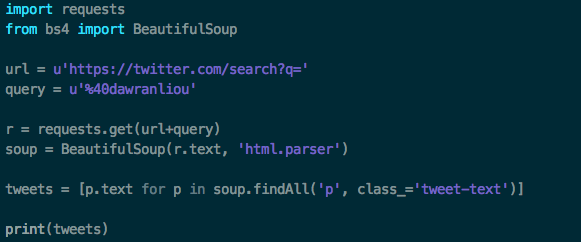

In [37]:
from PIL import Image
view = Image.open("tmmpp/CODE.png")
view

In [ ]:
u'https://twitter.com/search?=%40dhurricane'


https://twitter.com/search?q=%23hurricanne&src=typd


In [ ]:
from bs4 import BeautifulSoup
import requests
url = u'https://twitter.com/search?q='
#query = u'%40drawranliou'

#query = u'@JamesOKeefeIII'
query = u'hurricanne&src=typd'

r = requests.get(url+query)
soup = BeautifulSoup(r.text, 'html.parser')

tweets = [p.text for p in soup.findAll('p', class_='tweet-text')]
txt = (tweets)


for list in txt:
    mytext = "<br />\n".join(list.split("\n\n"))
    print mytext
    

In [77]:
!wget -O TMP.jpg pic.twitter.com/A34m690Tq1

--2017-09-09 11:35:16--  http://pic.twitter.com/A34m690Tq1
Resolving pic.twitter.com (pic.twitter.com)... 104.244.42.67, 104.244.42.195, 104.244.42.131, ...
Connecting to pic.twitter.com (pic.twitter.com)|104.244.42.67|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Cookie coming from pic.twitter.com attempted to set domain to t.co
Location: https://twitter.com/heyyamaezing/status/906354808914882560/photo/1 [following]
--2017-09-09 11:35:17--  https://twitter.com/heyyamaezing/status/906354808914882560/photo/1
Resolving twitter.com (twitter.com)... 104.244.42.65, 104.244.42.129
Connecting to twitter.com (twitter.com)|104.244.42.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 144181 (141K) [text/html]
Saving to: ‘TMP.jpg’

TMP.jpg             100%[===================>] 140.80K   112KB/s    in 1.3s    

2017-09-09 11:35:19 (112 KB/s) - ‘TMP.jpg’ saved [144181/144181]



# retrieve a line by the first word

In [75]:
# retrieve a line by the first word
def get_record(key, datafile):
    '''return line of data file where first "word" matches key'''
    results = None
    with open(datafile) as data:
         for line in data:
            if key == line.split()[0]:
                results = line
                #break
    return results

datafile='data/twit.data'
key = 'Trump'
text = get_record(key, datafile)
print text


Trump said "we should send back the Dreamers,our kids aren't dreaming" Only time I saw him with a kid he said he'd be dating her in 10 yrs!



In [ ]:
I praise the Rescue efforts of the people of Texas & indeed all Americans after the devastation of 
Hurricanne Harvey. Humanity is indeed one!


import BeautifulSoup
help(BeautifulSoup)

In [78]:
import BeautifulSoup as soup

WANTED = 20 #or however many characters you want after 'Figure'
         
with open('data/twitter.data') as searchfile:
    for line in searchfile:
        left,sep,right = line.partition('Tebalo Lacoste')
        if sep: # True iff 'Figure' in line
            tx = soup[(right[:WANTED])].encode("ascii")  
            
            print tx
            

TypeError: 'module' object has no attribute '__getitem__'

In [26]:
import BeautifulSoup

soup[0].encode("ascii")

In [ ]:
class unicode(unicode):
     def __repr__(self):
             return __builtins__.unicode.__repr__(self).lstrip("u")
 
>>> a')
soup[0].encode("ascii")

In [16]:
%%writefile data/twitter.data
[u'Nathaniel J. Hall', u'Katherine Denkinson', u'Deborah Playford', u'Alan Hill', u'PJK', u'THE DOGFATHER\u2122 #MGWV', u'Platonic Love', u'Arlene \U0001f506 #1FIRST', u'Payfar', u'Funny Tweets', u"Couple's", u'Boys Problems', u'What the fun facts', u'FANTASTIC', u'Billionaire Mindset', u'poems web', u'Dynamic', u'rajkumar', u'Hair Style', u'Six-Word-Stories', u'only', u'only2', u'Valencians\u2716\ufe0fTU', u'\u200f\u062c\u0645\u064a\u0640\u0644\u0640\u0640\u06c3 \u2740\u2669\U0001f6ab\U0001f634', u'FranciscoXavier', u'Ronewa_Xsa \U0001f535', u'Mphonini', u'SHASHA \U0001f410\U0001f451', u'Blulovebae', u'TREVOR', u'Uncle James\u2122', u'SocialTrendsKE', u'Treezy Ntsete', u'Mapitsi Seleme', u'i FOLLOW Back \U0001f4aa\U0001f4aa', u'Laz', u'Trapa Promo', u'S\xefph\xebl\xebl\xeb Ngw\xebny\xe4\u2122', u'dEAR_sNEEZY\U0001f531', u'Funny Leone', u'JELtech', u'#FollowTrick VIP 1M', u'\u2764cat\u2764111K\u2764', u'tweecha', u'Selena Gomez', u'Annabel Mizel', u'Ruwayne', u'History to learn', u'MassDangerSubrandom', u'Natt Elisabeth', u'P. Writer', u'Mary Tom', u'We Accept Pets', u'Maria Tureaud', u'Pavel Khristolubov', u'Love the Idea \u2764\ufe0f\ufe0f', u'ItsYoBoyHamza', u'MusicPromo', u'Trillest', u'Positive Quotes', u'cryptoking', u'love impact', u'Rave', u'world travel\u2755', u'artswikipedia', u'That Goat Boy', u"Cause We're sexism\U0001f612", u'Poems Web', u'Artistic Design', u'i am linda', u'SEGURO EXTREMO', u'SavageGamerUK', u'So-Star', u'post paco', u'Sports Videos Daily', u'Kool Guy Muzy\U0001f451', u'Dr. Lord Lizard', u'Magdolina Mugwump', u'FollowTrick RT 9.3K', u'Cindy Tapnio', u'Dear You', u'Adorable outflts', u'Thought', u'Recipe Gifs', u'Itslifethought', u'FUNNY LOVERS', u'Nature is Scary', u'lost In History', u'LIFE QUOTES', u'Shower Thoughts', u'Deepest Thoughts', u'Mind Blowing', u'Food Porn', u"Shawn's follow help", u'Follow Trick Help', u'Yohana Nicodemus 17K', u'Andre Mesnil', u'love words', u'love quotes', u'QUOTES AND SAYING', u'LOve is Life \U0001f535', u'Note Book', u'POOT PUT', u'#CiaJamSessions', u'Softstantial Systems', u'RaVe Distant', u'GartnerGarden', u'shelondonn \u2625\U0001f1f3\U0001f1ec\U0001f1ec\U0001f1e7', u'Join The Empire', u'Pixels', u'Noula', u'help get 10K', u'Yadav Rahul', u'Barrington Mole', u'\u0641\u064a\u0635\u0644 \u0645\u062d\u0645\u062f \u0633\u0627\u0644\u0645', u'Dev Sabharwal', u'Invictus', u'Inovation', u'HeadLeaks', u'Love Unlimited', u'Survivors of SV Ke', u'Quotes and Sayings', u'DORY', u'Quotes and Sayings', u'Bitch Please', u'Thoughts !', u'LearnMsgs', u'Broken Messages', u'Hannah Jacole \U0001f451', u'facts', u'Sassy Moon', u'Sapper Consulting', u'Oliva', u'1Foxy.com', u'Mind Blowing', u'charlotte crumpton', u'FOLLOW HELP', u'\U0001f4a6', u'Justin Bieber', u'Valentin Couhet', u'GerK\u27642.7K', u'PUPPIES\U0001f43e ifb 10.5K', u'\U0001f525MGWVFOLLOWHELP\U0001f525', u'Glorious Pecora', u'BigAl', u'Hadda Gutfull', u'Dr. Lynne De Weaver', u'Frax', u'Ruddra Arnab', u'Nadia Chuks\U0001f339\U0001f339\U0001f339', u'TheSphinx', u'Travis Northrup', u'Learning', u'Did You Know?', u'Prince Thobo Mosiman', u'The Animal Vines', u'Serrah Linares', u'solitary ,', u'realconstancefriday', u"Kevin D O'Gorman", u'NoteBookMsgss', u'Rena Greenberg', u'AestheticClips', u'TYPICAL GIRL', u'Nick Demos', u'Google Facts', u'1Foxy.com Trading', u'1Foxy.com', u'sming7655', u'1Foxy.com', u'Sato F1-2002', u'Chris Briscoe', u'Helen Christian', u'Mesha\U0001f61d\U0001f60e', u'Alisha Smiley A', u'Tattoo Arts', u'Deepest thought', u'Google facts', u'zinsmith', u'FlirtyNotes', u'ricky pointing', u'XLNC Tweets', u'OMG', u'Follow To Gain', u'KimberLite', u'Animal Post\U0001f415', u'S\u15e9\u013f\u15f0\u15e9\u144e \u0124\u15e9SS\u15e9\u144e', u'Preeti Khanna', u'artsmoore', u'MicroArtist', u'ArtZane', u'Destroying clips', u'Ravi Bhalodiya', u'Life facts', u'Mark John Nelson', u'Britney Spears', u'Timothy Buss', u'VidRetal', u'FloridaBarberAcademy', u'LNSL \u223e', u'Bad Beez', u'Eirwalk \u223e LNSL \u223e 71K', u'Philosophy - Coding', u'DebtAssassin\u2122', u'\u2022', u'DavisBarbara', u'Mark and Nancy', u'La Borsa di Martina', u'1Foxy.com Bitcoin \U0001f49b', u'1Foxy.com Trading', u'Arjen van Berkum', u'Dan Hathaway', u'akso noy', u'Shuffle', u'Jon Watwood', u'HC News - Python', u'Jamie Grasso', u'Casey Dwayne', u'Jen MacDonald', u'CjSpidermanGamer', u'Jason Mas', u'Drankzz', u'\u576a\u4e95\u7f8e\u4f73', u'\u5927\u4eba\u6c17ED\u6cbb\u7642\u85ac#\u76f8\u4e92\u30d5\u30a9\u30ed\u30fc', u'\u6d6e\u6c17\u8abf\u67fb\u3000\u6c96\u7e04', u'twitt3r', u'Chris Albon', u'Peter Zaitsev', u'andmoo', u'Project Jupyter', u'nteract', u'Daniel Whitenack', u'Kent English', u'RSA Events', u'Kai W\xe4hner', u'Built with Go', u'Oh My Corgi!', u'Leona Peters', u'chaundreia\U0001f497', u'Javascript Bot', u'CreativeZIN', u'Deborah Lipp', u'Non Fiction Books', u'Perfectly Timed Pics', u'Feeling', u'Nicegirl', u'Crazy Feelings', u'Pixelhead', u'New York Classifieds', u'Dear you', u'HUMAN LIMITS', u'Physics Fun', u'Loraan', u'Rudolf Rox', u'janet watt', u'Daniel J Powley', u'Loto Labs', u'Daily Happiness', u'Satisfying Art', u'EatDrinkTravelDream', u'Tabias Sykes', u'TH1RT3EN', u'The New Science', u'Songbird\u266a', u'gdha', u'Kevin Junior', u'P2P Engagement', u'True News Network', u'Naviga Recruiting', u'MulPlayer', u'Photos Advices', u'Vapemate', u'manifoldco', u'Destroying Clips\u200f', u'Lost in History Love', u'Google Facts', u'Animal vid', u'GiftedBooty\U0001f608', u'Logo Design', u'\U0001f30dGlobal\U0001f310Hidden\U0001f30f', u'Lisa Hull', u'RelationShip', u'GIMP', u"G'MIC", u'Krita Painting App', u'Babington', u'Doflamingo\U0001f608', u'Life Hacks\u2122', u'Crist\xf3bal', u'Saska Jovic', u'Tatted Dopes', u'JaamZIN', u'CBK VIDEOS', u'Shesus Khryst', u'The Meme Stock', u'dre', u'Underbeads', u'Follow help \u26a1\ufe0f', u'Josh\U0001f310', u'Stranged Worlds \U0001f44d\U0001f30d', u'Mike Newkirk', u'Lee Harald Aas', u'MassiFace', u'Bill Swavely', u'Tabitha Naylor', u"Let's Ramble", u'Jonatan Jansson', u'Mike Bittar', u'Heart Broken Message', u'accra foodie', u'N\xc3O SDV, RT NO RT', u'SciState', u'Stella Forster', u'chloo\u2601\ufe0f', u'K.', u'Selorm Romeo \U0001f1ec\U0001f1ed', u'Feeling Fact', u'Ted Kevin', u'Learning', u'Chris : .', u'klaiton noise', u'Feelings \u2661', u'Kunad0!', u'Michael J. Schiemer', u'Quttera', u'\U0001f496Tabitha\U0001f499', u'STUMPY', u'TheGuyWithNoLeftHand', u'Sheridan Leigh', u'Science Newz', u'Ghana_boy\U0001f1ec\U0001f1ed', u'rapseedtv.com', u'Rahul Hussain', u'Admonter Floors', u'BuzzFeed News', u'Mary Ann Mendoza', u'Joseph Goron', u'Scientific American', u'Science News', u'madpoet_one', u'(((Rantz)))', u'(((\u0279oq\u01dd\u0279\u0287s \u0279 \u0254)))', u'Caedmon', u'Estorick Collection', u'ayomide\U0001f451', u'marie \u2661', u'Projeto Follow Trick', u'TrapaDrive\U0001f338', u'Golang I/O', u'Golang News \U0001f4f0', u'Psychology', u'Chasity Sanchez', u'Poppy', u'Dan Lisac', u'irregular LOGIC', u'vivian paul', u'Teressa Terry', u'\u2604The Legend \u2604', u'LeaderGPU GPUaaS', u'\U0001f388\u0639\u0644\u0648\u0634\U0001f3882', u'Sammah', u'\u26a1FOLLOW HELP VIP \u26a1\u200f', u'George Shiber', u'create', u'Finance and Python', u'lily\U0001f525', u'Saving Is Smart.', u'\u0631\u0627\u0626\u0640\u0640\u062f \u2755\u063a\u0640\u0640\u064a\u0640\u0640\u0627\u0628\u2755', u'STARBLAST', u'Clarine Zapf', u'Dope', u'Matt King', u'Maple Learning', u'Steve Francia', u'Drew Pfundstein', u'\u2764\ufe0f\u2130\u2113\u2113\u03b1', u'......\u23f3\u2122', u'Ulf Oldenborg', u'Antonio Cucciniello', u'Vaping Train', u'Harlin Seritt', u'keith hall', u'Emgee Da Squll MG', u'Data Science is Fun', u'Buyburbak SocialNews', u'Syn', u'Remote Python Jobs', u'Web Decorum', u'Raja Jamal', u'Manila Pety', u'Python Eggs', u'KanhaSoft', u'Teddy jerry', u'Stephanie Neal', u'\u30cd\u30c3\u30c8\u30b5\u30fc\u30d5\u30a3\u30f3\u306e\u58fa', u'Awesome Life', u'Sn0wCr45h', u'\u2601 Vamsi Krishna \u2601', u'Jos\xe9 M. Chia', u'Saurabh Chaturvedi', u'CBK Videos \U0001f53asub4sub', u'Ruby Da Cherry $us', u'I love  you  babe', u'GO! Math Videos', u'Mitch', u'Women For Trump!', u'Follow Help | IFB \U0001f4b0', u'Victoria Banuelas', u'robotina', u'Doc Rizwan', u'!drizzilated', u'obadiah ombaba obare', u'Abelo_Rotich', u'Uncasbook', u'John Sonmez', u'PixTeller', u'Maga#Trump#us', u'Gareth Davies', u'John Bitcoin', u'Mark Ramsey Gott', u'SPHA', u'Allure Yoga', u'Julius', u'Tutorias.co', u'Rain Man', u'EyeOf TheLiger Vids', u'Ndaire\u2122', u'A Star Is Born', u'BrujoBlumer\U0001f52f\U0001f52e\U0001f981', u'D.U.K.E\U0001f451', u'Its Voltaic', u'Dr Widad Akreyi', u'Dynasty Den', u'Douglas McGrew', u'Jason', u'Sparrow\U0001f3b6', u'Dr. Amany Alazraq', u'AnywhereInside', u'DreamHustleCode', u'Jerwanda Atkins', u'John Snow Labs', u'Arnaudin J.P', u'Stefan Zimmermann', u'Randy Olson', u'The Franklin Fdn', u'\uff4e\uff55\uff44\uff45', u'Artistic Nudes', u'Bob Kostic', u'follow help\U0001f48e', u'Craig Barr', u'\U0001f451 Laura Tyler \U0001f451', u'Alanis-software', u"Mike's Marketing", u'@Greedy', u'Dog Love Shoppers', u'Dapazit', u'alberto peralta', u'Retweet And Gain', u'YODspica\u2122 Marketing', u'Algorithmia', u'Dr. Ronald R. Capps', u'Leevi', u'CHRIS THRALL', u'Web Platform', u'Cierra Ward', u'DaddyPlugin', u'Action Man', u'World 4 Humanity', u'V-InfoWe', u'Kopano Mosimane', u'Gabrielle Bourbon', u'Oriaje Fatimah', u'Krupesh Patel', u'Timo Aho', u'Mark Raphael', u'Azwidowi', u'LIL DRACO \U0001f5ef', u'make israel great', u'Gabrielle Bourbon', u'Dhjgfkjj Vdgjjnnm', u'Kate Upton', u'Jake W', u'Crissie Vaughan', u'sars!', u'newGood4;1', u'Maureen Samuel', u'\ufffd\ufffd\ufffd', u'Nik Nik Batman', u'\ufffd\ufffd\ufffd', u'\ufffd\ufffd\ufffd', u'\ufffd\ufffd\ufffd', u'\ufffd\ufffd\ufffd', u'XTexplorer', u'Joseph Heath', u'www.kochico.com', u'Lisa The Queen', u'\u041e\u043b\u0435\u0441\u044f \u0417\u0430\u0439\u0446\u0435\u0432\u0430', u'chimp', u'yuta', u'Adaora', u'Smile Quotes', u'TheNuttyPeeler', u'T. Gallowist', u'SamuraBlue\u5168\u529b\u5fdc\u63f4', u'Captain Heck Project', u'@DavidTylerMcKay', u'Movie HD Wallpapers', u'chef', u'Edemode Somina', u'Tijuana Paola', u'Georgina Lester', u'Keep  America  Great', u'Lianne Leigha', u'James Maguire', u'Heine Krog Iversen', u'Rob Tiffany \U0001f1fa\U0001f1f8', u'Mindy Iannelli', u'Better Front Dev', u'Enye Winnifred Uche', u'C0NV3R54710N', u'ProgrammingWorld', u'Nada', u'camila', u'M-btc', u'MAARTSY', u'nat', u'hjarxwolff', u'Ralph sobern', u'\u26a1FOLLOW HELP VIP\u26a1', u'TMDN', u'camila', u'Shortie 4 Real', u'EL JAVI', u'Follow Help', u'FOLLOW  BACK 5K', u'\U0001f193', u'KDalious', u'Tyl3r Asif', u'Br\xf8dy', u'Tiffany Ong', u'Philippines Paradise', u'Young Mar', u'Python Software', u'David Beazley', u'Raymond Hettinger', u'Patryk Szczyg\u0142o', u'Luca Annibale', u'Boudoir Infatuation', u'TrigonomArtryBot', u'BBC News (World)', u'CBS News', u'BBC Breaking News', u'ABC News', u'CNN Breaking News', u'The New York Times', u'Fox News', u'CNN', u'Portainer.io', u'Docker Status', u'Docker', u'Usetrace', u'Obiandu Victoria', u'Jerry Lambert', u'Annie', u'Ekaterina Lebina', u'William Wood', u'idoser', u'Kendra Fitzgerald', u'Nettajetta Bryant', u'PixelBallet', u'Markus Amadeo', u'Lee Weinkauf', u'Ivy Ladder', u'kamlesh butani', u'Laraplywood', u'Mr-E', u'Gravity Sketch', u'Little Minced Lady', u'Sebastiano', u'Nick Parsons \U0001f680', u'AD Fitness Training', u'TheRealAfricanFoodCo', u'webMASTAH.net', u'realDonaldTrump News', u'White House Archived', u'The White House', u'Barack Obama', u'Bill Clinton', u'President Obama', u'President Trump', u'Hillary Clinton', u'Bernie Sanders', u'Bernie Sanders', u'Donald J. Trump', u'Emily Ratajkowski', u'Matthew Lein', u'Patricia Mejia', u'hardmaru', u'Claudia Gadelha', u'No-IP', u'Forbes Lindesay', u'KernelCare', u'rohit \U0001f414', u'Charles Max Wood', u'Jacob Dalrymple', u'TheNetNinja', u'24X7Fe', u'C# Corner', u'Ionic 2 Book', u'Jack Franklin', u'Yeoman', u'npmbot', u'Bower', u'Zepto.js', u'gulp', u'Backbone.js', u'DigitalOcean', u'Google Developers', u'GitHub', u'ionic', u'AngularJS News', u'JavaScript Daily', u'Angular', u'Redis News Feed', u'MongoDB', u'Node.js', u'CreatorsLounge', u'john', u'catch smile', u'php.net', u'PHPUGPH', u'Techiax', u'XenialXerus', u'David Planella', u'Implied Magazine', u'Scott McCarty', u'OpenShift Operations', u'Red Hat OpenShift', u'Gemoutlook #Bags', u'Mikela Willour', u'NetoMeter', u'\u0645\u0635\u0637\u0641\u064a \u0639\u0644\u064a \u0639\u0637\u0627 \u0627\u0644\u0628\u0631\u064a', u'Justhost Support', u'Hannes Dorfmann', u'Mirek Stanek \U0001f916\U0001f4f1', u'Android', u'Android and Me', u'Android Central', u'Android Community', u'Android Developers', u'Englishman in Malta', u'Desco Europe', u'christian Allarde', u'Listas New Garamond', u'New Garamond Madrid', u'Roy Campos', u'Frases de vida', u'DISCOTECAS MADRID', u'MacinCloud.com', u'Skarpline', u'Regular Expression', u'ManKier', u'Jenkins', u'Trello', u'Slack', u'Pluralsight', u'HollyRilingerFitness', u'Daniela Braga', u'BUNNY MEYER', u'Nick75', u'Jason R', u'Roni Hatsroni', u'Glenda J. Cereno', u'Wicked Tweets!', u'Azure Glamours', u'Lanhawk59', u'DGT Consultants', u'Mr Nightmare', u'Clash of Kings', u'Leland Gregory', u"Papa Steve's Bars", u'Dante Petrilla', u'h\xfcseyin karatekin', u'JJ', u'Trevor Lund', u'Jeff', u'Grindin 4 Diamonds', u'Savota 626 976 374', u'Chicken Biscuits', u'Chesco', u'Social Good Life', u'Random History', u'Dominic Riccitello', u'Terrell D. Lewis', u'Me Mail Guide', u'Sh\xf4ko Madrid', u'Social Good Earth', u'Jim Gentile', u'Plastic Bank', u'FLORIDA BABY', u'ORIG3N Inc', u'Trinity Adam', u'Heroo Mann', u'Stephen C. Rose', u'GOAL Retail', u'Shaun Frankson', u'Sunil Vishwakarma', u'John Michel', u'Jon Armstrong', u'Basil Panayi', u'RTtheBEST', u'Johnny Ray', u'CHARISMA MAGIC', u'1IMPACT', u'Kathryn Ssedoga', u'Quotes to Inspire', u'Carthage Buckley', u'Crafts & Digital Art', u'Steve Keating', u'TRAVEL Esquire \u2708\ufe0f', u'Michael Kaplan', u'Fit Mom Diet\u2122', u'stan stewart', u'Jan van Niekerk', u'Eric', u'David Hall', u'bonno van der putten', u'Lolly Daskal', u'johncamacho', u'Cris Queliste', u'Roel Ca\xf1ares Jr.', u'Nick Heynderickx', u'Bryanjpowell', u'Ry\xe4n Stevens', u'Jenny Northrup', u'DonBo', u'Cheryl Dolan Artist', u'Oneironauts', u'WLSolutions', u'Jack Craft Fair', u'LaShawna.Shawna', u'nonikoagouw', u'Nhean Klamman', u'How To Lucid', u'gunter', u'rose catherine', u'tammycassfitzgerald', u'My Info', u'JackNorthrup', u'\u2764\u2764SUSANA\u2764\u2764', u'Dave Dennis', u'Kylie  Marie Lawson', u'MartinStellar', u'HDTVSupply', u'Jos\xe9 Medina', u'Divya Rajput', u'N. Presley', u'Dave', u'vldesigns', u'Scott McPartland', u'Bored Feelings', u'Christopher Atienza', u'countonme', u'Sarcasticat', u'Dixit Baiju', u'Kevin Green', u'Arleen Boyd', u'Aimee Pilz', u'Tampa Comedians', u'Ensoulment', u'SocialChamps', u'james n.northrup sr', u'troy noh', u'K.J. Heritage', u'Caryl Loper', u'Expat Alien', u'Bouba CISSOKO', u'Inspirationfeed.com', u'NowThis', u'George Moen', u'PhilippineMarble', u'Naeem', u'World Travel Buzz', u'Harald Johnsen', u'Colby Shipwash', u'postalsausages', u'Tyga', u'Dream Leaf', u'Precious Bowtique', u'Ariella Carver', u'Varisce Resources', u'Jon Harris', u'Andy', u"What's On 4 Families", u'Mountain Feathers', u'Julia Hagenhofer', u'emir fontanilla', u'Evelyn Ginossi', u'Zynoz', u'Awesome Biz Feed ', u'GrimmusiK Records', u'Rita Barry', u'Promo 4 U', u'Callum  Monks', u'Follow ideas', u'\ubcf4\ub839\uacbd\ucc30', u'Benny S.', u'S.L.I', u'\uc2e0\uc740\uc12d', u'Majuniah', u'Almaz', u'D2GLS', u'Mingus Menzies-Baird', u'pamnorthrupjennings', u'Bastian Hagenhofer', u'The 3 Guys Rant Show', u'\xa9 Danny Ocean', u'SoFabFun', u'tiohenny', u'autumnanderson', u'Ora', u'Beckyy\u2665 [PB]', u'Its Queen Ann \u2654', u'\u2654 Joey \u2654', u'ISH', u'who are you( \u0a6d\u2022\u0348\u03c9\u2022\u0348)', u'Tosha-lee Mathobela', u'Heri Pratama Siregar', u'Cash', u'RingA_LingA', u'Nagual001', u'\xa5KatreeceStyles\xa5', u'sideshow', u'\u2665D.A', u'Rizky Arivandi', u'laila alomar', u'\u0422\u0438\u043c\u043e\u043d', u'DennyC', u'Ivory Smith', u'\u0639\u0645\u0631', u'taliiii x', u'Ozarks Aquatics', u'The LA Promise Fund', u"What's On 4 NE", u'tdperros', u'Ron Rice', u'Gary Loper', u'GripeO', u'Papers Nob Hill', u'mae wener', u'KB Sogn', u'Jessie McKeon', u'Swap-bot News', u'Billy Guest', u'WristWorkerTOYA\u2764', u'David Duane Wilson', u'Kyle McRae', u'Mixtape Walter White', u'Debby Wilder', u'CA_Honduras', u'Judy Adam', u'Andrew Hendrie', u'Graeme Evans', u'muhamadtache', u'Bets of Bitcoin', u'Michel A. Hegi', u'Andi Joe Garcia', u'APM Marketing Group', u'Tweety Tweets', u'MARK MILLION', u'webAssist.ca', u'Your City Office', u'Mercian Castle', u'Alameda Meditation', u'Yuri Mellison', u'LatoyaFlowers', u'The Curable Recipes', u'Salventrex', u'michelle kimber', u'Joe', u'Jason Haglund', u'Andy H', u'Richard Youn', u'Roy Huff \u265b', u'Shawn Upchurch', u'Viewzu', u'Kims Feed', u'Gary Schirr', u'Stephen Cefalo', u'Kaos of Art', u'katie troisi', u'RichardJGalloway', u'K D George', u'Dan Glover', u'ChubbyFunstaa', u'The Koala', u'Shah A Farhad', u'RICK', u'gert', u'Bobby Lee James', u'~ Trude ~', u'Increase Followers', u'UberAds', u'kenectiv', u'Algernon  Fross', u'MACHAVELLI MEDICI', u'Ekenta', u'connor brostek', u'Carolyn Schulz', u'James Day', u'\uff4c\uff45\uff58\uff49', u'Jeep Monkey Designs', u'Anthony Casas, PhD', u'Antonio Kingz', u'Phil MacCracken', u'games online', u'Aim\xe9e Wheaton', u'#ArtPromoter', u'Jake Beckman', u'Danene Hanes', u'Pattie Tierney', u'Emme Boutique', u'Deborah Lee', u'Dr Ramon Macias D MD', u'Bill D', u'David Sandum', u'Heidi Bjork', u'Jeffrey Weber', u'Phoenix Consulting', u'\u2020 \u200f', u'Body Slim Experts', u'Paul Beaulieu', u'Andrew Kelsall', u'yousif', u'Beach N Creations', u'Faces Out', u'Coach John Dundon', u'Racing News', u'GET PAID 2 TWEET', u'no expostfacto', u'PassionFury\u2122', u'sonia daniel', u'jhonny kimo', u'EatClean', u'Drinking & Smoking', u'Shane Walters', u' Online Marketplace', u'andry John Hayes', u'Karine Heyden', u'Health and Fitness', u'Judy Feldhausen', u'DesignSoak\u2122', u'Adult #SprayVitamins', u'Betsy Skibinski', u'Join the Revolution!', u'PONDEKAU\xae', u'Andrea Trovato', u'Ronald Watson', u'Jennifer Petersen', u'DebbyBruck', u'Carol Dunlop', u'Muchomula', u'Richard Field', u'Peter Pan Wine Guy', u'gomaam', u'Otis Conner', u'Walters Web Design', u'Kara Klotz', u'AdnagaMagandA', u'elfri faisal', u'Royal W Johnson', u'Tebalo Lacoste', u'Jaime Laurita', u'Tom C', u'Bruce Attridge', u'RIP', u'James Cruz', u'\u7a32\u57a3\u3086\u3044', u'Avalanna ', u'Team Wicked West', u'Mike Elliott', u'maribel', u'Jessica\u2693Lynn', u'Shak Getem', u'JulieFlorence', u'shaquille miller', u'Luis Ojeda Roa', u'Sue Knapstein', u'\u0b9c\u06e9\u10e6Edward Shim\u10e6\u06e9\u0b9c#\u611b', u"Julius M'jim", u'Han', u'Paolo Di Wankio', u'Matthew Pagan', u'Joey moesley', u'Christmas countdown ', u'M Ub4y Lewandowski', u'\u0112\u0142izabeth', u'.', u'MCC Recording Dave\U0001f60e', u'\u2764TashaEvaSultanova\u2764', u'cadence robinson', u'Finally Free', u'BONITO MS OFICIAL', u'Mimi', u'lachlan brown', u'Michael Wm. Gent', u'Business Advice', u'MJ Gottlieb', u'ENAHS Web Design', u'DARTH FENER', u'188888coach.com', u'\U0001f308M\u03b9\u0455\u0455 Andre\u0442', u'Follow @MissAndret', u'Michele Rempel', u"Caoimhe O'Broin", u"Dove CD's", u'Top Ten Percent', u'omar abdelhalim', u'KP Kelly', u'SM Strategies', u'Aoife Kelly', u'Elena Angelova', u'Rory Mannall', u'Finlay Smith', u'Tracy Baker', u'Sean Malarkey', u'Christian Fea', u'Chit Chat Chicks', u'Brenner Brewing Co.', u'Mike Brenner', u'\u303d\ufe0fari Tha Don.\u2122', u'yahoo abstract', u'George Getson', u'O.G.Mel', u'Jordan Haddock', u' \u266c\u266c\u266c & doobies', u'arman.', u'George Holmes', u'tisha:-)', u'Bertie\u2661', u'\u0646\u0627\u062f\u064a \u0627\u0644\u0628\u0648\u063a\u0627\u0632 (CCDT)', u'TeamToFolllow\u2122', u'Pans-Prints', u'ShoutOut Crew \u272a', u'Cigar Evaluations', u'Klik Blic Sme\u0161ak', u'Gary L. Ammerman', u'Ebrahim', u'David W Fleming', u'BillyBabu', u'Hailey Fox', u'Christina Hendricks', u'Young DiMaggio', u'Computer Guy', u'RED BALLOON', u'Susan Taylor', u'CAQ', u'SocialInStatenIsland', u'Mike G', u'Malosi Corp', u'John Tyler', u'Eddie', u'David Terranova', u'FUNPICS', u'Ax', u'Aree M.', u'sian.', u'haydnnnnn', u'\u2716CHRIS\u2716', u'#VnAmuzik Lily F.', u'Robztrapkween', u'Elena simpson', u'Dana', u"-Enitan\u2122 '69.", u"Adele's Boyfriend \u266b", u'Rofl Studios', u"Shannon O'Halloran", u'Maura', u'caris gray', u'Team Follow Back', u'Erotica Diva', u'Sky Cards', u'T\u042fAPGZUS', u'$in\u03b1tr\u03b1 .', u'JFiallo', u'BIG KESE', u'NATION S.T.C RECORDS', u'Jim McKinnon', u'Saved', u'Ni-TweetBlast.com', u'n0n33d\u2122', u'Joy', u'\u2661 HarrysWeeWee \u2661', u'Sakthi\u2122', u'Brainskenya', u'Micayla Mitchell', u'Karlina', u'Be Prepared to Work!', u'Bettie Kanas', u'Princess \u2654', u'Pablo', u'B\u2744\ufe0f', u'SM\u2728', u'John Brookfield', u'wendy titheradge', u'Gloria Lenge', u'Anchorage Events', u'Freaky Beat', u'Raidernation#1', u'Cuenta', u'Adicto al Cine!', u'Triton_courage', u'liv', u"Gian Carlo D'Uva", u'PARYTAIM M\xe9xico', u'\u20b2\u044f\u0251\u0274\u03ee', u'Londa Manuell', u'alison edwards', u'Araceli Van Dyk', u'Yadira Floor', u'Sitios Argentina !', u'X', u'Danni Southwick \xa9', u'\u2665ELEONORA ISABELLA\u2665', u'\u24de\u24e2\xa9@\xae', u'LUDY_ANGELICA', u'Gigi', u'Isabelle', u'CNews_Center', u'nancy\u2665\u30c4', u'\u266c\u2665\u2606\u2606ROBOTICA\u2606\u2606\u2665\u2605\u2606', u'\u2593\u2592\u2591P\u0414T\u042f!\u20a1!\u0414 Km\u042f \xae\u2591\u2592\u2593', u'#chukisitos carlos', u'MutualFollow', u'Shawty', u'Jason', u'frank olvera', u'Endry', u'Keith Major', u'Sharayah\U0001f61c\U0001f618', u'Magn\xed Kathar\xf3s', u'LABELMEBROKE', u'Smili', u'\u0637\u0641\u0644\u0629', u'Alex Leal', u'Victoria Alton', u'Rob Z', u'Annie Burnside', u'DiamondHeartNetwork', u'Inner Light', u'K. Long', u'Priscilla Wax', u'Life As A Soldier', u'Rania Taha', u'jav', u'Lyne Mor', u'Growing Deep', u'2015 Promo Kingz', u'Amit Dattani', u'Ditte Eriksen', u'Barnet & Enfield', u'Richie Jones', u'Java_King', u'HoWdareUDARE.Dare', u'HipHopTripleX', u'Eagle News', u'Priyamvada Godse', u'Hallie Vogelsang', u'Augustine Neher', u'Expatious', u'Tezcat', u'Wes Lagunas', u'Deth Veruch', u'Shayne Oshiro', u'Delaine Cavanagh', u'Nakita Talavera', u'Clementine Champlin', u'Javier Western', u'mobarokhaq', u'Bill Carson', u'Brother Amartey', u'Etienne Arsenault', u'PacaGames', u'HomeQuestCanada', u'\u0950Isabel\u0950', u'Jinny Elliot', u'Boertjie', u'Charles A. Tijou', u'Marshmallow Booty', u'Karynne Summars', u'Dr. Happiness', u'John Kline', u'Vicky', u'Angela Yon', u'Francelia Belton', u'bevjoneswriting', u'Jason Alan Wilkinson', u'Teresa Cypher', u'JamesFarmer12', u'Kelsorian\u2122', u'Thomas Keister', u'Christine Smith', u'Carol Heppner', u'Angloberry.com', u'Misha Almira', u'Jenny Kushen Sosniak', u'\u2652Tina Ann Graves\u2652', u'drawnbydeni', u'DiCho', u'Richard Collingridge', u'KiniArt', u'Melody Lea Lamb', u'Jill Haglund', u'Debbie', u'Shaeri Richards', u'Israeli Disarmament', u'U.S. Citizen Abroad', u'Beth', u'Meghan Peterson Fenn', u'Alexander Gotay', u'Kelkulus Says Stuff', u'GK', u'Brainwave Architect\u2122', u'Daniel K Foisy', u'Thomas Moon', u'Susan Cosmos', u'ChadRitter', u'Didi Remez', u'Luce Fleury Levi', u'Nicolas Liu', u'Girl Avenger', u'David Bennett', u'Masters of', u'Zeteticus', u'Joel Wiessner', u'PositiveRippleEffect', u'Daniel', u'Goforth Williamson', u'Lauren Frieband', u'RuralHelp', u'yeaokaaayy :*', u'Rhymes with Friends', u'Miss M', u'Joshua Tree', u'Y u u i i \u2640', u'Tara Vanhonacker', u'Sarah Churchill', u'Laurie Hosken, PHR \U0001f4ce', u'james heranda', u'StudyAbroadAlumIntl', u'A_Ronquillo', u'Mahendra Yadav SMM', u"Carey Rose O'Connell", u'Adventures', u'Cleta Duby', u'Dante', u'MY.VA.WORLD', u'Expat Archive Centre', u'Wendy Gamble', u'Hashtag Militia', u'OCEAN EDGE DESIGNS', u'Xavier', u'Azimo', u'Karen Anne Coccioli', u'CarnivalChaser.com', u'Photo Club USA', u'Mingkoy', u'Tanya Madoff', u'MS. BAD ASS!!', u'Life In Andalucia', u'gavi montello', u'Ashley Beaty', u'Wes Beaty', u'South African Mag', u'Donna Amis Davis', u'Lindsay']


Writing data/twitter.data


In [ ]:
%%writefile TwitterPost.py
# Assume you are working with a JPEG
from PIL import Image
from StringIO import StringIO

def postntext(image, text):
    photo = Image.open(image)
    basewidth = 320
    wpercent = (basewidth / float(photo.size[0]))
    height = int((float(photo.size[1]) * float(wpercent)))
    photo = photo.resize((basewidth, height), Image.ANTIALIAS)

    image_io = StringIO.StringIO()
    photo.save(image_io, format='JPEG')
    # If you do not seek(0), the image will be at the end of the file and
    # unable to be read
    image_io.seek(0)

    response = twitter.upload_media(media=image_io)
    twitter.update_status(status=text, media_ids=[response['media_id']])
    
    
postntext(image, text)    

# A Little Bit of WX STUFF

In [1]:
import random
import wx
import wx.lib.scrolledpanel as scrolled
 
########################################################################
class MyForm(wx.Frame):
 
    #----------------------------------------------------------------------
    def __init__(self):
        wx.Frame.__init__(self, None, wx.ID_ANY, "Font Tutorial")
 
        # Add a panel so it looks the correct on all platforms
        panel = scrolled.ScrolledPanel(self)
        panel.SetAutoLayout(1)
        panel.SetupScrolling()
 
        fontSizer = wx.BoxSizer(wx.VERTICAL)
        families = {"FONTFAMILY_DECORATIVE":wx.FONTFAMILY_DECORATIVE, # A decorative font
                    "FONTFAMILY_DEFAULT":wx.FONTFAMILY_DEFAULT,
                    "FONTFAMILY_MODERN":wx.FONTFAMILY_MODERN,     # Usually a fixed pitch font
                    "FONTFAMILY_ROMAN":wx.FONTFAMILY_ROMAN,      # A formal, serif font
                    "FONTFAMILY_SCRIPT":wx.FONTFAMILY_SCRIPT,     # A handwriting font
                    "FONTFAMILY_SWISS":wx.FONTFAMILY_SWISS,      # A sans-serif font
                    "FONTFAMILY_TELETYPE":wx.FONTFAMILY_TELETYPE    # A teletype font
                    }
        weights = {"FONTWEIGHT_BOLD":wx.FONTWEIGHT_BOLD,
                   "FONTWEIGHT_LIGHT":wx.FONTWEIGHT_LIGHT,
                   "FONTWEIGHT_NORMAL":wx.FONTWEIGHT_NORMAL
                   }
 
        styles = {"FONTSTYLE_ITALIC":wx.FONTSTYLE_ITALIC,
                  "FONTSTYLE_NORMAL":wx.FONTSTYLE_NORMAL,
                  "FONTSTYLE_SLANT":wx.FONTSTYLE_SLANT
                  }
        sizes = [8, 10, 12, 14]
        for family in families.keys():
            for weight in weights.keys():
                for style in styles.keys():
                    label = "%s    %s    %s" % (family, weight, style)
                    size = random.choice(sizes)
                    font = wx.Font(size, families[family], styles[style], 
                                   weights[weight])
                    txt = wx.StaticText(panel, label=label)
                    txt.SetFont(font)
                    fontSizer.Add(txt, 0, wx.ALL, 5)
        panel.SetSizer(fontSizer)
        sizer = wx.BoxSizer(wx.HORIZONTAL)
        sizer.Add(panel, 1, wx.EXPAND)
        self.SetSizer(sizer)
 
#----------------------------------------------------------------------
# Run the program
if __name__ == "__main__":
    app = wx.App(False)
    frame = MyForm().Show()
    app.MainLoop()